In [1]:
import os
import numpy as np
import requests
import math
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
%matplotlib inline
import sys
import timeit
import copy

import tensorflow as tf
from tensorflow.keras import layers, Model, backend
from tensorflow.keras import applications
from tensorflow.keras.models import *
from tensorflow.keras.layers import *

import pyQEDA as pq
import sys
sys.path.append("/Users/chenjie/pyQEDA/pyscripts")
import pyQEDA_function_cj as pf
import pyQEDA_potential_CTK as pqp
import normalization_function as nf
import makeUniqueUgVector_cj as mu
import makeUniqueUgVector_3D_cj as mu_3D

In [2]:
# calculate_R function: used to calculate the value of R_factor
def calculate_R(I_exp, I_sim):
    return np.sum(np.abs(I_sim - I_exp)) / np.sum(I_exp)

In [3]:
# divere_Ug_t function: used to diverse the origin Ug or t
def diverse_Ug_t(origin_Ug_t, scale_Ug=0.01, scale_t=0.001):
    '''
    origin_Ug_t: Input
    scale_Ug: the scale used to diverse the Structure factors
    scale_t: the scale used to diverse the Thickness   
    '''
    
    Ug_t_diverse = copy.deepcopy(origin_Ug_t)
    
    if scale_t:
        offset_t = (np.random.random()*2-1)*scale_t
        print('The offset applied on thickness: {}\n'.format(offset_t))
        Ug_t_diverse[-1] += offset_t
        
    if scale_Ug:
        offset_Ug = (np.random.random()*2-1)*scale_Ug
        print('The offset applied on Ug: {}\n'.format(offset_Ug))
        
        for j in range(len(Ug_t_diverse)-1):            
            # for real part of Ug    
            if j%2 == 0:
                # the offset if propotional to the magnitude of the Ug
                Ug_t_diverse[j] += offset_Ug*(Ug_t_diverse[j]**2 + Ug_t_diverse[j+1]**2)
            # for imag part of Ug
            else:
                Ug_t_diverse[j] += offset_Ug*(Ug_t_diverse[j-1]**2 + Ug_t_diverse[j]**2)
    
    return Ug_t_diverse    

-------------------------------------------------------------------------------------------------------------------

# I. Load Data

1. random datasets

(-0.004313936919003426-0.08105081835580841j)  real: -0.004313936919003426  imag: -0.08105081835580841
5


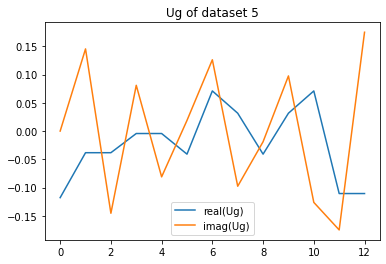

In [4]:
# load the structure vector Ug:
name = "SrTiO3_001_Th300A_T100mrad_r12_maxg_0_3_120kV"
File = "SrTiO3_001_Th300A_T100mrad_r12_maxg_0_3_120kV"
Nx = 83
t = 0.3     # 0.5*1000 = 500Am
save_name = "SiTrO3_02"

Ug_origin = np.loadtxt("/Users/chenjie/pyQEDA/training_Data/My_labels_" + name + ".csv", dtype=complex) 

dataset = 5
print(Ug_origin[dataset,4],' real:',np.real(Ug_origin[dataset,4]),' imag:',np.imag(Ug_origin[dataset,4]))
re = np.real(Ug_origin[dataset,:])
im = np.imag(Ug_origin[dataset,:])

plt.plot(re,label='real(Ug)')
plt.plot(im,label='imag(Ug)')
plt.legend()
plt.title('Ug of dataset '+str(dataset))
np.imag(Ug_origin[dataset,:])-np.imag(Ug_origin[dataset+1,:])
print(dataset)

thickness of dataset 5: 653.0


Text(0.5, 1.0, 'thickness')

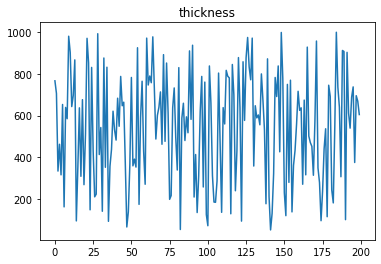

In [5]:
# load the thickness t:
t = np.loadtxt("/Users/chenjie/pyQEDA/training_Data/My_thickness_" + name + ".csv", dtype=float) 
print('thickness of dataset '+str(dataset)+':', t[dataset])
plt.plot(t)
plt.title('thickness')

shape of the diffraction pattern:  (6889,)
X.max()=  0.9994277338584909


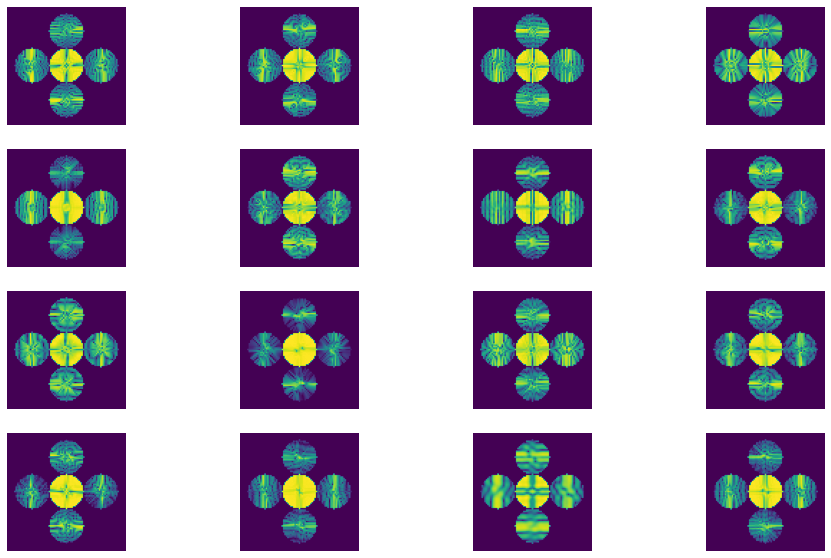

In [6]:
# load the diffraction Pattern X:
X = np.loadtxt("/Users/chenjie/pyQEDA/training_Data/random_diffs_" + name + ".csv", dtype=float) 
print('shape of the diffraction pattern: ', X[dataset].shape)

# reshape the Pixels Array(for that they were saved as flatten array):
X = X.reshape(len(X),Nx,Nx,1)

def nlogf(x):
    return np.log(1+1000*x)
nlog = np.vectorize(nlogf)

nlogf_X = nlogf(X)

# plot first few Diffraction Pattern:
Ncol = 4
Nrow = 4
fig,ax=plt.subplots(Nrow,Ncol,figsize=(16,10))
for j in range(Ncol*Nrow):
    plt.subplot(Nrow,Ncol,j+1)
    plt.imshow(nlogf_X[j])
    plt.axis('off')
    
print("X.max()= ", X.max())

2. Data processing:

In [7]:
makeUniqueUgVector = True
beam1, beam2 = 4, 5

In [8]:
if makeUniqueUgVector == True:
    Ug_unique = []
    for i in range(len(Ug_origin)):
        print('>>> processing the {}. Ug set...'.format(i))
        UgUnique, r0 = mu.makeUniqueUgVector(Ug_origin[i],beam1,beam2,phase1=0,phase2=0,file=File)
        Ug_unique = np.append(Ug_unique, UgUnique)
        
    Ug_unique = Ug_unique.reshape(Ug_origin.shape)

>>> processing the 0. Ug set...
Applied shift of unit cell origin (fractional coordinates): -0.3272624271122794 -0.0881678719622661
Ug[ 0 ]: 0.07172 0.0  =>  0.07172 0.0
Ug[ 1 ]: 0.10329 1.15433  =>  0.10329 0.60035
Ug[ 2 ]: 0.10329 -1.15433  =>  0.10329 -0.60035
Ug[ 3 ]: 0.11498 2.05625  =>  0.11498 -0.0
Ug[ 4 ]: 0.11498 -2.05625  =>  0.11498 0.0
Ug[ 5 ]: 0.09259 -1.10795  =>  0.09259 0.0
Ug[ 6 ]: 0.03172 -3.05522  =>  0.03172 1.72569
Ug[ 7 ]: 0.08013 2.4275  =>  0.08013 -1.24546
Ug[ 8 ]: 0.09259 1.10795  =>  0.09259 0.0
Ug[ 9 ]: 0.08013 -2.4275  =>  0.08013 1.24546
Ug[ 10 ]: 0.03172 3.05522  =>  0.03172 -1.72569
Ug[ 11 ]: 0.13242 1.33361  =>  0.13242 -0.83707
Ug[ 12 ]: 0.13242 -1.33361  =>  0.13242 0.83707
>>> processing the 1. Ug set...
Applied shift of unit cell origin (fractional coordinates): -0.16088084992037002 -0.054569160187620695
Ug[ 0 ]: 0.16368 0.0  =>  0.16368 0.0
Ug[ 1 ]: 0.08962 0.41505  =>  0.08962 0.07218
Ug[ 2 ]: 0.08962 -0.41505  =>  0.08962 -0.07218
Ug[ 3 ]: 0.0927

Ug[ 10 ]: 0.05998 0.5684  =>  0.05998 0.44379
Ug[ 11 ]: 0.08806 1.96587  =>  0.08806 -0.68272
Ug[ 12 ]: 0.08806 -1.96587  =>  0.08806 0.68272
>>> processing the 18. Ug set...
Applied shift of unit cell origin (fractional coordinates): 0.3406199645992927 -0.2296225115875975
Ug[ 0 ]: 0.14234 3.14159  =>  0.14234 3.14159
Ug[ 1 ]: 0.14297 2.55813  =>  0.14297 1.11537
Ug[ 2 ]: 0.14297 -2.55813  =>  0.14297 -1.11537
Ug[ 3 ]: 0.13174 -2.14018  =>  0.13174 -0.0
Ug[ 4 ]: 0.13174 2.14018  =>  0.13174 0.0
Ug[ 5 ]: 0.02229 -2.88552  =>  0.02229 -0.0
Ug[ 6 ]: 0.08076 2.7322  =>  0.08076 0.03196
Ug[ 7 ]: 0.16787 -2.33433  =>  0.16787 -3.03174
Ug[ 8 ]: 0.02229 2.88552  =>  0.02229 0.0
Ug[ 9 ]: 0.16787 2.33433  =>  0.16787 3.03174
Ug[ 10 ]: 0.08076 -2.7322  =>  0.08076 -0.03196
Ug[ 11 ]: 0.07286 -1.7443  =>  0.07286 0.25853
Ug[ 12 ]: 0.07286 1.7443  =>  0.07286 -0.25853
>>> processing the 19. Ug set...
Applied shift of unit cell origin (fractional coordinates): -0.1350888144176811 -0.07145643213261454

Ug[ 3 ]: 0.15125 -0.59207  =>  0.15125 0.0
Ug[ 4 ]: 0.15125 0.59207  =>  0.15125 0.0
Ug[ 5 ]: 0.11827 -0.86339  =>  0.11827 0.0
Ug[ 6 ]: 0.10242 2.93651  =>  0.10242 -2.32291
Ug[ 7 ]: 0.20239 0.6992  =>  0.20239 0.53882
Ug[ 8 ]: 0.11827 0.86339  =>  0.11827 0.0
Ug[ 9 ]: 0.20239 -0.6992  =>  0.20239 -0.53882
Ug[ 10 ]: 0.10242 -2.93651  =>  0.10242 2.32291
Ug[ 11 ]: 0.1138 0.52392  =>  0.1138 -0.66022
Ug[ 12 ]: 0.1138 -0.52392  =>  0.1138 0.66022
>>> processing the 37. Ug set...
Applied shift of unit cell origin (fractional coordinates): -0.09194513987395768 -0.18570126590300634
Ug[ 0 ]: 0.1624 3.14159  =>  0.1624 3.14159
Ug[ 1 ]: 0.0307 2.56704  =>  0.0307 1.40024
Ug[ 2 ]: 0.0307 -2.56704  =>  0.0307 -1.40024
Ug[ 3 ]: 0.11867 0.57771  =>  0.11867 -0.0
Ug[ 4 ]: 0.11867 -0.57771  =>  0.11867 0.0
Ug[ 5 ]: 0.10459 -2.33359  =>  0.10459 0.0
Ug[ 6 ]: 0.01748 -2.50452  =>  0.01748 -1.91544
Ug[ 7 ]: 0.1446 -1.57594  =>  0.1446 0.16857
Ug[ 8 ]: 0.10459 2.33359  =>  0.10459 0.0
Ug[ 9 ]: 0.1446 1.

Applied shift of unit cell origin (fractional coordinates): 0.16236393671770563 -0.17763654074333965
Ug[ 0 ]: 0.03796 0.0  =>  0.03796 0.0
Ug[ 1 ]: 0.1145 1.57779  =>  0.1145 0.46167
Ug[ 2 ]: 0.1145 -1.57779  =>  0.1145 -0.46167
Ug[ 3 ]: 0.19686 -1.02016  =>  0.19686 -0.0
Ug[ 4 ]: 0.19686 1.02016  =>  0.19686 0.0
Ug[ 5 ]: 0.10839 -2.23225  =>  0.10839 -0.0
Ug[ 6 ]: 0.04789 -0.42836  =>  0.04789 1.70792
Ug[ 7 ]: 0.19935 0.94904  =>  0.19935 1.045
Ug[ 8 ]: 0.10839 2.23225  =>  0.10839 0.0
Ug[ 9 ]: 0.19935 -0.94904  =>  0.19935 -1.045
Ug[ 10 ]: 0.04789 0.42836  =>  0.04789 -1.70792
Ug[ 11 ]: 0.02612 0.75084  =>  0.02612 -1.28948
Ug[ 12 ]: 0.02612 -0.75084  =>  0.02612 1.28948
>>> processing the 57. Ug set...
Applied shift of unit cell origin (fractional coordinates): -0.46063215425664283 0.17620159992887663
Ug[ 0 ]: 0.12066 3.14159  =>  0.12066 3.14159
Ug[ 1 ]: 0.13436 -1.54938  =>  0.13436 -0.44227
Ug[ 2 ]: 0.13436 1.54938  =>  0.13436 0.44227
Ug[ 3 ]: 0.0654 2.89424  =>  0.0654 -0.0
Ug[

Ug[ 3 ]: 0.0748 -2.2739  =>  0.0748 -0.0
Ug[ 4 ]: 0.0748 2.2739  =>  0.0748 0.0
Ug[ 5 ]: 0.06693 -0.45503  =>  0.06693 0.0
Ug[ 6 ]: 0.16896 2.72004  =>  0.16896 -1.06173
Ug[ 7 ]: 0.20533 -2.17009  =>  0.20533 2.0667
Ug[ 8 ]: 0.06693 0.45503  =>  0.06693 -0.0
Ug[ 9 ]: 0.20533 2.17009  =>  0.20533 -2.0667
Ug[ 10 ]: 0.16896 -2.72004  =>  0.16896 1.06173
Ug[ 11 ]: 0.04996 1.36012  =>  0.04996 3.09549
Ug[ 12 ]: 0.04996 -1.36012  =>  0.04996 -3.09549
>>> processing the 74. Ug set...
Applied shift of unit cell origin (fractional coordinates): 0.436103572800984 0.1349611958149925
Ug[ 0 ]: 0.03798 0.0  =>  0.03798 0.0
Ug[ 1 ]: 0.05477 2.65931  =>  0.05477 -2.77589
Ug[ 2 ]: 0.05477 -2.65931  =>  0.05477 2.77589
Ug[ 3 ]: 0.08841 -2.74012  =>  0.08841 -0.0
Ug[ 4 ]: 0.08841 2.74012  =>  0.08841 0.0
Ug[ 5 ]: 0.06501 1.69597  =>  0.06501 0.0
Ug[ 6 ]: 0.09584 -2.17213  =>  0.09584 -0.28
Ug[ 7 ]: 0.11511 -3.01172  =>  0.11511 -0.31664
Ug[ 8 ]: 0.06501 -1.69597  =>  0.06501 0.0
Ug[ 9 ]: 0.11511 3.01172 

Ug[ 5 ]: 0.14806 1.83908  =>  0.14806 0.0
Ug[ 6 ]: 0.1049 1.30866  =>  0.1049 -2.82445
Ug[ 7 ]: 0.17323 1.80625  =>  0.17323 -2.18291
Ug[ 8 ]: 0.14806 -1.83908  =>  0.14806 -0.0
Ug[ 9 ]: 0.17323 -1.80625  =>  0.17323 2.18291
Ug[ 10 ]: 0.1049 -1.30866  =>  0.1049 2.82445
Ug[ 11 ]: 0.13956 1.05212  =>  0.13956 1.19607
Ug[ 12 ]: 0.13956 -1.05212  =>  0.13956 -1.19607
>>> processing the 97. Ug set...
Applied shift of unit cell origin (fractional coordinates): -0.49245113800863116 -0.06079941946191031
Ug[ 0 ]: 0.16004 3.14159  =>  0.16004 3.14159
Ug[ 1 ]: 0.05739 0.79507  =>  0.05739 0.41305
Ug[ 2 ]: 0.05739 -0.79507  =>  0.05739 -0.41305
Ug[ 3 ]: 0.09168 3.09416  =>  0.09168 -0.0
Ug[ 4 ]: 0.09168 -3.09416  =>  0.09168 0.0
Ug[ 5 ]: 0.07 -0.76403  =>  0.07 0.0
Ug[ 6 ]: 0.18108 0.9005  =>  0.18108 -1.81165
Ug[ 7 ]: 0.073 -1.99341  =>  0.073 1.48277
Ug[ 8 ]: 0.07 0.76403  =>  0.07 0.0
Ug[ 9 ]: 0.073 1.99341  =>  0.073 -1.48277
Ug[ 10 ]: 0.18108 -0.9005  =>  0.18108 1.81165
Ug[ 11 ]: 0.08536 -0

Ug[ 1 ]: 0.03295 2.51322  =>  0.03295 2.49978
Ug[ 2 ]: 0.03295 -2.51322  =>  0.03295 -2.49978
Ug[ 3 ]: 0.06338 0.23982  =>  0.06338 -0.0
Ug[ 4 ]: 0.06338 -0.23982  =>  0.06338 0.0
Ug[ 5 ]: 0.00804 -0.02687  =>  0.00804 0.0
Ug[ 6 ]: 0.0777 -0.89312  =>  0.0777 -1.11951
Ug[ 7 ]: 0.09011 1.48692  =>  0.09011 1.74018
Ug[ 8 ]: 0.00804 0.02687  =>  0.00804 -0.0
Ug[ 9 ]: 0.09011 -1.48692  =>  0.09011 -1.74018
Ug[ 10 ]: 0.0777 0.89312  =>  0.0777 1.11951
Ug[ 11 ]: 0.02504 -2.62391  =>  0.02504 -2.14427
Ug[ 12 ]: 0.02504 2.62391  =>  0.02504 2.14427
>>> processing the 118. Ug set...
Applied shift of unit cell origin (fractional coordinates): -0.15443212989718424 0.08323306095372962
Ug[ 0 ]: 0.07602 0.0  =>  0.07602 0.0
Ug[ 1 ]: 0.13218 -0.12693  =>  0.13218 0.39604
Ug[ 2 ]: 0.13218 0.12693  =>  0.13218 -0.39604
Ug[ 3 ]: 0.05906 0.97033  =>  0.05906 0.0
Ug[ 4 ]: 0.05906 -0.97033  =>  0.05906 0.0
Ug[ 5 ]: 0.03102 1.04594  =>  0.03102 0.0
Ug[ 6 ]: 0.07947 2.43869  =>  0.07947 0.9454
Ug[ 7 ]: 0.086

>>> processing the 134. Ug set...
Applied shift of unit cell origin (fractional coordinates): 0.4119125330545942 0.13225208563175905
Ug[ 0 ]: 0.09955 0.0  =>  0.09955 0.0
Ug[ 1 ]: 0.03876 -2.63892  =>  0.03876 -1.80796
Ug[ 2 ]: 0.03876 2.63892  =>  0.03876 1.80796
Ug[ 3 ]: 0.07035 -2.58812  =>  0.07035 0.0
Ug[ 4 ]: 0.07035 2.58812  =>  0.07035 -0.0
Ug[ 5 ]: 0.07257 1.66193  =>  0.07257 -0.0
Ug[ 6 ]: 0.09509 -2.96259  =>  0.09509 -1.20543
Ug[ 7 ]: 0.08478 -1.23597  =>  0.08478 1.62813
Ug[ 8 ]: 0.07257 -1.66193  =>  0.07257 0.0
Ug[ 9 ]: 0.08478 1.23597  =>  0.08478 -1.62813
Ug[ 10 ]: 0.09509 2.96259  =>  0.09509 1.20543
Ug[ 11 ]: 0.13239 -2.72873  =>  0.13239 -1.62179
Ug[ 12 ]: 0.13239 2.72873  =>  0.13239 1.62179
>>> processing the 135. Ug set...
Applied shift of unit cell origin (fractional coordinates): -0.3157305803966231 -0.0863733327656212
Ug[ 0 ]: 0.09498 3.14159  =>  0.09498 3.14159
Ug[ 1 ]: 0.13619 -0.56765  =>  0.13619 -1.11035
Ug[ 2 ]: 0.13619 0.56765  =>  0.13619 1.11035
Ug[ 

Applied shift of unit cell origin (fractional coordinates): 0.14140928865146649 -0.18224823330096201
Ug[ 0 ]: 0.03288 3.14159  =>  0.03288 3.14159
Ug[ 1 ]: 0.1141 2.3939  =>  0.1141 1.2488
Ug[ 2 ]: 0.1141 -2.3939  =>  0.1141 -1.2488
Ug[ 3 ]: 0.1377 -0.8885  =>  0.1377 0.0
Ug[ 4 ]: 0.1377 0.8885  =>  0.1377 0.0
Ug[ 5 ]: 0.03532 -2.2902  =>  0.03532 0.0
Ug[ 6 ]: 0.08945 -0.16823  =>  0.08945 1.86537
Ug[ 7 ]: 0.16909 3.05338  =>  0.16909 -2.97321
Ug[ 8 ]: 0.03532 2.2902  =>  0.03532 -0.0
Ug[ 9 ]: 0.16909 -3.05338  =>  0.16909 2.97321
Ug[ 10 ]: 0.08945 0.16823  =>  0.08945 -1.86537
Ug[ 11 ]: 0.10768 -1.15902  =>  0.10768 -2.93602
Ug[ 12 ]: 0.10768 1.15902  =>  0.10768 2.93602
>>> processing the 156. Ug set...
Applied shift of unit cell origin (fractional coordinates): -0.22044688732340906 -0.05996274490367849
Ug[ 0 ]: 0.18682 0.0  =>  0.18682 0.0
Ug[ 1 ]: 0.10368 -1.06605  =>  0.10368 -1.44281
Ug[ 2 ]: 0.10368 1.06605  =>  0.10368 1.44281
Ug[ 3 ]: 0.12207 1.38511  =>  0.12207 0.0
Ug[ 4 ]: 

Applied shift of unit cell origin (fractional coordinates): -0.2449397477138323 -0.13644532076929294
Ug[ 0 ]: 0.09841 3.14159  =>  0.09841 3.14159
Ug[ 1 ]: 0.04777 2.91257  =>  0.04777 2.05526
Ug[ 2 ]: 0.04777 -2.91257  =>  0.04777 -2.05526
Ug[ 3 ]: 0.08554 1.539  =>  0.08554 -0.0
Ug[ 4 ]: 0.08554 -1.539  =>  0.08554 0.0
Ug[ 5 ]: 0.08544 -1.71462  =>  0.08544 -0.0
Ug[ 6 ]: 0.19221 0.91678  =>  0.19221 0.23509
Ug[ 7 ]: 0.22069 2.16908  =>  0.22069 -1.71779
Ug[ 8 ]: 0.08544 1.71462  =>  0.08544 0.0
Ug[ 9 ]: 0.22069 -2.16908  =>  0.22069 1.71779
Ug[ 10 ]: 0.19221 -0.91678  =>  0.19221 -0.23509
Ug[ 11 ]: 0.12991 1.46958  =>  0.12991 -1.7356
Ug[ 12 ]: 0.12991 -1.46958  =>  0.12991 1.7356
>>> processing the 179. Ug set...
Applied shift of unit cell origin (fractional coordinates): -0.09280825842347729 0.03515367025226227
Ug[ 0 ]: 0.07649 3.14159  =>  0.07649 3.14159
Ug[ 1 ]: 0.04807 -2.63422  =>  0.04807 -2.41334
Ug[ 2 ]: 0.04807 2.63422  =>  0.04807 2.41334
Ug[ 3 ]: 0.11552 0.58313  =>  0.1

Ug[ 6 ]: 0.06758 -0.24044  =>  0.06758 1.99105
Ug[ 7 ]: 0.04672 2.54611  =>  0.04672 2.31777
Ug[ 8 ]: 0.09309 2.00316  =>  0.09309 0.0
Ug[ 9 ]: 0.04672 -2.54611  =>  0.04672 -2.31777
Ug[ 10 ]: 0.06758 0.24044  =>  0.06758 -1.99105
Ug[ 11 ]: 0.11211 -2.71583  =>  0.11211 1.10752
Ug[ 12 ]: 0.11211 2.71583  =>  0.11211 -1.10752
>>> processing the 190. Ug set...
Applied shift of unit cell origin (fractional coordinates): -0.41785404496542905 0.05149339702280189
Ug[ 0 ]: 0.10223 0.0  =>  0.10223 0.0
Ug[ 1 ]: 0.12231 -0.38345  =>  0.12231 -0.05991
Ug[ 2 ]: 0.12231 0.38345  =>  0.12231 0.05991
Ug[ 3 ]: 0.07209 2.62545  =>  0.07209 -0.0
Ug[ 4 ]: 0.07209 -2.62545  =>  0.07209 0.0
Ug[ 5 ]: 0.13909 0.64709  =>  0.13909 0.0
Ug[ 6 ]: 0.14525 2.64548  =>  0.14525 -0.30352
Ug[ 7 ]: 0.12558 -2.88808  =>  0.12558 -0.58617
Ug[ 8 ]: 0.13909 -0.64709  =>  0.13909 0.0
Ug[ 9 ]: 0.12558 2.88808  =>  0.12558 0.58617
Ug[ 10 ]: 0.14525 -2.64548  =>  0.14525 0.30352
Ug[ 11 ]: 0.09604 2.59599  =>  0.09604 1.56371

shape of Ug_2real: (200, 13, 2)


Text(0.5, 1.0, 'first 2 sets of imag.parts of the Ug')

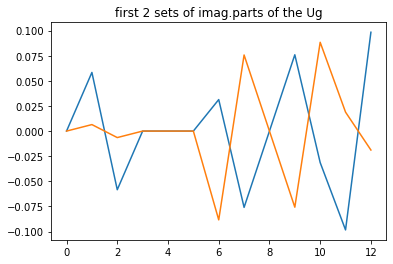

In [9]:
# convert complex Ug to real
if makeUniqueUgVector == True:
    Ug = Ug_unique
else:
    Ug = Ug_origin

Ug_2real =[]
for i in range(0,len(Ug)):
    Ug_2real.append(np.concatenate((np.array(Ug[i].real,ndmin=2).T, np.array(Ug[i].imag,ndmin=2).T),axis=1))    
Ug_2real = np.asarray(Ug_2real)

numUg = Ug_2real.shape[1]
print('shape of Ug_2real:', Ug_2real.shape)

# Plot the first 2 sets of imaginary parts of the structure factors:
plt.plot(Ug_2real[0,:,1])
plt.plot(Ug_2real[1,:,1])
plt.title('first 2 sets of imag.parts of the Ug')

shape of Ug_2real: (200, 26)


Text(0.5, 1.0, 'Ug of dataset 5')

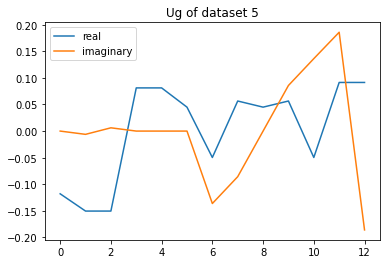

In [10]:
# combine real and imaginary numbers into one row:
# This interlaces real and imaginary numbers. 
Ug_2real = Ug_2real.reshape(-1,2*numUg)
print('shape of Ug_2real:',Ug_2real.shape)

plt.plot(Ug_2real[dataset,0:2*numUg:2],label='real')
plt.plot(Ug_2real[dataset,1:2*numUg:2],label='imaginary')
plt.legend()
plt.title('Ug of dataset '+str(dataset))

In [11]:
# normalize the thickness
t = t.astype('float32')
t = t/1000
t = t.reshape(len(t),1)

print('thickness of dataset' +str(dataset) + ':', t[dataset])

thickness of dataset5: [0.653]


In [12]:
# join Ug and t into Output(Y):
Y = np.append(Ug_2real,t,axis=1)
print('Dataset size: \n Input X:',X.shape,'Output Y:',Y.shape)

Dataset size: 
 Input X: (200, 83, 83, 1) Output Y: (200, 27)


3. define the size of training set and testing set:

In [13]:
trainsize = 100
testsize = 40
X_train = nlogf_X[:trainsize,]
X_test = nlogf_X[trainsize:trainsize+testsize,]
Y_train = Y[:trainsize,]
Y_test = Y[trainsize:trainsize+testsize,]

4. load the experimental Data:

the shape of the experimental pattern:  (1, 83, 83, 1)
0.9999992678790788


Text(0.5, 1.0, 'experimental Pattern')

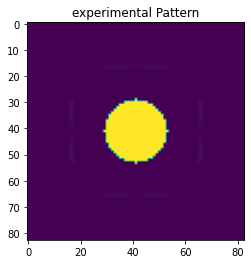

In [14]:
X_exp = np.loadtxt("/Users/chenjie/pyQEDA/training_Data/diff_pattern_" + name + ".csv", dtype=float) 
X_exp = X_exp.reshape(1,Nx,Nx,1)
print('the shape of the experimental pattern: ',X_exp.shape)
print(X_exp.max())

nlogf_X_exp = nlogf(X_exp)
plt.imshow(nlogf_X_exp[0])
plt.title('experimental Pattern')

---------------------------------------------------------------------------------------------------------------

# II. Build the neural network

In [15]:
backend.clear_session()

num_of_features = 2*numUg+1

# invert the Input to the form which can be used in the ResNet50 Model
target_size = X_train.shape[1:3]
input_size = (*target_size, 3)

# insert ResNet50 Model
base_model = applications.ResNet50(include_top=False, weights='imagenet', input_shape=input_size)  

# combine the ResNet50 model with my model
x = Flatten()(base_model.output)
x = Dense(num_of_features*16, activation='tanh')(x)
x = Dense(num_of_features*4, activation='tanh')(x)
x = Dense(num_of_features, activation='tanh')(x)
x = Dense(num_of_features, activation='tanh')(x)
model = Model(inputs=base_model.input, outputs=x)

# remove the output layer and replaced it with the regression output layer we want in ResNet50
# keep the weights of the first 49 layers of the ResNet50 model unchanged during the training process 
for layer in base_model.layers[:-1]:
    layer.trainable = False

model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 83, 83, 3)]  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 89, 89, 3)    0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 42, 42, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 42, 42, 64)   256         conv1_conv[0][0]                 
______________________________________________________________________________________________

In [16]:
opt = tf.keras.optimizers.Adam(lr=0.001) 
model.compile(loss='mse', optimizer=opt, metrics=['mae','acc'])

#save the model
model.save(name + ".h5")

_____________________________________________________________________________________________________________

# III. Initial Training

initial training to have a check:
1) check the performance of this NN to ensure that the training loss is decreasing gradually;

2) check the simulation pattern of the predicted Ug and the one of unique predicted Ug to ensure they are same

Epoch 1/20
5/5 [==============================] - 7s 903ms/step - loss: 0.3008 - mean_absolute_error: 0.4719 - acc: 0.1700 - val_loss: 0.2242 - val_mean_absolute_error: 0.4040 - val_acc: 0.0000e+00
Epoch 2/20
5/5 [==============================] - 2s 533ms/step - loss: 0.1876 - mean_absolute_error: 0.3548 - acc: 0.7000 - val_loss: 0.1325 - val_mean_absolute_error: 0.2912 - val_acc: 0.9000
Epoch 3/20
5/5 [==============================] - 2s 531ms/step - loss: 0.1198 - mean_absolute_error: 0.2685 - acc: 0.9200 - val_loss: 0.0970 - val_mean_absolute_error: 0.2340 - val_acc: 0.9000
Epoch 4/20
5/5 [==============================] - 3s 541ms/step - loss: 0.0862 - mean_absolute_error: 0.2154 - acc: 0.8800 - val_loss: 0.0593 - val_mean_absolute_error: 0.1695 - val_acc: 0.9000
Epoch 5/20
5/5 [==============================] - 3s 599ms/step - loss: 0.0491 - mean_absolute_error: 0.1551 - acc: 0.9200 - val_loss: 0.0341 - val_mean_absolute_error: 0.1365 - val_acc: 0.9000
Epoch 6/20
5/5 [==========

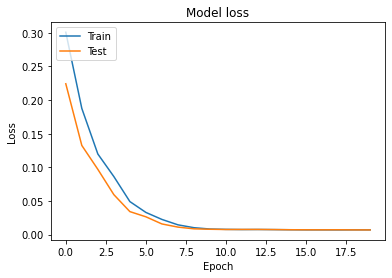

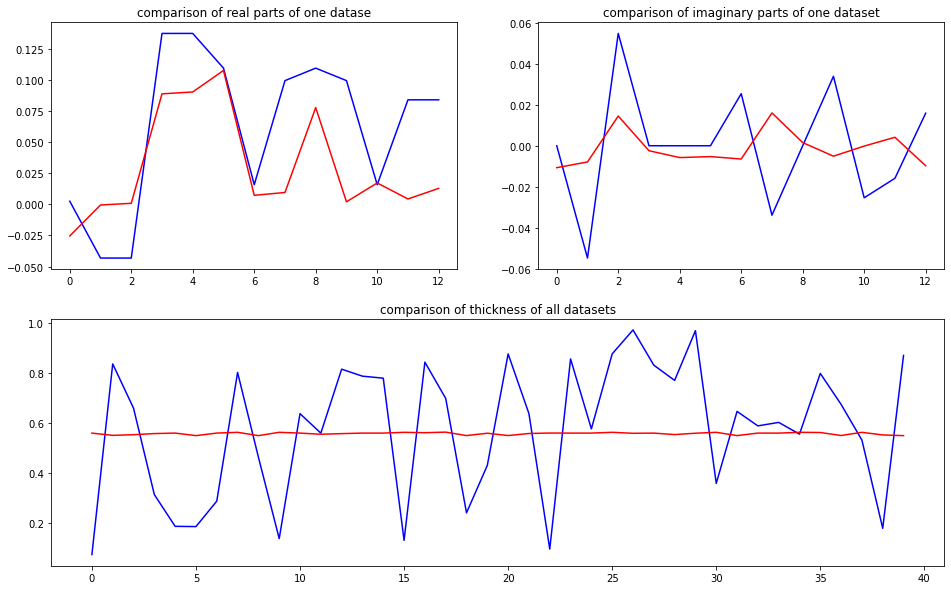

predicted thickness: 0.5620499


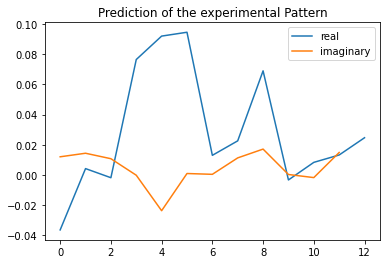

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T100mrad_r12_maxg_0_3_120kV/SrTiO3_001_Th300A_T100mrad_r12_maxg_0_3_120kV/SrTiO3_001_Th300A_T100mrad_r12_maxg_0_3_120kV.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.957
tilt range (mrads) = 		100.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=562.049925327301
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg, zone = [0.0, 0.0, 1.0]



All patterns together contain 13 different beams

InputUg:
[-0.03653448+0.j          0.00112322+0.00181446j  0.00112322-0.00181446j
  0.084285

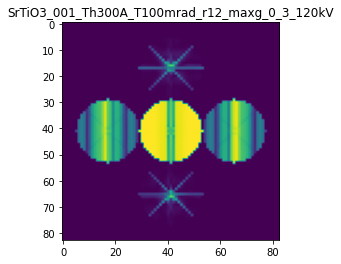

X_sim1.max():  0.9927424996585361
nlogf_X_sim1.max():  6.9014781184266365
Time:  67.145591172


In [17]:
start = timeit.default_timer()

# load and compile the model
model = load_model(name + ".h5")


# invert the 1 channel image Array to 3 Channel, to use ResNet50
X_train_3C = np.concatenate((X_train,X_train,X_train),axis=3) #same value for every channel
X_test_3C = np.concatenate((X_test,X_test,X_test),axis=3)

# train the model
model.fit(X_train_3C, Y_train, validation_data=(X_test_3C, Y_test), batch_size=20, epochs=20)

# plot the model loss
plt.plot(model.history.history['loss'])
plt.plot(model.history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()
plt.close()
    

# Prediction of the testing set
Y_test_pred = model.predict(X_test_3C)    
Ug_test_pred_complex = Y_test_pred[:,:2*numUg].reshape(-1,numUg,2)
Ug_test_complex = Y_test[:,:2*numUg].reshape(-1,numUg,2)    
t_test_pred = Y_test_pred[:,2*numUg]
t_test = Y_test[:,2*numUg]
    
# plot the comparison of imaginary parts, real parts and thickness
gs = gridspec.GridSpec(2, 2)
fig = plt.figure(figsize=(16,10))
    
ax1 = fig.add_subplot(gs[0, 0]) 
ax1.plot(Ug_test_complex[2,:,0],'b')
ax1.plot(Ug_test_pred_complex[2,:,0],'r')
ax1.set_title('comparison of real parts of one datase')
    
ax2 = fig.add_subplot(gs[0, 1]) 
ax2.plot(Ug_test_complex[2,:,1],'b')
ax2.plot(Ug_test_pred_complex[2,:,1],'r')
ax2.set_title('comparison of imaginary parts of one dataset')
    
ax3 = fig.add_subplot(gs[1, :])
ax3.plot(t_test[:],'b')
ax3.plot(t_test_pred[:],'r')
ax3.set_title('comparison of thickness of all datasets')
plt.show()
plt.close()
    
    
# Prediction of the experimental Pattern
X_exp_3C = np.concatenate((X_exp,X_exp,X_exp),axis=3)
Y_exp_pred = model.predict(X_exp_3C) 
    
Ug_t_exp_pred = Y_exp_pred[0,:] 
Ug_exp_pred = Ug_t_exp_pred[0:2*numUg] 
t_exp_pred = Ug_t_exp_pred[2*numUg]
print("predicted thickness:", t_exp_pred)
    

# plot the results
plt.plot(Ug_exp_pred[0:-1:2],label='real')
plt.plot(Ug_exp_pred[1:-1:2],label='imaginary')
plt.legend()
plt.title('Prediction of the experimental Pattern')
plt.show()
plt.close()
    
# normalization
Ug_pred = np.array(range( np.int((Ug_t_exp_pred.size - 1)/2) ), dtype=complex)
Ug_pred.real = Ug_t_exp_pred[0:-1:2]
Ug_pred.imag = Ug_t_exp_pred[1:-1:2]

Ug_pred_normalized = nf.normalization(file=File, origin_Ug=Ug_pred)
Ug_pred_normalized = np.asarray(Ug_pred_normalized)

# reshape
Ug_pred_normalized_2real = np.concatenate((np.array(Ug_pred_normalized.real,ndmin=2).T, np.array(Ug_pred_normalized.imag,ndmin=2).T),axis=1)  
Ug_pred_normalized_2real = np.asarray(Ug_pred_normalized_2real)
Ug_t_pred_normalized_2real = np.append(Ug_pred_normalized_2real.reshape(numUg*2), Ug_t_exp_pred[-1])

# Compute the LARBED pattern: X_sim, from the predicted {Ug,t}: Y_exp_pred
file = File+".qed"
X_sim1 = pf.pyQEDA(filename=file, UseInputUgMasterList=True, InputUg=Ug_t_pred_normalized_2real, InputUgdoFlip=False)
X_sim1 = X_sim1.reshape(Nx,Nx,1)
nlogf_X_sim1 = nlogf(X_sim1)
print("X_sim1.max(): ", X_sim1.max())
print("nlogf_X_sim1.max(): ", nlogf_X_sim1.max())

    
stop = timeit.default_timer()
print('Time: ', stop - start)

Applied shift of unit cell origin (fractional coordinates): -0.02208054498812688 -0.007851908688444875
Ug[ 0 ]: 0.03653 3.14159  =>  0.03653 3.14159
Ug[ 1 ]: 0.00213 1.0165  =>  0.00213 0.96716
Ug[ 2 ]: 0.00213 -1.0165  =>  0.00213 -0.96716
Ug[ 3 ]: 0.0851 0.13874  =>  0.0851 -0.0
Ug[ 4 ]: 0.0851 -0.13874  =>  0.0851 0.0
Ug[ 5 ]: 0.08221 -0.09867  =>  0.08221 0.0
Ug[ 6 ]: 0.01067 0.1017  =>  0.01067 0.0123
Ug[ 7 ]: 0.01106 0.52146  =>  0.01106 0.70953
Ug[ 8 ]: 0.08221 0.09867  =>  0.08221 0.0
Ug[ 9 ]: 0.01106 -0.52146  =>  0.01106 -0.70953
Ug[ 10 ]: 0.01067 -0.1017  =>  0.01067 -0.0123
Ug[ 11 ]: 0.02373 0.64932  =>  0.02373 0.9268
Ug[ 12 ]: 0.02373 -0.64932  =>  0.02373 -0.9268
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T100mrad_r12_maxg_0_3_120kV/SrTiO3_001_Th300A_T100mrad_r12_maxg_0_3_120kV/SrTiO3_001_Th300A_T100mr

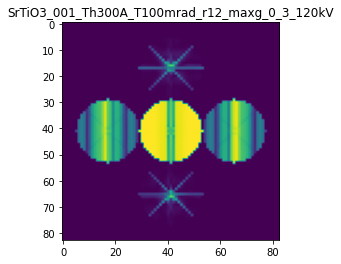

X_sim2.max():  0.9927424996585361
nlogf_X_sim2.max():  6.9014781184266365


In [18]:
# make unique Ug
UgUnique, r0 = mu.makeUniqueUgVector(Ug_pred_normalized,beam1,beam2,file = File)

# reshape
UgUnique_2real = np.concatenate((np.array(UgUnique.real,ndmin=2).T, np.array(UgUnique.imag,ndmin=2).T),axis=1)  
UgUnique_2real = np.asarray(UgUnique_2real)
UgUnique_t_2real = np.append(UgUnique_2real.reshape(numUg*2), Ug_t_exp_pred[-1])

# Compute the LARBED pattern: X_sim, from the predicted {Ug,t}: Y_exp_pred
X_sim2 = pf.pyQEDA(filename=file, UseInputUgMasterList=True, InputUg=UgUnique_t_2real, InputUgdoFlip=False)
X_sim2 = X_sim2.reshape(Nx,Nx,1)
nlogf_X_sim2 = nlogf(X_sim2)
print("X_sim2.max(): ", X_sim2.max())
print("nlogf_X_sim2.max(): ", nlogf_X_sim2.max())

In [19]:
R = calculate_R(X_sim1, X_sim2)
print(R)

1.203713988693442e-15


In [20]:
print('the ture thickness: 500')
print('the predicted thickness:',Ug_t_exp_pred[-1]*1000)

the ture thickness: 500
the predicted thickness: 562.049925327301


In [21]:
simulation_pattern = np.asarray(X_sim2)
print('the shape of the simulated pattern', X_sim2.shape)
print('the shape of the experimental pattern', X_exp.shape)

the shape of the simulated pattern (83, 83, 1)
the shape of the experimental pattern (1, 83, 83, 1)


Text(0.5, 1.0, 'experimental Pattern')

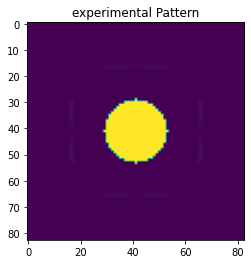

In [22]:
# plot the experimental Pattern:
plt.imshow(nlogf_X_exp[0])
plt.title('experimental Pattern')

Text(0.5, 1.0, 'simulation pattern')

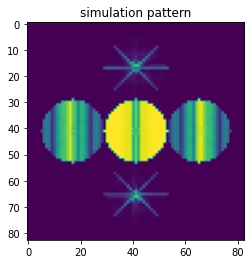

In [23]:
# plot the final simulated Pattern:
plt.imshow(nlogf_X_sim2)
plt.title("simulation pattern")

R-factor:  0.4763836717356881


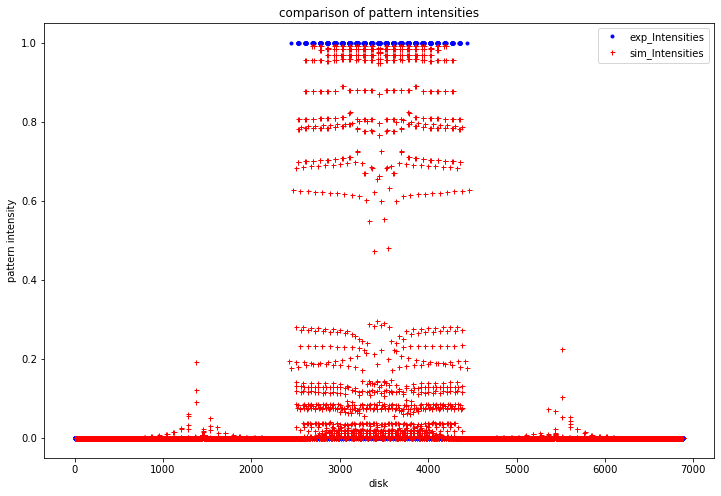

In [24]:
exp_Intensities = X_exp[0].reshape(Nx*Nx)
sim_Intensities = X_sim2.reshape(Nx*Nx)
R = calculate_R(exp_Intensities, sim_Intensities)
print("R-factor: ", R)    
plt.figure(figsize=(12,8))
plt.plot(exp_Intensities, "bo", markersize=3, label="exp_Intensities")
plt.plot(sim_Intensities, "r+", markersize=5, label="sim_Intensities")
plt.legend()
plt.xlabel("disk")
plt.ylabel("pattern intensity")
plt.title("comparison of pattern intensities")
plt.show()

-------------------------------------------------------------------------------------------------------------------

# IV. Replace the initial training set with new training set

>>>train the initial training set:
Epoch 1/20
5/5 [==============================] - 9s 1s/step - loss: 0.2850 - mean_absolute_error: 0.4443 - acc: 0.0300 - val_loss: 0.2287 - val_mean_absolute_error: 0.3873 - val_acc: 0.0000e+00
Epoch 2/20
5/5 [==============================] - 3s 594ms/step - loss: 0.1878 - mean_absolute_error: 0.3555 - acc: 0.0200 - val_loss: 0.1268 - val_mean_absolute_error: 0.2789 - val_acc: 0.0000e+00
Epoch 3/20
5/5 [==============================] - 3s 594ms/step - loss: 0.1093 - mean_absolute_error: 0.2499 - acc: 0.0300 - val_loss: 0.0828 - val_mean_absolute_error: 0.2145 - val_acc: 0.0000e+00
Epoch 4/20
5/5 [==============================] - 3s 615ms/step - loss: 0.0776 - mean_absolute_error: 0.2108 - acc: 0.0200 - val_loss: 0.0592 - val_mean_absolute_error: 0.1681 - val_acc: 0.0000e+00
Epoch 5/20
5/5 [==============================] - 3s 618ms/step - loss: 0.0540 - mean_absolute_error: 0.1536 - acc: 0.0200 - val_loss: 0.0434 - val_mean_absolute_error: 0.1365 

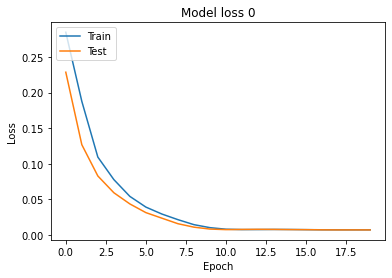

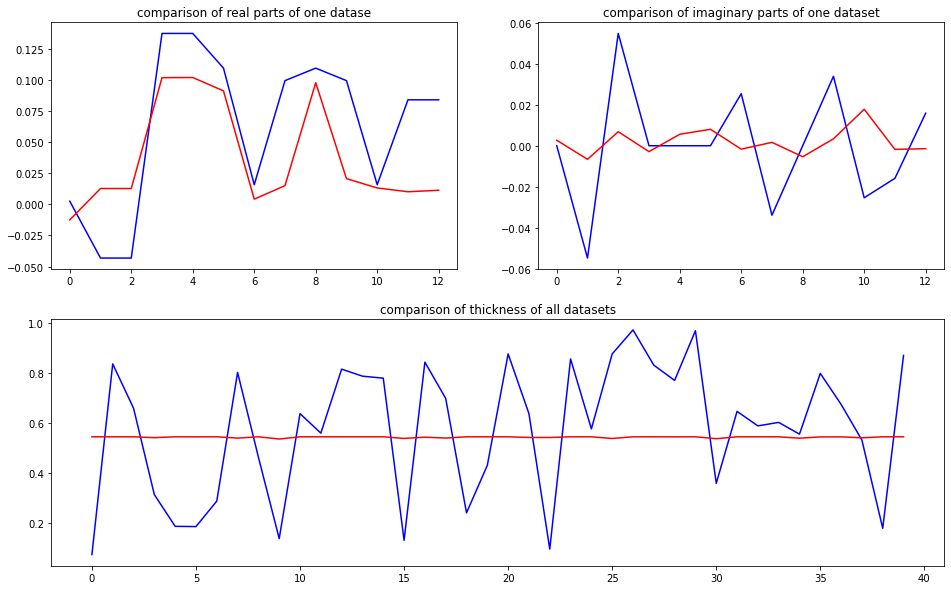

predicted thickness: 0.5404758


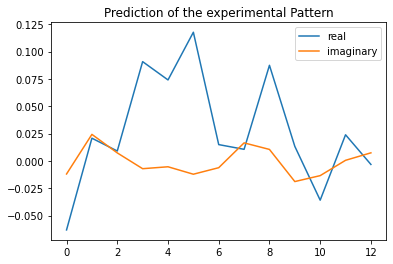

The offset applied on thickness: -0.0001234523781186112

The offset applied on Ug: 2.3908171953766684

Applied shift of unit cell origin (fractional coordinates): -0.007521731978269499 0.0016056875418576032
Ug[ 0 ]: 0.05329 3.14159  =>  0.05329 3.14159
Ug[ 1 ]: 0.01891 0.53584  =>  0.01891 0.54593
Ug[ 2 ]: 0.01891 -0.53584  =>  0.01891 -0.54593
Ug[ 3 ]: 0.09904 0.04726  =>  0.09904 0.0
Ug[ 4 ]: 0.09904 -0.04726  =>  0.09904 0.0
Ug[ 5 ]: 0.1286 0.02018  =>  0.1286 0.0
Ug[ 6 ]: 0.00882 2.8555  =>  0.00882 2.79815
Ug[ 7 ]: 0.02181 0.93134  =>  0.02181 0.96851
Ug[ 8 ]: 0.1286 -0.02018  =>  0.1286 -0.0
Ug[ 9 ]: 0.02181 -0.93134  =>  0.02181 -0.96851
Ug[ 10 ]: 0.00882 -2.8555  =>  0.00882 -2.79815
Ug[ 11 ]: 0.0114 -0.24213  =>  0.0114 -0.14761
Ug[ 12 ]: 0.0114 0.24213  =>  0.0114 0.14761
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001

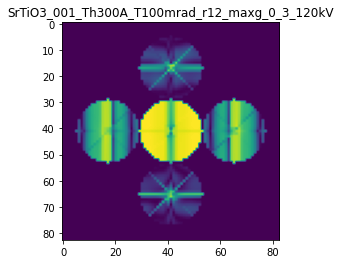

X_sim.max(): 0.9938427381874997
>>>replaced the 1. dataset and train: 
Epoch 1/5
5/5 [==============================] - 5s 824ms/step - loss: 0.0069 - mean_absolute_error: 0.0567 - acc: 0.9200 - val_loss: 0.0065 - val_mean_absolute_error: 0.0539 - val_acc: 0.9250
Epoch 2/5
5/5 [==============================] - 3s 552ms/step - loss: 0.0069 - mean_absolute_error: 0.0566 - acc: 0.9200 - val_loss: 0.0066 - val_mean_absolute_error: 0.0536 - val_acc: 0.9250
Epoch 3/5
5/5 [==============================] - 3s 579ms/step - loss: 0.0070 - mean_absolute_error: 0.0570 - acc: 0.9200 - val_loss: 0.0067 - val_mean_absolute_error: 0.0544 - val_acc: 0.9250
Epoch 4/5
5/5 [==============================] - 3s 606ms/step - loss: 0.0069 - mean_absolute_error: 0.0571 - acc: 0.9200 - val_loss: 0.0066 - val_mean_absolute_error: 0.0548 - val_acc: 0.9250
Epoch 5/5
5/5 [==============================] - 3s 610ms/step - loss: 0.0069 - mean_absolute_error: 0.0575 - acc: 0.9200 - val_loss: 0.0067 - val_mean_absol

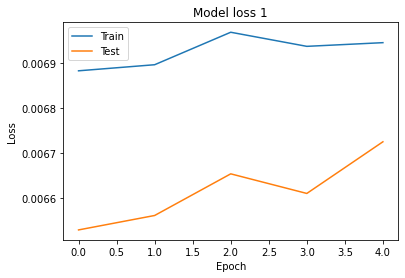

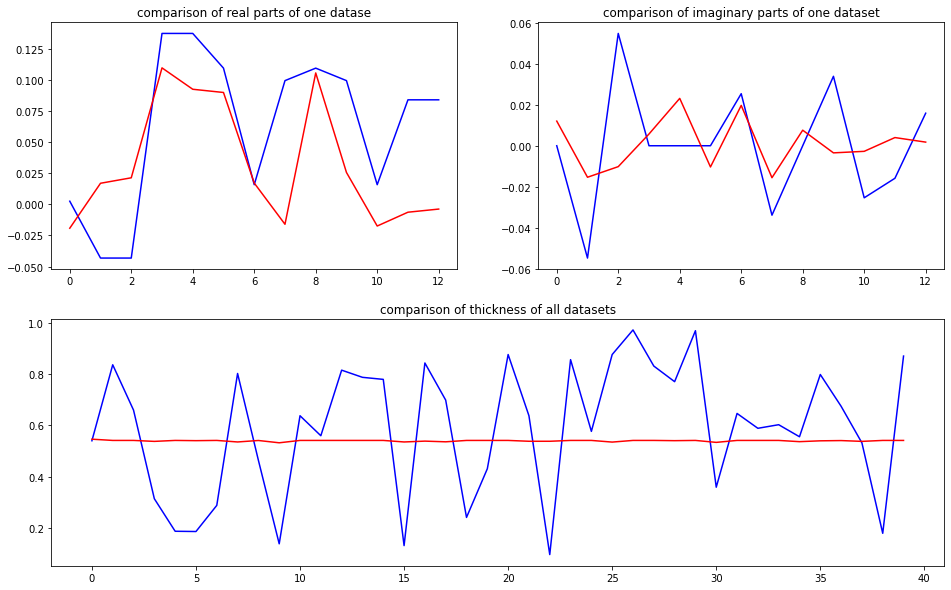

predicted thickness: 0.53536904


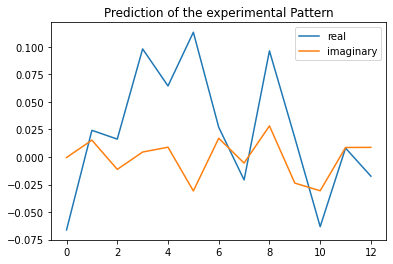

The offset applied on thickness: -0.0005948343814932212

The offset applied on Ug: -1.1062658283279554

Applied shift of unit cell origin (fractional coordinates): 0.009532641585791774 -0.025889636962224273
Ug[ 0 ]: 0.07102 3.14159  =>  0.07102 3.14159
Ug[ 1 ]: 0.0235 0.58808  =>  0.0235 0.42541
Ug[ 2 ]: 0.0235 -0.58808  =>  0.0235 -0.42541
Ug[ 3 ]: 0.07374 -0.0599  =>  0.07374 -0.0
Ug[ 4 ]: 0.07374 0.0599  =>  0.07374 0.0
Ug[ 5 ]: 0.09665 -0.32534  =>  0.09665 0.0
Ug[ 6 ]: 0.03401 2.25171  =>  0.03401 2.47427
Ug[ 7 ]: 0.00961 1.82696  =>  0.00961 1.92974
Ug[ 8 ]: 0.09665 0.32534  =>  0.09665 0.0
Ug[ 9 ]: 0.00961 -1.82696  =>  0.00961 -1.92974
Ug[ 10 ]: 0.03401 -2.25171  =>  0.03401 -2.47427
Ug[ 11 ]: 0.00495 3.12405  =>  0.00495 3.00426
Ug[ 12 ]: 0.00495 -3.12405  =>  0.00495 -3.00426
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3

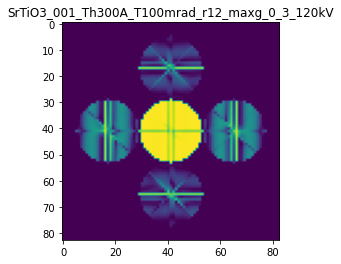

X_sim.max(): 0.9979181370449172
>>>replaced the 2. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 839ms/step - loss: 0.0068 - mean_absolute_error: 0.0569 - acc: 0.9200 - val_loss: 0.0064 - val_mean_absolute_error: 0.0540 - val_acc: 0.9250
Epoch 2/5
5/5 [==============================] - 3s 551ms/step - loss: 0.0068 - mean_absolute_error: 0.0569 - acc: 0.9200 - val_loss: 0.0064 - val_mean_absolute_error: 0.0533 - val_acc: 0.9250
Epoch 3/5
5/5 [==============================] - 3s 594ms/step - loss: 0.0068 - mean_absolute_error: 0.0561 - acc: 0.9200 - val_loss: 0.0064 - val_mean_absolute_error: 0.0532 - val_acc: 0.9250
Epoch 4/5
5/5 [==============================] - 3s 604ms/step - loss: 0.0068 - mean_absolute_error: 0.0562 - acc: 0.9200 - val_loss: 0.0065 - val_mean_absolute_error: 0.0541 - val_acc: 0.9250
Epoch 5/5
5/5 [==============================] - 3s 600ms/step - loss: 0.0068 - mean_absolute_error: 0.0568 - acc: 0.9200 - val_loss: 0.0064 - val_mean_absol

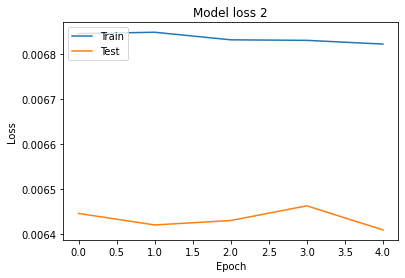

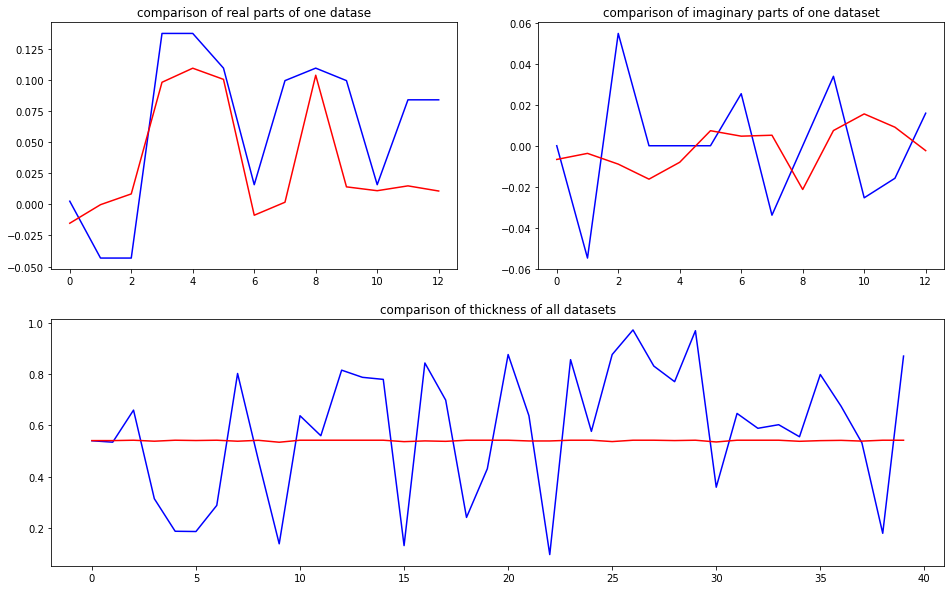

predicted thickness: 0.5347272


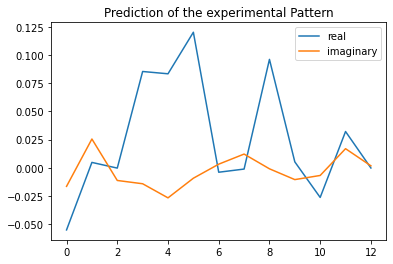

The offset applied on thickness: 0.0002966786552559413

The offset applied on Ug: 1.5925075695602637

Applied shift of unit cell origin (fractional coordinates): -0.010086153992301282 0.0015475706135535127
Ug[ 0 ]: 0.04988 3.14159  =>  0.04988 3.14159
Ug[ 1 ]: 0.01904 1.42142  =>  0.01904 1.43115
Ug[ 2 ]: 0.01904 -1.42142  =>  0.01904 -1.43115
Ug[ 3 ]: 0.09661 0.06337  =>  0.09661 0.0
Ug[ 4 ]: 0.09661 -0.06337  =>  0.09661 -0.0
Ug[ 5 ]: 0.12709 0.01945  =>  0.12709 -0.0
Ug[ 6 ]: 0.01524 2.84248  =>  0.01524 2.76939
Ug[ 7 ]: 0.01155 1.37581  =>  0.01155 1.42946
Ug[ 8 ]: 0.12709 -0.01945  =>  0.12709 0.0
Ug[ 9 ]: 0.01155 -1.37581  =>  0.01155 -1.42946
Ug[ 10 ]: 0.01524 -2.84248  =>  0.01524 -2.76939
Ug[ 11 ]: 0.01912 0.47586  =>  0.01912 0.6026
Ug[ 12 ]: 0.01912 -0.47586  =>  0.01912 -0.6026
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

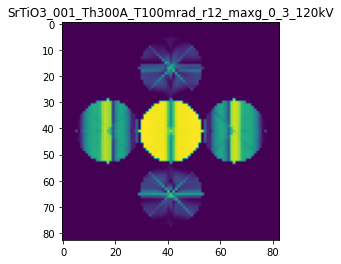

X_sim.max(): 0.9941792053923214
>>>replaced the 3. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 917ms/step - loss: 0.0068 - mean_absolute_error: 0.0573 - acc: 0.9200 - val_loss: 0.0067 - val_mean_absolute_error: 0.0570 - val_acc: 0.9250
Epoch 2/5
5/5 [==============================] - 3s 536ms/step - loss: 0.0070 - mean_absolute_error: 0.0584 - acc: 0.9200 - val_loss: 0.0065 - val_mean_absolute_error: 0.0549 - val_acc: 0.9250
Epoch 3/5
5/5 [==============================] - 3s 573ms/step - loss: 0.0069 - mean_absolute_error: 0.0571 - acc: 0.9200 - val_loss: 0.0066 - val_mean_absolute_error: 0.0555 - val_acc: 0.9250
Epoch 4/5
5/5 [==============================] - 3s 606ms/step - loss: 0.0069 - mean_absolute_error: 0.0573 - acc: 0.9200 - val_loss: 0.0064 - val_mean_absolute_error: 0.0527 - val_acc: 0.9250
Epoch 5/5
5/5 [==============================] - 3s 606ms/step - loss: 0.0068 - mean_absolute_error: 0.0563 - acc: 0.9200 - val_loss: 0.0063 - val_mean_absol

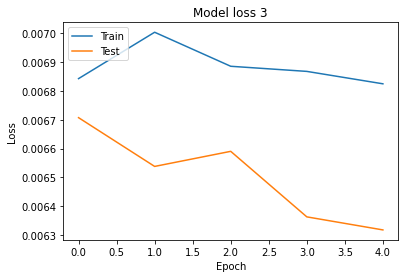

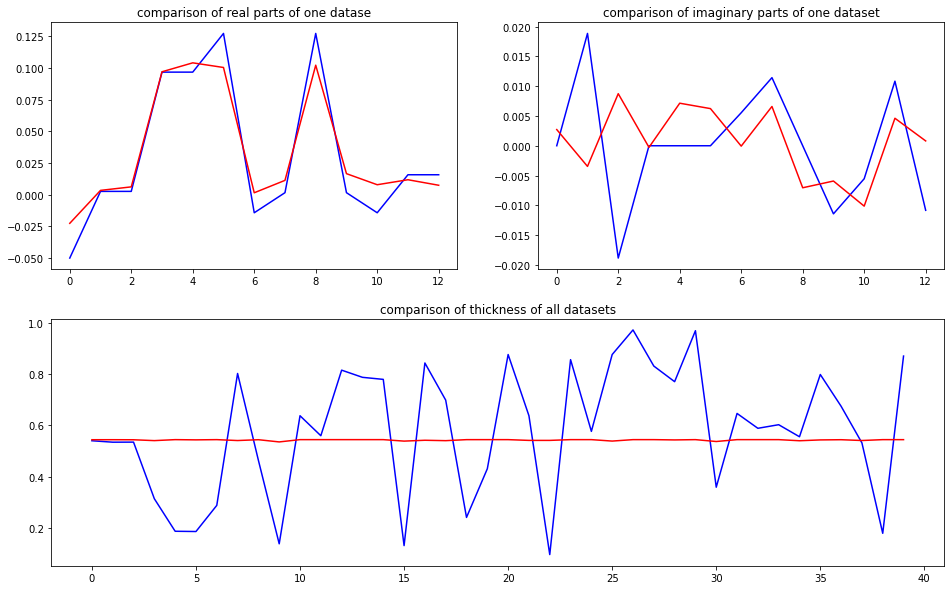

predicted thickness: 0.5354112


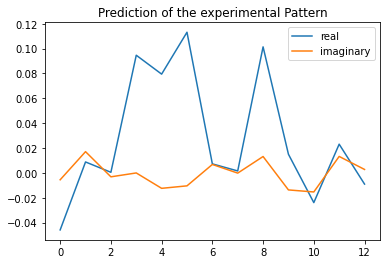

The offset applied on thickness: -0.00013336841052963622

The offset applied on Ug: -4.603810952265703

Applied shift of unit cell origin (fractional coordinates): -0.01742911084813351 -0.017239170123685664
Ug[ 0 ]: 0.05582 3.14159  =>  0.05582 3.14159
Ug[ 1 ]: 0.01009 1.19229  =>  0.01009 1.08397
Ug[ 2 ]: 0.01009 -1.19229  =>  0.01009 -1.08397
Ug[ 3 ]: 0.05186 0.10951  =>  0.05186 0.0
Ug[ 4 ]: 0.05186 -0.10951  =>  0.05186 0.0
Ug[ 5 ]: 0.05477 -0.21663  =>  0.05477 -0.0
Ug[ 6 ]: 0.01683 2.24223  =>  0.01683 2.24104
Ug[ 7 ]: 0.01052 0.80522  =>  0.01052 1.02304
Ug[ 8 ]: 0.05477 0.21663  =>  0.05477 0.0
Ug[ 9 ]: 0.01052 -0.80522  =>  0.01052 -1.02304
Ug[ 10 ]: 0.01683 -2.24223  =>  0.01683 -2.24104
Ug[ 11 ]: 0.00664 0.67706  =>  0.00664 0.89608
Ug[ 12 ]: 0.00664 -0.67706  =>  0.00664 -0.89608
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//

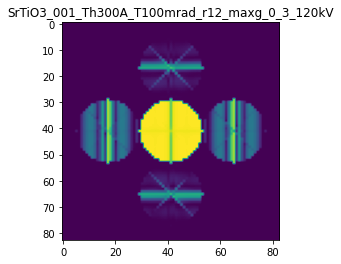

X_sim.max(): 0.998305992230554
>>>replaced the 4. dataset and train: 
Epoch 1/5
5/5 [==============================] - 5s 819ms/step - loss: 0.0067 - mean_absolute_error: 0.0558 - acc: 0.9200 - val_loss: 0.0062 - val_mean_absolute_error: 0.0517 - val_acc: 0.9250
Epoch 2/5
5/5 [==============================] - 3s 557ms/step - loss: 0.0067 - mean_absolute_error: 0.0562 - acc: 0.9200 - val_loss: 0.0063 - val_mean_absolute_error: 0.0524 - val_acc: 0.9250
Epoch 3/5
5/5 [==============================] - 3s 591ms/step - loss: 0.0067 - mean_absolute_error: 0.0562 - acc: 0.9200 - val_loss: 0.0062 - val_mean_absolute_error: 0.0522 - val_acc: 0.9250
Epoch 4/5
5/5 [==============================] - 3s 616ms/step - loss: 0.0067 - mean_absolute_error: 0.0560 - acc: 0.9200 - val_loss: 0.0063 - val_mean_absolute_error: 0.0529 - val_acc: 0.9250
Epoch 5/5
5/5 [==============================] - 3s 607ms/step - loss: 0.0068 - mean_absolute_error: 0.0565 - acc: 0.9200 - val_loss: 0.0063 - val_mean_absolu

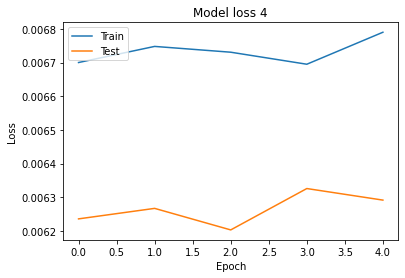

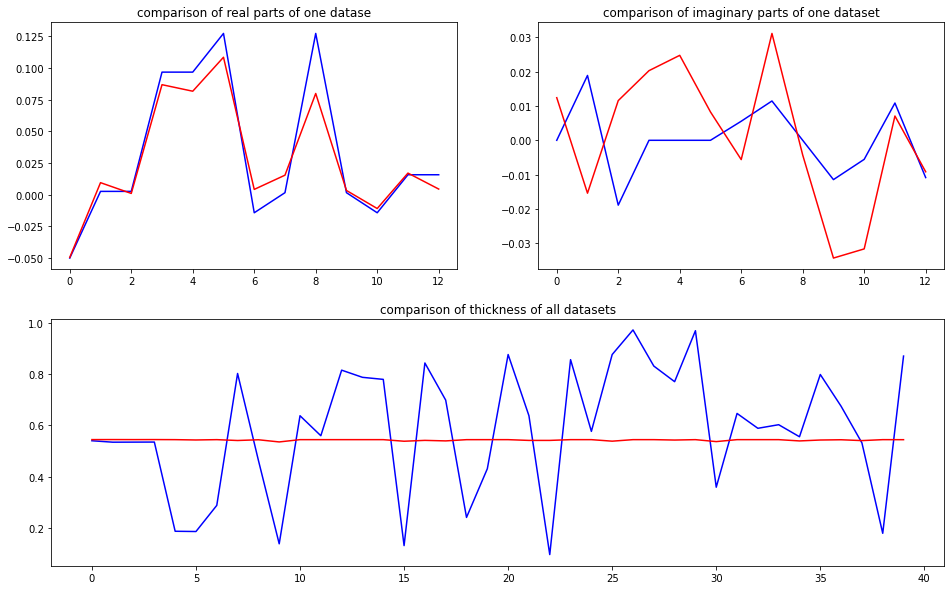

predicted thickness: 0.5338168


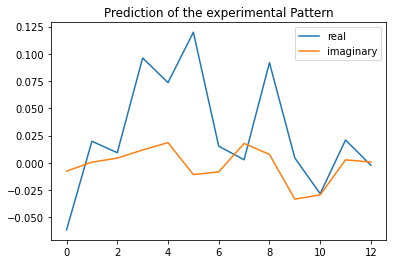

The offset applied on thickness: -0.0007732246487058469

The offset applied on Ug: 1.960623133855313

Applied shift of unit cell origin (fractional coordinates): -0.0035676861662398383 0.0004830219852942914
Ug[ 0 ]: 0.05402 3.14159  =>  0.05402 3.14159
Ug[ 1 ]: 0.01507 -0.10562  =>  0.01507 -0.10259
Ug[ 2 ]: 0.01507 0.10562  =>  0.01507 0.10259
Ug[ 3 ]: 0.09969 0.02242  =>  0.09969 0.0
Ug[ 4 ]: 0.09969 -0.02242  =>  0.09969 0.0
Ug[ 5 ]: 0.12829 0.00607  =>  0.12829 -0.0
Ug[ 6 ]: 0.01049 2.02969  =>  0.01049 2.00423
Ug[ 7 ]: 0.02525 1.37003  =>  0.02525 1.38941
Ug[ 8 ]: 0.12829 -0.00607  =>  0.12829 0.0
Ug[ 9 ]: 0.02525 -1.37003  =>  0.02525 -1.38941
Ug[ 10 ]: 0.01049 -2.02969  =>  0.01049 -2.00423
Ug[ 11 ]: 0.00986 0.1501  =>  0.00986 0.19493
Ug[ 12 ]: 0.00986 -0.1501  =>  0.00986 -0.19493
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

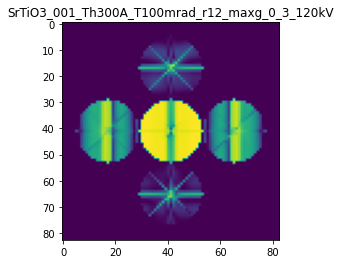

X_sim.max(): 0.9961924446236501
>>>replaced the 5. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 946ms/step - loss: 0.0067 - mean_absolute_error: 0.0561 - acc: 0.9200 - val_loss: 0.0060 - val_mean_absolute_error: 0.0508 - val_acc: 0.9250
Epoch 2/5
5/5 [==============================] - 3s 592ms/step - loss: 0.0067 - mean_absolute_error: 0.0559 - acc: 0.9200 - val_loss: 0.0060 - val_mean_absolute_error: 0.0511 - val_acc: 0.9250
Epoch 3/5
5/5 [==============================] - 3s 594ms/step - loss: 0.0066 - mean_absolute_error: 0.0552 - acc: 0.9200 - val_loss: 0.0060 - val_mean_absolute_error: 0.0505 - val_acc: 0.9250
Epoch 4/5
5/5 [==============================] - 3s 610ms/step - loss: 0.0066 - mean_absolute_error: 0.0550 - acc: 0.9200 - val_loss: 0.0060 - val_mean_absolute_error: 0.0509 - val_acc: 0.9250
Epoch 5/5
5/5 [==============================] - 3s 610ms/step - loss: 0.0067 - mean_absolute_error: 0.0555 - acc: 0.9200 - val_loss: 0.0060 - val_mean_absol

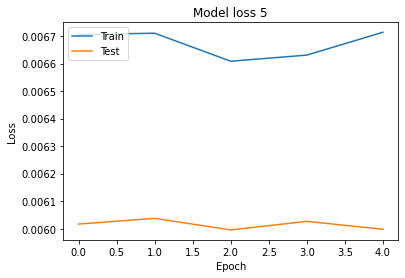

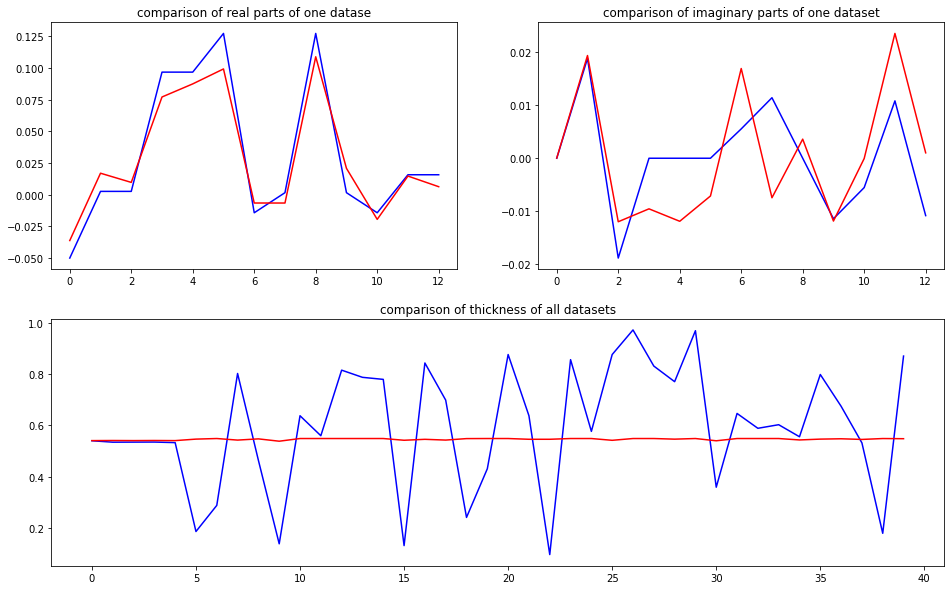

predicted thickness: 0.5372903


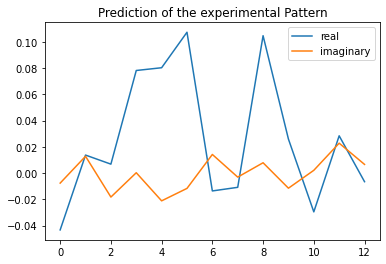

The offset applied on thickness: -0.0002541873045884882

The offset applied on Ug: 3.3697487047888575

Applied shift of unit cell origin (fractional coordinates): -0.013106279398773369 -0.004041162321456445
Ug[ 0 ]: 0.03675 3.14159  =>  0.03675 3.14159
Ug[ 1 ]: 0.01932 0.93144  =>  0.01932 0.90605
Ug[ 2 ]: 0.01932 -0.93144  =>  0.01932 -0.90605
Ug[ 3 ]: 0.10146 0.08235  =>  0.10146 0.0
Ug[ 4 ]: 0.10146 -0.08235  =>  0.10146 0.0
Ug[ 5 ]: 0.14435 -0.05078  =>  0.14435 0.0
Ug[ 6 ]: 0.02015 2.86842  =>  0.02015 2.81146
Ug[ 7 ]: 0.00954 0.29913  =>  0.00954 0.40687
Ug[ 8 ]: 0.14435 0.05078  =>  0.14435 0.0
Ug[ 9 ]: 0.00954 -0.29913  =>  0.00954 -0.40687
Ug[ 10 ]: 0.02015 -2.86842  =>  0.02015 -2.81146
Ug[ 11 ]: 0.01707 0.67374  =>  0.01707 0.83844
Ug[ 12 ]: 0.01707 -0.67374  =>  0.01707 -0.83844
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//S

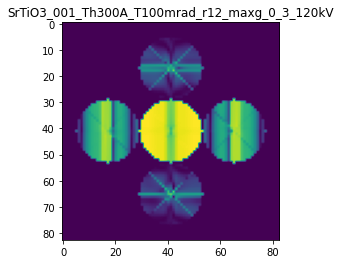

X_sim.max(): 0.9922465090860106
>>>replaced the 6. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 824ms/step - loss: 0.0066 - mean_absolute_error: 0.0542 - acc: 0.9200 - val_loss: 0.0058 - val_mean_absolute_error: 0.0495 - val_acc: 0.9250
Epoch 2/5
5/5 [==============================] - 3s 562ms/step - loss: 0.0066 - mean_absolute_error: 0.0546 - acc: 0.9200 - val_loss: 0.0058 - val_mean_absolute_error: 0.0495 - val_acc: 0.9250
Epoch 3/5
5/5 [==============================] - 3s 605ms/step - loss: 0.0066 - mean_absolute_error: 0.0543 - acc: 0.9200 - val_loss: 0.0058 - val_mean_absolute_error: 0.0490 - val_acc: 0.9250
Epoch 4/5
5/5 [==============================] - 3s 625ms/step - loss: 0.0066 - mean_absolute_error: 0.0547 - acc: 0.9200 - val_loss: 0.0058 - val_mean_absolute_error: 0.0491 - val_acc: 0.9250
Epoch 5/5
5/5 [==============================] - 3s 642ms/step - loss: 0.0066 - mean_absolute_error: 0.0547 - acc: 0.9200 - val_loss: 0.0059 - val_mean_absol

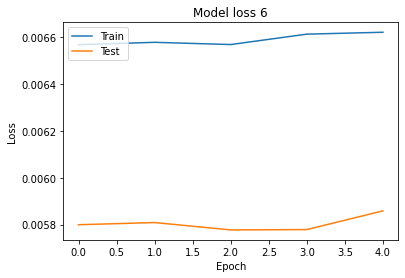

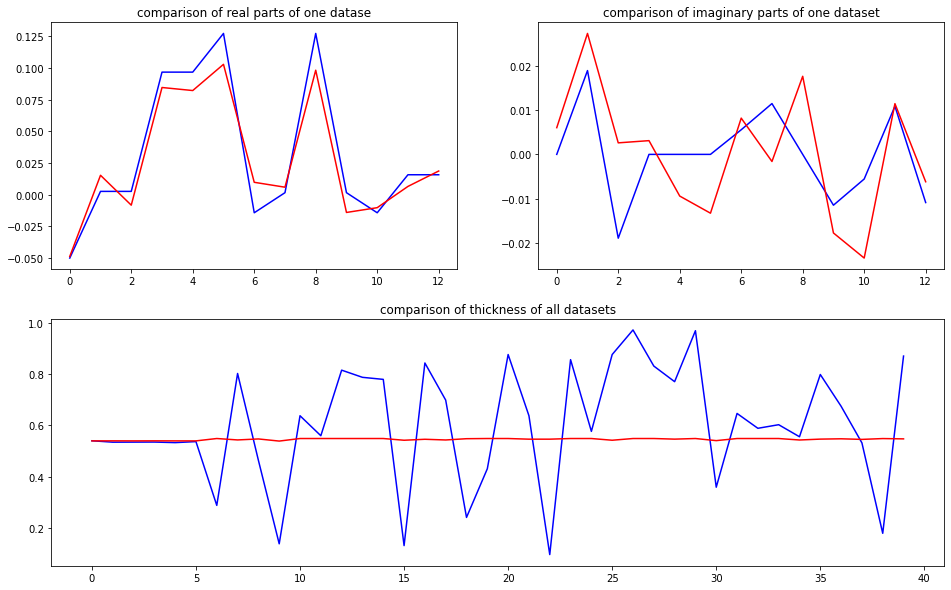

predicted thickness: 0.53631


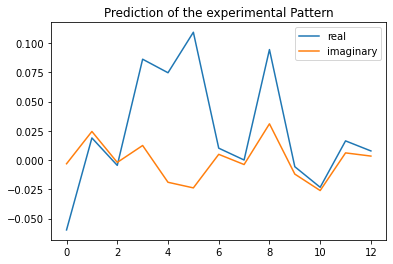

The offset applied on thickness: 0.0006148334793596135

The offset applied on Ug: 1.867656391627299

Applied shift of unit cell origin (fractional coordinates): -0.030528883284225997 -0.014881666581665526
Ug[ 0 ]: 0.05298 3.14159  =>  0.05298 3.14159
Ug[ 1 ]: 0.01634 1.04894  =>  0.01634 0.95544
Ug[ 2 ]: 0.01634 -1.04894  =>  0.01634 -0.95544
Ug[ 3 ]: 0.09478 0.19182  =>  0.09478 0.0
Ug[ 4 ]: 0.09478 -0.19182  =>  0.09478 -0.0
Ug[ 5 ]: 0.12491 -0.18701  =>  0.12491 0.0
Ug[ 6 ]: 0.01547 1.91735  =>  0.01547 1.81904
Ug[ 7 ]: 0.00471 2.15394  =>  0.00471 2.43926
Ug[ 8 ]: 0.12491 0.18701  =>  0.12491 0.0
Ug[ 9 ]: 0.00471 -2.15394  =>  0.00471 -2.43926
Ug[ 10 ]: 0.01547 -1.91735  =>  0.01547 -1.81904
Ug[ 11 ]: 0.01259 0.12734  =>  0.01259 0.51098
Ug[ 12 ]: 0.01259 -0.12734  =>  0.01259 -0.51098
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

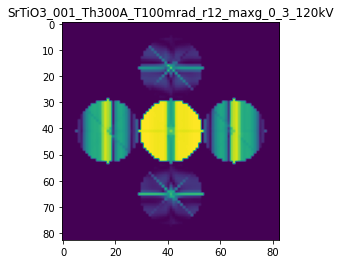

X_sim.max(): 0.9957216107364646
>>>replaced the 7. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 828ms/step - loss: 0.0065 - mean_absolute_error: 0.0546 - acc: 0.9200 - val_loss: 0.0057 - val_mean_absolute_error: 0.0493 - val_acc: 0.9250
Epoch 2/5
5/5 [==============================] - 3s 557ms/step - loss: 0.0066 - mean_absolute_error: 0.0547 - acc: 0.9200 - val_loss: 0.0056 - val_mean_absolute_error: 0.0486 - val_acc: 0.9250
Epoch 3/5
5/5 [==============================] - 3s 592ms/step - loss: 0.0066 - mean_absolute_error: 0.0551 - acc: 0.9200 - val_loss: 0.0057 - val_mean_absolute_error: 0.0491 - val_acc: 0.9250
Epoch 4/5
5/5 [==============================] - 3s 611ms/step - loss: 0.0066 - mean_absolute_error: 0.0549 - acc: 0.9200 - val_loss: 0.0057 - val_mean_absolute_error: 0.0491 - val_acc: 0.9250
Epoch 5/5
5/5 [==============================] - 3s 614ms/step - loss: 0.0066 - mean_absolute_error: 0.0550 - acc: 0.9200 - val_loss: 0.0058 - val_mean_absol

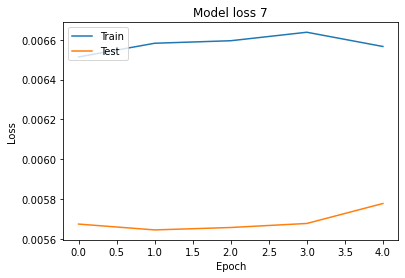

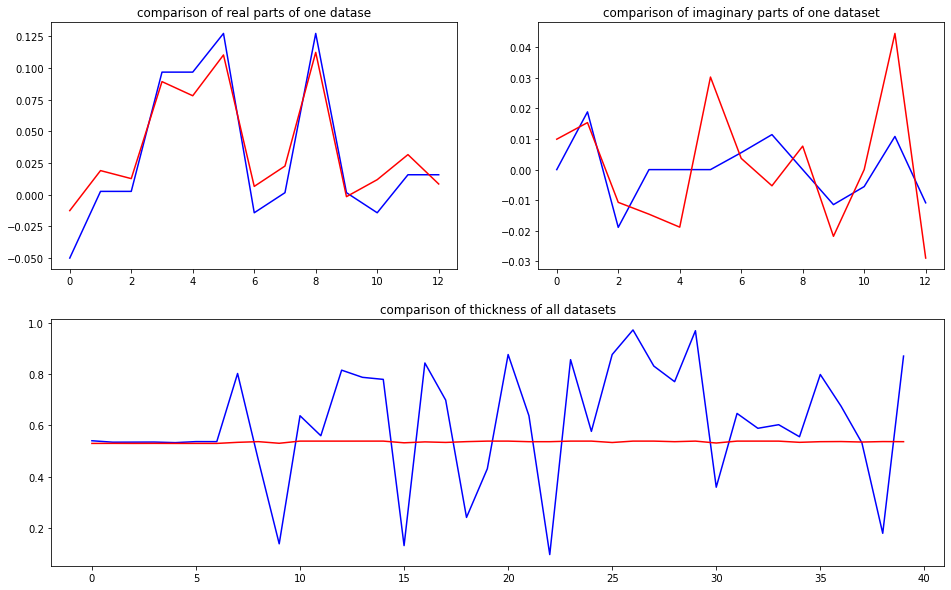

predicted thickness: 0.526041


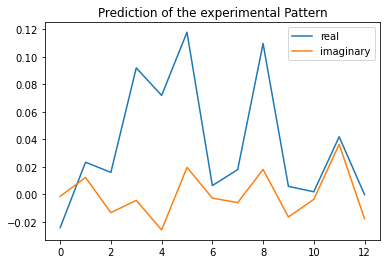

The offset applied on thickness: 0.0009072361982438473

The offset applied on Ug: 3.401293451812379

Applied shift of unit cell origin (fractional coordinates): -0.029810711273237686 0.00438986402685315
Ug[ 0 ]: 0.02228 3.14159  =>  0.02228 3.14159
Ug[ 1 ]: 0.02538 0.55471  =>  0.02538 0.58229
Ug[ 2 ]: 0.02538 -0.55471  =>  0.02538 -0.58229
Ug[ 3 ]: 0.10829 0.18731  =>  0.10829 0.0
Ug[ 4 ]: 0.10829 -0.18731  =>  0.10829 -0.0
Ug[ 5 ]: 0.15946 0.05516  =>  0.15946 0.0
Ug[ 6 ]: 0.00425 0.12324  =>  0.00425 -0.09164
Ug[ 7 ]: 0.01407 0.39152  =>  0.01407 0.55125
Ug[ 8 ]: 0.15946 -0.05516  =>  0.15946 0.0
Ug[ 9 ]: 0.01407 -0.39152  =>  0.01407 -0.55125
Ug[ 10 ]: 0.00425 -0.12324  =>  0.00425 0.09164
Ug[ 11 ]: 0.04276 0.89953  =>  0.04276 1.27414
Ug[ 12 ]: 0.04276 -0.89953  =>  0.04276 -1.27414
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTi

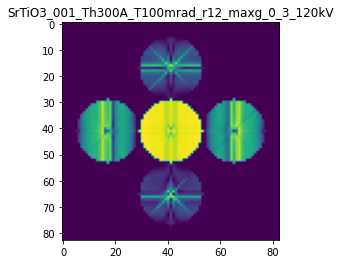

X_sim.max(): 0.9966912419138918
>>>replaced the 8. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 817ms/step - loss: 0.0065 - mean_absolute_error: 0.0554 - acc: 0.9200 - val_loss: 0.0057 - val_mean_absolute_error: 0.0507 - val_acc: 0.9250
Epoch 2/5
5/5 [==============================] - 3s 551ms/step - loss: 0.0065 - mean_absolute_error: 0.0546 - acc: 0.9200 - val_loss: 0.0055 - val_mean_absolute_error: 0.0492 - val_acc: 0.9250
Epoch 3/5
5/5 [==============================] - 3s 573ms/step - loss: 0.0065 - mean_absolute_error: 0.0550 - acc: 0.9200 - val_loss: 0.0056 - val_mean_absolute_error: 0.0489 - val_acc: 0.9250
Epoch 4/5
5/5 [==============================] - 3s 604ms/step - loss: 0.0066 - mean_absolute_error: 0.0553 - acc: 0.9200 - val_loss: 0.0057 - val_mean_absolute_error: 0.0498 - val_acc: 0.9250
Epoch 5/5
5/5 [==============================] - 3s 609ms/step - loss: 0.0065 - mean_absolute_error: 0.0550 - acc: 0.9200 - val_loss: 0.0055 - val_mean_absol

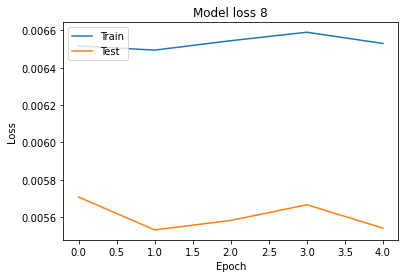

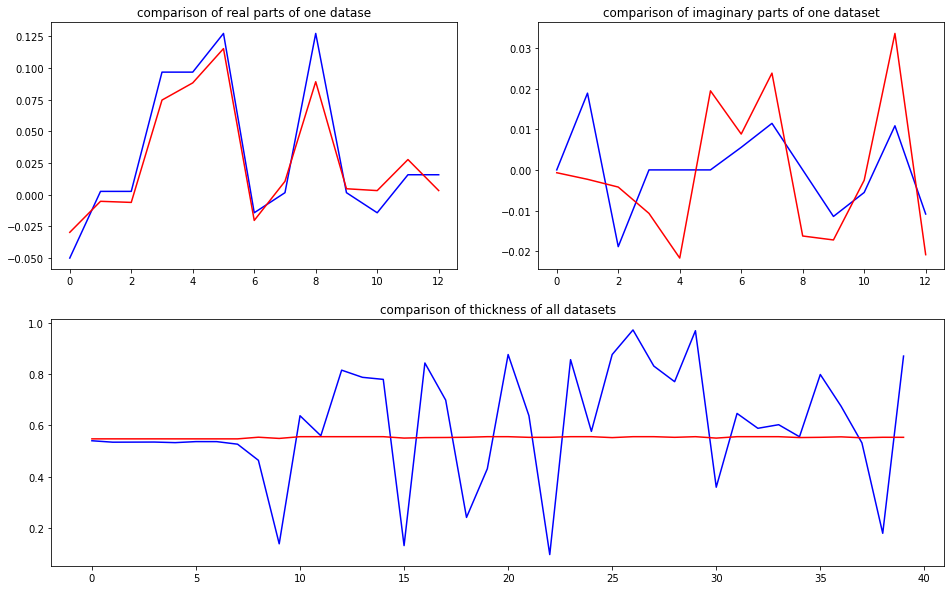

predicted thickness: 0.5448208


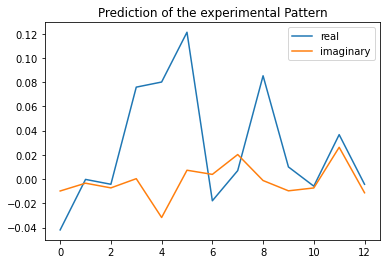

The offset applied on thickness: 0.0006130811083986218

The offset applied on Ug: -3.2166506996726922

Applied shift of unit cell origin (fractional coordinates): -0.0473627253430213 0.0018461895509355346
Ug[ 0 ]: 0.04786 3.14159  =>  0.04786 3.14159
Ug[ 1 ]: 0.00313 2.43311  =>  0.00313 2.44471
Ug[ 2 ]: 0.00313 -2.43311  =>  0.00313 -2.44471
Ug[ 3 ]: 0.05941 0.29759  =>  0.05941 0.0
Ug[ 4 ]: 0.05941 -0.29759  =>  0.05941 -0.0
Ug[ 5 ]: 0.06784 0.0232  =>  0.06784 0.0
Ug[ 6 ]: 0.01353 2.75206  =>  0.01353 2.44287
Ug[ 7 ]: 0.01636 1.09536  =>  0.01636 1.38135
Ug[ 8 ]: 0.06784 -0.0232  =>  0.06784 0.0
Ug[ 9 ]: 0.01636 -1.09536  =>  0.01636 -1.38135
Ug[ 10 ]: 0.01353 -2.75206  =>  0.01353 -2.44287
Ug[ 11 ]: 0.02077 0.91211  =>  0.02077 1.50729
Ug[ 12 ]: 0.02077 -0.91211  =>  0.02077 -1.50729
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTi

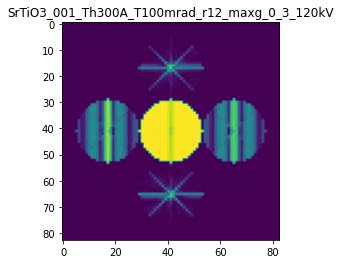

X_sim.max(): 0.9980996736033536
>>>replaced the 9. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 830ms/step - loss: 0.0064 - mean_absolute_error: 0.0540 - acc: 0.9200 - val_loss: 0.0055 - val_mean_absolute_error: 0.0474 - val_acc: 0.9250
Epoch 2/5
5/5 [==============================] - 3s 555ms/step - loss: 0.0064 - mean_absolute_error: 0.0535 - acc: 0.9200 - val_loss: 0.0054 - val_mean_absolute_error: 0.0463 - val_acc: 0.9250
Epoch 3/5
5/5 [==============================] - 3s 577ms/step - loss: 0.0065 - mean_absolute_error: 0.0542 - acc: 0.9200 - val_loss: 0.0055 - val_mean_absolute_error: 0.0476 - val_acc: 0.9250
Epoch 4/5
5/5 [==============================] - 3s 599ms/step - loss: 0.0065 - mean_absolute_error: 0.0539 - acc: 0.9200 - val_loss: 0.0056 - val_mean_absolute_error: 0.0493 - val_acc: 0.9250
Epoch 5/5
5/5 [==============================] - 3s 625ms/step - loss: 0.0065 - mean_absolute_error: 0.0552 - acc: 0.9200 - val_loss: 0.0054 - val_mean_absol

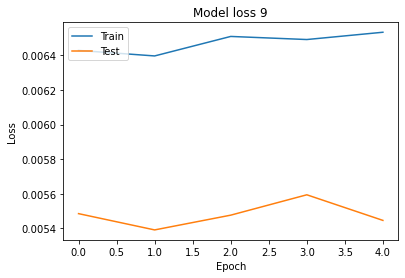

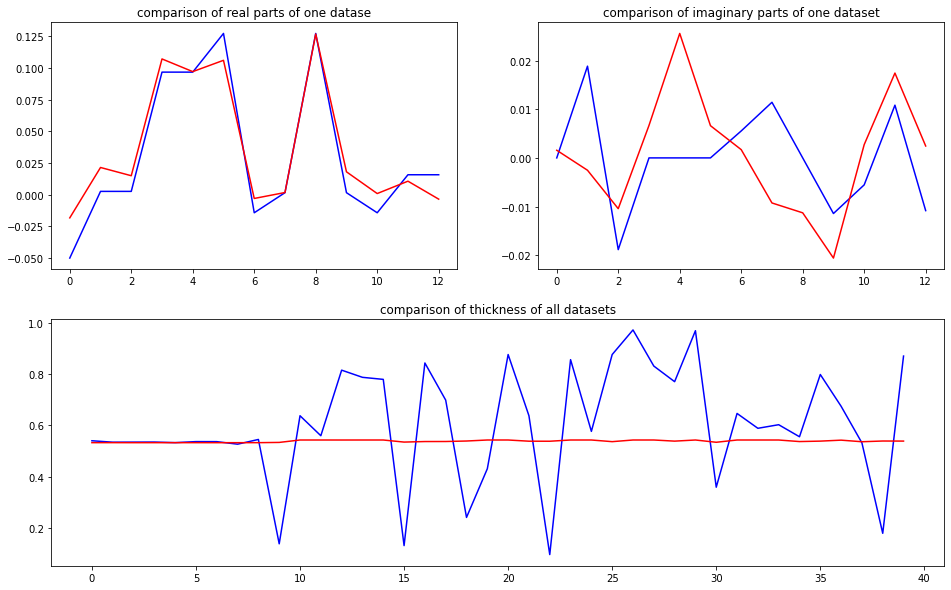

predicted thickness: 0.52794534


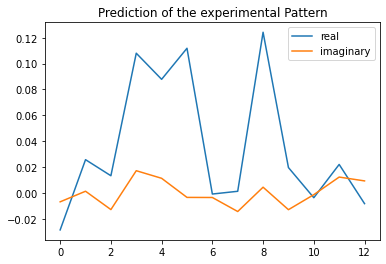

The offset applied on thickness: 0.0006969185000258828

The offset applied on Ug: -3.5628111165252507

Applied shift of unit cell origin (fractional coordinates): -0.003585983779489822 -0.004038260307332958
Ug[ 0 ]: 0.03178 3.14159  =>  0.03178 3.14159
Ug[ 1 ]: 0.01889 0.36164  =>  0.01889 0.33627
Ug[ 2 ]: 0.01889 -0.36164  =>  0.01889 -0.33627
Ug[ 3 ]: 0.06267 0.02253  =>  0.06267 -0.0
Ug[ 4 ]: 0.06267 -0.02253  =>  0.06267 0.0
Ug[ 5 ]: 0.0683 -0.05075  =>  0.0683 0.0
Ug[ 6 ]: 0.00262 -2.71357  =>  0.00262 -2.71073
Ug[ 7 ]: 0.00904 -0.02544  =>  0.00904 0.02246
Ug[ 8 ]: 0.0683 0.05075  =>  0.0683 -0.0
Ug[ 9 ]: 0.00904 0.02544  =>  0.00904 -0.02246
Ug[ 10 ]: 0.00262 2.71357  =>  0.00262 2.71073
Ug[ 11 ]: 0.00548 0.15023  =>  0.00548 0.1953
Ug[ 12 ]: 0.00548 -0.15023  =>  0.00548 -0.1953
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO

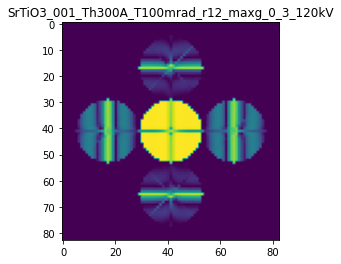

X_sim.max(): 0.9977394086972193
>>>replaced the 10. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 948ms/step - loss: 0.0064 - mean_absolute_error: 0.0542 - acc: 0.9200 - val_loss: 0.0052 - val_mean_absolute_error: 0.0453 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 551ms/step - loss: 0.0063 - mean_absolute_error: 0.0533 - acc: 0.9200 - val_loss: 0.0053 - val_mean_absolute_error: 0.0466 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 558ms/step - loss: 0.0063 - mean_absolute_error: 0.0535 - acc: 0.9200 - val_loss: 0.0053 - val_mean_absolute_error: 0.0473 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 589ms/step - loss: 0.0063 - mean_absolute_error: 0.0539 - acc: 0.9200 - val_loss: 0.0054 - val_mean_absolute_error: 0.0479 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 609ms/step - loss: 0.0063 - mean_absolute_error: 0.0542 - acc: 0.9200 - val_loss: 0.0053 - val_mean_abso

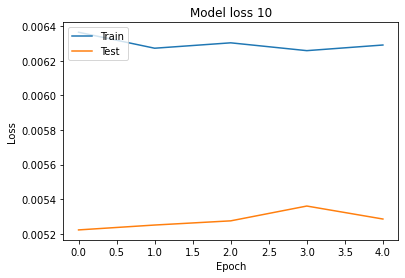

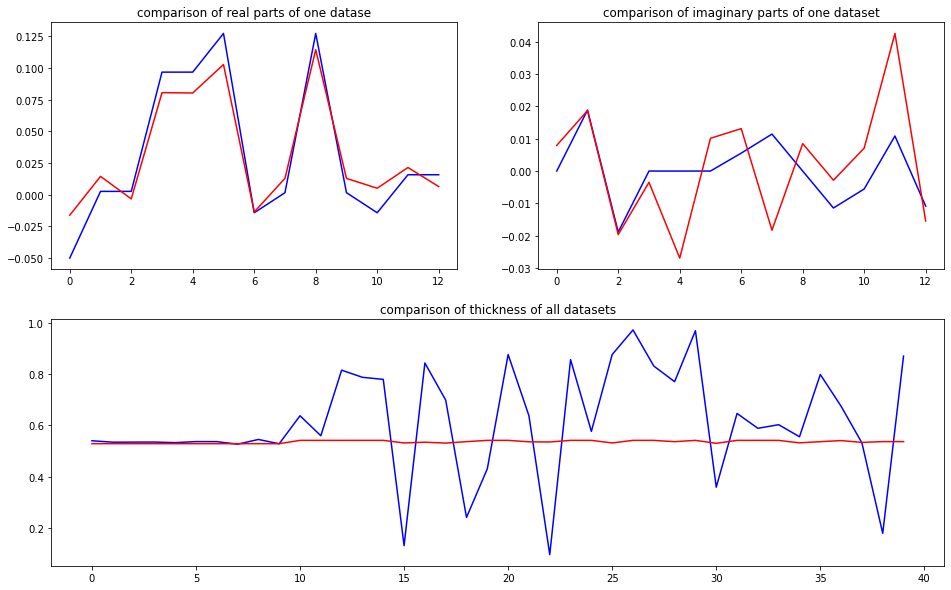

predicted thickness: 0.5196744


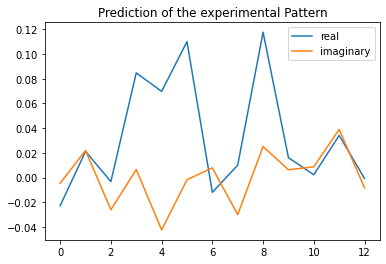

The offset applied on thickness: 0.0002887015668214033

The offset applied on Ug: 3.7209872115171105

Applied shift of unit cell origin (fractional coordinates): -0.04183005132288947 -0.01187392606353956
Ug[ 0 ]: 0.02075 3.14159  =>  0.02075 3.14159
Ug[ 1 ]: 0.02749 1.11837  =>  0.02749 1.04377
Ug[ 2 ]: 0.02749 -1.11837  =>  0.02749 -1.04377
Ug[ 3 ]: 0.10669 0.26283  =>  0.10669 0.0
Ug[ 4 ]: 0.10669 -0.26283  =>  0.10669 -0.0
Ug[ 5 ]: 0.16497 -0.14921  =>  0.16497 0.0
Ug[ 6 ]: 0.00428 -3.08758  =>  0.00428 3.00739
Ug[ 7 ]: 0.02281 -0.82433  =>  0.02281 -0.4869
Ug[ 8 ]: 0.16497 0.14921  =>  0.16497 0.0
Ug[ 9 ]: 0.02281 0.82433  =>  0.02281 0.4869
Ug[ 10 ]: 0.00428 3.08758  =>  0.00428 -3.00739
Ug[ 11 ]: 0.03707 0.94074  =>  0.03707 1.46639
Ug[ 12 ]: 0.03707 -0.94074  =>  0.03707 -1.46639
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO

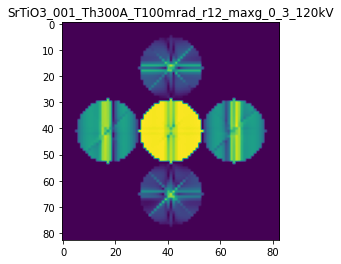

X_sim.max(): 0.978060711369331
>>>replaced the 11. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 873ms/step - loss: 0.0062 - mean_absolute_error: 0.0528 - acc: 0.9200 - val_loss: 0.0051 - val_mean_absolute_error: 0.0448 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 548ms/step - loss: 0.0062 - mean_absolute_error: 0.0525 - acc: 0.9200 - val_loss: 0.0051 - val_mean_absolute_error: 0.0449 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 562ms/step - loss: 0.0061 - mean_absolute_error: 0.0518 - acc: 0.9200 - val_loss: 0.0051 - val_mean_absolute_error: 0.0448 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 581ms/step - loss: 0.0061 - mean_absolute_error: 0.0520 - acc: 0.9200 - val_loss: 0.0050 - val_mean_absolute_error: 0.0444 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 611ms/step - loss: 0.0062 - mean_absolute_error: 0.0526 - acc: 0.9200 - val_loss: 0.0051 - val_mean_absol

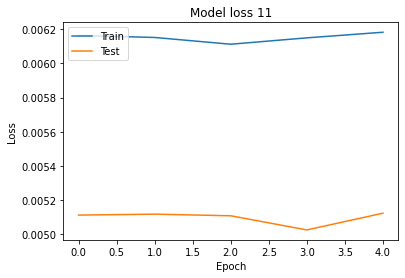

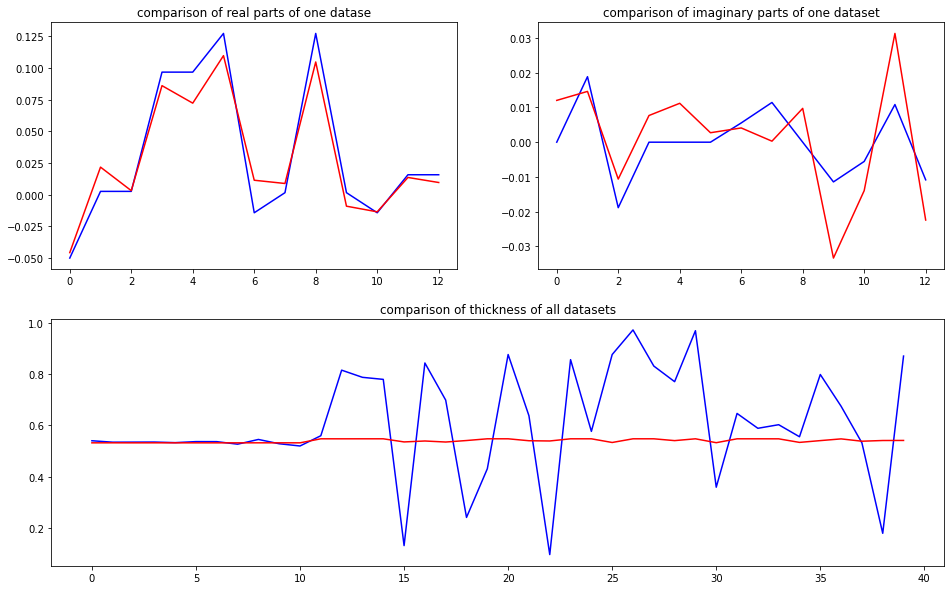

predicted thickness: 0.52042115


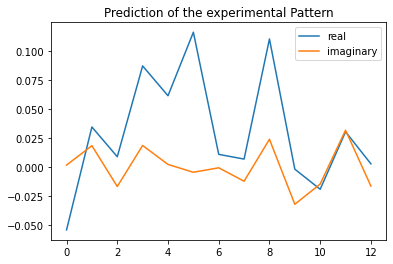

The offset applied on thickness: 0.0009617201203946704

The offset applied on Ug: 2.81516560643543

Applied shift of unit cell origin (fractional coordinates): -0.03144613325977866 -0.006156779789796479
Ug[ 0 ]: 0.0457 3.14159  =>  0.0457 3.14159
Ug[ 1 ]: 0.03141 0.67527  =>  0.03141 0.63658
Ug[ 2 ]: 0.03141 -0.67527  =>  0.03141 -0.63658
Ug[ 3 ]: 0.09263 0.19758  =>  0.09263 -0.0
Ug[ 4 ]: 0.09263 -0.19758  =>  0.09263 0.0
Ug[ 5 ]: 0.15061 -0.07737  =>  0.15061 0.0
Ug[ 6 ]: 0.00709 1.99945  =>  0.00709 1.84055
Ug[ 7 ]: 0.0098 1.10496  =>  0.0098 1.34122
Ug[ 8 ]: 0.15061 0.07737  =>  0.15061 -0.0
Ug[ 9 ]: 0.0098 -1.10496  =>  0.0098 -1.34122
Ug[ 10 ]: 0.00709 -1.99945  =>  0.00709 -1.84055
Ug[ 11 ]: 0.03342 0.93477  =>  0.03342 1.32993
Ug[ 12 ]: 0.03342 -0.93477  =>  0.03342 -1.32993
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_00

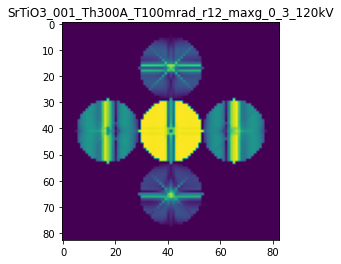

X_sim.max(): 0.9828915329166471
>>>replaced the 12. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 874ms/step - loss: 0.0061 - mean_absolute_error: 0.0521 - acc: 0.9200 - val_loss: 0.0051 - val_mean_absolute_error: 0.0456 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 550ms/step - loss: 0.0062 - mean_absolute_error: 0.0530 - acc: 0.9200 - val_loss: 0.0050 - val_mean_absolute_error: 0.0446 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 558ms/step - loss: 0.0061 - mean_absolute_error: 0.0522 - acc: 0.9200 - val_loss: 0.0050 - val_mean_absolute_error: 0.0443 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 577ms/step - loss: 0.0060 - mean_absolute_error: 0.0516 - acc: 0.9200 - val_loss: 0.0049 - val_mean_absolute_error: 0.0433 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 611ms/step - loss: 0.0060 - mean_absolute_error: 0.0516 - acc: 0.9200 - val_loss: 0.0050 - val_mean_abso

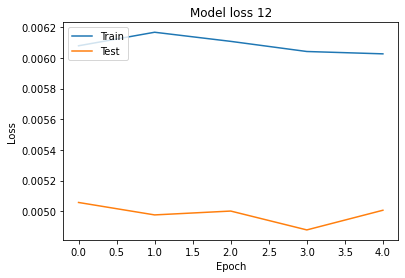

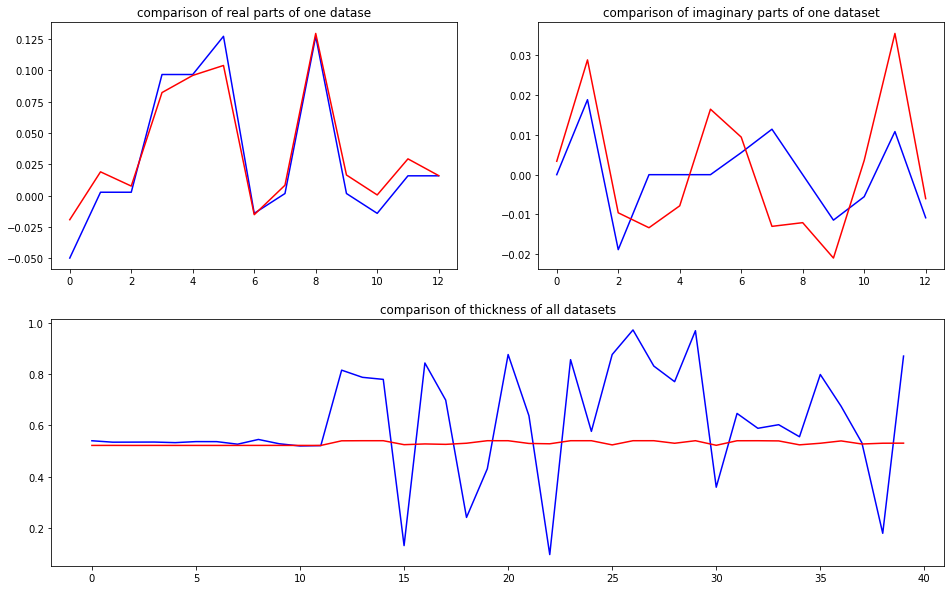

predicted thickness: 0.5075485


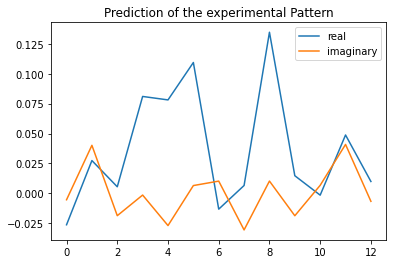

The offset applied on thickness: -0.0006976244342213098

The offset applied on Ug: -1.5738244288175665

Applied shift of unit cell origin (fractional coordinates): -0.02954297923569525 0.0004576427764306719
Ug[ 0 ]: 0.02737 3.14159  =>  0.02737 3.14159
Ug[ 1 ]: 0.03144 1.09815  =>  0.03144 1.10103
Ug[ 2 ]: 0.03144 -1.09815  =>  0.03144 -1.10103
Ug[ 3 ]: 0.07025 0.18562  =>  0.07025 0.0
Ug[ 4 ]: 0.07025 -0.18562  =>  0.07025 0.0
Ug[ 5 ]: 0.09824 0.00575  =>  0.09824 0.0
Ug[ 6 ]: 0.00775 2.93844  =>  0.00775 2.74994
Ug[ 7 ]: 0.01134 -0.58398  =>  0.01134 -0.40124
Ug[ 8 ]: 0.09824 -0.00575  =>  0.09824 0.0
Ug[ 9 ]: 0.01134 0.58398  =>  0.01134 0.40124
Ug[ 10 ]: 0.00775 -2.93844  =>  0.00775 -2.74994
Ug[ 11 ]: 0.03357 0.68187  =>  0.03357 1.05312
Ug[ 12 ]: 0.03357 -0.68187  =>  0.03357 -1.05312
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//S

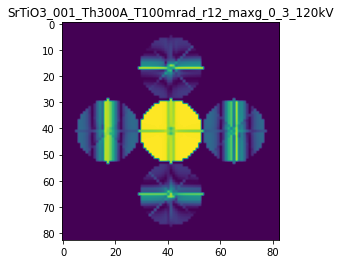

X_sim.max(): 0.9978444298992892
>>>replaced the 13. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 868ms/step - loss: 0.0060 - mean_absolute_error: 0.0515 - acc: 0.9200 - val_loss: 0.0050 - val_mean_absolute_error: 0.0455 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 553ms/step - loss: 0.0060 - mean_absolute_error: 0.0520 - acc: 0.9200 - val_loss: 0.0050 - val_mean_absolute_error: 0.0461 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 562ms/step - loss: 0.0062 - mean_absolute_error: 0.0530 - acc: 0.9200 - val_loss: 0.0050 - val_mean_absolute_error: 0.0445 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 578ms/step - loss: 0.0061 - mean_absolute_error: 0.0530 - acc: 0.9200 - val_loss: 0.0049 - val_mean_absolute_error: 0.0435 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 613ms/step - loss: 0.0060 - mean_absolute_error: 0.0522 - acc: 0.9200 - val_loss: 0.0049 - val_mean_abso

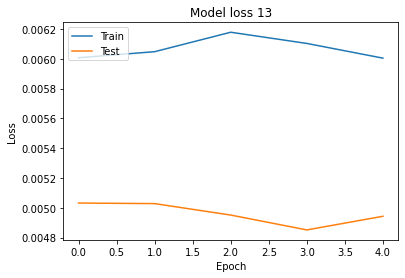

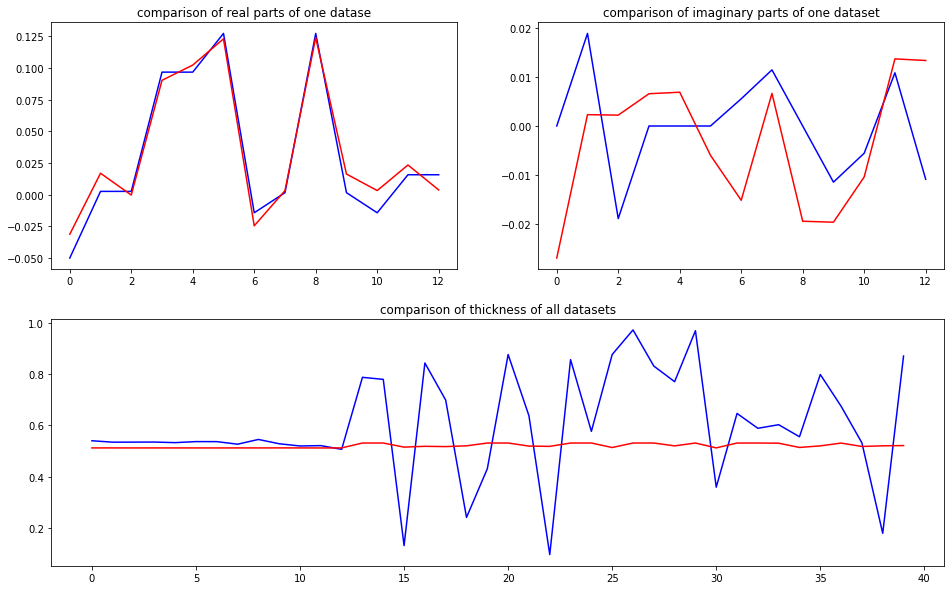

predicted thickness: 0.49678618


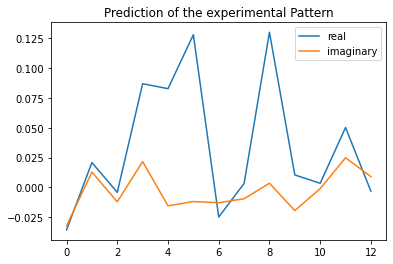

The offset applied on thickness: 0.0005731791647847711

The offset applied on Ug: -2.722921490434704

Applied shift of unit cell origin (fractional coordinates): -0.04324056406341822 -0.007237589172230458
Ug[ 0 ]: 0.0417 3.14159  =>  0.0417 3.14159
Ug[ 1 ]: 0.014 1.01792  =>  0.014 0.97244
Ug[ 2 ]: 0.014 -1.01792  =>  0.014 -0.97244
Ug[ 3 ]: 0.06663 0.27169  =>  0.06663 0.0
Ug[ 4 ]: 0.06663 -0.27169  =>  0.06663 -0.0
Ug[ 5 ]: 0.08375 -0.09095  =>  0.08375 0.0
Ug[ 6 ]: 0.01362 -2.59666  =>  0.01362 -2.82287
Ug[ 7 ]: 0.00819 0.72519  =>  0.00819 1.04235
Ug[ 8 ]: 0.08375 0.09095  =>  0.08375 -0.0
Ug[ 9 ]: 0.00819 -0.72519  =>  0.00819 -1.04235
Ug[ 10 ]: 0.01362 2.59666  =>  0.01362 2.82287
Ug[ 11 ]: 0.01972 0.2469  =>  0.01972 0.79028
Ug[ 12 ]: 0.01972 -0.2469  =>  0.01972 -0.79028
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th

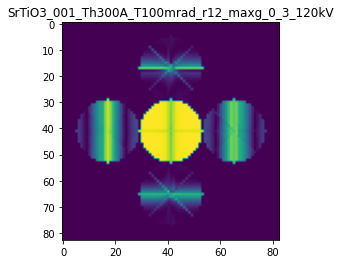

X_sim.max(): 0.99909053476018
>>>replaced the 14. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 871ms/step - loss: 0.0059 - mean_absolute_error: 0.0509 - acc: 0.9200 - val_loss: 0.0047 - val_mean_absolute_error: 0.0427 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 592ms/step - loss: 0.0060 - mean_absolute_error: 0.0518 - acc: 0.9200 - val_loss: 0.0048 - val_mean_absolute_error: 0.0430 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 561ms/step - loss: 0.0061 - mean_absolute_error: 0.0525 - acc: 0.9200 - val_loss: 0.0047 - val_mean_absolute_error: 0.0425 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 590ms/step - loss: 0.0060 - mean_absolute_error: 0.0531 - acc: 0.9200 - val_loss: 0.0050 - val_mean_absolute_error: 0.0456 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 619ms/step - loss: 0.0060 - mean_absolute_error: 0.0523 - acc: 0.9200 - val_loss: 0.0048 - val_mean_absolu

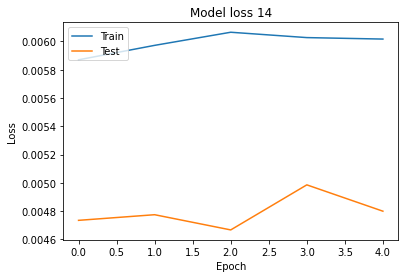

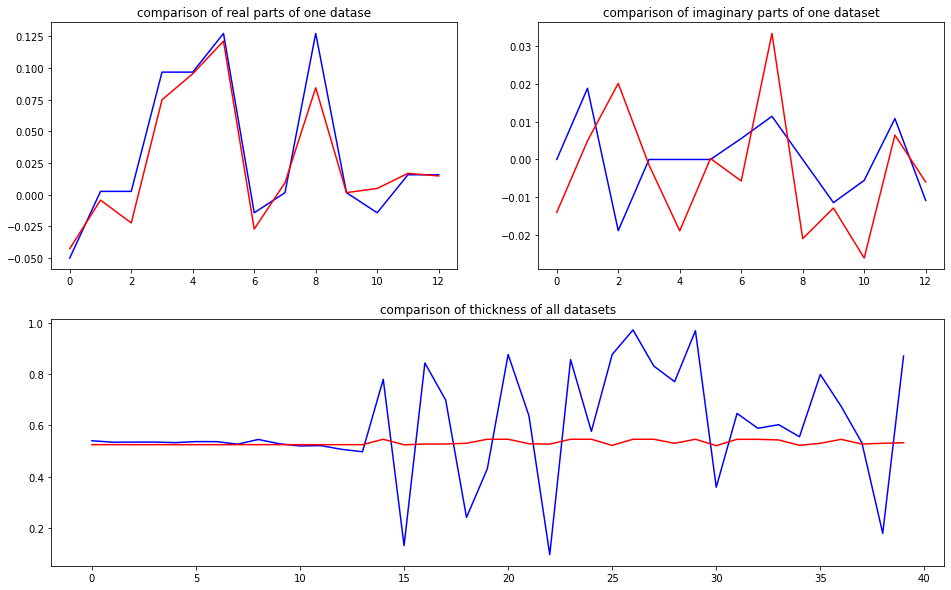

predicted thickness: 0.5042206


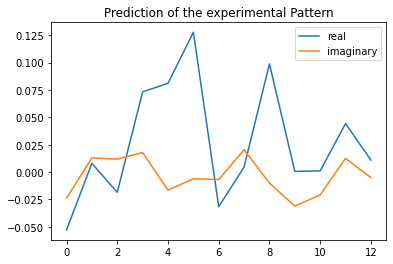

The offset applied on thickness: 0.0005691398870805283

The offset applied on Ug: 0.07138996618897941

Applied shift of unit cell origin (fractional coordinates): -0.03460575025773126 0.0015708612173612369
Ug[ 0 ]: 0.05263 3.14159  =>  0.05263 3.14159
Ug[ 1 ]: 0.00531 3.03461  =>  0.00531 3.04448
Ug[ 2 ]: 0.00531 -3.03461  =>  0.00531 -3.04448
Ug[ 3 ]: 0.07949 0.21743  =>  0.07949 0.0
Ug[ 4 ]: 0.07949 -0.21743  =>  0.07949 0.0
Ug[ 5 ]: 0.11419 0.01974  =>  0.11419 -0.0
Ug[ 6 ]: 0.01681 2.70562  =>  0.01681 2.47832
Ug[ 7 ]: 0.02584 1.4702  =>  0.02584 1.67777
Ug[ 8 ]: 0.11419 -0.01974  =>  0.11419 0.0
Ug[ 9 ]: 0.02584 -1.4702  =>  0.02584 -1.67777
Ug[ 10 ]: 0.01681 -2.70562  =>  0.01681 -2.47832
Ug[ 11 ]: 0.02906 0.31108  =>  0.02906 0.74595
Ug[ 12 ]: 0.02906 -0.31108  =>  0.02906 -0.74595
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrT

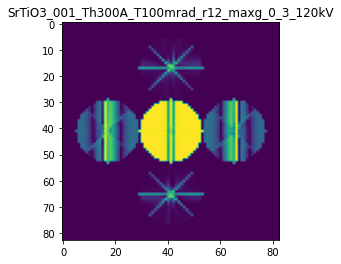

X_sim.max(): 0.9991833714962924
>>>replaced the 15. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 866ms/step - loss: 0.0059 - mean_absolute_error: 0.0518 - acc: 0.9300 - val_loss: 0.0046 - val_mean_absolute_error: 0.0427 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 552ms/step - loss: 0.0059 - mean_absolute_error: 0.0516 - acc: 0.9300 - val_loss: 0.0047 - val_mean_absolute_error: 0.0433 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 558ms/step - loss: 0.0059 - mean_absolute_error: 0.0519 - acc: 0.9300 - val_loss: 0.0045 - val_mean_absolute_error: 0.0416 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 578ms/step - loss: 0.0058 - mean_absolute_error: 0.0515 - acc: 0.9300 - val_loss: 0.0047 - val_mean_absolute_error: 0.0432 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 606ms/step - loss: 0.0058 - mean_absolute_error: 0.0514 - acc: 0.9300 - val_loss: 0.0046 - val_mean_abso

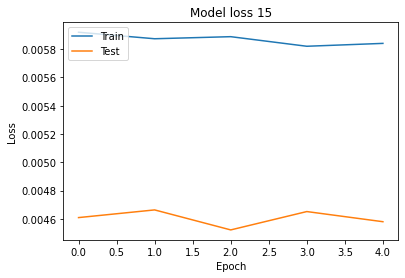

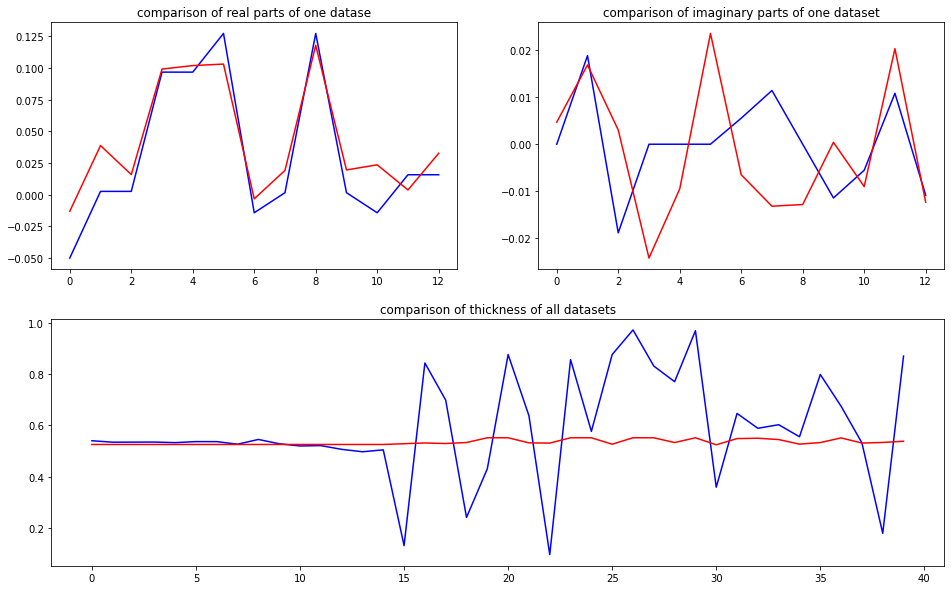

predicted thickness: 0.5105068


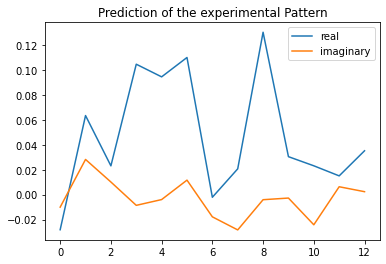

The offset applied on thickness: 0.00034635757884206097

The offset applied on Ug: 1.0870323697596764

Applied shift of unit cell origin (fractional coordinates): 0.0011516654170618005 0.00243846475799948
Ug[ 0 ]: 0.02716 3.14159  =>  0.02716 3.14159
Ug[ 1 ]: 0.04761 0.24748  =>  0.04761 0.2628
Ug[ 2 ]: 0.04761 -0.24748  =>  0.04761 -0.2628
Ug[ 3 ]: 0.11024 -0.00724  =>  0.11024 0.0
Ug[ 4 ]: 0.11024 0.00724  =>  0.11024 0.0
Ug[ 5 ]: 0.13589 0.03064  =>  0.13589 0.0
Ug[ 6 ]: 0.0116 0.23682  =>  0.0116 0.22874
Ug[ 7 ]: 0.02954 -0.44095  =>  0.02954 -0.46351
Ug[ 8 ]: 0.13589 -0.03064  =>  0.13589 0.0
Ug[ 9 ]: 0.02954 0.44095  =>  0.02954 0.46351
Ug[ 10 ]: 0.0116 -0.23682  =>  0.0116 -0.22874
Ug[ 11 ]: 0.02593 0.05393  =>  0.02593 0.03946
Ug[ 12 ]: 0.02593 -0.05393  =>  0.02593 -0.03946
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_00

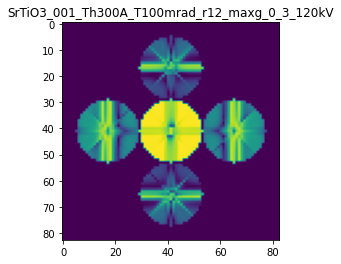

X_sim.max(): 0.9762475343361713
>>>replaced the 16. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 964ms/step - loss: 0.0059 - mean_absolute_error: 0.0515 - acc: 0.9300 - val_loss: 0.0044 - val_mean_absolute_error: 0.0420 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 544ms/step - loss: 0.0059 - mean_absolute_error: 0.0517 - acc: 0.9300 - val_loss: 0.0044 - val_mean_absolute_error: 0.0422 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 556ms/step - loss: 0.0059 - mean_absolute_error: 0.0521 - acc: 0.9300 - val_loss: 0.0045 - val_mean_absolute_error: 0.0429 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 566ms/step - loss: 0.0059 - mean_absolute_error: 0.0529 - acc: 0.9300 - val_loss: 0.0045 - val_mean_absolute_error: 0.0427 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 610ms/step - loss: 0.0059 - mean_absolute_error: 0.0526 - acc: 0.9300 - val_loss: 0.0044 - val_mean_abso

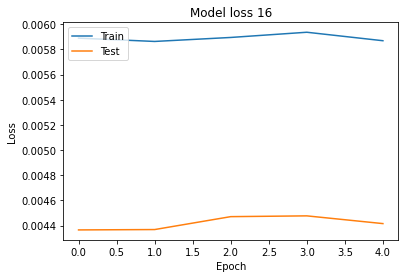

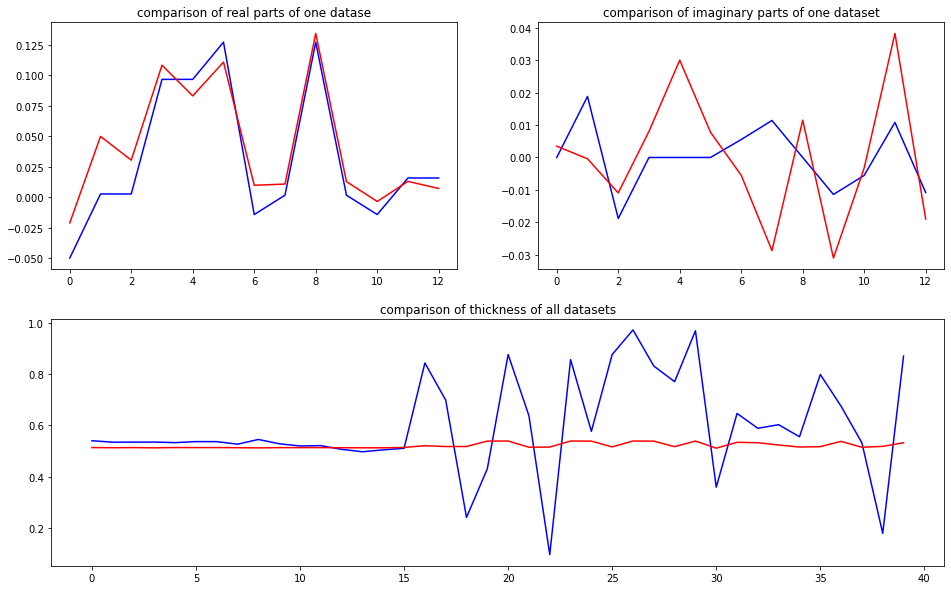

predicted thickness: 0.49400088


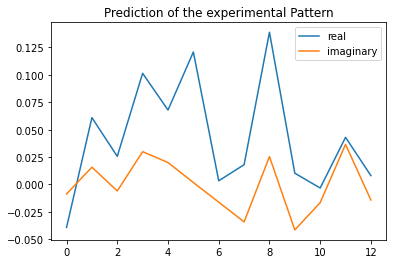

The offset applied on thickness: 0.0006341868813594449

The offset applied on Ug: 4.1185633430587645

Applied shift of unit cell origin (fractional coordinates): -0.04538205093582106 -0.017961431850415835
Ug[ 0 ]: 0.03255 3.14159  =>  0.03255 3.14159
Ug[ 1 ]: 0.05731 0.39274  =>  0.05731 0.27988
Ug[ 2 ]: 0.05731 -0.39274  =>  0.05731 -0.27988
Ug[ 3 ]: 0.12299 0.28514  =>  0.12299 0.0
Ug[ 4 ]: 0.12299 -0.28514  =>  0.12299 -0.0
Ug[ 5 ]: 0.20625 -0.22571  =>  0.20625 -0.0
Ug[ 6 ]: 0.00124 0.17027  =>  0.00124 -0.00202
Ug[ 7 ]: 0.02122 0.14522  =>  0.02122 0.54322
Ug[ 8 ]: 0.20625 0.22571  =>  0.20625 0.0
Ug[ 9 ]: 0.02122 -0.14522  =>  0.02122 -0.54322
Ug[ 10 ]: 0.00124 -0.17027  =>  0.00124 0.00202
Ug[ 11 ]: 0.04716 0.80573  =>  0.04716 1.37601
Ug[ 12 ]: 0.04716 -0.80573  =>  0.04716 -1.37601
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//S

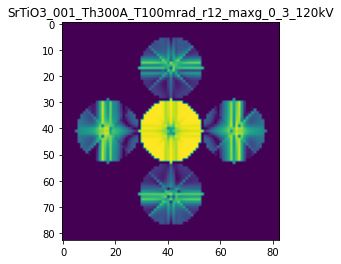

X_sim.max(): 0.9931381368342769
>>>replaced the 17. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 863ms/step - loss: 0.0058 - mean_absolute_error: 0.0519 - acc: 0.9300 - val_loss: 0.0044 - val_mean_absolute_error: 0.0435 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 553ms/step - loss: 0.0058 - mean_absolute_error: 0.0518 - acc: 0.9300 - val_loss: 0.0043 - val_mean_absolute_error: 0.0418 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 571ms/step - loss: 0.0057 - mean_absolute_error: 0.0505 - acc: 0.9300 - val_loss: 0.0042 - val_mean_absolute_error: 0.0405 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 587ms/step - loss: 0.0057 - mean_absolute_error: 0.0506 - acc: 0.9300 - val_loss: 0.0042 - val_mean_absolute_error: 0.0400 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 612ms/step - loss: 0.0057 - mean_absolute_error: 0.0509 - acc: 0.9300 - val_loss: 0.0043 - val_mean_abso

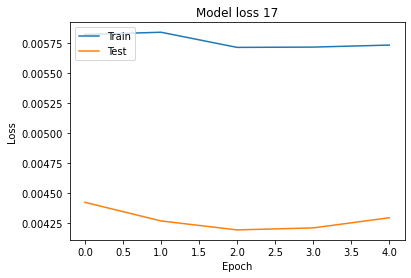

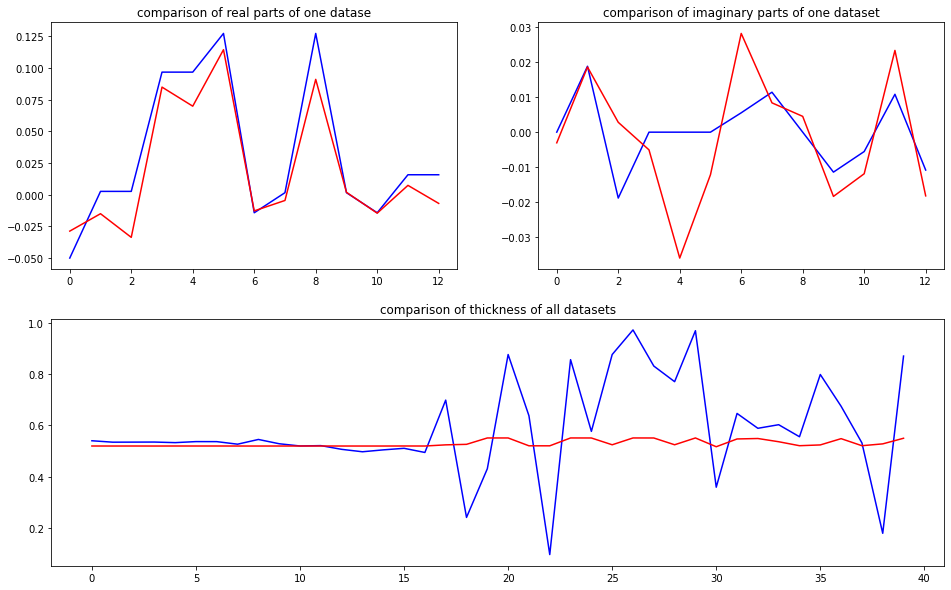

predicted thickness: 0.49848258


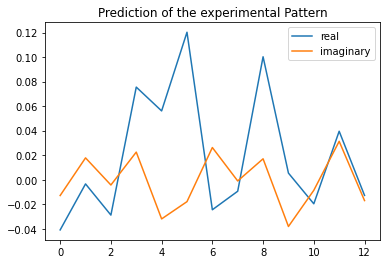

The offset applied on thickness: 0.00047865580141836464

The offset applied on Ug: -2.4277143308659315

Applied shift of unit cell origin (fractional coordinates): -0.0723578027739983 -0.01888656691629631
Ug[ 0 ]: 0.04545 3.14159  =>  0.04545 3.14159
Ug[ 1 ]: 0.02121 2.54939  =>  0.02121 2.43072
Ug[ 2 ]: 0.02121 -2.54939  =>  0.02121 -2.43072
Ug[ 3 ]: 0.05923 0.45464  =>  0.05923 -0.0
Ug[ 4 ]: 0.05923 -0.45464  =>  0.05923 0.0
Ug[ 5 ]: 0.08206 -0.23734  =>  0.08206 -0.0
Ug[ 6 ]: 0.0292 2.54943  =>  0.0292 2.21346
Ug[ 7 ]: 0.0206 1.76297  =>  0.0206 2.33628
Ug[ 8 ]: 0.08206 0.23734  =>  0.08206 0.0
Ug[ 9 ]: 0.0206 -1.76297  =>  0.0206 -2.33628
Ug[ 10 ]: 0.0292 -2.54943  =>  0.0292 -2.21346
Ug[ 11 ]: 0.02425 1.15844  =>  0.02425 2.06771
Ug[ 12 ]: 0.02425 -1.15844  =>  0.02425 -2.06771
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_00

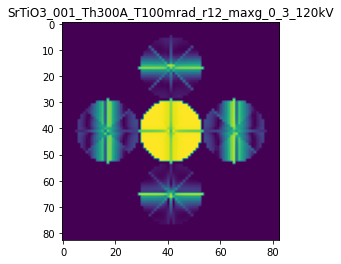

X_sim.max(): 0.9986251643339261
>>>replaced the 18. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 867ms/step - loss: 0.0058 - mean_absolute_error: 0.0511 - acc: 0.9300 - val_loss: 0.0043 - val_mean_absolute_error: 0.0436 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 557ms/step - loss: 0.0057 - mean_absolute_error: 0.0510 - acc: 0.9300 - val_loss: 0.0041 - val_mean_absolute_error: 0.0388 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 570ms/step - loss: 0.0056 - mean_absolute_error: 0.0498 - acc: 0.9300 - val_loss: 0.0040 - val_mean_absolute_error: 0.0385 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 579ms/step - loss: 0.0057 - mean_absolute_error: 0.0499 - acc: 0.9300 - val_loss: 0.0041 - val_mean_absolute_error: 0.0399 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 622ms/step - loss: 0.0057 - mean_absolute_error: 0.0505 - acc: 0.9300 - val_loss: 0.0044 - val_mean_abso

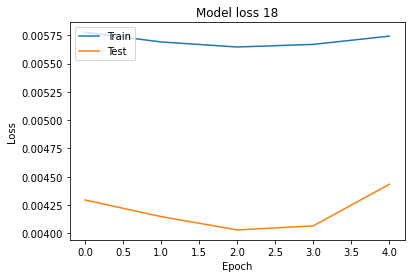

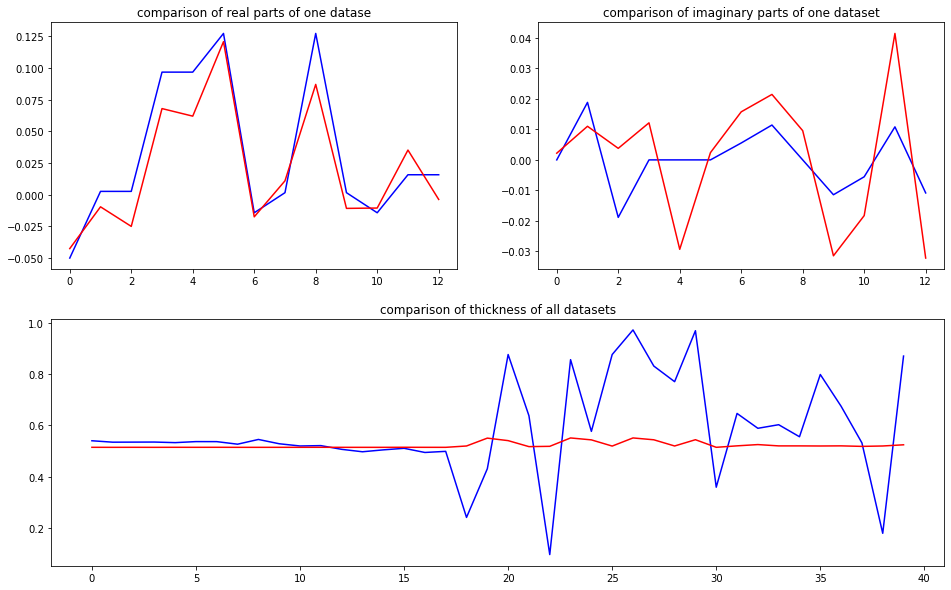

predicted thickness: 0.49487913


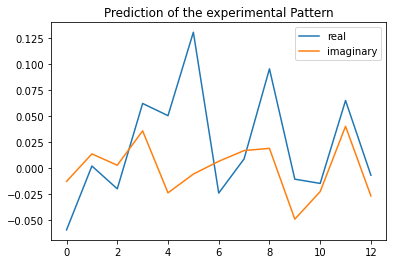

The offset applied on thickness: 4.7621136810295674e-05

The offset applied on Ug: 0.6264206505993133

Applied shift of unit cell origin (fractional coordinates): -0.07590510565166621 -0.006169698232698537
Ug[ 0 ]: 0.05676 3.14159  =>  0.05676 3.14159
Ug[ 1 ]: 0.0101 2.58058  =>  0.0101 2.54181
Ug[ 2 ]: 0.0101 -2.58058  =>  0.0101 -2.54181
Ug[ 3 ]: 0.06626 0.47693  =>  0.06626 0.0
Ug[ 4 ]: 0.06626 -0.47693  =>  0.06626 0.0
Ug[ 5 ]: 0.1215 -0.07753  =>  0.1215 0.0
Ug[ 6 ]: 0.02365 2.48288  =>  0.02365 2.04472
Ug[ 7 ]: 0.03222 1.56457  =>  0.03222 2.08026
Ug[ 8 ]: 0.1215 0.07753  =>  0.1215 0.0
Ug[ 9 ]: 0.03222 -1.56457  =>  0.03222 -2.08026
Ug[ 10 ]: 0.02365 -2.48288  =>  0.02365 -2.04472
Ug[ 11 ]: 0.04698 0.84353  =>  0.04698 1.79738
Ug[ 12 ]: 0.04698 -0.84353  =>  0.04698 -1.79738
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001

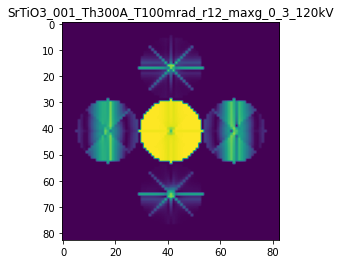

X_sim.max(): 0.999201991565887
>>>replaced the 19. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 870ms/step - loss: 0.0058 - mean_absolute_error: 0.0512 - acc: 0.9300 - val_loss: 0.0039 - val_mean_absolute_error: 0.0396 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 563ms/step - loss: 0.0057 - mean_absolute_error: 0.0517 - acc: 0.9300 - val_loss: 0.0041 - val_mean_absolute_error: 0.0400 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 571ms/step - loss: 0.0057 - mean_absolute_error: 0.0510 - acc: 0.9300 - val_loss: 0.0039 - val_mean_absolute_error: 0.0373 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 582ms/step - loss: 0.0056 - mean_absolute_error: 0.0488 - acc: 0.9300 - val_loss: 0.0039 - val_mean_absolute_error: 0.0383 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 607ms/step - loss: 0.0056 - mean_absolute_error: 0.0494 - acc: 0.9300 - val_loss: 0.0040 - val_mean_absol

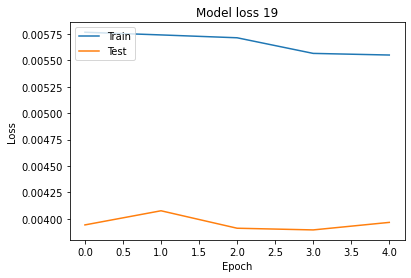

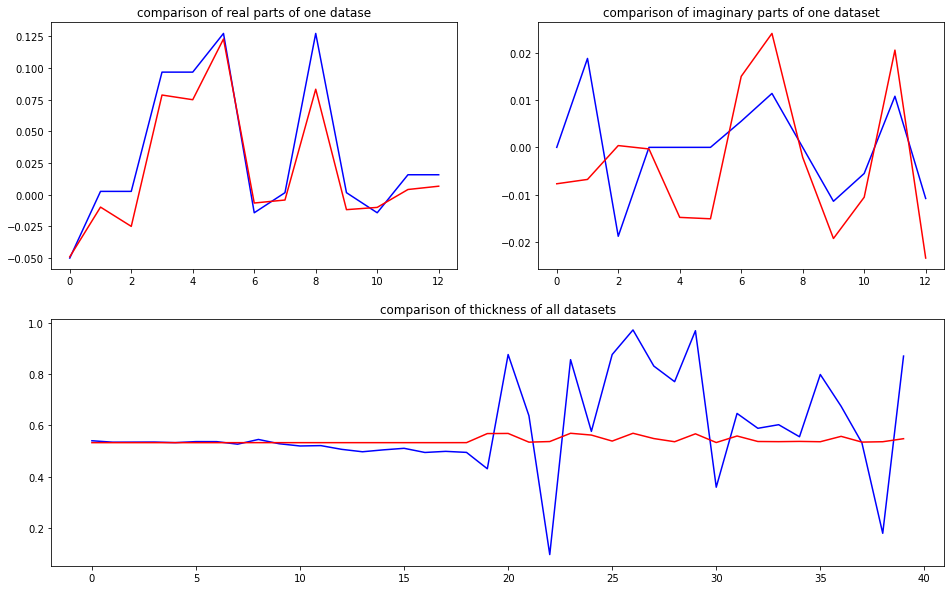

predicted thickness: 0.5057731


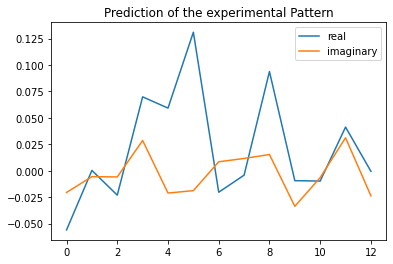

The offset applied on thickness: -0.0009017124799238312

The offset applied on Ug: -1.397285396148997

Applied shift of unit cell origin (fractional coordinates): -0.06250441061011226 -0.01710786153743951
Ug[ 0 ]: 0.06101 3.14159  =>  0.06101 3.14159
Ug[ 1 ]: 0.01185 3.09575  =>  0.01185 2.98825
Ug[ 2 ]: 0.01185 -3.09575  =>  0.01185 -2.98825
Ug[ 3 ]: 0.06257 0.39273  =>  0.06257 0.0
Ug[ 4 ]: 0.06257 -0.39273  =>  0.06257 -0.0
Ug[ 5 ]: 0.09607 -0.21498  =>  0.09607 0.0
Ug[ 6 ]: 0.01712 2.70707  =>  0.01712 2.42183
Ug[ 7 ]: 0.02467 1.8914  =>  0.02467 2.39162
Ug[ 8 ]: 0.09607 0.21498  =>  0.09607 -0.0
Ug[ 9 ]: 0.02467 -1.8914  =>  0.02467 -2.39162
Ug[ 10 ]: 0.01712 -2.70707  =>  0.01712 -2.42183
Ug[ 11 ]: 0.03184 0.96667  =>  0.03184 1.75212
Ug[ 12 ]: 0.03184 -0.96667  =>  0.03184 -1.75212
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrT

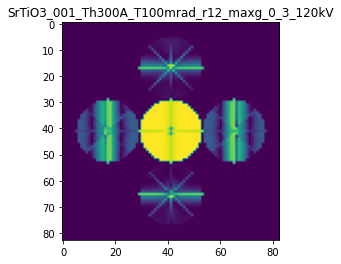

X_sim.max(): 0.9986828576817605
>>>replaced the 20. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 863ms/step - loss: 0.0055 - mean_absolute_error: 0.0489 - acc: 0.9300 - val_loss: 0.0038 - val_mean_absolute_error: 0.0371 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 558ms/step - loss: 0.0055 - mean_absolute_error: 0.0493 - acc: 0.9300 - val_loss: 0.0038 - val_mean_absolute_error: 0.0372 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 567ms/step - loss: 0.0055 - mean_absolute_error: 0.0500 - acc: 0.9300 - val_loss: 0.0038 - val_mean_absolute_error: 0.0376 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 587ms/step - loss: 0.0055 - mean_absolute_error: 0.0502 - acc: 0.9300 - val_loss: 0.0037 - val_mean_absolute_error: 0.0372 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 609ms/step - loss: 0.0055 - mean_absolute_error: 0.0494 - acc: 0.9300 - val_loss: 0.0040 - val_mean_abso

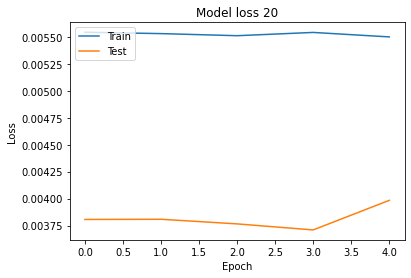

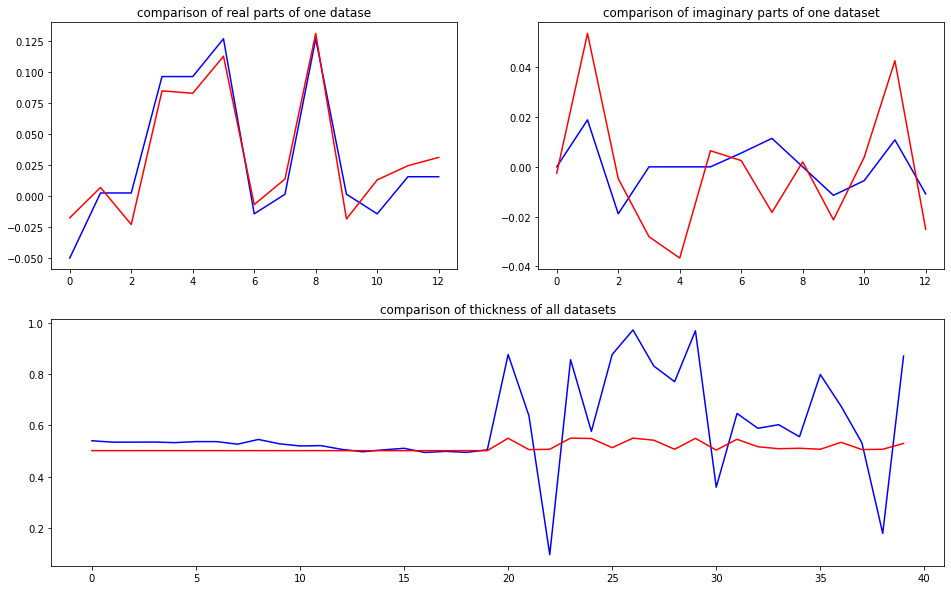

predicted thickness: 0.46413848


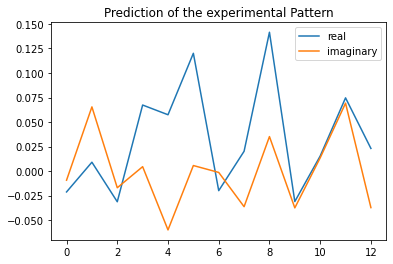

The offset applied on thickness: -0.00018806329549872624

The offset applied on Ug: -2.2625072327196936

Applied shift of unit cell origin (fractional coordinates): -0.09711571954352825 -0.010637016631399468
Ug[ 0 ]: 0.02246 3.14159  =>  0.02246 3.14159
Ug[ 1 ]: 0.04183 2.00148  =>  0.04183 1.93464
Ug[ 2 ]: 0.04183 -2.00148  =>  0.04183 -1.93464
Ug[ 3 ]: 0.06033 0.6102  =>  0.06033 0.0
Ug[ 4 ]: 0.06033 -0.6102  =>  0.06033 0.0
Ug[ 5 ]: 0.09121 -0.13367  =>  0.09121 0.0
Ug[ 6 ]: 0.00814 -1.97509  =>  0.00814 -2.51845
Ug[ 7 ]: 0.01021 2.9548  =>  0.01021 -2.65136
Ug[ 8 ]: 0.09121 0.13367  =>  0.09121 0.0
Ug[ 9 ]: 0.01021 -2.9548  =>  0.01021 2.65136
Ug[ 10 ]: 0.00814 1.97509  =>  0.00814 2.51845
Ug[ 11 ]: 0.05844 0.92905  =>  0.05844 2.14944
Ug[ 12 ]: 0.05844 -0.92905  =>  0.05844 -2.14944
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTi

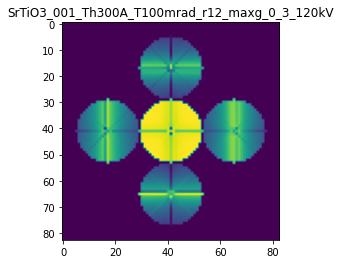

X_sim.max(): 0.9614061633698072
>>>replaced the 21. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 856ms/step - loss: 0.0055 - mean_absolute_error: 0.0495 - acc: 0.9300 - val_loss: 0.0035 - val_mean_absolute_error: 0.0350 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 555ms/step - loss: 0.0054 - mean_absolute_error: 0.0489 - acc: 0.9300 - val_loss: 0.0037 - val_mean_absolute_error: 0.0377 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 566ms/step - loss: 0.0054 - mean_absolute_error: 0.0492 - acc: 0.9300 - val_loss: 0.0035 - val_mean_absolute_error: 0.0357 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 582ms/step - loss: 0.0054 - mean_absolute_error: 0.0489 - acc: 0.9300 - val_loss: 0.0037 - val_mean_absolute_error: 0.0375 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 610ms/step - loss: 0.0054 - mean_absolute_error: 0.0492 - acc: 0.9300 - val_loss: 0.0035 - val_mean_abso

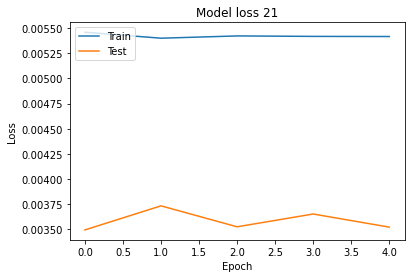

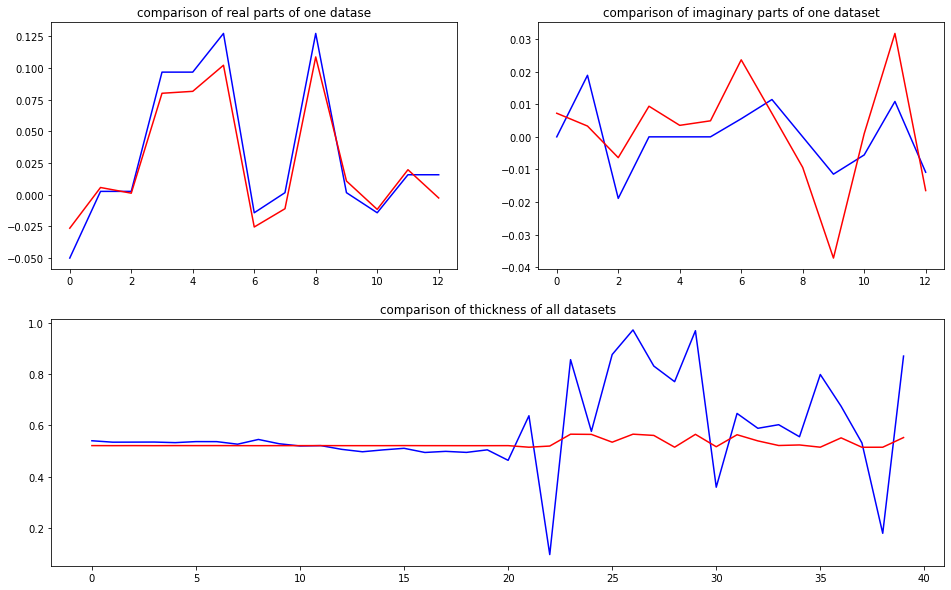

predicted thickness: 0.48159662


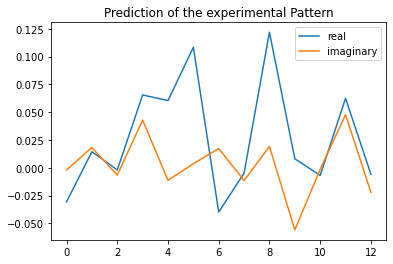

The offset applied on thickness: -1.7169887103711145e-05

The offset applied on Ug: -0.5338978600030224

Applied shift of unit cell origin (fractional coordinates): -0.06590210660683958 -0.005149632388733344
Ug[ 0 ]: 0.03117 3.14159  =>  0.03117 3.14159
Ug[ 1 ]: 0.01368 1.11207  =>  0.01368 1.07972
Ug[ 2 ]: 0.01368 -1.11207  =>  0.01368 -1.07972
Ug[ 3 ]: 0.06585 0.41408  =>  0.06585 -0.0
Ug[ 4 ]: 0.06585 -0.41408  =>  0.06585 0.0
Ug[ 5 ]: 0.10814 -0.06471  =>  0.10814 0.0
Ug[ 6 ]: 0.02554 2.78791  =>  0.02554 2.40619
Ug[ 7 ]: 0.02303 1.53924  =>  0.02303 1.98567
Ug[ 8 ]: 0.10814 0.06471  =>  0.10814 0.0
Ug[ 9 ]: 0.02303 -1.53924  =>  0.02303 -1.98567
Ug[ 10 ]: 0.02554 -2.78791  =>  0.02554 -2.40619
Ug[ 11 ]: 0.0427 0.90213  =>  0.0427 1.73028
Ug[ 12 ]: 0.0427 -0.90213  =>  0.0427 -1.73028
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrT

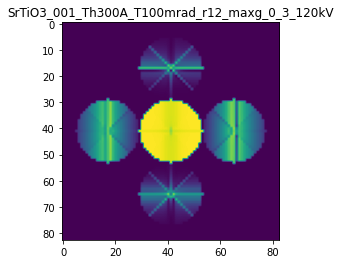

X_sim.max(): 0.9921841642449416
>>>replaced the 22. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 950ms/step - loss: 0.0054 - mean_absolute_error: 0.0494 - acc: 0.9300 - val_loss: 0.0035 - val_mean_absolute_error: 0.0346 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 546ms/step - loss: 0.0054 - mean_absolute_error: 0.0497 - acc: 0.9300 - val_loss: 0.0035 - val_mean_absolute_error: 0.0349 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 552ms/step - loss: 0.0054 - mean_absolute_error: 0.0491 - acc: 0.9300 - val_loss: 0.0036 - val_mean_absolute_error: 0.0354 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 568ms/step - loss: 0.0054 - mean_absolute_error: 0.0493 - acc: 0.9300 - val_loss: 0.0037 - val_mean_absolute_error: 0.0385 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 590ms/step - loss: 0.0054 - mean_absolute_error: 0.0504 - acc: 0.9300 - val_loss: 0.0035 - val_mean_abso

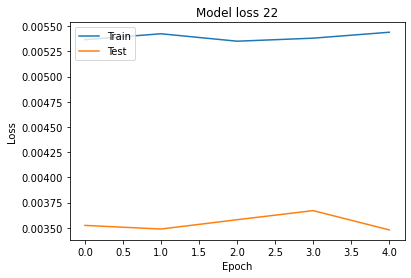

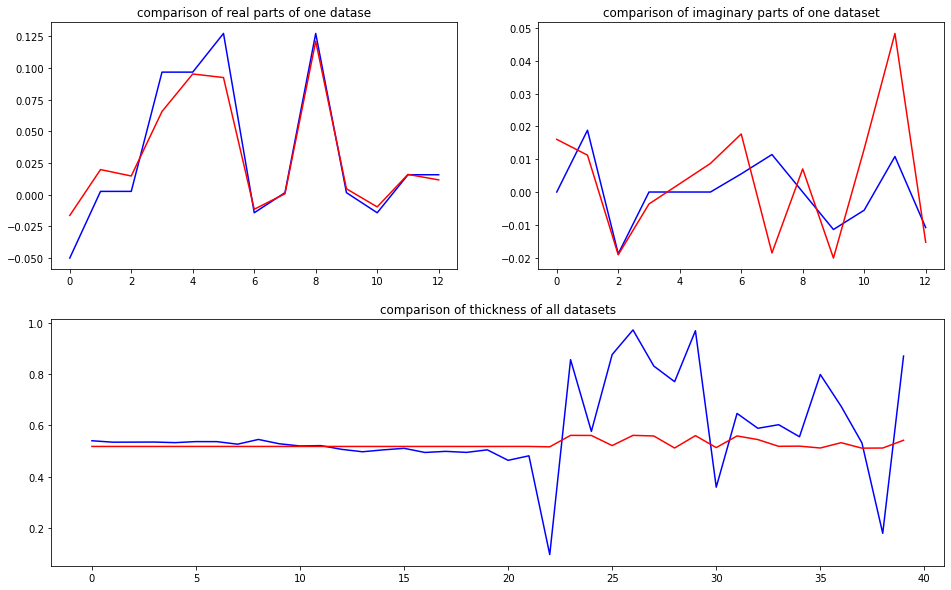

predicted thickness: 0.48366937


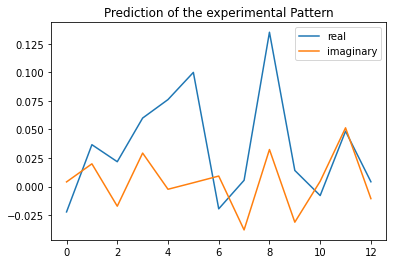

The offset applied on thickness: 0.00031527538105042006

The offset applied on Ug: -3.428791300890784

Applied shift of unit cell origin (fractional coordinates): -0.04997880953661835 -0.014055811984493719
Ug[ 0 ]: 0.02401 3.14159  =>  0.02401 3.14159
Ug[ 1 ]: 0.03037 0.61048  =>  0.03037 0.52216
Ug[ 2 ]: 0.03037 -0.61048  =>  0.03037 -0.52216
Ug[ 3 ]: 0.05308 0.31403  =>  0.05308 -0.0
Ug[ 4 ]: 0.05308 -0.31403  =>  0.05308 0.0
Ug[ 5 ]: 0.06836 -0.17663  =>  0.06836 0.0
Ug[ 6 ]: 0.01475 3.03861  =>  0.01475 2.8129
Ug[ 7 ]: 0.00659 -0.65593  =>  0.00659 -0.25358
Ug[ 8 ]: 0.06836 0.17663  =>  0.06836 0.0
Ug[ 9 ]: 0.00659 0.65593  =>  0.00659 0.25358
Ug[ 10 ]: 0.01475 -3.03861  =>  0.01475 -2.8129
Ug[ 11 ]: 0.03055 0.95971  =>  0.03055 1.58776
Ug[ 12 ]: 0.03055 -0.95971  =>  0.03055 -1.58776
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrT

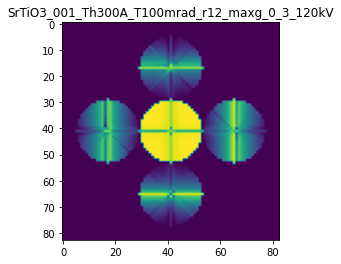

X_sim.max(): 0.9904361546504108
>>>replaced the 23. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 852ms/step - loss: 0.0052 - mean_absolute_error: 0.0490 - acc: 0.9300 - val_loss: 0.0034 - val_mean_absolute_error: 0.0348 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 3s 627ms/step - loss: 0.0052 - mean_absolute_error: 0.0483 - acc: 0.9300 - val_loss: 0.0034 - val_mean_absolute_error: 0.0366 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 574ms/step - loss: 0.0052 - mean_absolute_error: 0.0484 - acc: 0.9300 - val_loss: 0.0033 - val_mean_absolute_error: 0.0342 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 3s 595ms/step - loss: 0.0051 - mean_absolute_error: 0.0478 - acc: 0.9300 - val_loss: 0.0035 - val_mean_absolute_error: 0.0357 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 3s 606ms/step - loss: 0.0051 - mean_absolute_error: 0.0477 - acc: 0.9300 - val_loss: 0.0032 - val_mean_abso

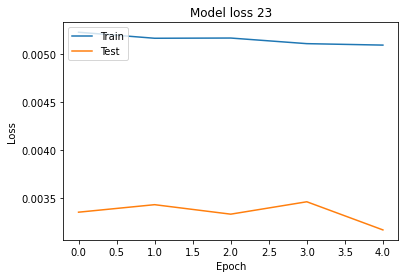

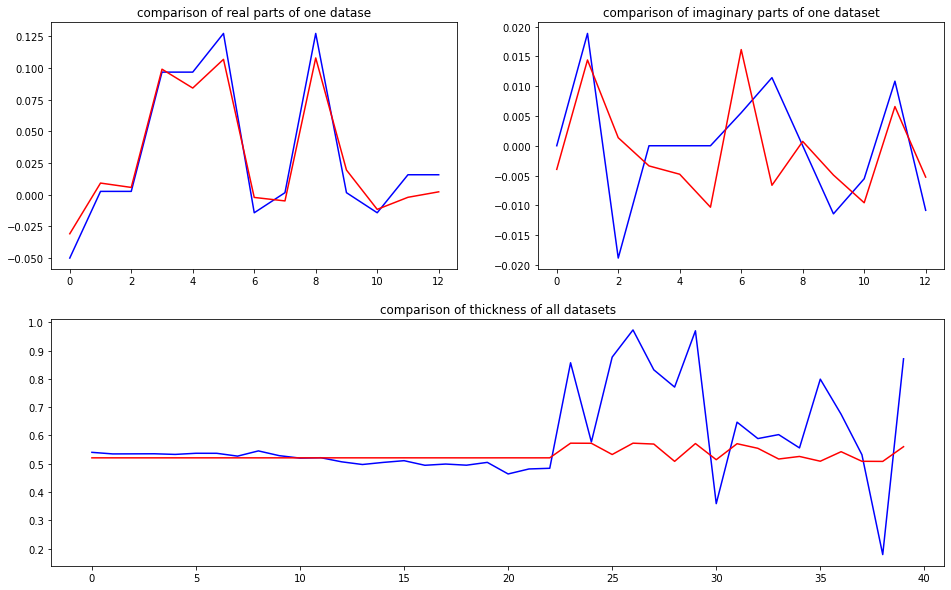

predicted thickness: 0.47754562


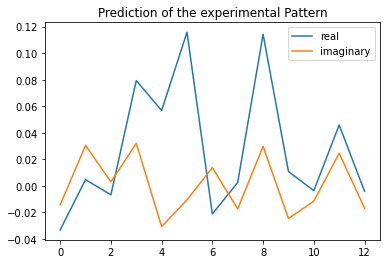

The offset applied on thickness: -0.0009236339548390475

The offset applied on Ug: 1.8219908628287398

Applied shift of unit cell origin (fractional coordinates): -0.06750023278633821 -0.011668763033555794
Ug[ 0 ]: 0.03086 3.14159  =>  0.03086 3.14159
Ug[ 1 ]: 0.01459 1.58206  =>  0.01459 1.50875
Ug[ 2 ]: 0.01459 -1.58206  =>  0.01459 -1.50875
Ug[ 3 ]: 0.08613 0.42412  =>  0.08613 0.0
Ug[ 4 ]: 0.08613 -0.42412  =>  0.08613 0.0
Ug[ 5 ]: 0.14151 -0.14663  =>  0.14151 0.0
Ug[ 6 ]: 0.01755 2.3024  =>  0.01755 1.9516
Ug[ 7 ]: 0.0083 0.39758  =>  0.0083 0.89501
Ug[ 8 ]: 0.14151 0.14663  =>  0.14151 -0.0
Ug[ 9 ]: 0.0083 -0.39758  =>  0.0083 -0.89501
Ug[ 10 ]: 0.01755 -2.3024  =>  0.01755 -1.9516
Ug[ 11 ]: 0.03317 0.77929  =>  0.03317 1.62752
Ug[ 12 ]: 0.03317 -0.77929  =>  0.03317 -1.62752
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_00

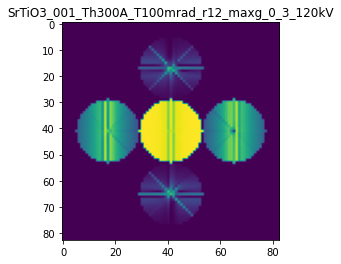

X_sim.max(): 0.9826442290560345
>>>replaced the 24. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 860ms/step - loss: 0.0051 - mean_absolute_error: 0.0478 - acc: 0.9300 - val_loss: 0.0033 - val_mean_absolute_error: 0.0364 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 3s 556ms/step - loss: 0.0052 - mean_absolute_error: 0.0489 - acc: 0.9300 - val_loss: 0.0032 - val_mean_absolute_error: 0.0339 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 566ms/step - loss: 0.0051 - mean_absolute_error: 0.0477 - acc: 0.9300 - val_loss: 0.0030 - val_mean_absolute_error: 0.0319 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 3s 590ms/step - loss: 0.0051 - mean_absolute_error: 0.0480 - acc: 0.9300 - val_loss: 0.0030 - val_mean_absolute_error: 0.0323 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 3s 601ms/step - loss: 0.0051 - mean_absolute_error: 0.0477 - acc: 0.9300 - val_loss: 0.0036 - val_mean_abso

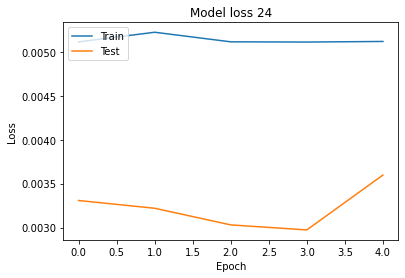

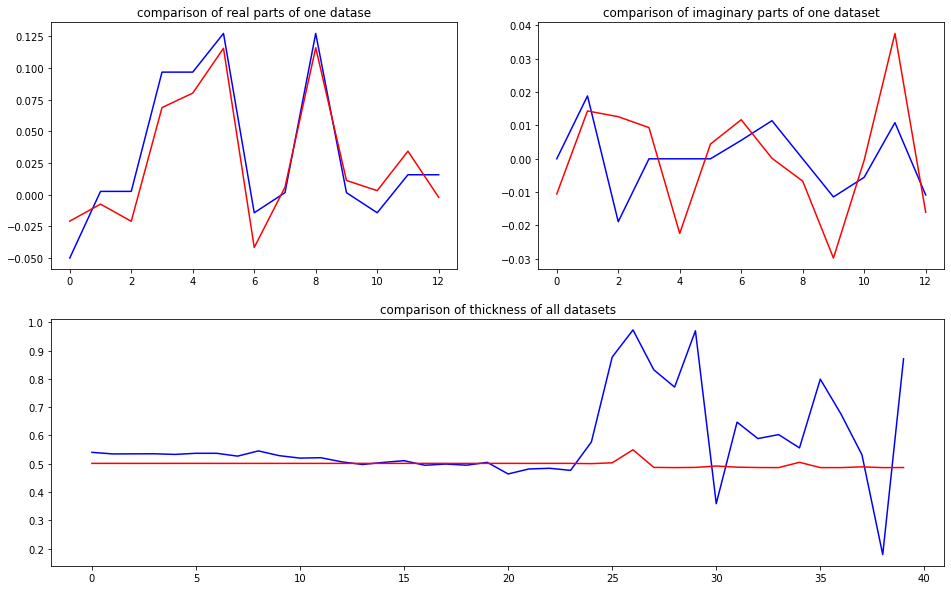

predicted thickness: 0.46075812


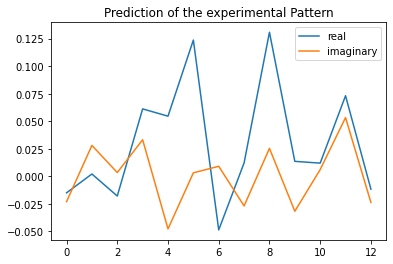

The offset applied on thickness: -0.0007359684861406415

The offset applied on Ug: -3.579228873942292

Applied shift of unit cell origin (fractional coordinates): -0.12804467577445314 -0.012032412574960162
Ug[ 0 ]: 0.01761 3.14159  =>  0.01761 3.14159
Ug[ 1 ]: 0.01517 2.2772  =>  0.01517 2.20159
Ug[ 2 ]: 0.01517 -2.2772  =>  0.01517 -2.20159
Ug[ 3 ]: 0.05742 0.80453  =>  0.05742 0.0
Ug[ 4 ]: 0.05742 -0.80453  =>  0.05742 -0.0
Ug[ 5 ]: 0.06885 -0.1512  =>  0.06885 0.0
Ug[ 6 ]: 0.02337 -2.95971  =>  0.02337 2.59455
Ug[ 7 ]: 0.00967 0.30619  =>  0.00967 1.18632
Ug[ 8 ]: 0.06885 0.1512  =>  0.06885 -0.0
Ug[ 9 ]: 0.00967 -0.30619  =>  0.00967 -1.18632
Ug[ 10 ]: 0.02337 2.95971  =>  0.02337 -2.59455
Ug[ 11 ]: 0.03468 1.1275  =>  0.03468 2.73656
Ug[ 12 ]: 0.03468 -1.1275  =>  0.03468 -2.73656
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3

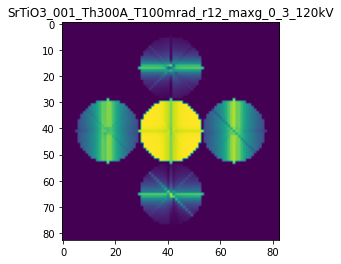

X_sim.max(): 0.9842980196146811
>>>replaced the 25. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 868ms/step - loss: 0.0051 - mean_absolute_error: 0.0478 - acc: 0.9300 - val_loss: 0.0030 - val_mean_absolute_error: 0.0324 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 3s 557ms/step - loss: 0.0049 - mean_absolute_error: 0.0467 - acc: 0.9300 - val_loss: 0.0030 - val_mean_absolute_error: 0.0314 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 566ms/step - loss: 0.0049 - mean_absolute_error: 0.0466 - acc: 0.9300 - val_loss: 0.0031 - val_mean_absolute_error: 0.0342 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 3s 588ms/step - loss: 0.0050 - mean_absolute_error: 0.0470 - acc: 0.9300 - val_loss: 0.0029 - val_mean_absolute_error: 0.0308 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 3s 678ms/step - loss: 0.0050 - mean_absolute_error: 0.0470 - acc: 0.9300 - val_loss: 0.0031 - val_mean_abso

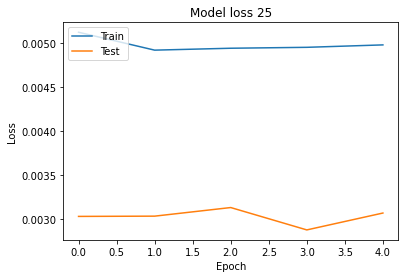

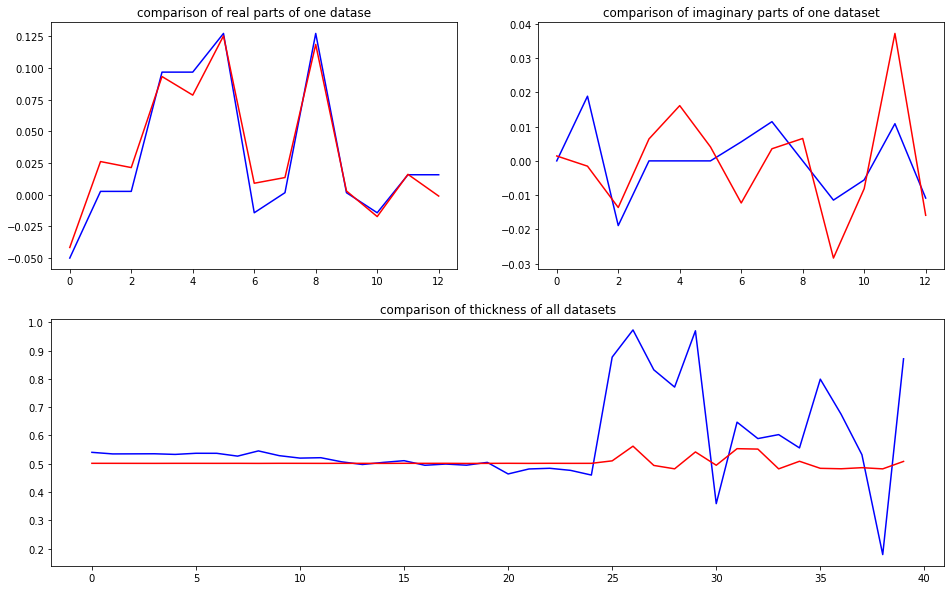

predicted thickness: 0.45516145


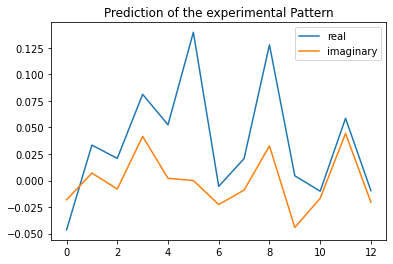

The offset applied on thickness: 0.0009410019294734342

The offset applied on Ug: -2.0009221076405654

Applied shift of unit cell origin (fractional coordinates): -0.044604572933008874 -0.013613353200615921
Ug[ 0 ]: 0.05151 3.14159  =>  0.05151 3.14159
Ug[ 1 ]: 0.02639 0.26762  =>  0.02639 0.18209
Ug[ 2 ]: 0.02639 -0.26762  =>  0.02639 -0.18209
Ug[ 3 ]: 0.05803 0.28026  =>  0.05803 -0.0
Ug[ 4 ]: 0.05803 -0.28026  =>  0.05803 0.0
Ug[ 5 ]: 0.09826 -0.17107  =>  0.09826 0.0
Ug[ 6 ]: 0.00923 -2.80004  =>  0.00923 -2.99477
Ug[ 7 ]: 0.0216 1.08551  =>  0.0216 1.45131
Ug[ 8 ]: 0.09826 0.17107  =>  0.09826 0.0
Ug[ 9 ]: 0.0216 -1.08551  =>  0.0216 -1.45131
Ug[ 10 ]: 0.00923 2.80004  =>  0.00923 2.99477
Ug[ 11 ]: 0.0342 0.99498  =>  0.0342 1.5555
Ug[ 12 ]: 0.0342 -0.99498  =>  0.0342 -1.5555
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001

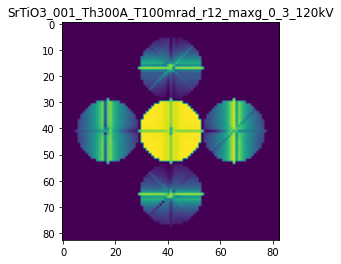

X_sim.max(): 0.9822603957220243
>>>replaced the 26. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 863ms/step - loss: 0.0049 - mean_absolute_error: 0.0467 - acc: 0.9300 - val_loss: 0.0031 - val_mean_absolute_error: 0.0351 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 3s 556ms/step - loss: 0.0048 - mean_absolute_error: 0.0465 - acc: 0.9300 - val_loss: 0.0028 - val_mean_absolute_error: 0.0299 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 562ms/step - loss: 0.0048 - mean_absolute_error: 0.0462 - acc: 0.9300 - val_loss: 0.0028 - val_mean_absolute_error: 0.0338 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 3s 581ms/step - loss: 0.0050 - mean_absolute_error: 0.0478 - acc: 0.9300 - val_loss: 0.0030 - val_mean_absolute_error: 0.0323 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 4s 782ms/step - loss: 0.0049 - mean_absolute_error: 0.0463 - acc: 0.9300 - val_loss: 0.0029 - val_mean_abso

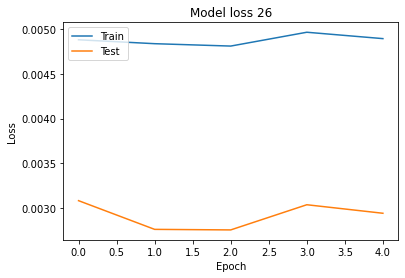

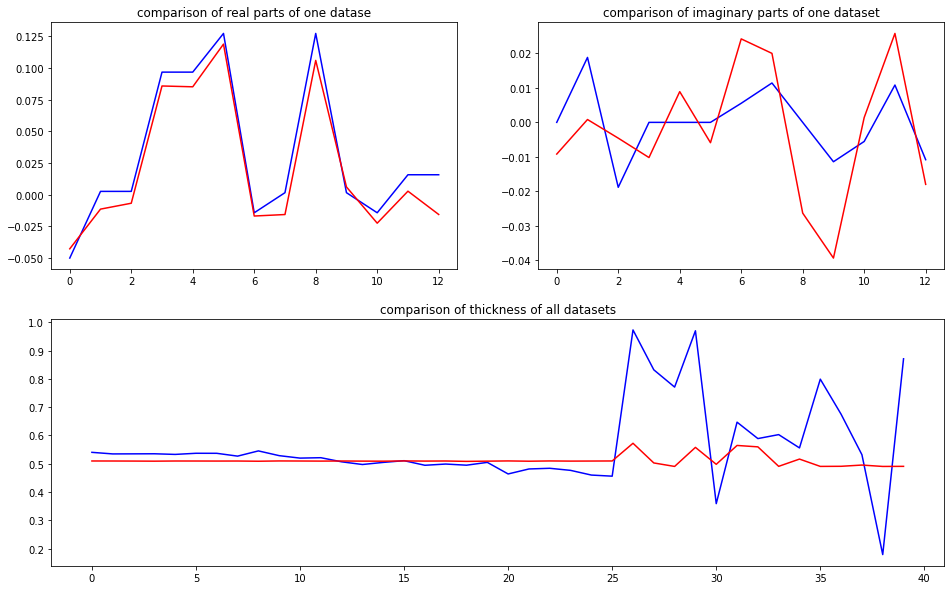

predicted thickness: 0.4485279


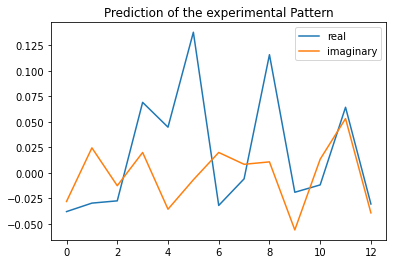

The offset applied on thickness: 1.261084817031488e-05

The offset applied on Ug: 1.8881810623242075

Applied shift of unit cell origin (fractional coordinates): -0.06976515518690483 0.0004036406731321654
Ug[ 0 ]: 0.03382 3.14159  =>  0.03382 3.14159
Ug[ 1 ]: 0.03251 2.51633  =>  0.03251 2.51887
Ug[ 2 ]: 0.03251 -2.51633  =>  0.03251 -2.51887
Ug[ 3 ]: 0.0716 0.43835  =>  0.0716 -0.0
Ug[ 4 ]: 0.0716 -0.43835  =>  0.0716 0.0
Ug[ 5 ]: 0.15745 0.00507  =>  0.15745 -0.0
Ug[ 6 ]: 0.02073 2.93743  =>  0.02073 2.49654
Ug[ 7 ]: 0.03054 1.8742  =>  0.03054 2.31001
Ug[ 8 ]: 0.15745 -0.00507  =>  0.15745 0.0
Ug[ 9 ]: 0.03054 -1.8742  =>  0.03054 -2.31001
Ug[ 10 ]: 0.02073 -2.93743  =>  0.02073 -2.49654
Ug[ 11 ]: 0.05838 1.11481  =>  0.05838 1.9915
Ug[ 12 ]: 0.05838 -1.11481  =>  0.05838 -1.9915
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_00

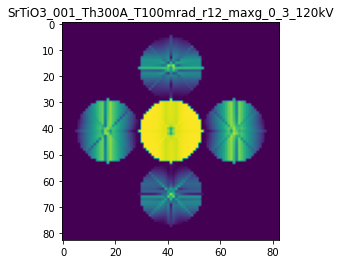

X_sim.max(): 0.9847453762753439
>>>replaced the 27. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 845ms/step - loss: 0.0048 - mean_absolute_error: 0.0467 - acc: 0.9300 - val_loss: 0.0026 - val_mean_absolute_error: 0.0315 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 3s 551ms/step - loss: 0.0049 - mean_absolute_error: 0.0471 - acc: 0.9300 - val_loss: 0.0028 - val_mean_absolute_error: 0.0326 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 564ms/step - loss: 0.0048 - mean_absolute_error: 0.0471 - acc: 0.9300 - val_loss: 0.0028 - val_mean_absolute_error: 0.0329 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 3s 578ms/step - loss: 0.0048 - mean_absolute_error: 0.0459 - acc: 0.9300 - val_loss: 0.0024 - val_mean_absolute_error: 0.0300 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 3s 767ms/step - loss: 0.0048 - mean_absolute_error: 0.0460 - acc: 0.9300 - val_loss: 0.0026 - val_mean_abso

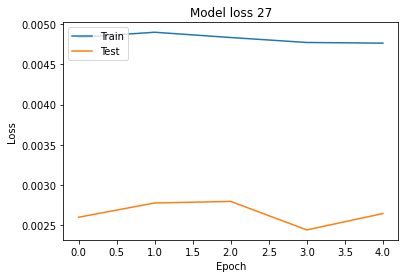

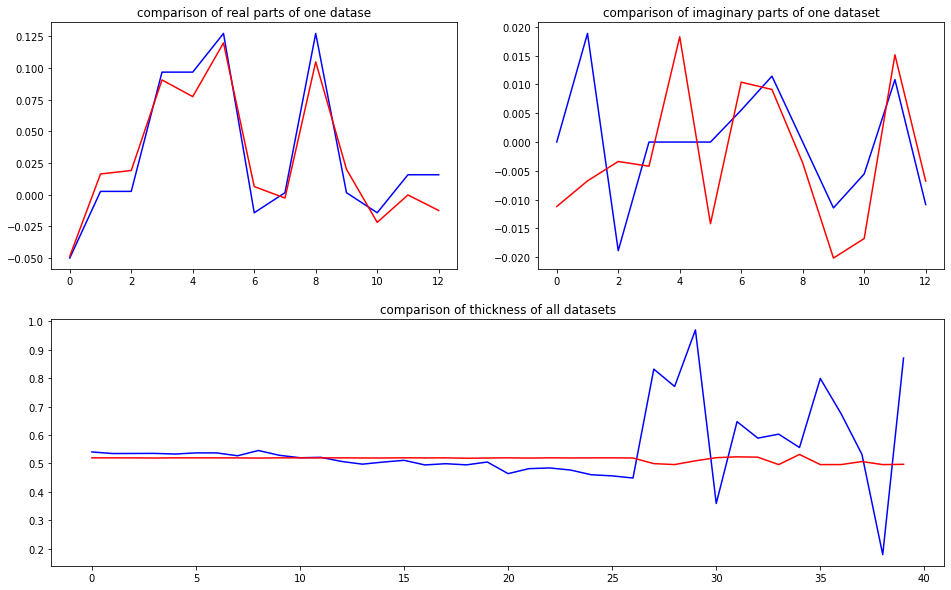

predicted thickness: 0.46752384


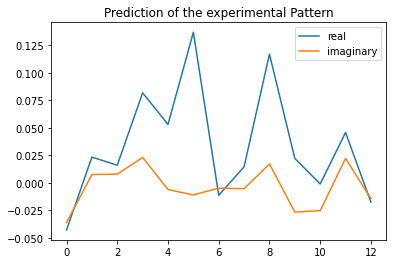

The offset applied on thickness: 0.00033708643798812353

The offset applied on Ug: -1.2086786592961039

Applied shift of unit cell origin (fractional coordinates): -0.03228423163872171 -0.011676420684093988
Ug[ 0 ]: 0.04673 3.14159  =>  0.04673 3.14159
Ug[ 1 ]: 0.01906 -0.01855  =>  0.01906 -0.09192
Ug[ 2 ]: 0.01906 0.01855  =>  0.01906 0.09192
Ug[ 3 ]: 0.06258 0.20285  =>  0.06258 0.0
Ug[ 4 ]: 0.06258 -0.20285  =>  0.06258 0.0
Ug[ 5 ]: 0.1082 -0.14673  =>  0.1082 0.0
Ug[ 6 ]: 0.01249 2.14434  =>  0.01249 2.01486
Ug[ 7 ]: 0.02072 0.57132  =>  0.02072 0.84753
Ug[ 8 ]: 0.1082 0.14673  =>  0.1082 0.0
Ug[ 9 ]: 0.02072 -0.57132  =>  0.02072 -0.84753
Ug[ 10 ]: 0.01249 -2.14434  =>  0.01249 -2.01486
Ug[ 11 ]: 0.0211 0.958  =>  0.0211 1.36369
Ug[ 12 ]: 0.0211 -0.958  =>  0.0211 -1.36369
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th

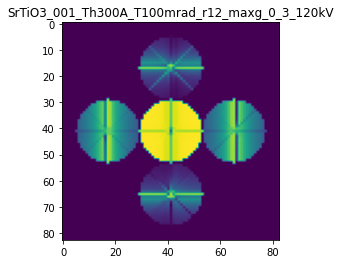

X_sim.max(): 0.9758442288880648
>>>replaced the 28. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 850ms/step - loss: 0.0047 - mean_absolute_error: 0.0453 - acc: 0.9300 - val_loss: 0.0022 - val_mean_absolute_error: 0.0259 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 3s 560ms/step - loss: 0.0047 - mean_absolute_error: 0.0454 - acc: 0.9300 - val_loss: 0.0021 - val_mean_absolute_error: 0.0275 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 642ms/step - loss: 0.0047 - mean_absolute_error: 0.0455 - acc: 0.9300 - val_loss: 0.0026 - val_mean_absolute_error: 0.0294 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 4s 845ms/step - loss: 0.0048 - mean_absolute_error: 0.0468 - acc: 0.9300 - val_loss: 0.0025 - val_mean_absolute_error: 0.0311 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 2s 956ms/step - loss: 0.0048 - mean_absolute_error: 0.0467 - acc: 0.9300 - val_loss: 0.0024 - val_mean_abso

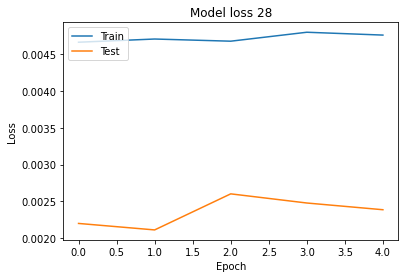

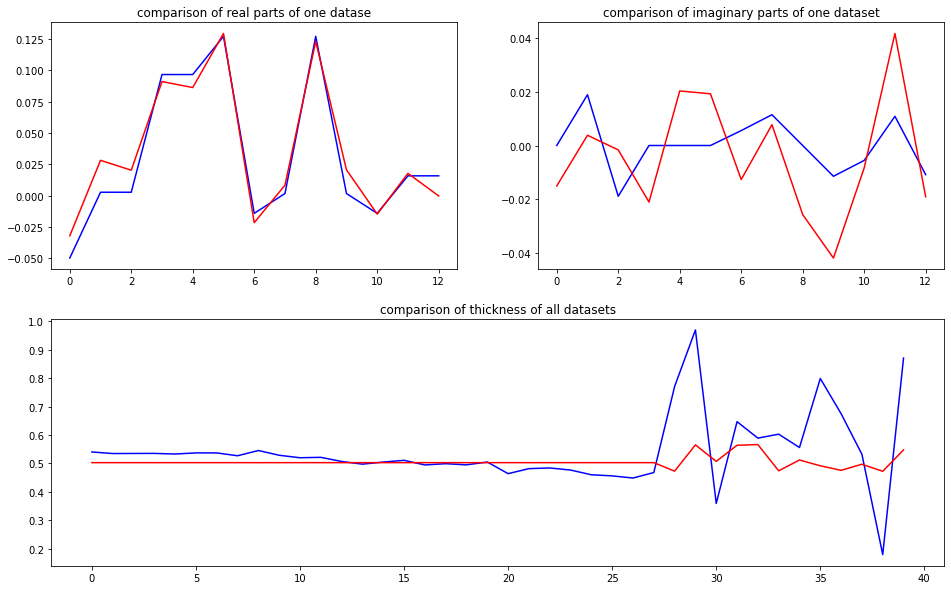

predicted thickness: 0.42972928


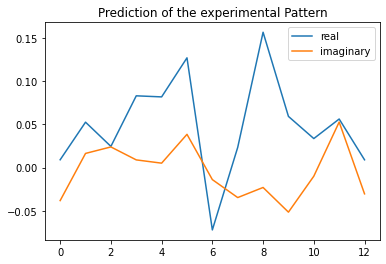

The offset applied on thickness: 0.0007447644923774386

The offset applied on Ug: -3.640161750299713

Applied shift of unit cell origin (fractional coordinates): -0.004784925131760978 0.0344456042126599
Ug[ 0 ]: 0.00348 0.0  =>  0.00348 0.0
Ug[ 1 ]: 0.03145 -0.17914  =>  0.03145 0.03728
Ug[ 2 ]: 0.03145 0.17914  =>  0.03145 -0.03728
Ug[ 3 ]: 0.0576 0.03006  =>  0.0576 -0.0
Ug[ 4 ]: 0.0576 -0.03006  =>  0.0576 0.0
Ug[ 5 ]: 0.07064 0.43286  =>  0.07064 -0.0
Ug[ 6 ]: 0.03519 -2.67049  =>  0.03519 -2.91698
Ug[ 7 ]: 0.02995 0.4504  =>  0.02995 0.26404
Ug[ 8 ]: 0.07064 -0.43286  =>  0.07064 0.0
Ug[ 9 ]: 0.02995 -0.4504  =>  0.02995 -0.26404
Ug[ 10 ]: 0.03519 2.67049  =>  0.03519 2.91698
Ug[ 11 ]: 0.04125 1.06436  =>  0.04125 1.12449
Ug[ 12 ]: 0.04125 -1.06436  =>  0.04125 -1.12449
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A

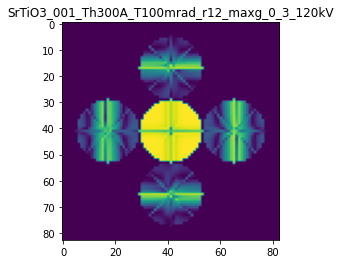

X_sim.max(): 0.9993650181593903
>>>replaced the 29. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 926ms/step - loss: 0.0047 - mean_absolute_error: 0.0465 - acc: 0.9300 - val_loss: 0.0027 - val_mean_absolute_error: 0.0335 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 3s 544ms/step - loss: 0.0048 - mean_absolute_error: 0.0471 - acc: 0.9300 - val_loss: 0.0022 - val_mean_absolute_error: 0.0305 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 557ms/step - loss: 0.0047 - mean_absolute_error: 0.0464 - acc: 0.9300 - val_loss: 0.0023 - val_mean_absolute_error: 0.0271 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 3s 772ms/step - loss: 0.0047 - mean_absolute_error: 0.0463 - acc: 0.9300 - val_loss: 0.0021 - val_mean_absolute_error: 0.0279 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 3s 544ms/step - loss: 0.0047 - mean_absolute_error: 0.0471 - acc: 0.9300 - val_loss: 0.0025 - val_mean_abso

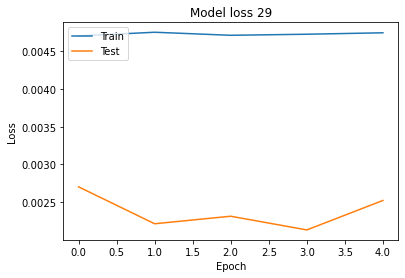

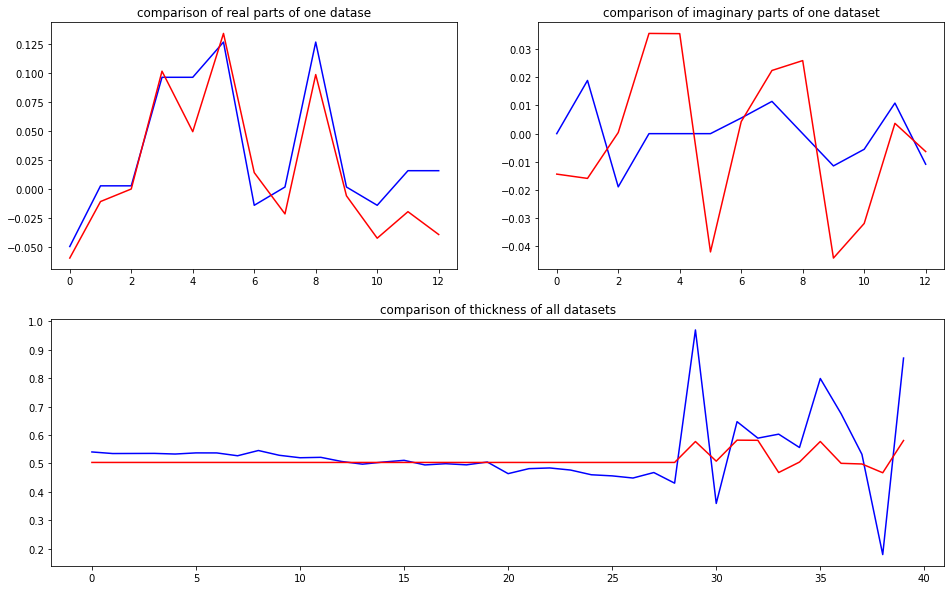

predicted thickness: 0.413495


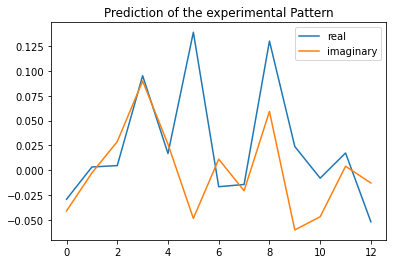

The offset applied on thickness: 6.986124164896546e-05

The offset applied on Ug: 1.7210162092260273

Applied shift of unit cell origin (fractional coordinates): -0.09903557374168147 -0.023353535515723722
Ug[ 0 ]: 0.02493 3.14159  =>  0.02493 3.14159
Ug[ 1 ]: 0.01714 -1.29841  =>  0.01714 -1.44514
Ug[ 2 ]: 0.01714 1.29841  =>  0.01714 1.44514
Ug[ 3 ]: 0.088 0.62226  =>  0.088 0.0
Ug[ 4 ]: 0.088 -0.62226  =>  0.088 0.0
Ug[ 5 ]: 0.17838 -0.29347  =>  0.17838 0.0
Ug[ 6 ]: 0.02925 1.92375  =>  0.02925 1.44822
Ug[ 7 ]: 0.01854 1.07411  =>  0.01854 1.8431
Ug[ 8 ]: 0.17838 0.29347  =>  0.17838 0.0
Ug[ 9 ]: 0.01854 -1.07411  =>  0.01854 -1.8431
Ug[ 10 ]: 0.02925 -1.92375  =>  0.02925 -1.44822
Ug[ 11 ]: 0.01611 2.71363  =>  0.01611 -2.32503
Ug[ 12 ]: 0.01611 -2.71363  =>  0.01611 2.32503
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th

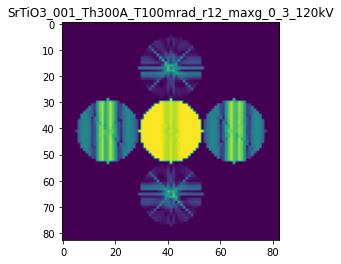

X_sim.max(): 0.9948896454243391
>>>replaced the 30. dataset and train: 
Epoch 1/5
5/5 [==============================] - 8s 950ms/step - loss: 0.0049 - mean_absolute_error: 0.0486 - acc: 0.9300 - val_loss: 0.0021 - val_mean_absolute_error: 0.0283 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 3s 552ms/step - loss: 0.0047 - mean_absolute_error: 0.0468 - acc: 0.9300 - val_loss: 0.0020 - val_mean_absolute_error: 0.0300 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 615ms/step - loss: 0.0047 - mean_absolute_error: 0.0466 - acc: 0.9300 - val_loss: 0.0019 - val_mean_absolute_error: 0.0263 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 3s 597ms/step - loss: 0.0045 - mean_absolute_error: 0.0450 - acc: 0.9300 - val_loss: 0.0021 - val_mean_absolute_error: 0.0270 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 3s 670ms/step - loss: 0.0046 - mean_absolute_error: 0.0452 - acc: 0.9300 - val_loss: 0.0021 - val_mean_abso

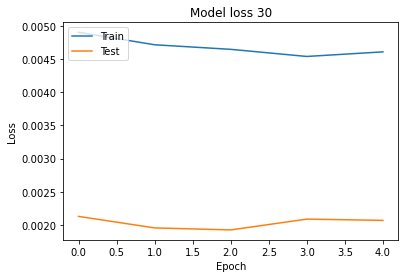

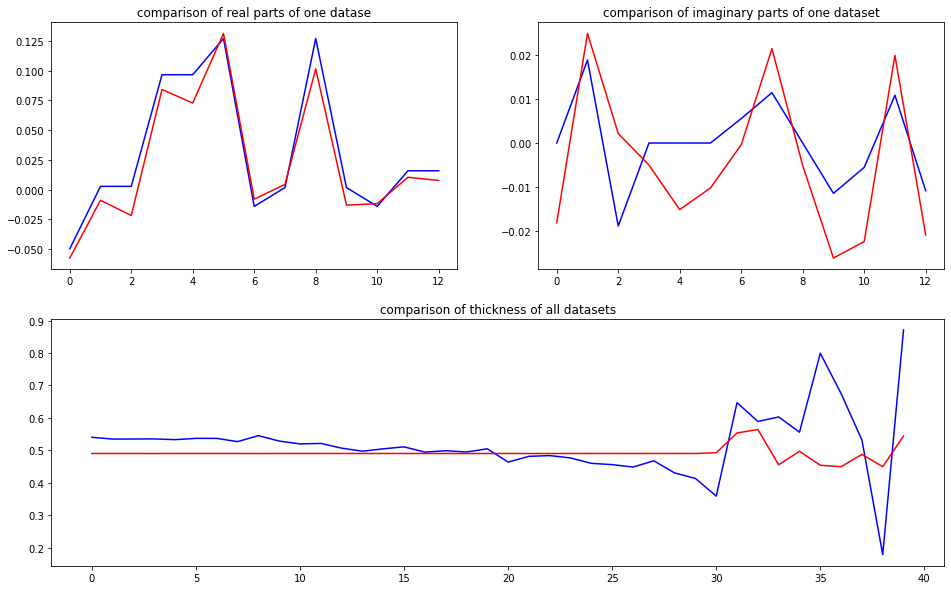

predicted thickness: 0.40200812


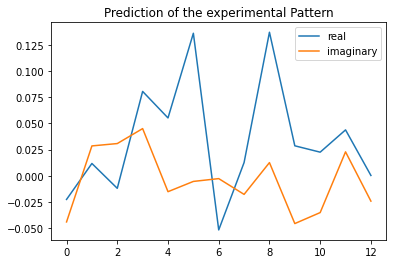

The offset applied on thickness: -0.0008746897989216406

The offset applied on Ug: 0.7749350840245044

Applied shift of unit cell origin (fractional coordinates): -0.06704723523433487 -0.00483268381469831
Ug[ 0 ]: 0.02069 3.14159  =>  0.02069 3.14159
Ug[ 1 ]: 0.00134 -1.04842  =>  0.00134 -1.07879
Ug[ 2 ]: 0.00134 1.04842  =>  0.00134 1.07879
Ug[ 3 ]: 0.07942 0.42127  =>  0.07942 -0.0
Ug[ 4 ]: 0.07942 -0.42127  =>  0.07942 0.0
Ug[ 5 ]: 0.1514 -0.06073  =>  0.1514 0.0
Ug[ 6 ]: 0.0209 2.23385  =>  0.0209 1.84295
Ug[ 7 ]: 0.02548 0.53311  =>  0.02548 0.98475
Ug[ 8 ]: 0.1514 0.06073  =>  0.1514 -0.0
Ug[ 9 ]: 0.02548 -0.53311  =>  0.02548 -0.98475
Ug[ 10 ]: 0.0209 -2.23385  =>  0.0209 -1.84295
Ug[ 11 ]: 0.03364 0.80837  =>  0.03364 1.65091
Ug[ 12 ]: 0.03364 -0.80837  =>  0.03364 -1.65091
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_00

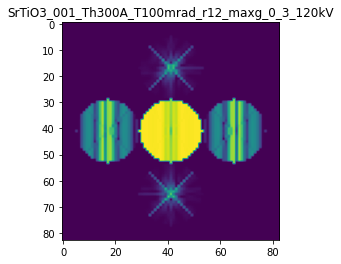

X_sim.max(): 0.9987464774739578
>>>replaced the 31. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 984ms/step - loss: 0.0046 - mean_absolute_error: 0.0452 - acc: 0.9300 - val_loss: 0.0017 - val_mean_absolute_error: 0.0256 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 3s 625ms/step - loss: 0.0045 - mean_absolute_error: 0.0448 - acc: 0.9300 - val_loss: 0.0017 - val_mean_absolute_error: 0.0244 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 659ms/step - loss: 0.0045 - mean_absolute_error: 0.0452 - acc: 0.9300 - val_loss: 0.0017 - val_mean_absolute_error: 0.0257 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 3s 625ms/step - loss: 0.0045 - mean_absolute_error: 0.0452 - acc: 0.9300 - val_loss: 0.0017 - val_mean_absolute_error: 0.0262 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 3s 598ms/step - loss: 0.0044 - mean_absolute_error: 0.0446 - acc: 0.9300 - val_loss: 0.0020 - val_mean_abso

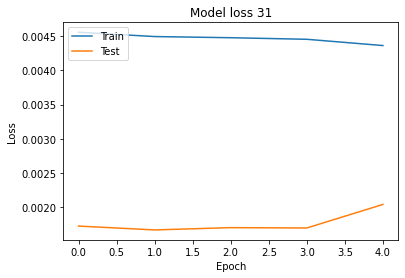

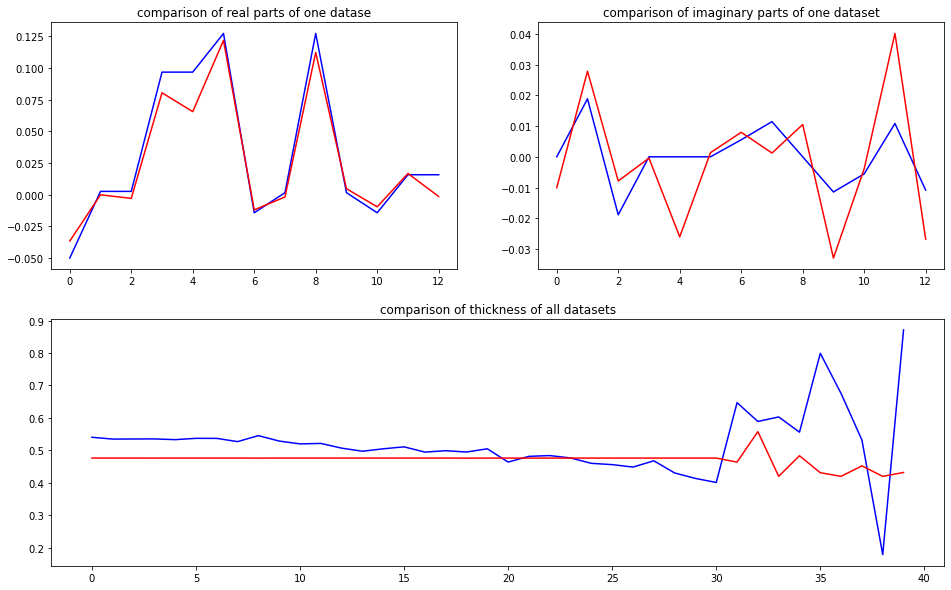

predicted thickness: 0.37512082


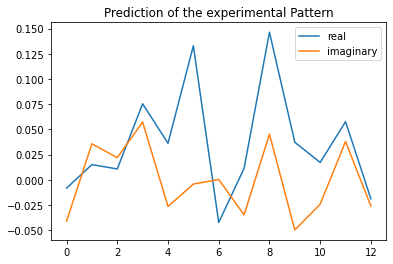

The offset applied on thickness: -0.0003453252005500074

The offset applied on Ug: 2.338453758388182

Applied shift of unit cell origin (fractional coordinates): -0.10572559947850878 -0.016294440373665488
Ug[ 0 ]: 0.00416 3.14159  =>  0.00416 3.14159
Ug[ 1 ]: 0.01739 0.47837  =>  0.01739 0.37599
Ug[ 2 ]: 0.01739 -0.47837  =>  0.01739 -0.37599
Ug[ 3 ]: 0.08723 0.66429  =>  0.08723 0.0
Ug[ 4 ]: 0.08723 -0.66429  =>  0.08723 0.0
Ug[ 5 ]: 0.19181 -0.20476  =>  0.19181 0.0
Ug[ 6 ]: 0.0159 2.20326  =>  0.0159 1.64135
Ug[ 7 ]: 0.03067 0.12213  =>  0.03067 0.8888
Ug[ 8 ]: 0.19181 0.20476  =>  0.19181 0.0
Ug[ 9 ]: 0.03067 -0.12213  =>  0.03067 -0.8888
Ug[ 10 ]: 0.0159 -2.20326  =>  0.0159 -1.64135
Ug[ 11 ]: 0.04628 0.9692  =>  0.04628 2.29779
Ug[ 12 ]: 0.04628 -0.9692  =>  0.04628 -2.29779
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_

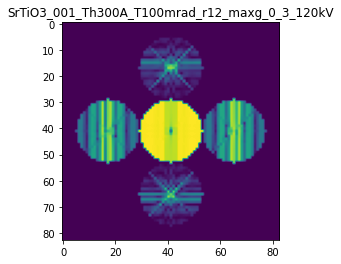

X_sim.max(): 0.994374396009765
>>>replaced the 32. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 854ms/step - loss: 0.0044 - mean_absolute_error: 0.0448 - acc: 0.9400 - val_loss: 0.0016 - val_mean_absolute_error: 0.0254 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 3s 548ms/step - loss: 0.0043 - mean_absolute_error: 0.0445 - acc: 0.9400 - val_loss: 0.0016 - val_mean_absolute_error: 0.0251 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 568ms/step - loss: 0.0044 - mean_absolute_error: 0.0442 - acc: 0.9400 - val_loss: 0.0019 - val_mean_absolute_error: 0.0261 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 3s 586ms/step - loss: 0.0043 - mean_absolute_error: 0.0441 - acc: 0.9400 - val_loss: 0.0016 - val_mean_absolute_error: 0.0243 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 3s 645ms/step - loss: 0.0044 - mean_absolute_error: 0.0448 - acc: 0.9400 - val_loss: 0.0018 - val_mean_absol

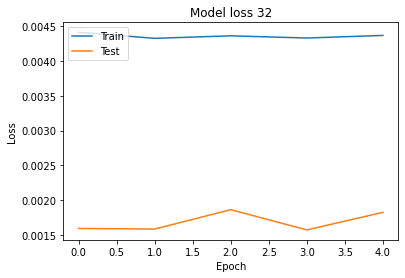

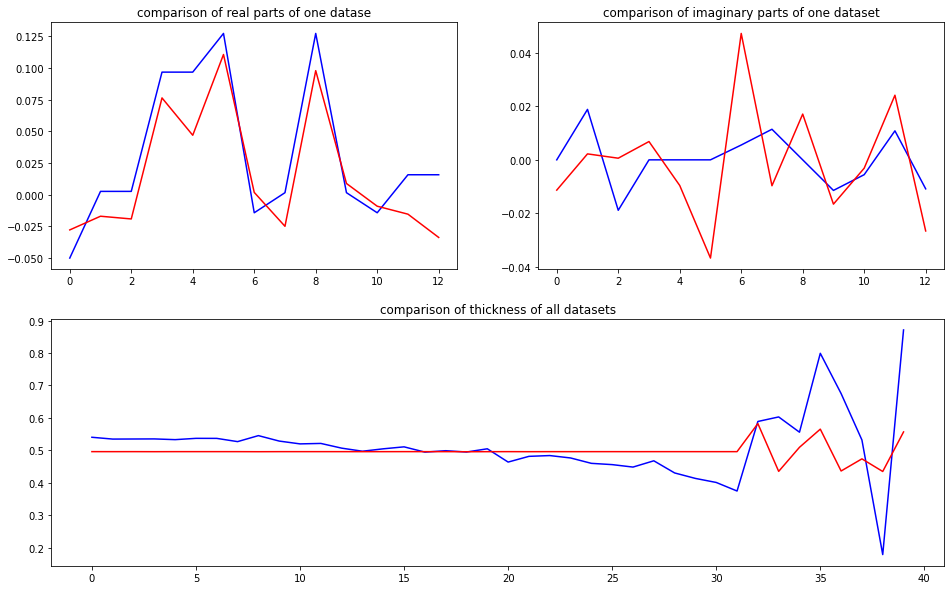

predicted thickness: 0.41732478


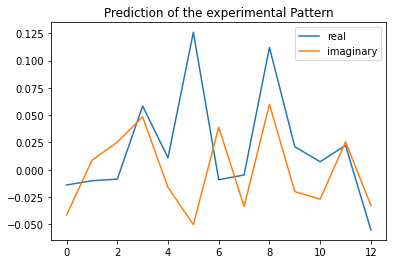

The offset applied on thickness: 0.000658227600876252

The offset applied on Ug: 3.1971918820841214

Applied shift of unit cell origin (fractional coordinates): -0.12552354048884415 -0.02015532254060655
Ug[ 0 ]: 0.00781 3.14159  =>  0.00781 3.14159
Ug[ 1 ]: 0.01214 -2.27652  =>  0.01214 -2.40316
Ug[ 2 ]: 0.01214 2.27652  =>  0.01214 2.40316
Ug[ 3 ]: 0.06317 0.78869  =>  0.06317 0.0
Ug[ 4 ]: 0.06317 -0.78869  =>  0.06317 -0.0
Ug[ 5 ]: 0.18003 -0.25328  =>  0.18003 -0.0
Ug[ 6 ]: 0.03427 1.48428  =>  0.03427 0.82223
Ug[ 7 ]: 0.01313 -0.52257  =>  0.01313 0.39276
Ug[ 8 ]: 0.18003 0.25328  =>  0.18003 0.0
Ug[ 9 ]: 0.01313 0.52257  =>  0.01313 -0.39276
Ug[ 10 ]: 0.03427 -1.48428  =>  0.03427 -0.82223
Ug[ 11 ]: 0.02797 1.85913  =>  0.02797 -2.84668
Ug[ 12 ]: 0.02797 -1.85913  =>  0.02797 2.84668
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrT

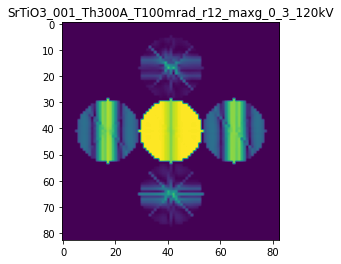

X_sim.max(): 0.998128491830768
>>>replaced the 33. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 858ms/step - loss: 0.0043 - mean_absolute_error: 0.0442 - acc: 0.9400 - val_loss: 0.0016 - val_mean_absolute_error: 0.0246 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 3s 535ms/step - loss: 0.0042 - mean_absolute_error: 0.0440 - acc: 0.9400 - val_loss: 0.0015 - val_mean_absolute_error: 0.0246 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 572ms/step - loss: 0.0043 - mean_absolute_error: 0.0456 - acc: 0.9400 - val_loss: 0.0021 - val_mean_absolute_error: 0.0288 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 3s 579ms/step - loss: 0.0045 - mean_absolute_error: 0.0458 - acc: 0.9400 - val_loss: 0.0020 - val_mean_absolute_error: 0.0292 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 3s 593ms/step - loss: 0.0045 - mean_absolute_error: 0.0463 - acc: 0.9400 - val_loss: 0.0018 - val_mean_absol

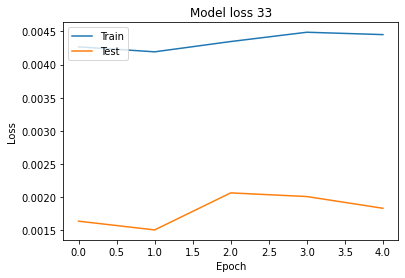

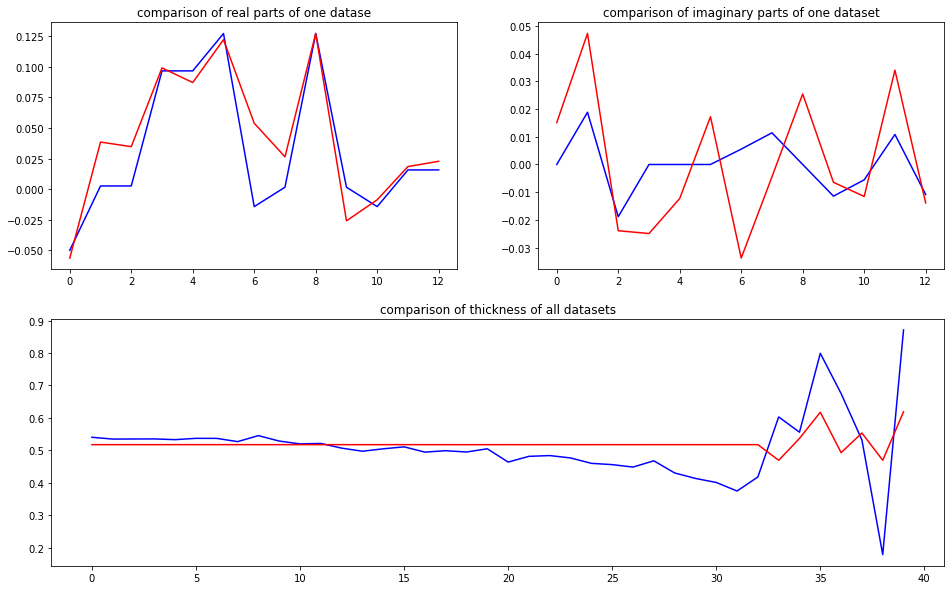

predicted thickness: 0.41295728


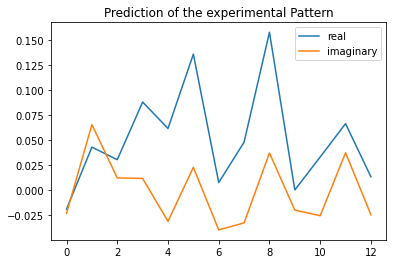

The offset applied on thickness: -0.0009325346065392333

The offset applied on Ug: 3.379619302864148

Applied shift of unit cell origin (fractional coordinates): -0.05115828010663616 -0.015386009273027978
Ug[ 0 ]: 0.01577 3.14159  =>  0.01577 3.14159
Ug[ 1 ]: 0.06253 0.66519  =>  0.06253 0.56852
Ug[ 2 ]: 0.06253 -0.66519  =>  0.06253 -0.56852
Ug[ 3 ]: 0.10174 0.32144  =>  0.10174 0.0
Ug[ 4 ]: 0.10174 -0.32144  =>  0.10174 -0.0
Ug[ 5 ]: 0.22803 -0.19335  =>  0.22803 0.0
Ug[ 6 ]: 0.0274 -0.28981  =>  0.0274 -0.51457
Ug[ 7 ]: 0.03067 0.02344  =>  0.03067 0.44155
Ug[ 8 ]: 0.22803 0.19335  =>  0.22803 0.0
Ug[ 9 ]: 0.03067 -0.02344  =>  0.03067 -0.44155
Ug[ 10 ]: 0.0274 0.28981  =>  0.0274 0.51457
Ug[ 11 ]: 0.06797 0.71452  =>  0.06797 1.35739
Ug[ 12 ]: 0.06797 -0.71452  =>  0.06797 -1.35739
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3

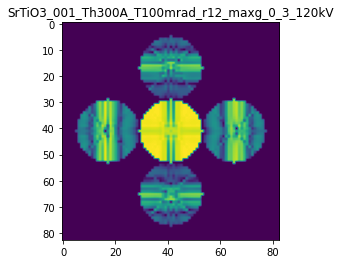

X_sim.max(): 0.9874159937524009
>>>replaced the 34. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 792ms/step - loss: 0.0044 - mean_absolute_error: 0.0455 - acc: 0.9400 - val_loss: 0.0016 - val_mean_absolute_error: 0.0260 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 2s 531ms/step - loss: 0.0043 - mean_absolute_error: 0.0441 - acc: 0.9400 - val_loss: 0.0016 - val_mean_absolute_error: 0.0227 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 564ms/step - loss: 0.0042 - mean_absolute_error: 0.0434 - acc: 0.9400 - val_loss: 0.0015 - val_mean_absolute_error: 0.0245 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 3s 584ms/step - loss: 0.0042 - mean_absolute_error: 0.0437 - acc: 0.9400 - val_loss: 0.0015 - val_mean_absolute_error: 0.0232 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 3s 585ms/step - loss: 0.0041 - mean_absolute_error: 0.0422 - acc: 0.9400 - val_loss: 0.0017 - val_mean_abso

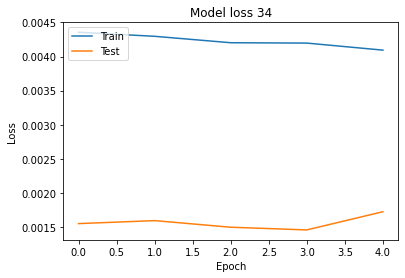

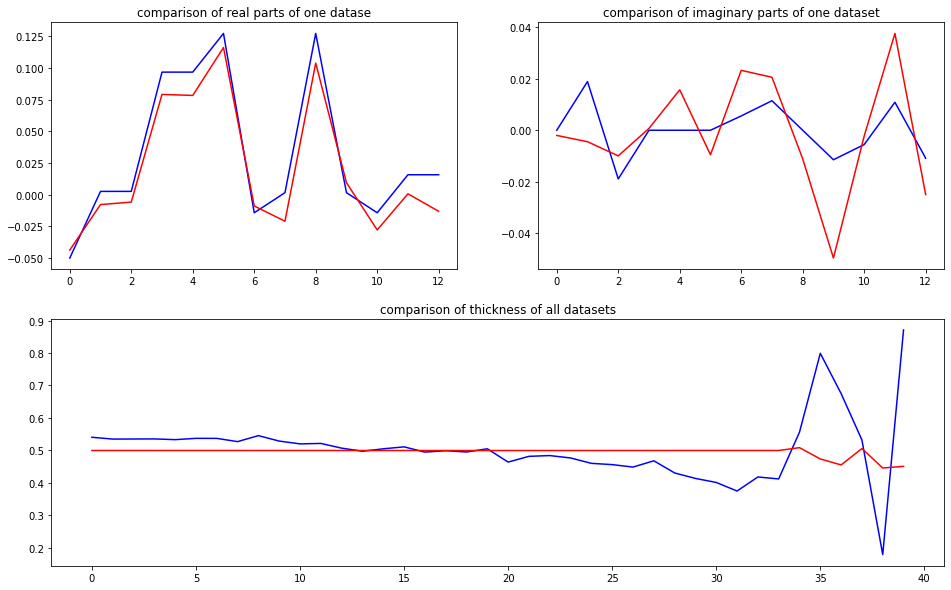

predicted thickness: 0.40493864


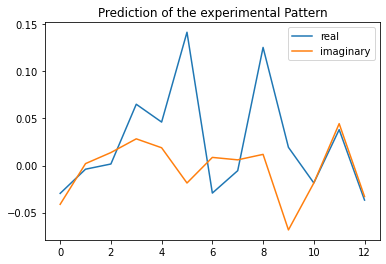

The offset applied on thickness: 0.000990751819639615

The offset applied on Ug: 0.01436607821970989

Applied shift of unit cell origin (fractional coordinates): -0.013568131647784842 -0.008987336523339787
Ug[ 0 ]: 0.02959 3.14159  =>  0.02959 3.14159
Ug[ 1 ]: 0.00598 -1.76346  =>  0.00598 -1.81993
Ug[ 2 ]: 0.00598 1.76346  =>  0.00598 1.81993
Ug[ 3 ]: 0.05593 0.08525  =>  0.05593 -0.0
Ug[ 4 ]: 0.05593 -0.08525  =>  0.05593 0.0
Ug[ 5 ]: 0.13476 -0.11294  =>  0.13476 0.0
Ug[ 6 ]: 0.02751 2.62367  =>  0.02751 2.59489
Ug[ 7 ]: 0.03786 1.38576  =>  0.03786 1.52748
Ug[ 8 ]: 0.13476 0.11294  =>  0.13476 -0.0
Ug[ 9 ]: 0.03786 -1.38576  =>  0.03786 -1.52748
Ug[ 10 ]: 0.02751 -2.62367  =>  0.02751 -2.59489
Ug[ 11 ]: 0.03877 1.55135  =>  0.03877 1.72185
Ug[ 12 ]: 0.03877 -1.55135  =>  0.03877 -1.72185
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//

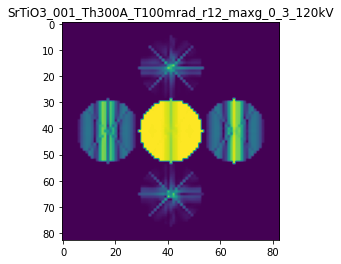

X_sim.max(): 0.9990672570460855
>>>replaced the 35. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 797ms/step - loss: 0.0040 - mean_absolute_error: 0.0422 - acc: 0.9400 - val_loss: 0.0014 - val_mean_absolute_error: 0.0227 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 2s 530ms/step - loss: 0.0040 - mean_absolute_error: 0.0420 - acc: 0.9400 - val_loss: 0.0012 - val_mean_absolute_error: 0.0206 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 568ms/step - loss: 0.0040 - mean_absolute_error: 0.0427 - acc: 0.9400 - val_loss: 0.0013 - val_mean_absolute_error: 0.0221 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 3s 656ms/step - loss: 0.0040 - mean_absolute_error: 0.0421 - acc: 0.9400 - val_loss: 0.0017 - val_mean_absolute_error: 0.0249 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 3s 598ms/step - loss: 0.0040 - mean_absolute_error: 0.0428 - acc: 0.9400 - val_loss: 0.0013 - val_mean_abso

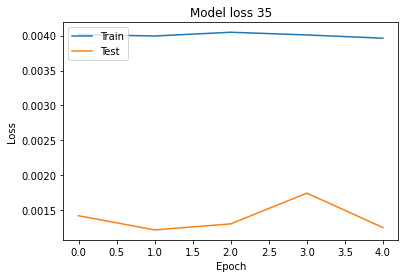

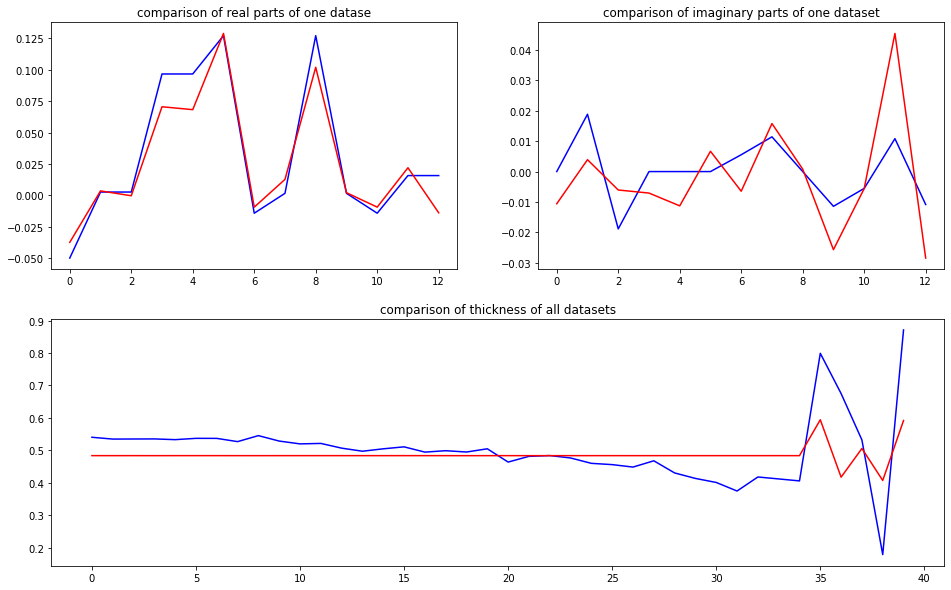

predicted thickness: 0.38111717


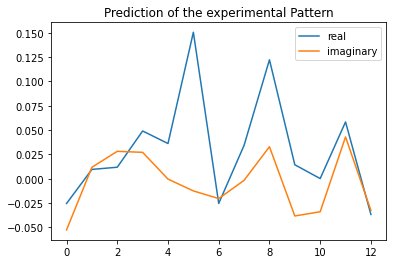

The offset applied on thickness: 0.0003272454111270673

The offset applied on Ug: -0.8826688747166428

Applied shift of unit cell origin (fractional coordinates): -0.049310648358585375 -0.016220153104978544
Ug[ 0 ]: 0.02844 3.14159  =>  0.02844 3.14159
Ug[ 1 ]: 0.01289 -0.65859  =>  0.01289 -0.7605
Ug[ 2 ]: 0.01289 0.65859  =>  0.01289 0.7605
Ug[ 3 ]: 0.04271 0.30983  =>  0.04271 -0.0
Ug[ 4 ]: 0.04271 -0.30983  =>  0.04271 0.0
Ug[ 5 ]: 0.12178 -0.20383  =>  0.12178 -0.0
Ug[ 6 ]: 0.01519 2.67771  =>  0.01519 2.4698
Ug[ 7 ]: 0.02963 0.6765  =>  0.02963 1.08825
Ug[ 8 ]: 0.12178 0.20383  =>  0.12178 0.0
Ug[ 9 ]: 0.02963 -0.6765  =>  0.02963 -1.08825
Ug[ 10 ]: 0.01519 -2.67771  =>  0.01519 -2.4698
Ug[ 11 ]: 0.03757 1.37104  =>  0.03757 1.9907
Ug[ 12 ]: 0.03757 -1.37104  =>  0.03757 -1.9907
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_

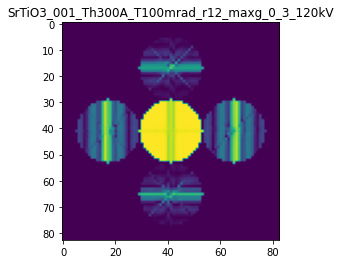

X_sim.max(): 0.997986836869055
>>>replaced the 36. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 893ms/step - loss: 0.0039 - mean_absolute_error: 0.0418 - acc: 0.9500 - val_loss: 0.0011 - val_mean_absolute_error: 0.0204 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 2s 534ms/step - loss: 0.0039 - mean_absolute_error: 0.0416 - acc: 0.9500 - val_loss: 0.0012 - val_mean_absolute_error: 0.0207 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 564ms/step - loss: 0.0039 - mean_absolute_error: 0.0420 - acc: 0.9500 - val_loss: 0.0012 - val_mean_absolute_error: 0.0215 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 3s 584ms/step - loss: 0.0039 - mean_absolute_error: 0.0427 - acc: 0.9500 - val_loss: 0.0012 - val_mean_absolute_error: 0.0212 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 3s 611ms/step - loss: 0.0040 - mean_absolute_error: 0.0434 - acc: 0.9500 - val_loss: 0.0014 - val_mean_absol

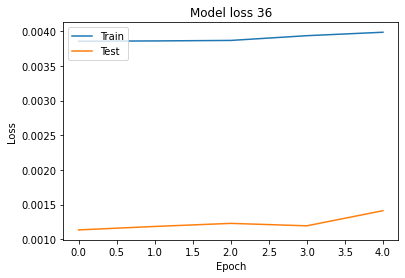

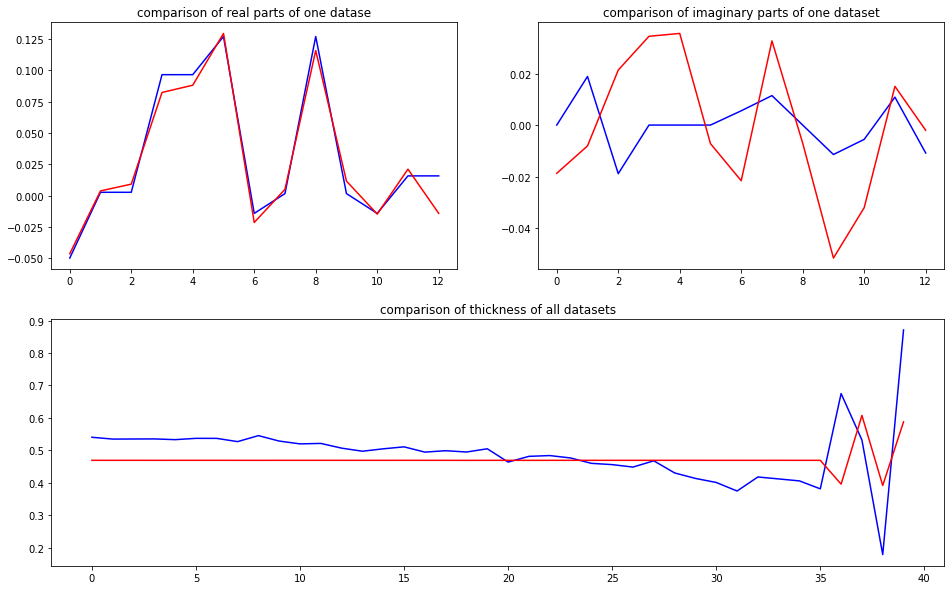

predicted thickness: 0.360344


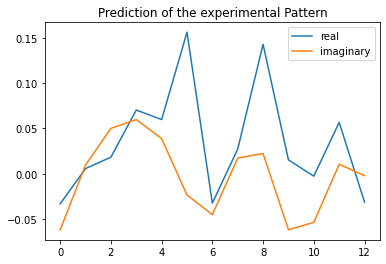

The offset applied on thickness: 0.0007839415482483803

The offset applied on Ug: 1.0533748017341757

Applied shift of unit cell origin (fractional coordinates): -0.02768227114424897 -0.008969357469116842
Ug[ 0 ]: 0.0281 3.14159  =>  0.0281 3.14159
Ug[ 1 ]: 0.02561 -1.0153  =>  0.02561 -1.07165
Ug[ 2 ]: 0.02561 1.0153  =>  0.02561 1.07165
Ug[ 3 ]: 0.07339 0.17393  =>  0.07339 0.0
Ug[ 4 ]: 0.07339 -0.17393  =>  0.07339 -0.0
Ug[ 5 ]: 0.17506 -0.11271  =>  0.17506 0.0
Ug[ 6 ]: 0.0151 2.85595  =>  0.0151 2.73837
Ug[ 7 ]: 0.04489 1.00881  =>  0.04489 1.2391
Ug[ 8 ]: 0.17506 0.11271  =>  0.17506 0.0
Ug[ 9 ]: 0.04489 -1.00881  =>  0.04489 -1.2391
Ug[ 10 ]: 0.0151 -2.85595  =>  0.0151 -2.73837
Ug[ 11 ]: 0.0168 0.48002  =>  0.0168 0.82789
Ug[ 12 ]: 0.0168 -0.48002  =>  0.0168 -0.82789
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300

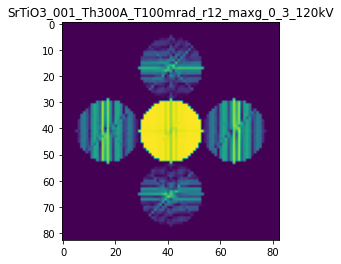

X_sim.max(): 0.9951581631041289
>>>replaced the 37. dataset and train: 
Epoch 1/5
5/5 [==============================] - 5s 805ms/step - loss: 0.0039 - mean_absolute_error: 0.0430 - acc: 0.9500 - val_loss: 0.0011 - val_mean_absolute_error: 0.0224 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 3s 541ms/step - loss: 0.0040 - mean_absolute_error: 0.0435 - acc: 0.9500 - val_loss: 0.0013 - val_mean_absolute_error: 0.0233 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 575ms/step - loss: 0.0040 - mean_absolute_error: 0.0438 - acc: 0.9500 - val_loss: 0.0012 - val_mean_absolute_error: 0.0231 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 3s 585ms/step - loss: 0.0039 - mean_absolute_error: 0.0422 - acc: 0.9500 - val_loss: 0.0011 - val_mean_absolute_error: 0.0184 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 3s 615ms/step - loss: 0.0038 - mean_absolute_error: 0.0408 - acc: 0.9500 - val_loss: 0.0012 - val_mean_abso

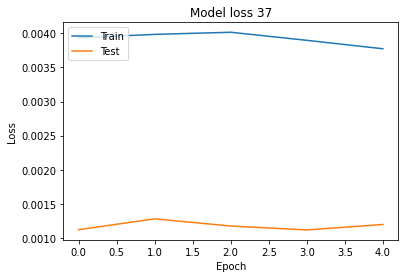

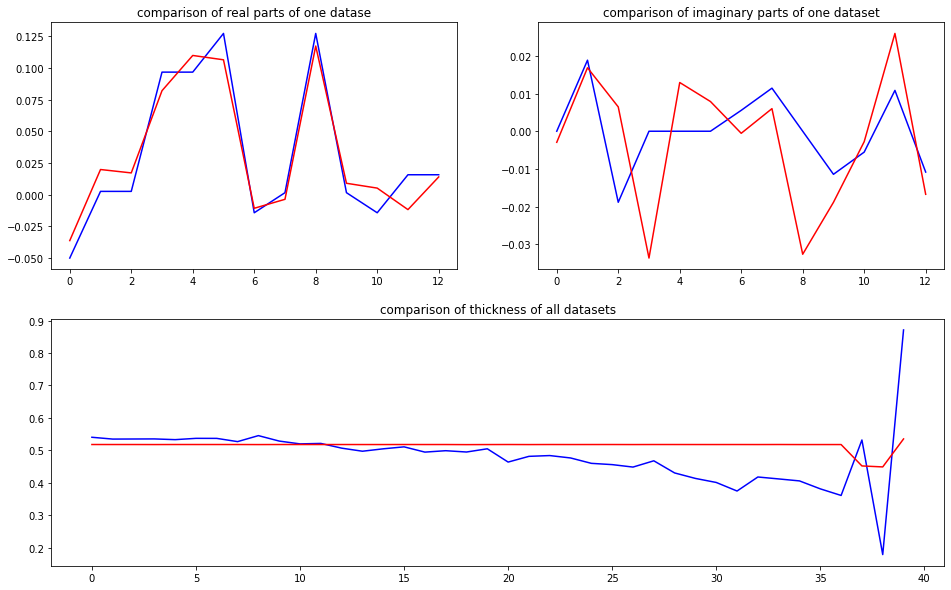

predicted thickness: 0.36030558


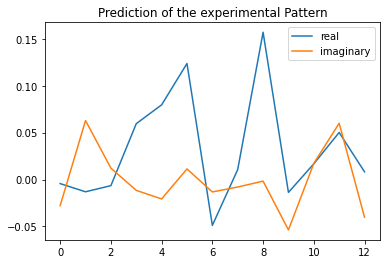

The offset applied on thickness: -0.000959540026784996

The offset applied on Ug: 0.6840094107483828

Applied shift of unit cell origin (fractional coordinates): -0.007325810000553904 0.001213934674411614
Ug[ 0 ]: 0.00381 3.14159  =>  0.00381 3.14159
Ug[ 1 ]: 0.02798 1.87372  =>  0.02798 1.88135
Ug[ 2 ]: 0.02798 -1.87372  =>  0.02798 -1.88135
Ug[ 3 ]: 0.07327 0.04603  =>  0.07327 -0.0
Ug[ 4 ]: 0.07327 -0.04603  =>  0.07327 0.0
Ug[ 5 ]: 0.15419 0.01525  =>  0.15419 0.0
Ug[ 6 ]: 0.02096 -2.36952  =>  0.02096 -2.42318
Ug[ 7 ]: 0.02191 1.59176  =>  0.02191 1.63016
Ug[ 8 ]: 0.15419 -0.01525  =>  0.15419 0.0
Ug[ 9 ]: 0.02191 -1.59176  =>  0.02191 -1.63016
Ug[ 10 ]: 0.02096 2.36952  =>  0.02096 2.42318
Ug[ 11 ]: 0.06079 1.01915  =>  0.06079 1.11121
Ug[ 12 ]: 0.06079 -1.01915  =>  0.06079 -1.11121
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

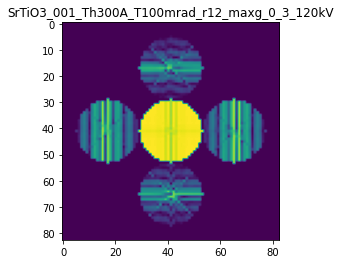

X_sim.max(): 0.9947533397461948
>>>replaced the 38. dataset and train: 
Epoch 1/5
5/5 [==============================] - 5s 807ms/step - loss: 0.0038 - mean_absolute_error: 0.0414 - acc: 0.9500 - val_loss: 8.1634e-04 - val_mean_absolute_error: 0.0177 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 3s 539ms/step - loss: 0.0038 - mean_absolute_error: 0.0407 - acc: 0.9500 - val_loss: 9.7414e-04 - val_mean_absolute_error: 0.0192 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 585ms/step - loss: 0.0037 - mean_absolute_error: 0.0406 - acc: 0.9500 - val_loss: 0.0010 - val_mean_absolute_error: 0.0187 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 3s 586ms/step - loss: 0.0037 - mean_absolute_error: 0.0401 - acc: 0.9500 - val_loss: 8.9374e-04 - val_mean_absolute_error: 0.0196 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 3s 660ms/step - loss: 0.0037 - mean_absolute_error: 0.0409 - acc: 0.9500 - val_loss: 8.1544e-04

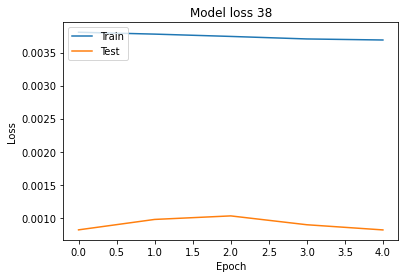

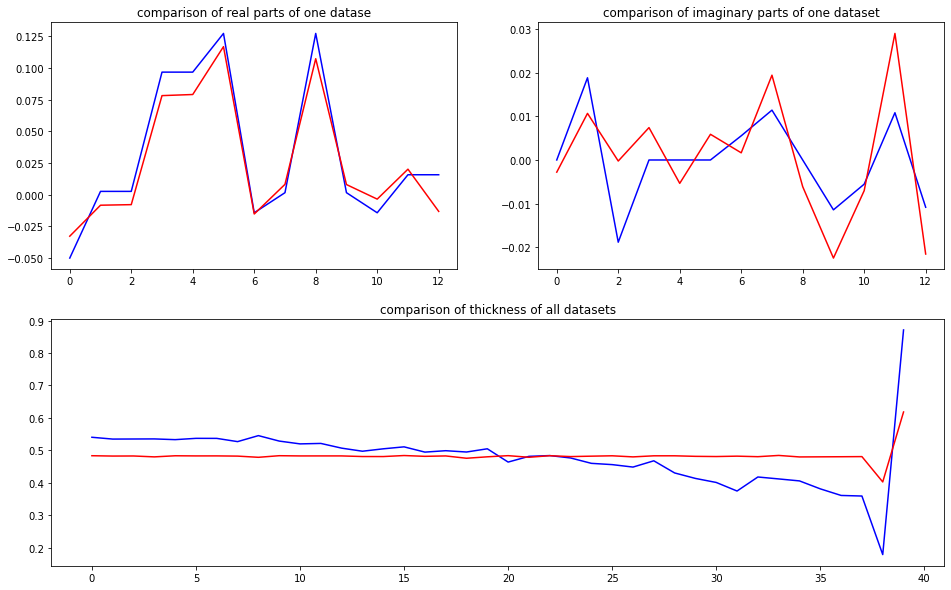

predicted thickness: 0.32244438


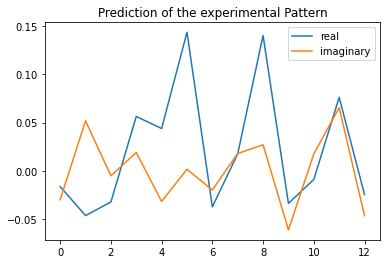

The offset applied on thickness: 0.0005131053365270055

The offset applied on Ug: 0.8998926986476876

Applied shift of unit cell origin (fractional coordinates): -0.071932313588479 -0.0062061831791002066
Ug[ 0 ]: 0.01535 3.14159  =>  0.01535 3.14159
Ug[ 1 ]: 0.04753 2.45592  =>  0.04753 2.41693
Ug[ 2 ]: 0.04753 -2.45592  =>  0.04753 -2.41693
Ug[ 3 ]: 0.05897 0.45196  =>  0.05897 -0.0
Ug[ 4 ]: 0.05897 -0.45196  =>  0.05897 0.0
Ug[ 5 ]: 0.16112 -0.07799  =>  0.16112 0.0
Ug[ 6 ]: 0.02873 -2.45882  =>  0.02873 -2.87179
Ug[ 7 ]: 0.03828 1.71812  =>  0.03828 2.20908
Ug[ 8 ]: 0.16112 0.07799  =>  0.16112 -0.0
Ug[ 9 ]: 0.03828 -1.71812  =>  0.03828 -2.20908
Ug[ 10 ]: 0.02873 2.45882  =>  0.02873 2.87179
Ug[ 11 ]: 0.06785 1.08653  =>  0.06785 1.99046
Ug[ 12 ]: 0.06785 -1.08653  =>  0.06785 -1.99046
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

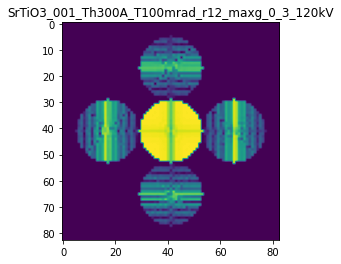

X_sim.max(): 0.983732981503548
>>>replaced the 39. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 995ms/step - loss: 0.0037 - mean_absolute_error: 0.0405 - acc: 0.9500 - val_loss: 8.0637e-04 - val_mean_absolute_error: 0.0196 - val_acc: 1.0000
Epoch 2/5
5/5 [==============================] - 3s 613ms/step - loss: 0.0037 - mean_absolute_error: 0.0409 - acc: 0.9500 - val_loss: 9.2709e-04 - val_mean_absolute_error: 0.0193 - val_acc: 1.0000
Epoch 3/5
5/5 [==============================] - 3s 599ms/step - loss: 0.0037 - mean_absolute_error: 0.0407 - acc: 0.9500 - val_loss: 7.5544e-04 - val_mean_absolute_error: 0.0192 - val_acc: 1.0000
Epoch 4/5
5/5 [==============================] - 3s 593ms/step - loss: 0.0040 - mean_absolute_error: 0.0422 - acc: 0.9500 - val_loss: 0.0016 - val_mean_absolute_error: 0.0280 - val_acc: 1.0000
Epoch 5/5
5/5 [==============================] - 3s 594ms/step - loss: 0.0041 - mean_absolute_error: 0.0440 - acc: 0.9500 - val_loss: 9.8851e-04 

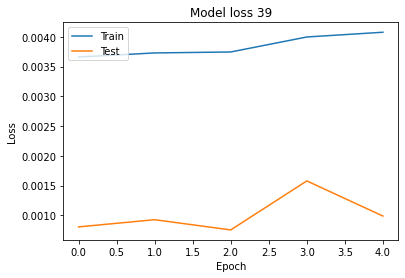

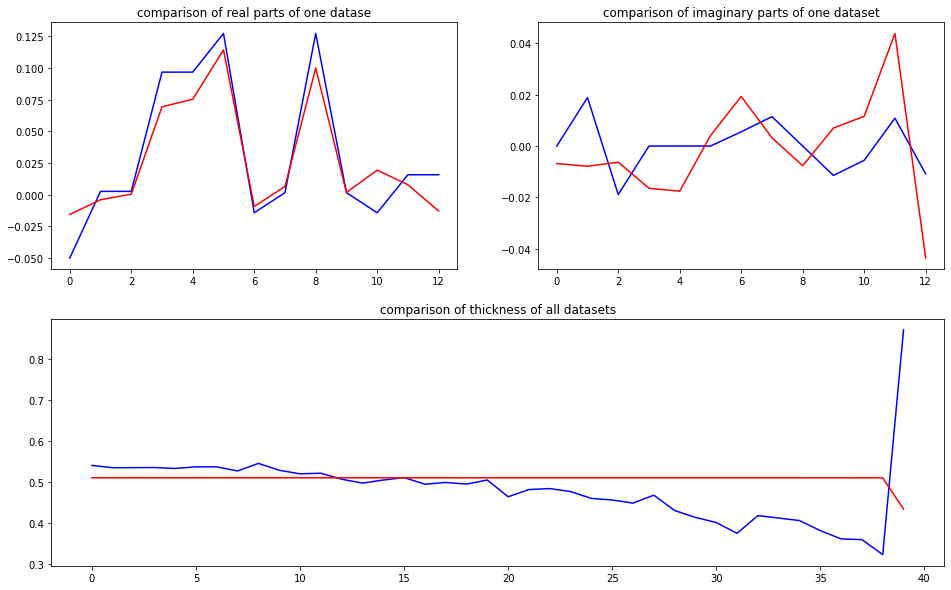

predicted thickness: 0.3467256


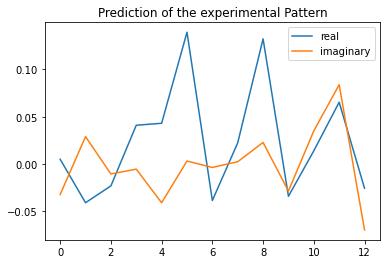

The offset applied on thickness: 6.772141631252349e-05

The offset applied on Ug: -1.2179236466599033

Applied shift of unit cell origin (fractional coordinates): -0.07146640480109429 -0.007178180168164162
Ug[ 0 ]: 0.00382 0.0  =>  0.00382 0.0
Ug[ 1 ]: 0.03852 2.64123  =>  0.03852 2.59612
Ug[ 2 ]: 0.03852 -2.64123  =>  0.03852 -2.59612
Ug[ 3 ]: 0.0432 0.44904  =>  0.0432 0.0
Ug[ 4 ]: 0.0432 -0.44904  =>  0.0432 0.0
Ug[ 5 ]: 0.11347 -0.0902  =>  0.11347 0.0
Ug[ 6 ]: 0.02397 -2.19313  =>  0.02397 -2.59706
Ug[ 7 ]: 0.01801 1.98574  =>  0.01801 2.47988
Ug[ 8 ]: 0.11347 0.0902  =>  0.11347 0.0
Ug[ 9 ]: 0.01801 -1.98574  =>  0.01801 -2.47988
Ug[ 10 ]: 0.02397 2.19313  =>  0.02397 2.59706
Ug[ 11 ]: 0.075 1.44068  =>  0.075 2.33876
Ug[ 12 ]: 0.075 -1.44068  =>  0.075 -2.33876
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T100mr

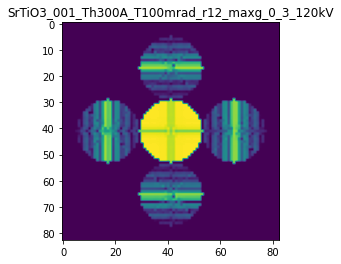

X_sim.max(): 0.9958762643215223
>>>replaced the 40. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 904ms/step - loss: 0.0039 - mean_absolute_error: 0.0417 - acc: 0.9500 - val_loss: 8.6319e-04 - val_mean_absolute_error: 0.0213 - val_acc: 1.0000
Epoch 2/5
5/5 [==============================] - 3s 645ms/step - loss: 0.0038 - mean_absolute_error: 0.0421 - acc: 0.9500 - val_loss: 6.8128e-04 - val_mean_absolute_error: 0.0202 - val_acc: 1.0000
Epoch 3/5
5/5 [==============================] - 3s 587ms/step - loss: 0.0037 - mean_absolute_error: 0.0409 - acc: 0.9500 - val_loss: 6.6599e-04 - val_mean_absolute_error: 0.0192 - val_acc: 1.0000
Epoch 4/5
5/5 [==============================] - 3s 613ms/step - loss: 0.0037 - mean_absolute_error: 0.0416 - acc: 0.9500 - val_loss: 7.9960e-04 - val_mean_absolute_error: 0.0212 - val_acc: 1.0000
Epoch 5/5
5/5 [==============================] - 3s 613ms/step - loss: 0.0038 - mean_absolute_error: 0.0426 - acc: 0.9500 - val_loss: 8.7671

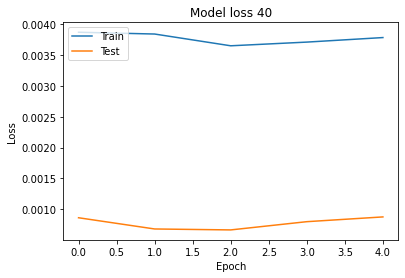

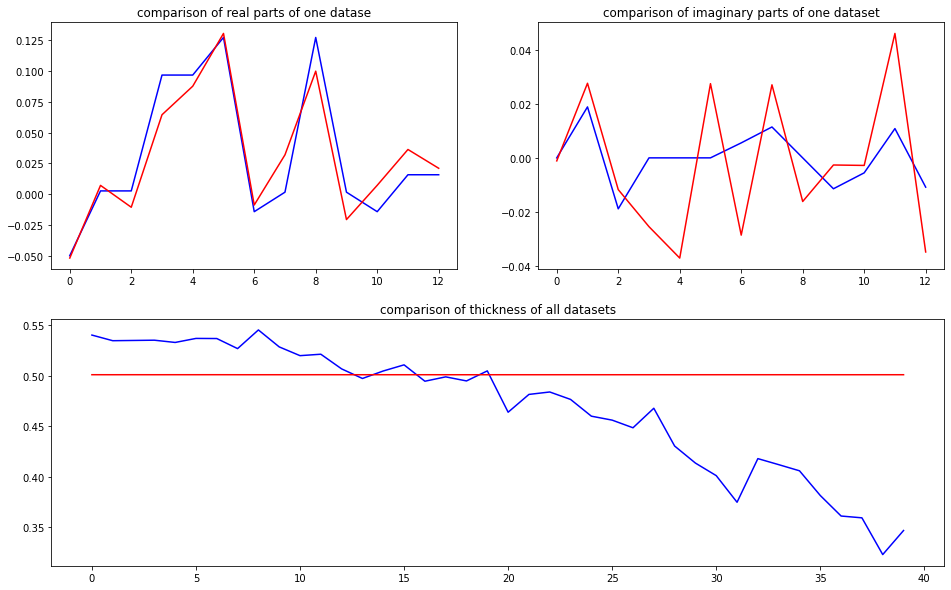

predicted thickness: 0.3632407


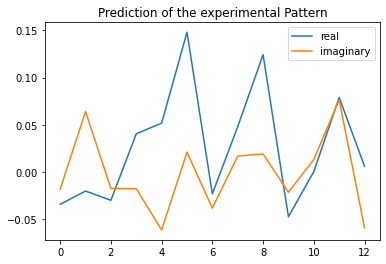

The offset applied on thickness: -0.0008558536043983021

The offset applied on Ug: 0.3539627968768453

Applied shift of unit cell origin (fractional coordinates): -0.06624949392567542 0.0012275511886775568
Ug[ 0 ]: 0.03372 3.14159  =>  0.03372 3.14159
Ug[ 1 ]: 0.04776 2.09976  =>  0.04776 2.10747
Ug[ 2 ]: 0.04776 -2.09976  =>  0.04776 -2.10747
Ug[ 3 ]: 0.05197 0.41626  =>  0.05197 -0.0
Ug[ 4 ]: 0.05197 -0.41626  =>  0.05197 0.0
Ug[ 5 ]: 0.14283 0.01543  =>  0.14283 0.0
Ug[ 6 ]: 0.02766 -1.97973  =>  0.02766 -2.4037
Ug[ 7 ]: 0.01918 1.50822  =>  0.01918 1.91677
Ug[ 8 ]: 0.14283 -0.01543  =>  0.14283 0.0
Ug[ 9 ]: 0.01918 -1.50822  =>  0.01918 -1.91677
Ug[ 10 ]: 0.02766 1.97973  =>  0.02766 2.4037
Ug[ 11 ]: 0.08276 0.99263  =>  0.08276 1.82514
Ug[ 12 ]: 0.08276 -0.99263  =>  0.08276 -1.82514
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrT

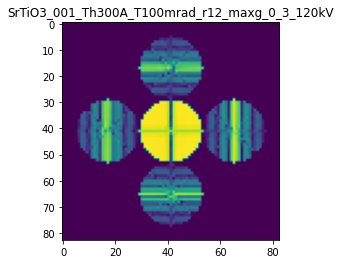

X_sim.max(): 0.9959352715531132
>>>replaced the 41. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 810ms/step - loss: 0.0036 - mean_absolute_error: 0.0410 - acc: 0.9500 - val_loss: 7.2654e-04 - val_mean_absolute_error: 0.0201 - val_acc: 1.0000
Epoch 2/5
5/5 [==============================] - 3s 584ms/step - loss: 0.0036 - mean_absolute_error: 0.0411 - acc: 0.9500 - val_loss: 7.9559e-04 - val_mean_absolute_error: 0.0218 - val_acc: 1.0000
Epoch 3/5
5/5 [==============================] - 3s 574ms/step - loss: 0.0036 - mean_absolute_error: 0.0409 - acc: 0.9500 - val_loss: 8.3622e-04 - val_mean_absolute_error: 0.0214 - val_acc: 1.0000
Epoch 4/5
5/5 [==============================] - 3s 610ms/step - loss: 0.0036 - mean_absolute_error: 0.0412 - acc: 0.9500 - val_loss: 5.9738e-04 - val_mean_absolute_error: 0.0176 - val_acc: 1.0000
Epoch 5/5
5/5 [==============================] - 3s 612ms/step - loss: 0.0036 - mean_absolute_error: 0.0407 - acc: 0.9500 - val_loss: 6.5289

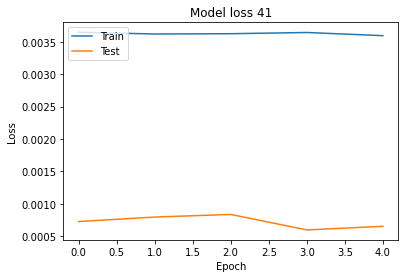

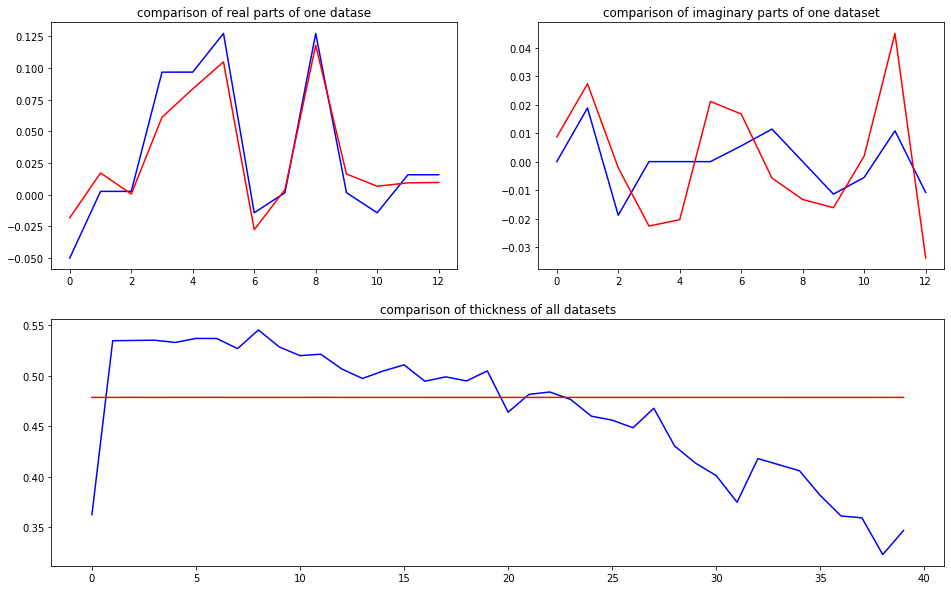

predicted thickness: 0.31929728


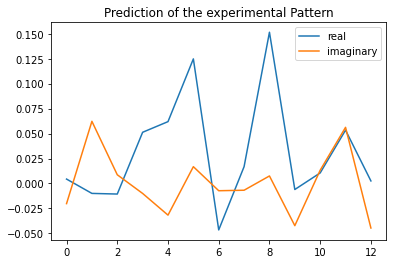

The offset applied on thickness: 0.0002758196296453563

The offset applied on Ug: 1.7766184623939971

Applied shift of unit cell origin (fractional coordinates): -0.021055716930267476 -0.003333883799797505
Ug[ 0 ]: 0.00518 0.0  =>  0.00518 0.0
Ug[ 1 ]: 0.03076 1.78558  =>  0.03076 1.76463
Ug[ 2 ]: 0.03076 -1.78558  =>  0.03076 -1.76463
Ug[ 3 ]: 0.06391 0.1323  =>  0.06391 0.0
Ug[ 4 ]: 0.06391 -0.1323  =>  0.06391 0.0
Ug[ 5 ]: 0.17282 -0.04189  =>  0.17282 0.0
Ug[ 6 ]: 0.01807 -2.62825  =>  0.01807 -2.7396
Ug[ 7 ]: 0.01802 1.152  =>  0.01802 1.30525
Ug[ 8 ]: 0.17282 0.04189  =>  0.17282 0.0
Ug[ 9 ]: 0.01802 -1.152  =>  0.01802 -1.30525
Ug[ 10 ]: 0.01807 2.62825  =>  0.01807 2.7396
Ug[ 11 ]: 0.06533 1.00329  =>  0.06533 1.26789
Ug[ 12 ]: 0.06533 -1.00329  =>  0.06533 -1.26789
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_

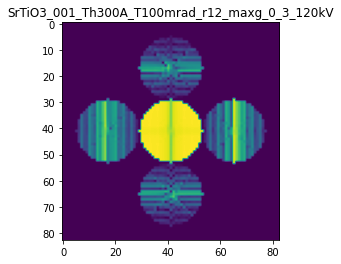

X_sim.max(): 0.9965491068002426
>>>replaced the 42. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 819ms/step - loss: 0.0035 - mean_absolute_error: 0.0403 - acc: 0.9500 - val_loss: 6.9977e-04 - val_mean_absolute_error: 0.0196 - val_acc: 1.0000
Epoch 2/5
5/5 [==============================] - 3s 551ms/step - loss: 0.0035 - mean_absolute_error: 0.0404 - acc: 0.9500 - val_loss: 6.9720e-04 - val_mean_absolute_error: 0.0205 - val_acc: 1.0000
Epoch 3/5
5/5 [==============================] - 3s 562ms/step - loss: 0.0035 - mean_absolute_error: 0.0400 - acc: 0.9500 - val_loss: 6.6705e-04 - val_mean_absolute_error: 0.0188 - val_acc: 1.0000
Epoch 4/5
5/5 [==============================] - 3s 602ms/step - loss: 0.0035 - mean_absolute_error: 0.0398 - acc: 0.9500 - val_loss: 6.8512e-04 - val_mean_absolute_error: 0.0202 - val_acc: 1.0000
Epoch 5/5
5/5 [==============================] - 3s 613ms/step - loss: 0.0036 - mean_absolute_error: 0.0409 - acc: 0.9500 - val_loss: 5.6542

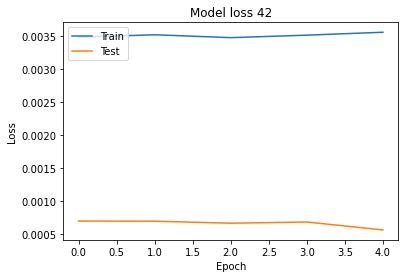

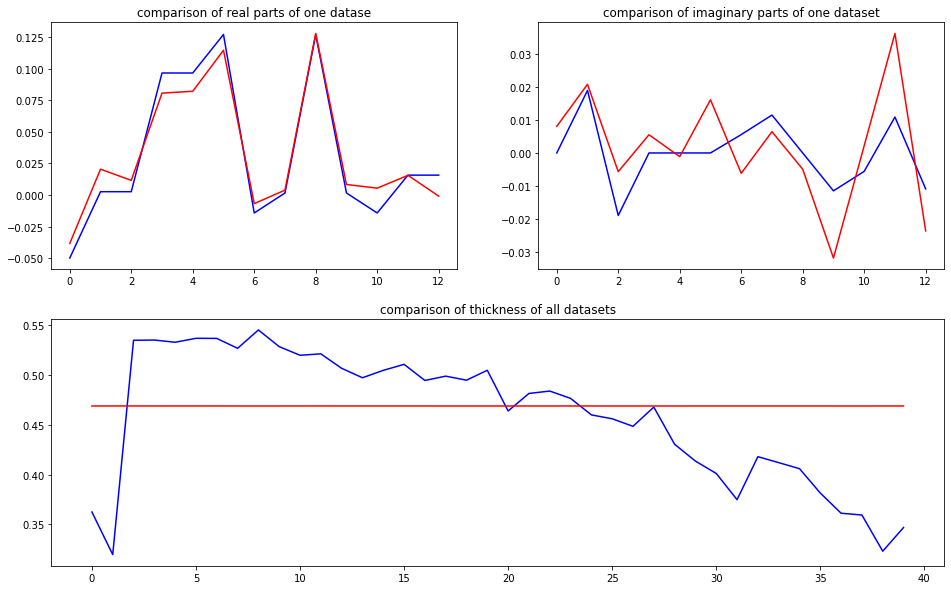

predicted thickness: 0.29004505


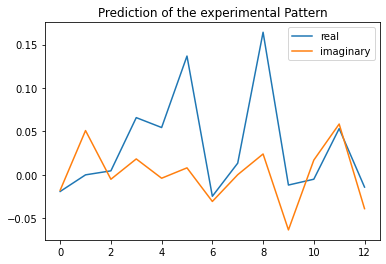

The offset applied on thickness: -0.0009076270035258678

The offset applied on Ug: 1.8070112890224723

Applied shift of unit cell origin (fractional coordinates): -0.030754425681528082 -0.009661054301368733
Ug[ 0 ]: 0.0178 3.14159  =>  0.0178 3.14159
Ug[ 1 ]: 0.03071 1.41378  =>  0.03071 1.35308
Ug[ 2 ]: 0.03071 -1.41378  =>  0.03071 -1.35308
Ug[ 3 ]: 0.06846 0.19324  =>  0.06846 -0.0
Ug[ 4 ]: 0.06846 -0.19324  =>  0.06846 0.0
Ug[ 5 ]: 0.19375 -0.1214  =>  0.19375 0.0
Ug[ 6 ]: 0.02628 -2.09126  =>  0.02628 -2.2238
Ug[ 7 ]: 0.02872 1.40066  =>  0.02872 1.6546
Ug[ 8 ]: 0.19375 0.1214  =>  0.19375 0.0
Ug[ 9 ]: 0.02872 -1.40066  =>  0.02872 -1.6546
Ug[ 10 ]: 0.02628 2.09126  =>  0.02628 2.2238
Ug[ 11 ]: 0.06041 1.10965  =>  0.06041 1.49612
Ug[ 12 ]: 0.06041 -1.10965  =>  0.06041 -1.49612
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_0

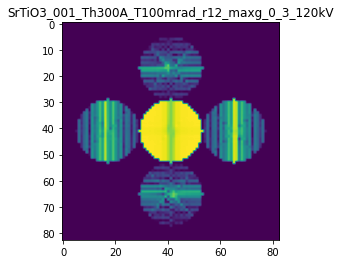

X_sim.max(): 0.9892770382387372
>>>replaced the 43. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 967ms/step - loss: 0.0035 - mean_absolute_error: 0.0401 - acc: 0.9500 - val_loss: 7.2907e-04 - val_mean_absolute_error: 0.0178 - val_acc: 1.0000
Epoch 2/5
5/5 [==============================] - 3s 574ms/step - loss: 0.0034 - mean_absolute_error: 0.0395 - acc: 0.9500 - val_loss: 7.6151e-04 - val_mean_absolute_error: 0.0190 - val_acc: 1.0000
Epoch 3/5
5/5 [==============================] - 3s 544ms/step - loss: 0.0035 - mean_absolute_error: 0.0400 - acc: 0.9500 - val_loss: 7.3026e-04 - val_mean_absolute_error: 0.0197 - val_acc: 1.0000
Epoch 4/5
5/5 [==============================] - 3s 589ms/step - loss: 0.0035 - mean_absolute_error: 0.0403 - acc: 0.9500 - val_loss: 7.8940e-04 - val_mean_absolute_error: 0.0198 - val_acc: 1.0000
Epoch 5/5
5/5 [==============================] - 3s 615ms/step - loss: 0.0034 - mean_absolute_error: 0.0393 - acc: 0.9500 - val_loss: 6.5048

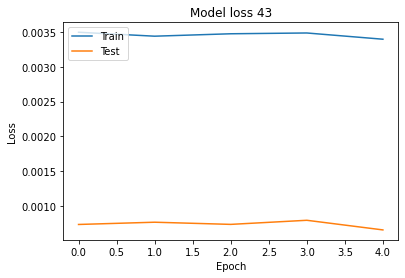

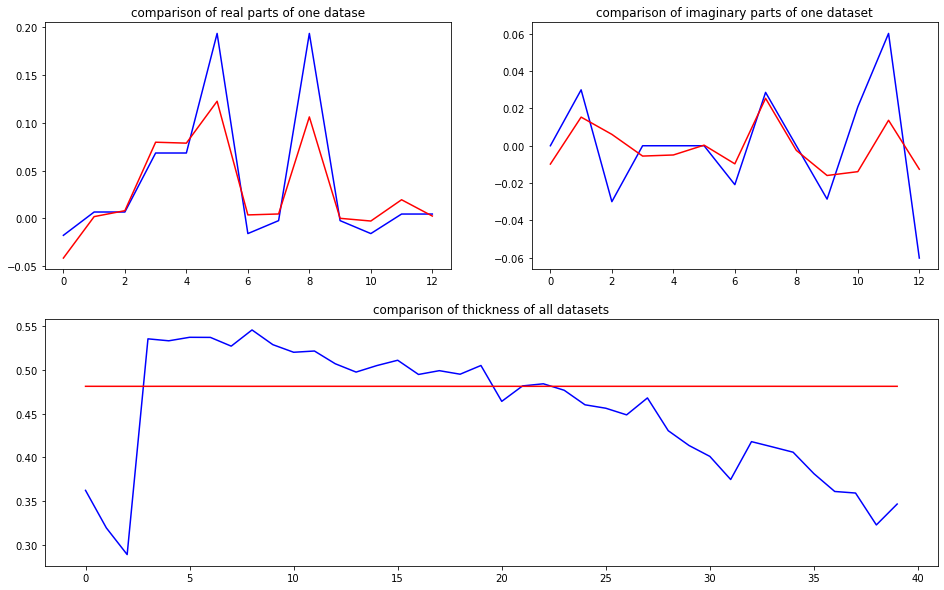

predicted thickness: 0.2975003


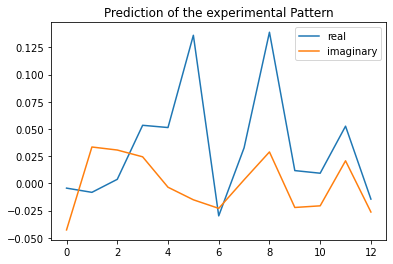

The offset applied on thickness: -0.00032806035168630413

The offset applied on Ug: 2.4823656850183657

Applied shift of unit cell origin (fractional coordinates): -0.039822036602516354 -0.010898825801163449
Ug[ 0 ]: 0.0002 0.0  =>  0.0002 0.0
Ug[ 1 ]: 0.00164 1.35026  =>  0.00164 1.28179
Ug[ 2 ]: 0.00164 -1.35026  =>  0.00164 -1.28179
Ug[ 3 ]: 0.06184 0.25021  =>  0.06184 0.0
Ug[ 4 ]: 0.06184 -0.25021  =>  0.06184 0.0
Ug[ 5 ]: 0.18762 -0.13696  =>  0.18762 0.0
Ug[ 6 ]: 0.0079 -3.10187  =>  0.0079 2.99959
Ug[ 7 ]: 0.0278 0.50555  =>  0.0278 0.82424
Ug[ 8 ]: 0.18762 0.13696  =>  0.18762 0.0
Ug[ 9 ]: 0.0278 -0.50555  =>  0.0278 -0.82424
Ug[ 10 ]: 0.0079 3.10187  =>  0.0079 -2.99959
Ug[ 11 ]: 0.03663 0.8522  =>  0.03663 1.35262
Ug[ 12 ]: 0.03663 -0.8522  =>  0.03663 -1.35262
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T1

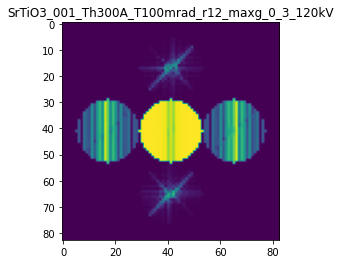

X_sim.max(): 0.9946762372160537
>>>replaced the 44. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 849ms/step - loss: 0.0033 - mean_absolute_error: 0.0386 - acc: 0.9500 - val_loss: 5.9846e-04 - val_mean_absolute_error: 0.0164 - val_acc: 1.0000
Epoch 2/5
5/5 [==============================] - 3s 535ms/step - loss: 0.0033 - mean_absolute_error: 0.0384 - acc: 0.9500 - val_loss: 7.1363e-04 - val_mean_absolute_error: 0.0189 - val_acc: 1.0000
Epoch 3/5
5/5 [==============================] - 3s 549ms/step - loss: 0.0033 - mean_absolute_error: 0.0385 - acc: 0.9500 - val_loss: 6.3395e-04 - val_mean_absolute_error: 0.0180 - val_acc: 1.0000
Epoch 4/5
5/5 [==============================] - 3s 651ms/step - loss: 0.0033 - mean_absolute_error: 0.0385 - acc: 0.9500 - val_loss: 6.2819e-04 - val_mean_absolute_error: 0.0169 - val_acc: 1.0000
Epoch 5/5
5/5 [==============================] - 3s 674ms/step - loss: 0.0033 - mean_absolute_error: 0.0389 - acc: 0.9500 - val_loss: 8.7201

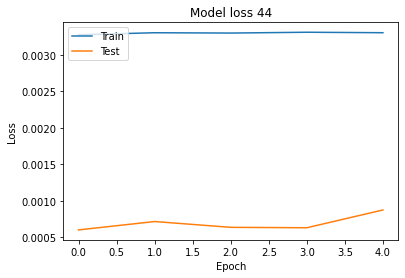

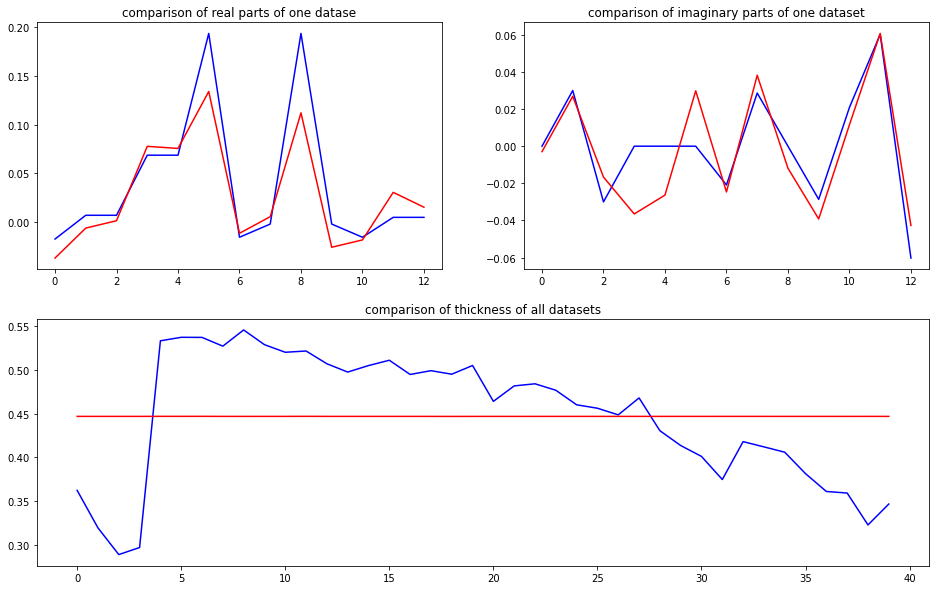

predicted thickness: 0.23472688


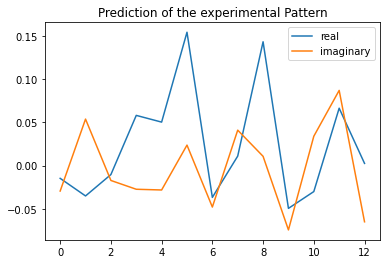

The offset applied on thickness: 0.00040764782283873326

The offset applied on Ug: -2.8705966432221572

Applied shift of unit cell origin (fractional coordinates): 0.0007286545915370605 0.005450395750719676
Ug[ 0 ]: 0.018 3.14159  =>  0.018 3.14159
Ug[ 1 ]: 0.04117 2.36558  =>  0.04117 2.39983
Ug[ 2 ]: 0.04117 -2.36558  =>  0.04117 -2.39983
Ug[ 3 ]: 0.0435 -0.00458  =>  0.0435 0.0
Ug[ 4 ]: 0.0435 0.00458  =>  0.0435 -0.0
Ug[ 5 ]: 0.08441 0.06849  =>  0.08441 0.0
Ug[ 6 ]: 0.06073 -2.32982  =>  0.06073 -2.35948
Ug[ 7 ]: 0.07843 2.01175  =>  0.07843 1.97293
Ug[ 8 ]: 0.08441 -0.06849  =>  0.08441 0.0
Ug[ 9 ]: 0.07843 -2.01175  =>  0.07843 -1.97293
Ug[ 10 ]: 0.06073 2.32982  =>  0.06073 2.35948
Ug[ 11 ]: 0.0709 1.41321  =>  0.0709 1.40406
Ug[ 12 ]: 0.0709 -1.41321  =>  0.0709 -1.40406
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_T

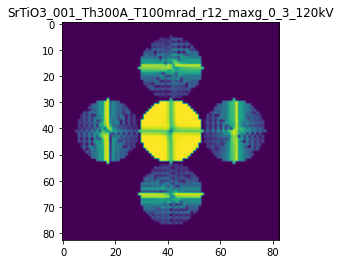

X_sim.max(): 0.9990019244619787
>>>replaced the 45. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 927ms/step - loss: 0.0034 - mean_absolute_error: 0.0399 - acc: 0.9500 - val_loss: 0.0010 - val_mean_absolute_error: 0.0238 - val_acc: 1.0000
Epoch 2/5
5/5 [==============================] - 3s 739ms/step - loss: 0.0034 - mean_absolute_error: 0.0399 - acc: 0.9500 - val_loss: 8.1812e-04 - val_mean_absolute_error: 0.0198 - val_acc: 1.0000
Epoch 3/5
5/5 [==============================] - 4s 730ms/step - loss: 0.0033 - mean_absolute_error: 0.0387 - acc: 0.9500 - val_loss: 7.0971e-04 - val_mean_absolute_error: 0.0183 - val_acc: 1.0000
Epoch 4/5
5/5 [==============================] - 3s 745ms/step - loss: 0.0032 - mean_absolute_error: 0.0380 - acc: 0.9500 - val_loss: 8.2321e-04 - val_mean_absolute_error: 0.0208 - val_acc: 1.0000
Epoch 5/5
5/5 [==============================] - 4s 859ms/step - loss: 0.0033 - mean_absolute_error: 0.0385 - acc: 0.9500 - val_loss: 7.3963e-04

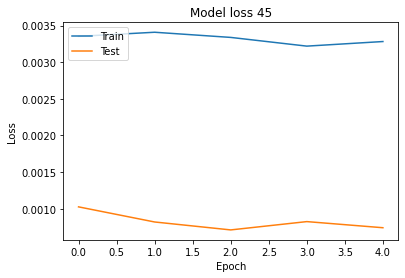

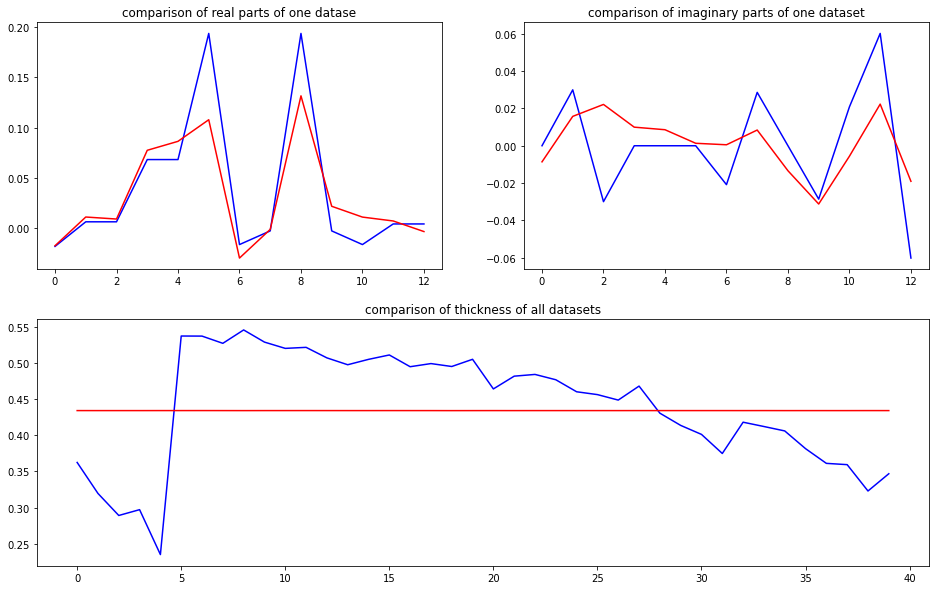

predicted thickness: 0.18687822


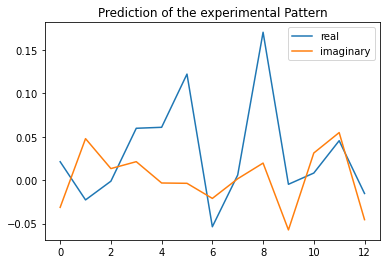

The offset applied on thickness: 0.0007938239427308593

The offset applied on Ug: -2.7206418449105167

Applied shift of unit cell origin (fractional coordinates): -0.03745400102905176 -0.008356025409817688
Ug[ 0 ]: 0.01731 0.0  =>  0.01731 0.0
Ug[ 1 ]: 0.02069 2.45501  =>  0.02069 2.40251
Ug[ 2 ]: 0.02069 -2.45501  =>  0.02069 -2.40251
Ug[ 3 ]: 0.05115 0.23533  =>  0.05115 0.0
Ug[ 4 ]: 0.05115 -0.23533  =>  0.05115 0.0
Ug[ 5 ]: 0.08638 -0.105  =>  0.08638 0.0
Ug[ 6 ]: 0.04196 -2.32168  =>  0.04196 -2.5045
Ug[ 7 ]: 0.03432 1.68637  =>  0.03432 1.9742
Ug[ 8 ]: 0.08638 0.105  =>  0.08638 0.0
Ug[ 9 ]: 0.03432 -1.68637  =>  0.03432 -1.9742
Ug[ 10 ]: 0.04196 2.32168  =>  0.04196 2.5045
Ug[ 11 ]: 0.04835 1.46665  =>  0.04835 1.93731
Ug[ 12 ]: 0.04835 -1.46665  =>  0.04835 -1.93731
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_

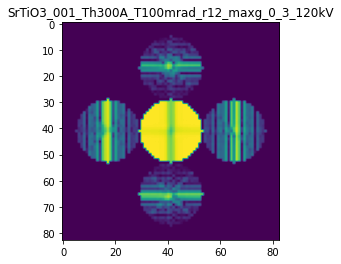

X_sim.max(): 0.9932006448955708
>>>replaced the 46. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 924ms/step - loss: 0.0032 - mean_absolute_error: 0.0378 - acc: 0.9500 - val_loss: 7.8703e-04 - val_mean_absolute_error: 0.0194 - val_acc: 1.0000
Epoch 2/5
5/5 [==============================] - 3s 598ms/step - loss: 0.0032 - mean_absolute_error: 0.0379 - acc: 0.9400 - val_loss: 9.8084e-04 - val_mean_absolute_error: 0.0205 - val_acc: 1.0000
Epoch 3/5
5/5 [==============================] - 3s 559ms/step - loss: 0.0033 - mean_absolute_error: 0.0392 - acc: 0.9500 - val_loss: 8.0579e-04 - val_mean_absolute_error: 0.0187 - val_acc: 1.0000
Epoch 4/5
5/5 [==============================] - 3s 593ms/step - loss: 0.0033 - mean_absolute_error: 0.0378 - acc: 0.9500 - val_loss: 7.8518e-04 - val_mean_absolute_error: 0.0194 - val_acc: 1.0000
Epoch 5/5
5/5 [==============================] - 3s 612ms/step - loss: 0.0032 - mean_absolute_error: 0.0383 - acc: 0.9500 - val_loss: 9.3749

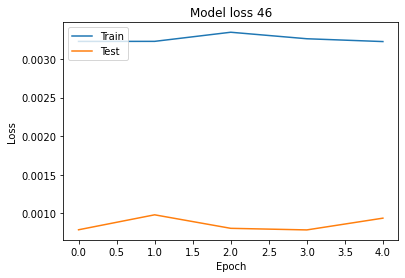

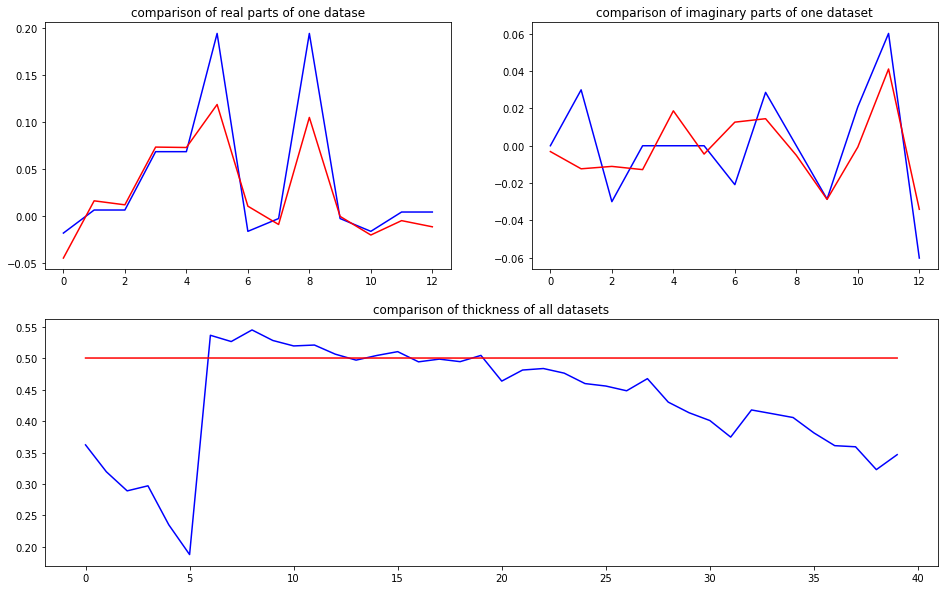

predicted thickness: 0.3132414


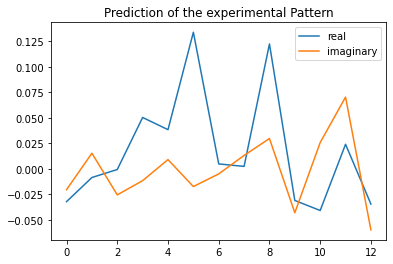

The offset applied on thickness: -0.0003590047180117948

The offset applied on Ug: 0.38318596656184273

Applied shift of unit cell origin (fractional coordinates): 0.03499212217325665 -0.013464063500158873
Ug[ 0 ]: 0.03157 3.14159  =>  0.03157 3.14159
Ug[ 1 ]: 0.02079 1.78386  =>  0.02079 1.69926
Ug[ 2 ]: 0.02079 -1.78386  =>  0.02079 -1.69926
Ug[ 3 ]: 0.04623 -0.21986  =>  0.04623 0.0
Ug[ 4 ]: 0.04623 0.21986  =>  0.04623 0.0
Ug[ 5 ]: 0.13644 -0.16919  =>  0.13644 0.0
Ug[ 6 ]: 0.02357 -2.40991  =>  0.02357 -2.10545
Ug[ 7 ]: 0.03078 2.03272  =>  0.03078 1.89746
Ug[ 8 ]: 0.13644 0.16919  =>  0.13644 -0.0
Ug[ 9 ]: 0.03078 -2.03272  =>  0.03078 -1.89746
Ug[ 10 ]: 0.02357 2.40991  =>  0.02357 2.10545
Ug[ 11 ]: 0.06528 1.62082  =>  0.06528 1.1811
Ug[ 12 ]: 0.06528 -1.62082  =>  0.06528 -1.1811
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrT

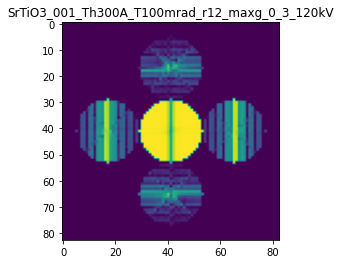

X_sim.max(): 0.9958301271659984
>>>replaced the 47. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 846ms/step - loss: 0.0033 - mean_absolute_error: 0.0382 - acc: 0.9500 - val_loss: 9.7758e-04 - val_mean_absolute_error: 0.0223 - val_acc: 1.0000
Epoch 2/5
5/5 [==============================] - 2s 535ms/step - loss: 0.0032 - mean_absolute_error: 0.0382 - acc: 0.9500 - val_loss: 8.4448e-04 - val_mean_absolute_error: 0.0214 - val_acc: 1.0000
Epoch 3/5
5/5 [==============================] - 3s 545ms/step - loss: 0.0032 - mean_absolute_error: 0.0387 - acc: 0.9500 - val_loss: 9.1840e-04 - val_mean_absolute_error: 0.0220 - val_acc: 1.0000
Epoch 4/5
5/5 [==============================] - 3s 584ms/step - loss: 0.0034 - mean_absolute_error: 0.0387 - acc: 0.9500 - val_loss: 0.0013 - val_mean_absolute_error: 0.0222 - val_acc: 1.0000
Epoch 5/5
5/5 [==============================] - 3s 644ms/step - loss: 0.0033 - mean_absolute_error: 0.0382 - acc: 0.9400 - val_loss: 9.1483e-04

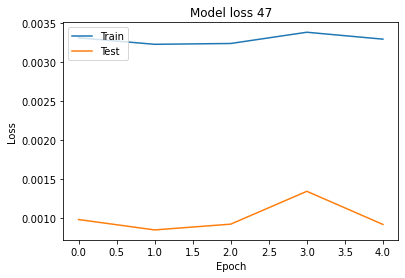

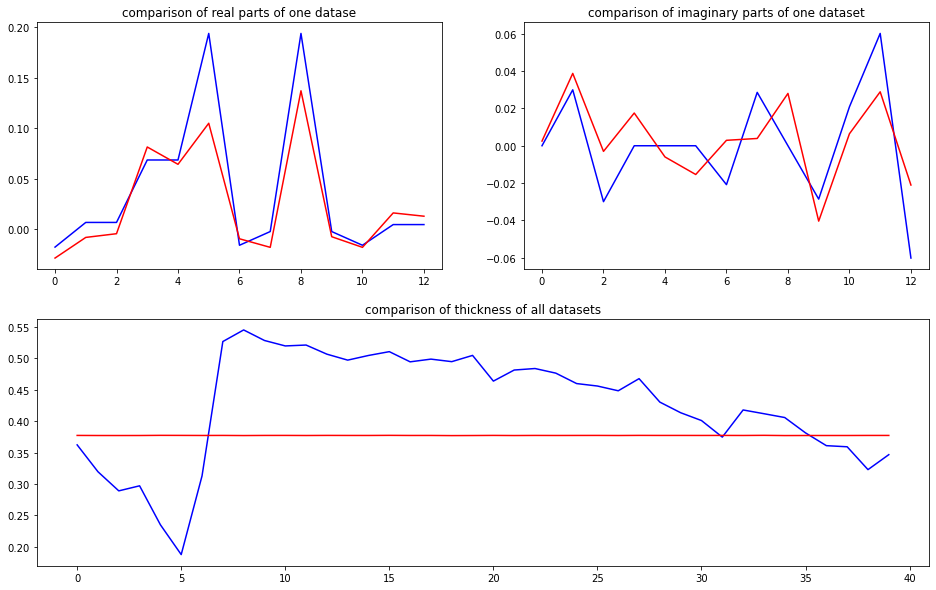

predicted thickness: 0.1593653


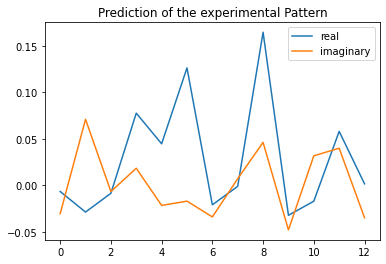

The offset applied on thickness: 0.00030044433273691975

The offset applied on Ug: 2.4423565272368353

Applied shift of unit cell origin (fractional coordinates): -0.057720627248364256 -0.026073126744618154
Ug[ 0 ]: 0.00425 3.14159  =>  0.00425 3.14159
Ug[ 1 ]: 0.04658 1.81696  =>  0.04658 1.65313
Ug[ 2 ]: 0.04658 -1.81696  =>  0.04658 -1.65313
Ug[ 3 ]: 0.07704 0.36267  =>  0.07704 0.0
Ug[ 4 ]: 0.07704 -0.36267  =>  0.07704 0.0
Ug[ 5 ]: 0.21267 -0.32764  =>  0.21267 0.0
Ug[ 6 ]: 0.03609 -2.01452  =>  0.03609 -2.21337
Ug[ 7 ]: 0.02718 2.04953  =>  0.02718 2.57602
Ug[ 8 ]: 0.21267 0.32764  =>  0.21267 -0.0
Ug[ 9 ]: 0.02718 -2.04953  =>  0.02718 -2.57602
Ug[ 10 ]: 0.03609 2.01452  =>  0.03609 2.21337
Ug[ 11 ]: 0.05766 0.8647  =>  0.05766 1.59004
Ug[ 12 ]: 0.05766 -0.8647  =>  0.05766 -1.59004
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

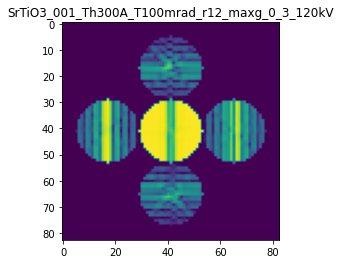

X_sim.max(): 0.9815009819314274
>>>replaced the 48. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 854ms/step - loss: 0.0033 - mean_absolute_error: 0.0379 - acc: 0.9500 - val_loss: 8.9168e-04 - val_mean_absolute_error: 0.0205 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 3s 555ms/step - loss: 0.0033 - mean_absolute_error: 0.0384 - acc: 0.9500 - val_loss: 9.8887e-04 - val_mean_absolute_error: 0.0194 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 596ms/step - loss: 0.0033 - mean_absolute_error: 0.0375 - acc: 0.9500 - val_loss: 8.9355e-04 - val_mean_absolute_error: 0.0206 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 5s 1s/step - loss: 0.0032 - mean_absolute_error: 0.0383 - acc: 0.9500 - val_loss: 9.9860e-04 - val_mean_absolute_error: 0.0190 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 5s 1s/step - loss: 0.0032 - mean_absolute_error: 0.0381 - acc: 0.9500 - val_loss: 9.7341e-04 -

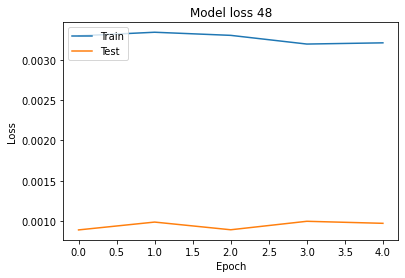

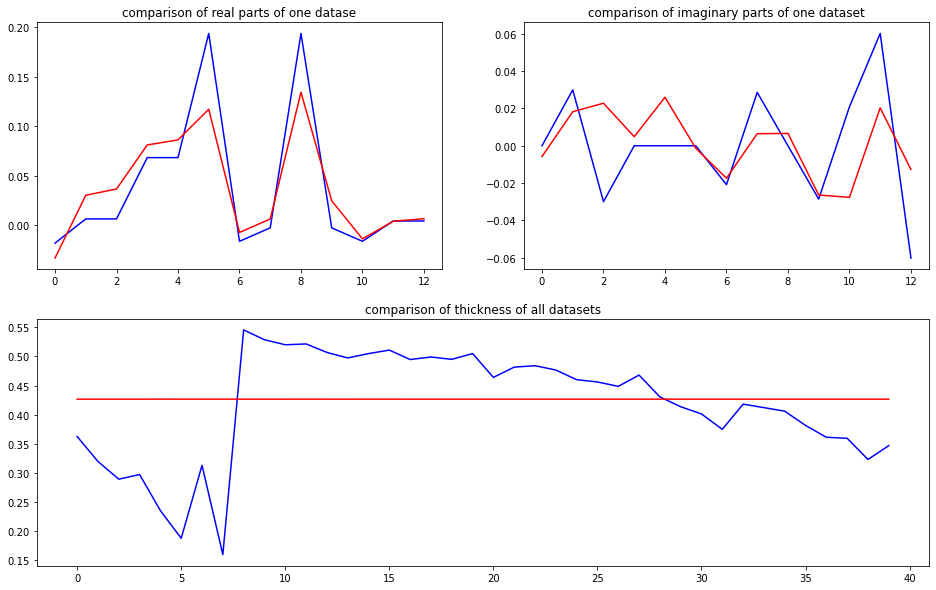

predicted thickness: 0.14940184


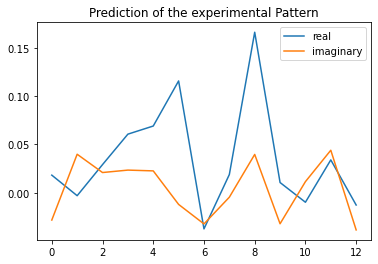

The offset applied on thickness: -0.0009811413610640834

The offset applied on Ug: -0.23003478139754122

Applied shift of unit cell origin (fractional coordinates): -0.0012939016905379097 -0.014030408344466795
Ug[ 0 ]: 0.01798 0.0  =>  0.01798 0.0
Ug[ 1 ]: 0.01584 0.63763  =>  0.01584 0.54947
Ug[ 2 ]: 0.01584 -0.63763  =>  0.01584 -0.54947
Ug[ 3 ]: 0.0638 0.00813  =>  0.0638 0.0
Ug[ 4 ]: 0.0638 -0.00813  =>  0.0638 0.0
Ug[ 5 ]: 0.13822 -0.17631  =>  0.13822 -0.0
Ug[ 6 ]: 0.0326 -2.39436  =>  0.0326 -2.31433
Ug[ 7 ]: 0.02008 0.75979  =>  0.02008 0.85607
Ug[ 8 ]: 0.13822 0.17631  =>  0.13822 0.0
Ug[ 9 ]: 0.02008 -0.75979  =>  0.02008 -0.85607
Ug[ 10 ]: 0.0326 2.39436  =>  0.0326 2.31433
Ug[ 11 ]: 0.04232 1.32916  =>  0.04232 1.34542
Ug[ 12 ]: 0.04232 -1.32916  =>  0.04232 -1.34542
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th

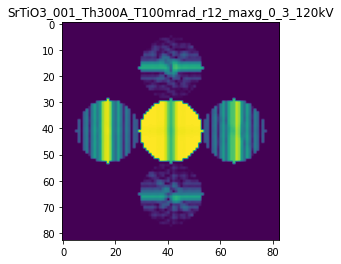

X_sim.max(): 0.9919883932214739
>>>replaced the 49. dataset and train: 
Epoch 1/5
5/5 [==============================] - 16s 2s/step - loss: 0.0033 - mean_absolute_error: 0.0376 - acc: 0.9600 - val_loss: 0.0010 - val_mean_absolute_error: 0.0217 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 5s 949ms/step - loss: 0.0033 - mean_absolute_error: 0.0375 - acc: 0.9600 - val_loss: 9.7774e-04 - val_mean_absolute_error: 0.0205 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 4s 949ms/step - loss: 0.0032 - mean_absolute_error: 0.0370 - acc: 0.9600 - val_loss: 8.3399e-04 - val_mean_absolute_error: 0.0187 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 6s 1s/step - loss: 0.0031 - mean_absolute_error: 0.0374 - acc: 0.9600 - val_loss: 9.4844e-04 - val_mean_absolute_error: 0.0201 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 4s 775ms/step - loss: 0.0031 - mean_absolute_error: 0.0373 - acc: 0.9600 - val_loss: 0.0010 - val_me

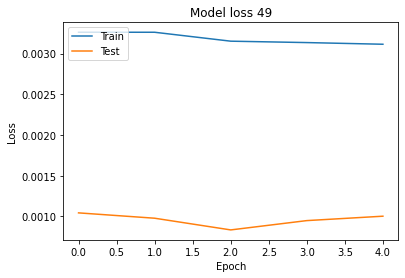

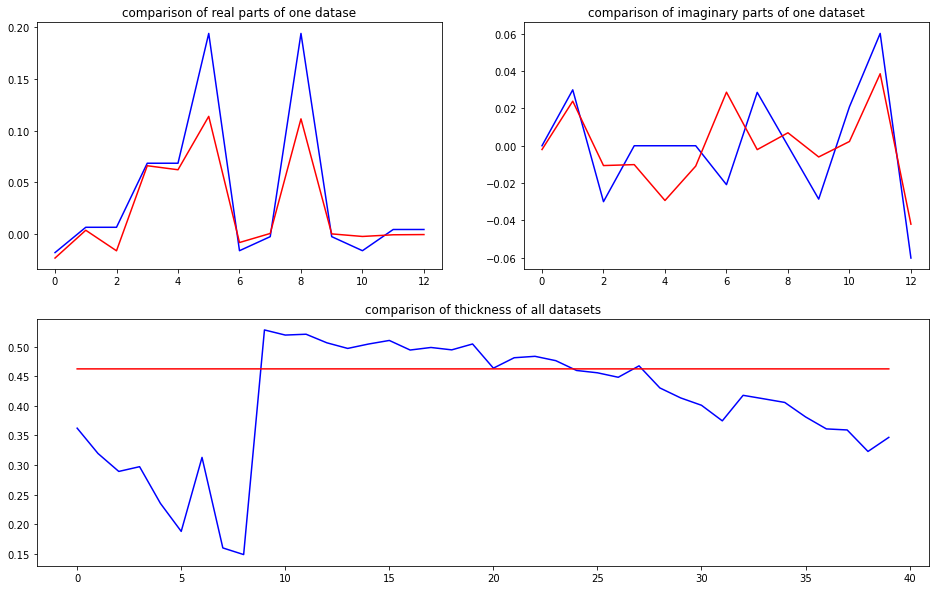

predicted thickness: 0.29114604


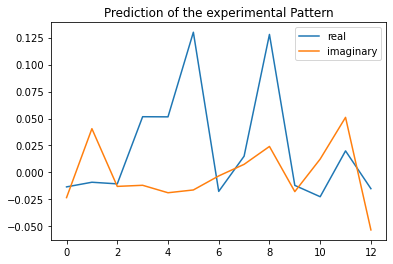

The offset applied on thickness: -0.0002493979203489889

The offset applied on Ug: -2.4387524076067773

Applied shift of unit cell origin (fractional coordinates): -0.013016045551691802 -0.017996413424403373
Ug[ 0 ]: 0.01514 3.14159  =>  0.01514 3.14159
Ug[ 1 ]: 0.02775 2.02894  =>  0.02775 1.91586
Ug[ 2 ]: 0.02775 -2.02894  =>  0.02775 -1.91586
Ug[ 3 ]: 0.04467 0.08178  =>  0.04467 0.0
Ug[ 4 ]: 0.04467 -0.08178  =>  0.04467 -0.0
Ug[ 5 ]: 0.08966 -0.22615  =>  0.08966 0.0
Ug[ 6 ]: 0.02246 -2.80823  =>  0.02246 -2.77694
Ug[ 7 ]: 0.01293 1.52212  =>  0.01293 1.71698
Ug[ 8 ]: 0.08966 0.22615  =>  0.08966 -0.0
Ug[ 9 ]: 0.01293 -1.52212  =>  0.01293 -1.71698
Ug[ 10 ]: 0.02246 2.80823  =>  0.02246 2.77694
Ug[ 11 ]: 0.0531 1.66361  =>  0.0531 1.82718
Ug[ 12 ]: 0.0531 -1.66361  =>  0.0531 -1.82718
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

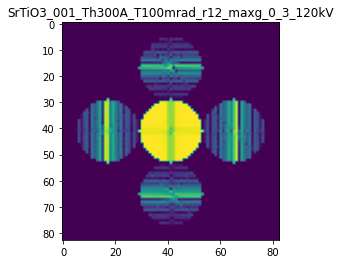

X_sim.max(): 0.9936197398643634
>>>replaced the 50. dataset and train: 
Epoch 1/5
5/5 [==============================] - 9s 1s/step - loss: 0.0030 - mean_absolute_error: 0.0368 - acc: 0.9600 - val_loss: 9.2773e-04 - val_mean_absolute_error: 0.0201 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 3s 741ms/step - loss: 0.0031 - mean_absolute_error: 0.0370 - acc: 0.9600 - val_loss: 9.1622e-04 - val_mean_absolute_error: 0.0199 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 588ms/step - loss: 0.0032 - mean_absolute_error: 0.0381 - acc: 0.9600 - val_loss: 0.0012 - val_mean_absolute_error: 0.0239 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 4s 796ms/step - loss: 0.0032 - mean_absolute_error: 0.0377 - acc: 0.9600 - val_loss: 8.8119e-04 - val_mean_absolute_error: 0.0178 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 3s 709ms/step - loss: 0.0031 - mean_absolute_error: 0.0372 - acc: 0.9600 - val_loss: 0.0011 - val_

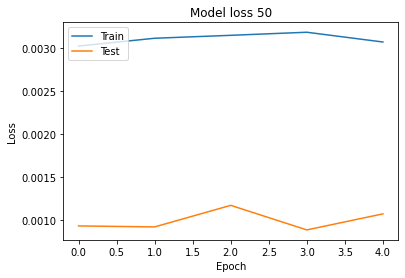

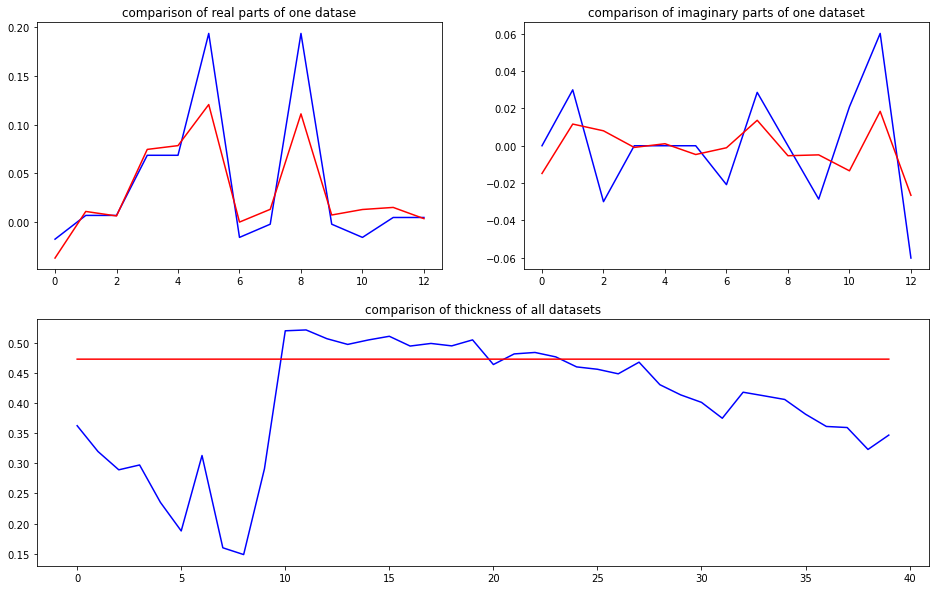

predicted thickness: 0.29450122


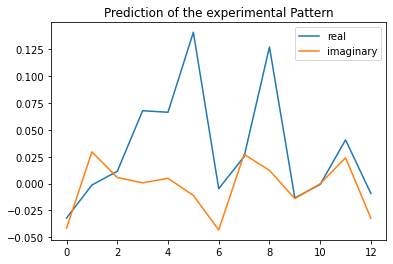

The offset applied on thickness: -0.0002495864166445376

The offset applied on Ug: 2.8122399625827765

Applied shift of unit cell origin (fractional coordinates): 0.0033983292647972443 0.00030901587050278937
Ug[ 0 ]: 0.0243 3.14159  =>  0.0243 3.14159
Ug[ 1 ]: 0.01444 1.10417  =>  0.01444 1.10611
Ug[ 2 ]: 0.01444 -1.10417  =>  0.01444 -1.10611
Ug[ 3 ]: 0.07971 -0.02135  =>  0.07971 0.0
Ug[ 4 ]: 0.07971 0.02135  =>  0.07971 0.0
Ug[ 5 ]: 0.18474 0.00388  =>  0.18474 0.0
Ug[ 6 ]: 0.01885 -1.5774  =>  0.01885 -1.55799
Ug[ 7 ]: 0.02382 1.21437  =>  0.02382 1.19108
Ug[ 8 ]: 0.18474 -0.00388  =>  0.18474 0.0
Ug[ 9 ]: 0.02382 -1.21437  =>  0.02382 -1.19108
Ug[ 10 ]: 0.01885 1.5774  =>  0.01885 1.55799
Ug[ 11 ]: 0.03671 0.98072  =>  0.03671 0.93801
Ug[ 12 ]: 0.03671 -0.98072  =>  0.03671 -0.93801
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTi

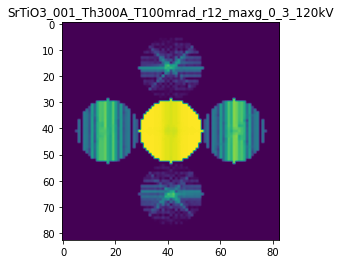

X_sim.max(): 0.9871163939982424
>>>replaced the 51. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 867ms/step - loss: 0.0031 - mean_absolute_error: 0.0372 - acc: 0.9600 - val_loss: 8.9071e-04 - val_mean_absolute_error: 0.0204 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 3s 563ms/step - loss: 0.0030 - mean_absolute_error: 0.0367 - acc: 0.9600 - val_loss: 9.0836e-04 - val_mean_absolute_error: 0.0196 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 586ms/step - loss: 0.0030 - mean_absolute_error: 0.0363 - acc: 0.9600 - val_loss: 9.5369e-04 - val_mean_absolute_error: 0.0214 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 4s 901ms/step - loss: 0.0031 - mean_absolute_error: 0.0370 - acc: 0.9600 - val_loss: 0.0011 - val_mean_absolute_error: 0.0196 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 4s 894ms/step - loss: 0.0030 - mean_absolute_error: 0.0370 - acc: 0.9600 - val_loss: 9.9652e-04

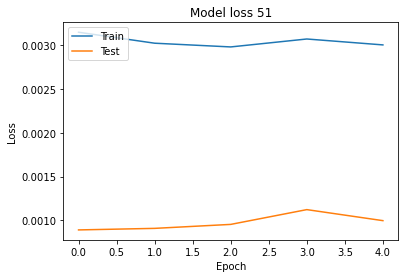

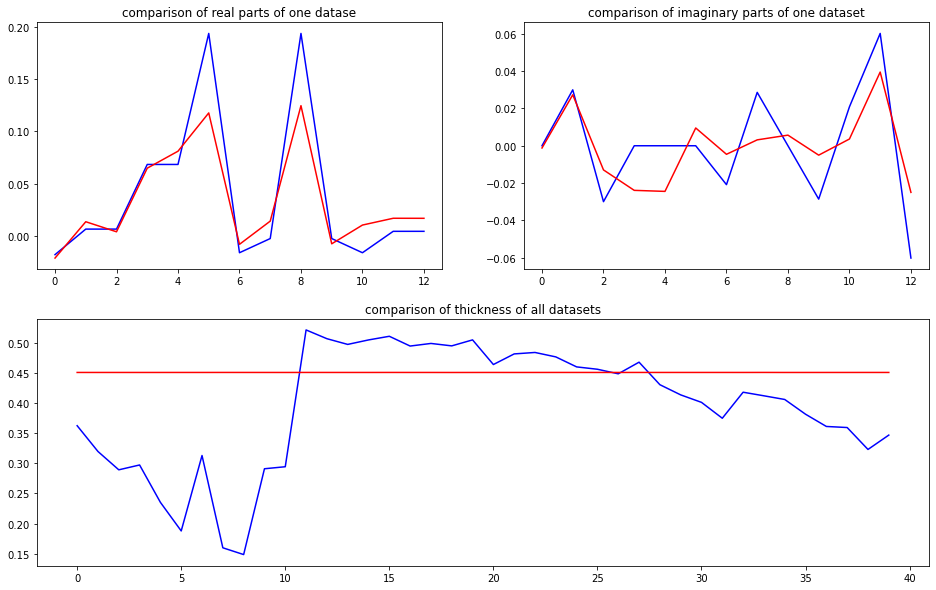

predicted thickness: 0.1526892


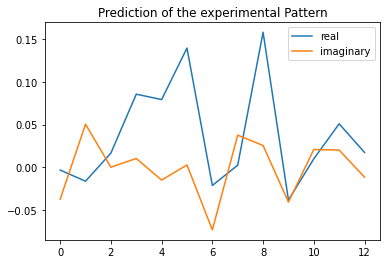

The offset applied on thickness: -0.00016412129308822587

The offset applied on Ug: 1.7836252986636838

Applied shift of unit cell origin (fractional coordinates): -0.02308506010731765 -0.009165864231480077
Ug[ 0 ]: 0.00066 3.14159  =>  0.00066 3.14159
Ug[ 1 ]: 0.02744 1.45974  =>  0.02744 1.40215
Ug[ 2 ]: 0.02744 -1.45974  =>  0.02744 -1.40215
Ug[ 3 ]: 0.09589 0.14505  =>  0.09589 0.0
Ug[ 4 ]: 0.09589 -0.14505  =>  0.09589 0.0
Ug[ 5 ]: 0.19027 -0.11518  =>  0.19027 0.0
Ug[ 6 ]: 0.04265 -1.56833  =>  0.04265 -1.65579
Ug[ 7 ]: 0.04041 1.91917  =>  0.04041 2.1218
Ug[ 8 ]: 0.19027 0.11518  =>  0.19027 -0.0
Ug[ 9 ]: 0.04041 -1.91917  =>  0.04041 -2.1218
Ug[ 10 ]: 0.04265 1.56833  =>  0.04265 1.65579
Ug[ 11 ]: 0.04165 0.46326  =>  0.04165 0.75335
Ug[ 12 ]: 0.04165 -0.46326  =>  0.04165 -0.75335
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

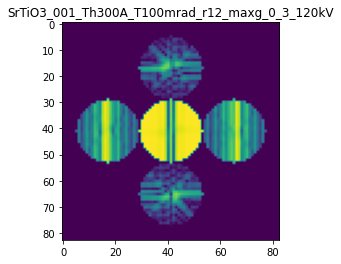

X_sim.max(): 0.9838213466945134
>>>replaced the 52. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 860ms/step - loss: 0.0029 - mean_absolute_error: 0.0360 - acc: 0.9500 - val_loss: 8.9722e-04 - val_mean_absolute_error: 0.0191 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 555ms/step - loss: 0.0031 - mean_absolute_error: 0.0374 - acc: 0.9400 - val_loss: 0.0011 - val_mean_absolute_error: 0.0227 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 551ms/step - loss: 0.0031 - mean_absolute_error: 0.0371 - acc: 0.9500 - val_loss: 0.0014 - val_mean_absolute_error: 0.0203 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 588ms/step - loss: 0.0030 - mean_absolute_error: 0.0363 - acc: 0.9500 - val_loss: 0.0011 - val_mean_absolute_error: 0.0226 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 773ms/step - loss: 0.0030 - mean_absolute_error: 0.0362 - acc: 0.9500 - val_loss: 8.4350e-04 - val_m

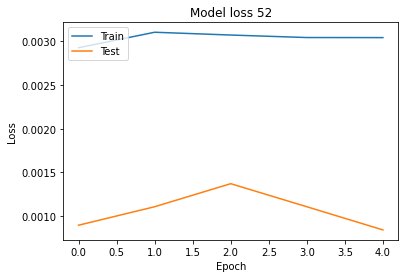

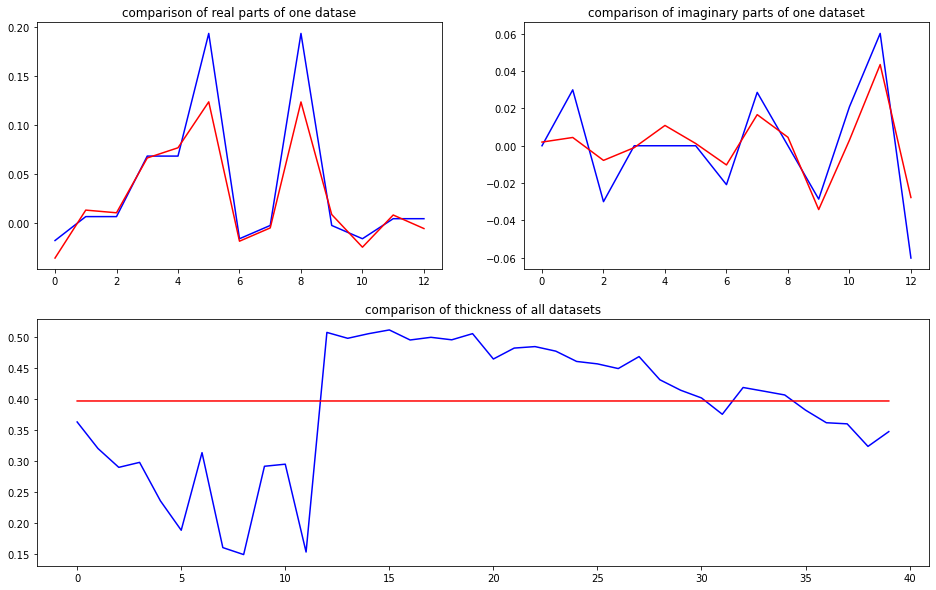

predicted thickness: 0.17359008


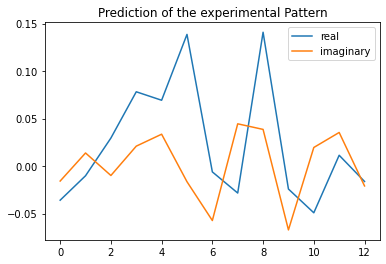

The offset applied on thickness: 0.0007223032065823079

The offset applied on Ug: -0.29029697848283914

Applied shift of unit cell origin (fractional coordinates): 0.014059177671498021 -0.016009237811809914
Ug[ 0 ]: 0.03634 3.14159  =>  0.03634 3.14159
Ug[ 1 ]: 0.01526 0.89943  =>  0.01526 0.79884
Ug[ 2 ]: 0.01526 -0.89943  =>  0.01526 -0.79884
Ug[ 3 ]: 0.07225 -0.08834  =>  0.07225 0.0
Ug[ 4 ]: 0.07225 0.08834  =>  0.07225 -0.0
Ug[ 5 ]: 0.1366 -0.20118  =>  0.1366 -0.0
Ug[ 6 ]: 0.04793 -2.2082  =>  0.04793 -2.01928
Ug[ 7 ]: 0.06252 2.02459  =>  0.06252 2.03684
Ug[ 8 ]: 0.1366 0.20118  =>  0.1366 0.0
Ug[ 9 ]: 0.06252 -2.02459  =>  0.06252 -2.03684
Ug[ 10 ]: 0.04793 2.2082  =>  0.04793 2.01928
Ug[ 11 ]: 0.02817 1.66685  =>  0.02817 1.49018
Ug[ 12 ]: 0.02817 -1.66685  =>  0.02817 -1.49018
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO

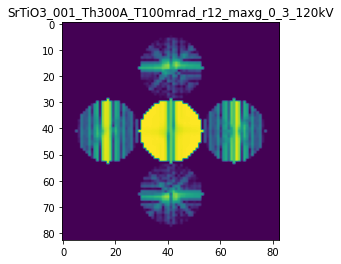

X_sim.max(): 0.9911308907395756
>>>replaced the 53. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 846ms/step - loss: 0.0029 - mean_absolute_error: 0.0349 - acc: 0.9500 - val_loss: 8.9139e-04 - val_mean_absolute_error: 0.0184 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 2s 535ms/step - loss: 0.0028 - mean_absolute_error: 0.0350 - acc: 0.9500 - val_loss: 0.0011 - val_mean_absolute_error: 0.0207 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 547ms/step - loss: 0.0030 - mean_absolute_error: 0.0358 - acc: 0.9500 - val_loss: 9.0837e-04 - val_mean_absolute_error: 0.0194 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 571ms/step - loss: 0.0030 - mean_absolute_error: 0.0363 - acc: 0.9500 - val_loss: 0.0010 - val_mean_absolute_error: 0.0198 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 654ms/step - loss: 0.0028 - mean_absolute_error: 0.0350 - acc: 0.9500 - val_loss: 8.5625e-04 - v

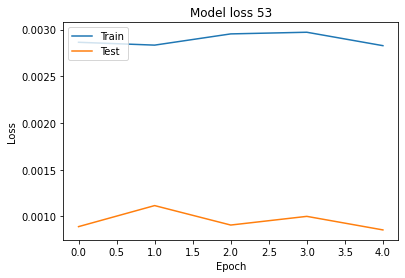

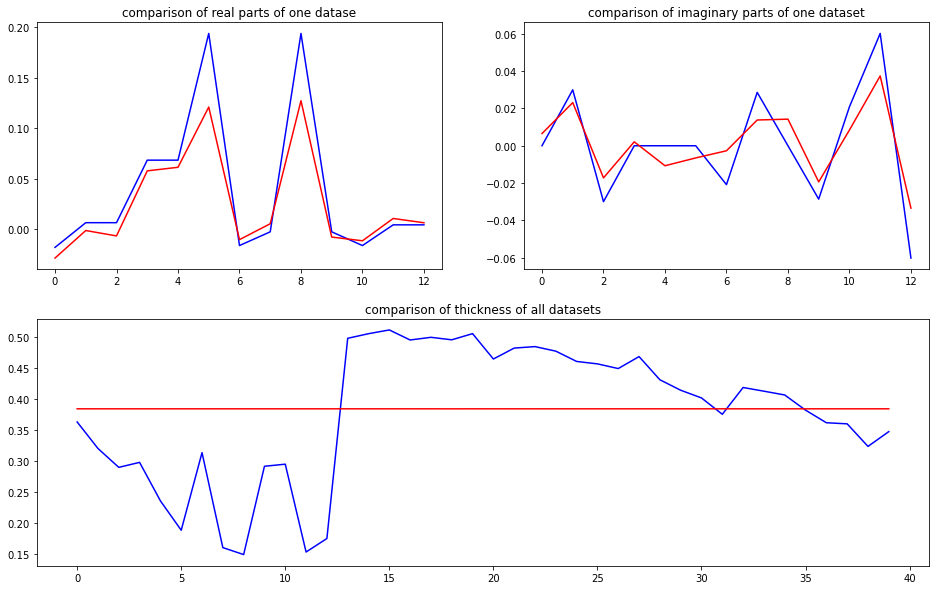

predicted thickness: 0.19519009


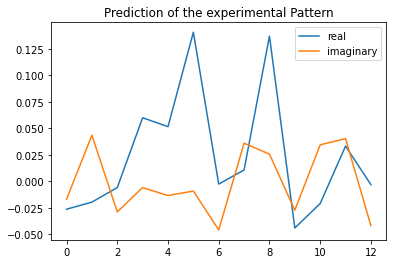

The offset applied on thickness: -0.0005067234278564978

The offset applied on Ug: -2.0806515494824076

Applied shift of unit cell origin (fractional coordinates): -0.010352381823394707 -0.013981232839799974
Ug[ 0 ]: 0.02839 3.14159  =>  0.02839 3.14159
Ug[ 1 ]: 0.03804 2.00625  =>  0.03804 1.9184
Ug[ 2 ]: 0.03804 -2.00625  =>  0.03804 -1.9184
Ug[ 3 ]: 0.04907 0.06505  =>  0.04907 0.0
Ug[ 4 ]: 0.04907 -0.06505  =>  0.04907 -0.0
Ug[ 5 ]: 0.0994 -0.17569  =>  0.0994 0.0
Ug[ 6 ]: 0.04343 -1.9404  =>  0.04343 -1.91759
Ug[ 7 ]: 0.03952 2.12929  =>  0.03952 2.28219
Ug[ 8 ]: 0.0994 0.17569  =>  0.0994 -0.0
Ug[ 9 ]: 0.03952 -2.12929  =>  0.03952 -2.28219
Ug[ 10 ]: 0.04343 1.9404  =>  0.04343 1.91759
Ug[ 11 ]: 0.0417 1.3204  =>  0.0417 1.45049
Ug[ 12 ]: 0.0417 -1.3204  =>  0.0417 -1.45049
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_T

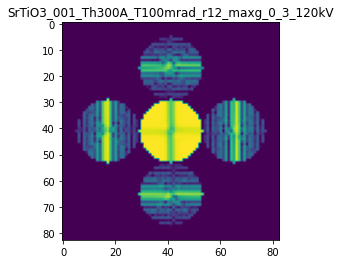

X_sim.max(): 0.9961283356367965
>>>replaced the 54. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 849ms/step - loss: 0.0028 - mean_absolute_error: 0.0345 - acc: 0.9500 - val_loss: 0.0012 - val_mean_absolute_error: 0.0215 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 542ms/step - loss: 0.0029 - mean_absolute_error: 0.0350 - acc: 0.9500 - val_loss: 0.0010 - val_mean_absolute_error: 0.0182 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 547ms/step - loss: 0.0029 - mean_absolute_error: 0.0349 - acc: 0.9500 - val_loss: 0.0010 - val_mean_absolute_error: 0.0182 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 567ms/step - loss: 0.0028 - mean_absolute_error: 0.0341 - acc: 0.9500 - val_loss: 9.7825e-04 - val_mean_absolute_error: 0.0207 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 769ms/step - loss: 0.0029 - mean_absolute_error: 0.0352 - acc: 0.9500 - val_loss: 0.0013 - val_mean_

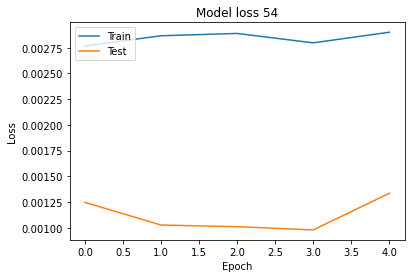

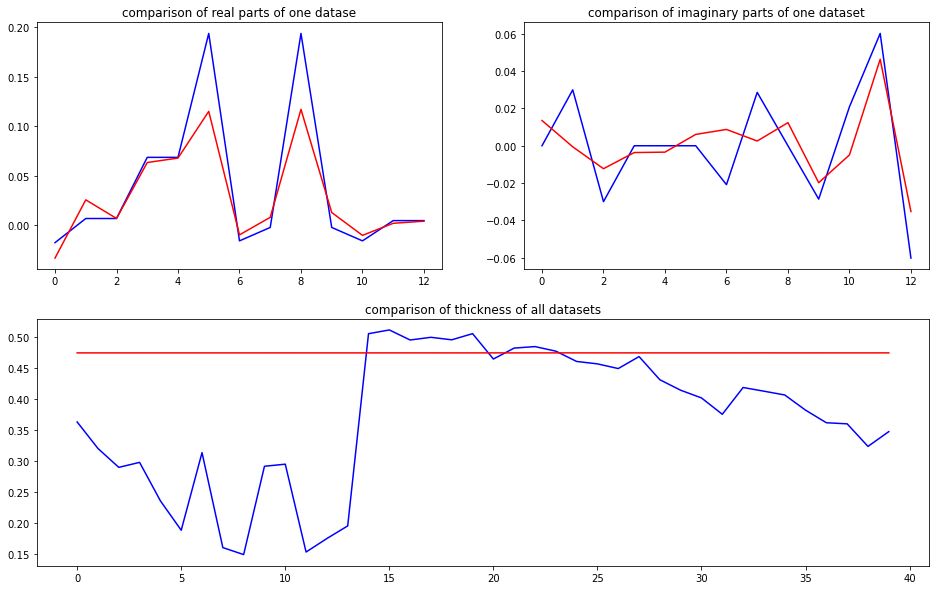

predicted thickness: 0.3396164


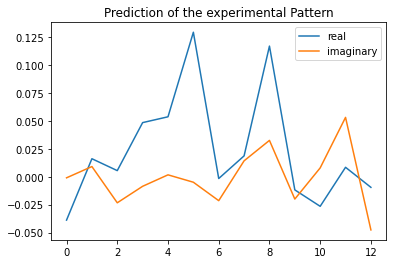

The offset applied on thickness: -0.0006714380142408005

The offset applied on Ug: 1.3440436784024896

Applied shift of unit cell origin (fractional coordinates): 0.015992914877508712 -0.00905138903719118
Ug[ 0 ]: 0.03682 3.14159  =>  0.03682 3.14159
Ug[ 1 ]: 0.01972 0.95362  =>  0.01972 0.89674
Ug[ 2 ]: 0.01972 -0.95362  =>  0.01972 -0.89674
Ug[ 3 ]: 0.05491 -0.10049  =>  0.05491 0.0
Ug[ 4 ]: 0.05491 0.10049  =>  0.05491 -0.0
Ug[ 5 ]: 0.14531 -0.11374  =>  0.14531 0.0
Ug[ 6 ]: 0.01988 -2.29899  =>  0.01988 -2.14163
Ug[ 7 ]: 0.01766 1.33173  =>  0.01766 1.28812
Ug[ 8 ]: 0.14531 0.11374  =>  0.14531 0.0
Ug[ 9 ]: 0.01766 -1.33173  =>  0.01766 -1.28812
Ug[ 10 ]: 0.01988 2.29899  =>  0.01988 2.14163
Ug[ 11 ]: 0.05092 1.51191  =>  0.05092 1.31094
Ug[ 12 ]: 0.05092 -1.51191  =>  0.05092 -1.31094
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

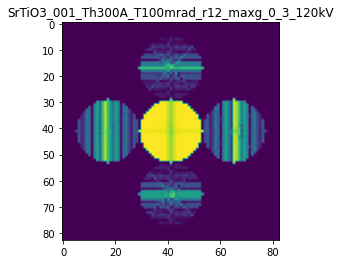

X_sim.max(): 0.9959449711537682
>>>replaced the 55. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 939ms/step - loss: 0.0030 - mean_absolute_error: 0.0349 - acc: 0.9500 - val_loss: 0.0010 - val_mean_absolute_error: 0.0219 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 586ms/step - loss: 0.0028 - mean_absolute_error: 0.0344 - acc: 0.9500 - val_loss: 0.0010 - val_mean_absolute_error: 0.0187 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 606ms/step - loss: 0.0028 - mean_absolute_error: 0.0339 - acc: 0.9600 - val_loss: 0.0014 - val_mean_absolute_error: 0.0201 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 4s 798ms/step - loss: 0.0028 - mean_absolute_error: 0.0341 - acc: 0.9500 - val_loss: 9.1473e-04 - val_mean_absolute_error: 0.0196 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 567ms/step - loss: 0.0029 - mean_absolute_error: 0.0344 - acc: 0.9500 - val_loss: 9.4072e-04 - val_m

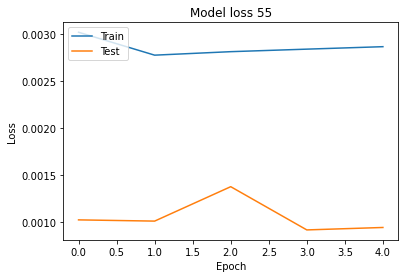

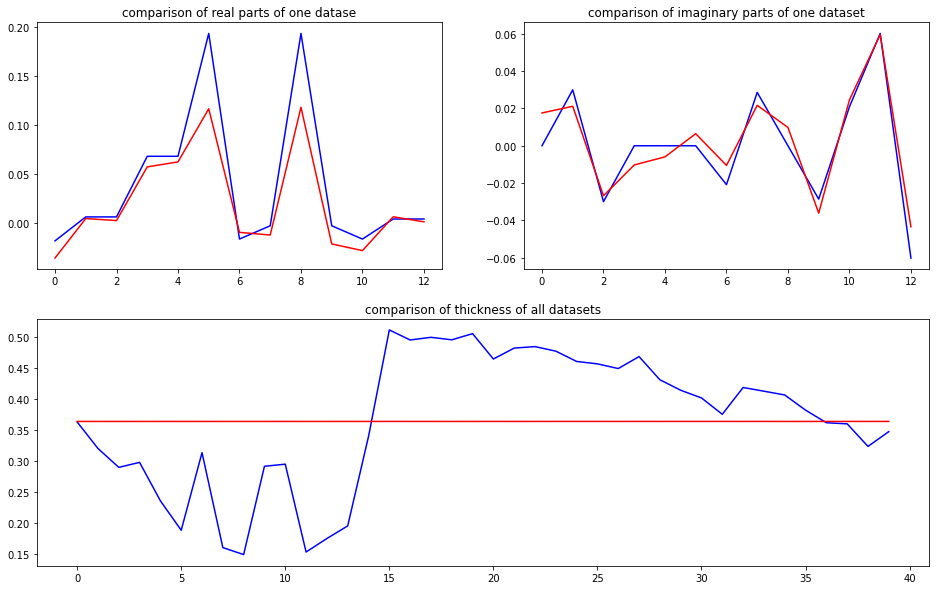

predicted thickness: 0.177759


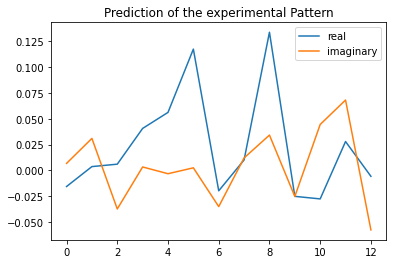

The offset applied on thickness: 0.00015203583670993147

The offset applied on Ug: -1.3440866050899578

Applied shift of unit cell origin (fractional coordinates): -0.014361622179888706 -0.010522893144622254
Ug[ 0 ]: 0.01596 3.14159  =>  0.01596 3.14159
Ug[ 1 ]: 0.03458 1.47643  =>  0.03458 1.41031
Ug[ 2 ]: 0.03458 -1.47643  =>  0.03458 -1.41031
Ug[ 3 ]: 0.04532 0.09024  =>  0.04532 0.0
Ug[ 4 ]: 0.04532 -0.09024  =>  0.04532 0.0
Ug[ 5 ]: 0.10436 -0.13223  =>  0.10436 0.0
Ug[ 6 ]: 0.04708 -2.17018  =>  0.04708 -2.1943
Ug[ 7 ]: 0.02117 1.98388  =>  0.02117 2.14023
Ug[ 8 ]: 0.10436 0.13223  =>  0.10436 0.0
Ug[ 9 ]: 0.02117 -1.98388  =>  0.02117 -2.14023
Ug[ 10 ]: 0.04708 2.17018  =>  0.04708 2.1943
Ug[ 11 ]: 0.06193 1.48625  =>  0.06193 1.66672
Ug[ 12 ]: 0.06193 -1.48625  =>  0.06193 -1.66672
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

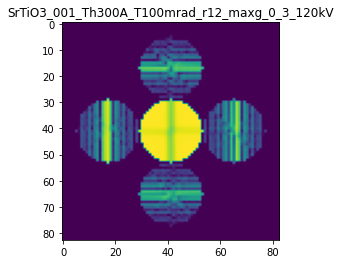

X_sim.max(): 0.9957013069661697
>>>replaced the 56. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 939ms/step - loss: 0.0027 - mean_absolute_error: 0.0337 - acc: 0.9600 - val_loss: 0.0014 - val_mean_absolute_error: 0.0229 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 545ms/step - loss: 0.0027 - mean_absolute_error: 0.0334 - acc: 0.9500 - val_loss: 9.8769e-04 - val_mean_absolute_error: 0.0205 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 555ms/step - loss: 0.0027 - mean_absolute_error: 0.0345 - acc: 0.9500 - val_loss: 0.0010 - val_mean_absolute_error: 0.0197 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 577ms/step - loss: 0.0027 - mean_absolute_error: 0.0343 - acc: 0.9500 - val_loss: 0.0011 - val_mean_absolute_error: 0.0200 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 4s 821ms/step - loss: 0.0027 - mean_absolute_error: 0.0335 - acc: 0.9500 - val_loss: 0.0010 - val_mean_

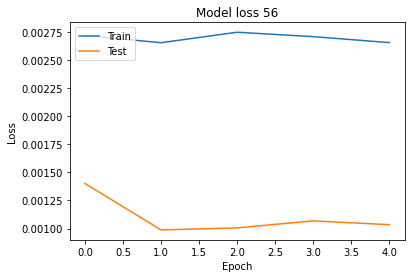

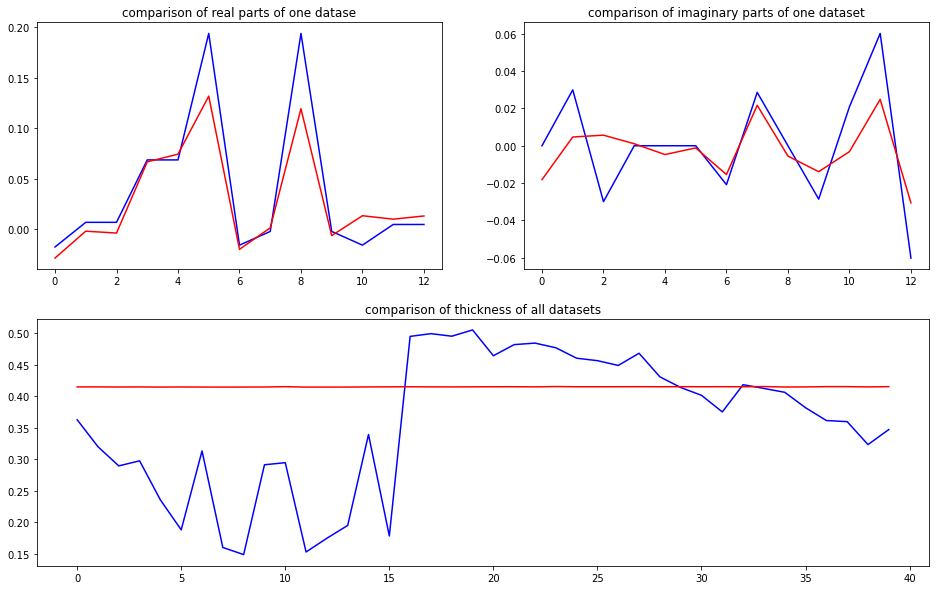

predicted thickness: 0.24201392


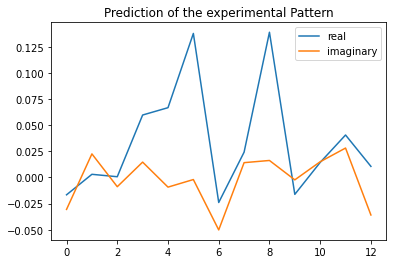

The offset applied on thickness: -0.0006239363322763115

The offset applied on Ug: 1.7647930592031305

Applied shift of unit cell origin (fractional coordinates): -0.024672615841440454 -0.004616466030291479
Ug[ 0 ]: 0.01445 3.14159  =>  0.01445 3.14159
Ug[ 1 ]: 0.01628 1.42188  =>  0.01628 1.39288
Ug[ 2 ]: 0.01628 -1.42188  =>  0.01628 -1.39288
Ug[ 3 ]: 0.07154 0.15502  =>  0.07154 0.0
Ug[ 4 ]: 0.07154 -0.15502  =>  0.07154 0.0
Ug[ 5 ]: 0.17284 -0.05801  =>  0.17284 -0.0
Ug[ 6 ]: 0.03055 -1.62448  =>  0.03055 -1.75049
Ug[ 7 ]: 0.01008 1.05499  =>  0.01008 1.23902
Ug[ 8 ]: 0.17284 0.05801  =>  0.17284 0.0
Ug[ 9 ]: 0.01008 -1.05499  =>  0.01008 -1.23902
Ug[ 10 ]: 0.03055 1.62448  =>  0.03055 1.75049
Ug[ 11 ]: 0.04415 0.85256  =>  0.04415 1.1626
Ug[ 12 ]: 0.04415 -0.85256  =>  0.04415 -1.1626
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

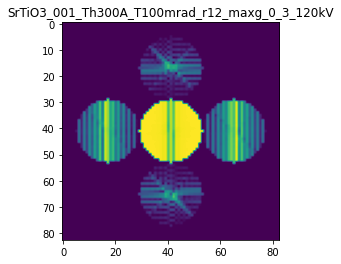

X_sim.max(): 0.9915210698049043
>>>replaced the 57. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 853ms/step - loss: 0.0026 - mean_absolute_error: 0.0335 - acc: 0.9500 - val_loss: 0.0013 - val_mean_absolute_error: 0.0234 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 552ms/step - loss: 0.0028 - mean_absolute_error: 0.0348 - acc: 0.9500 - val_loss: 9.5376e-04 - val_mean_absolute_error: 0.0203 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 569ms/step - loss: 0.0027 - mean_absolute_error: 0.0342 - acc: 0.9500 - val_loss: 9.0547e-04 - val_mean_absolute_error: 0.0190 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 4s 789ms/step - loss: 0.0027 - mean_absolute_error: 0.0342 - acc: 0.9500 - val_loss: 0.0011 - val_mean_absolute_error: 0.0213 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 718ms/step - loss: 0.0027 - mean_absolute_error: 0.0346 - acc: 0.9500 - val_loss: 0.0017 - val_m

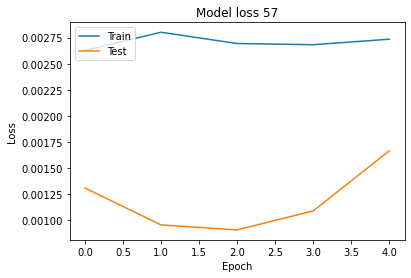

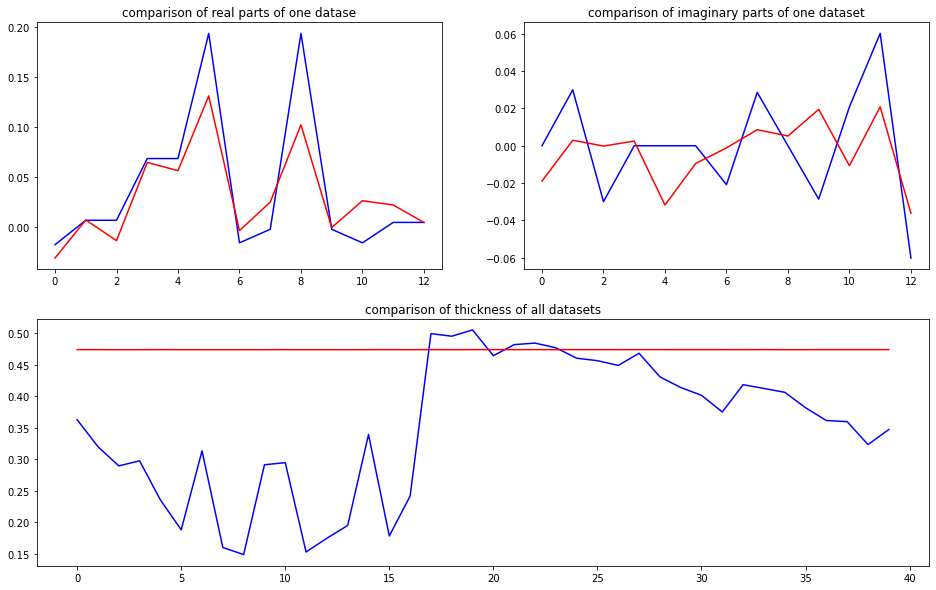

predicted thickness: 0.32521674


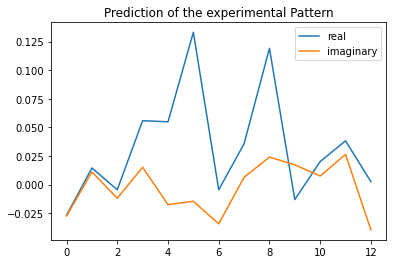

The offset applied on thickness: 0.00012352773203482516

The offset applied on Ug: -2.6269556579726294

Applied shift of unit cell origin (fractional coordinates): -0.05375822442141244 -0.018845921438381513
Ug[ 0 ]: 0.03075 3.14159  =>  0.03075 3.14159
Ug[ 1 ]: 0.01211 1.20955  =>  0.01211 1.09114
Ug[ 2 ]: 0.01211 -1.20955  =>  0.01211 -1.09114
Ug[ 3 ]: 0.04937 0.33777  =>  0.04937 -0.0
Ug[ 4 ]: 0.04937 -0.33777  =>  0.04937 0.0
Ug[ 5 ]: 0.08556 -0.23682  =>  0.08556 0.0
Ug[ 6 ]: 0.02269 -1.32348  =>  0.02269 -1.54284
Ug[ 7 ]: 0.01082 -0.60791  =>  0.01082 -0.15172
Ug[ 8 ]: 0.08556 0.23682  =>  0.08556 -0.0
Ug[ 9 ]: 0.01082 0.60791  =>  0.01082 0.15172
Ug[ 10 ]: 0.02269 1.32348  =>  0.02269 1.54284
Ug[ 11 ]: 0.03623 1.13097  =>  0.03623 1.80651
Ug[ 12 ]: 0.03623 -1.13097  =>  0.03623 -1.80651
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations/

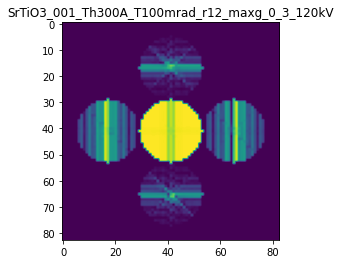

X_sim.max(): 0.994747938765468
>>>replaced the 58. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 869ms/step - loss: 0.0028 - mean_absolute_error: 0.0354 - acc: 0.9500 - val_loss: 8.7178e-04 - val_mean_absolute_error: 0.0183 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 601ms/step - loss: 0.0026 - mean_absolute_error: 0.0334 - acc: 0.9500 - val_loss: 0.0011 - val_mean_absolute_error: 0.0220 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 4s 780ms/step - loss: 0.0028 - mean_absolute_error: 0.0348 - acc: 0.9400 - val_loss: 0.0017 - val_mean_absolute_error: 0.0225 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 5s 939ms/step - loss: 0.0027 - mean_absolute_error: 0.0332 - acc: 0.9500 - val_loss: 0.0010 - val_mean_absolute_error: 0.0199 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 4s 916ms/step - loss: 0.0027 - mean_absolute_error: 0.0338 - acc: 0.9500 - val_loss: 8.3653e-04 - val_me

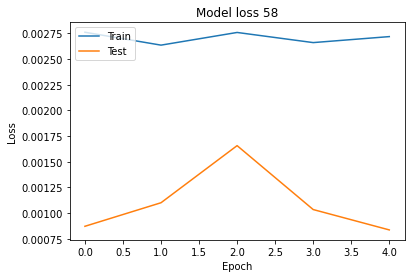

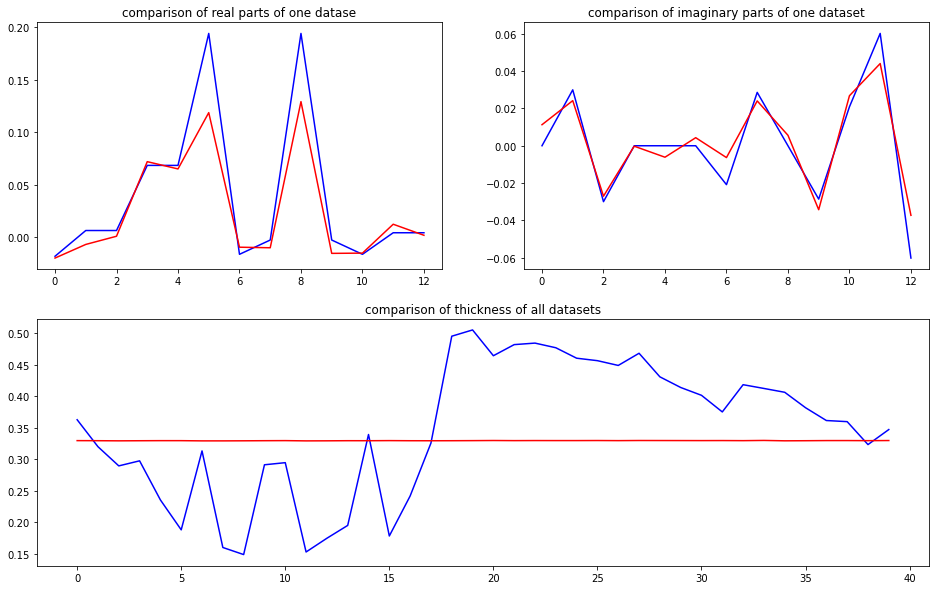

predicted thickness: 0.29543322


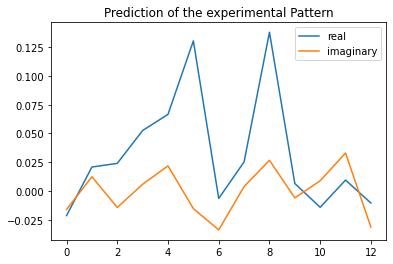

The offset applied on thickness: 0.0007738028357832898

The offset applied on Ug: -1.431356086815837

Applied shift of unit cell origin (fractional coordinates): 0.020025070543657437 -0.014638260436271294
Ug[ 0 ]: 0.02248 3.14159  =>  0.02248 3.14159
Ug[ 1 ]: 0.02528 0.56181  =>  0.02528 0.46983
Ug[ 2 ]: 0.02528 -0.56181  =>  0.02528 -0.46983
Ug[ 3 ]: 0.05448 -0.12582  =>  0.05448 -0.0
Ug[ 4 ]: 0.05448 0.12582  =>  0.05448 0.0
Ug[ 5 ]: 0.10961 -0.18395  =>  0.10961 0.0
Ug[ 6 ]: 0.02485 -2.04987  =>  0.02485 -1.83207
Ug[ 7 ]: 0.01599 0.28724  =>  0.01599 0.25339
Ug[ 8 ]: 0.10961 0.18395  =>  0.10961 -0.0
Ug[ 9 ]: 0.01599 -0.28724  =>  0.01599 -0.25339
Ug[ 10 ]: 0.02485 2.04987  =>  0.02485 1.83207
Ug[ 11 ]: 0.03226 1.63846  =>  0.03226 1.38681
Ug[ 12 ]: 0.03226 -1.63846  =>  0.03226 -1.38681
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//S

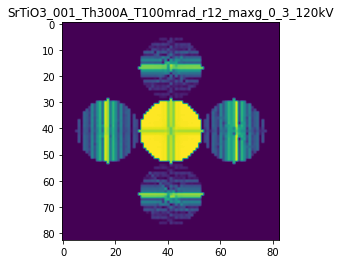

X_sim.max(): 0.9894789789981175
>>>replaced the 59. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 851ms/step - loss: 0.0027 - mean_absolute_error: 0.0334 - acc: 0.9500 - val_loss: 0.0016 - val_mean_absolute_error: 0.0233 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 588ms/step - loss: 0.0027 - mean_absolute_error: 0.0343 - acc: 0.9500 - val_loss: 8.7523e-04 - val_mean_absolute_error: 0.0191 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 594ms/step - loss: 0.0026 - mean_absolute_error: 0.0324 - acc: 0.9500 - val_loss: 0.0010 - val_mean_absolute_error: 0.0205 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 4s 796ms/step - loss: 0.0025 - mean_absolute_error: 0.0330 - acc: 0.9500 - val_loss: 8.4294e-04 - val_mean_absolute_error: 0.0175 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 4s 778ms/step - loss: 0.0025 - mean_absolute_error: 0.0318 - acc: 0.9500 - val_loss: 9.5304e-04 - v

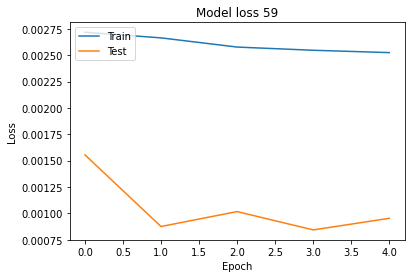

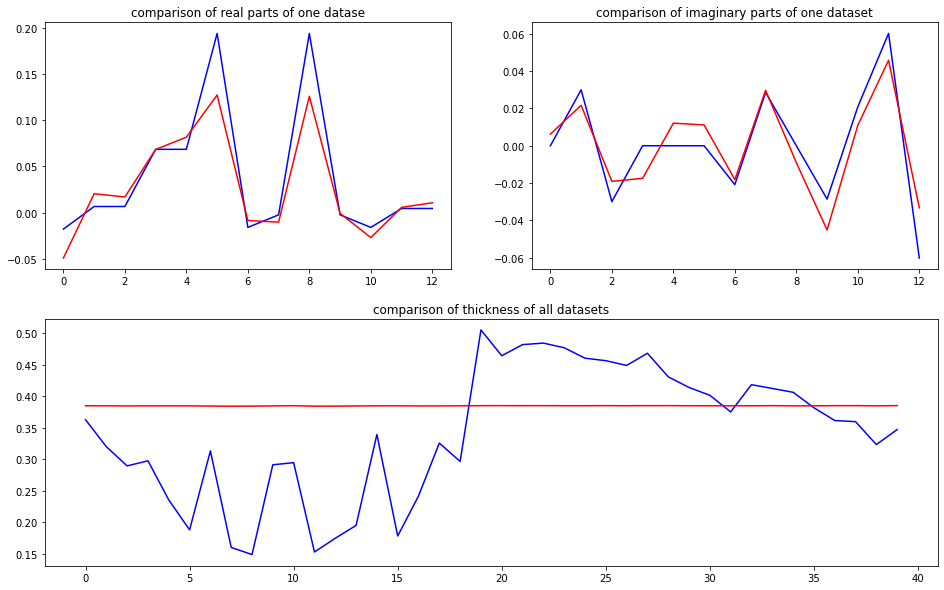

predicted thickness: 0.32307872


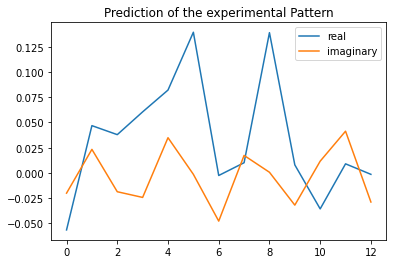

The offset applied on thickness: 0.0007345979884551388

The offset applied on Ug: 1.610013950948964

Applied shift of unit cell origin (fractional coordinates): 0.06268044151468748 -0.0004021801193284236
Ug[ 0 ]: 0.05075 3.14159  =>  0.05075 3.14159
Ug[ 1 ]: 0.05099 0.44473  =>  0.05099 0.4422
Ug[ 2 ]: 0.05099 -0.44473  =>  0.05099 -0.4422
Ug[ 3 ]: 0.08788 -0.39383  =>  0.08788 -0.0
Ug[ 4 ]: 0.08788 0.39383  =>  0.08788 0.0
Ug[ 5 ]: 0.1705 -0.00505  =>  0.1705 0.0
Ug[ 6 ]: 0.03309 -2.08098  =>  0.03309 -1.68462
Ug[ 7 ]: 0.02615 1.16973  =>  0.02615 0.77842
Ug[ 8 ]: 0.1705 0.00505  =>  0.1705 0.0
Ug[ 9 ]: 0.02615 -1.16973  =>  0.02615 -0.77842
Ug[ 10 ]: 0.03309 2.08098  =>  0.03309 1.68462
Ug[ 11 ]: 0.03642 1.40837  =>  0.03642 0.6207
Ug[ 12 ]: 0.03642 -1.40837  =>  0.03642 -0.6207
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_

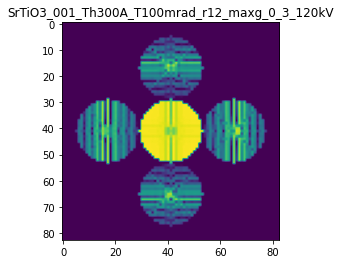

X_sim.max(): 0.9959259425693572
>>>replaced the 60. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 856ms/step - loss: 0.0025 - mean_absolute_error: 0.0322 - acc: 0.9500 - val_loss: 0.0013 - val_mean_absolute_error: 0.0214 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 544ms/step - loss: 0.0025 - mean_absolute_error: 0.0329 - acc: 0.9600 - val_loss: 9.2028e-04 - val_mean_absolute_error: 0.0185 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 556ms/step - loss: 0.0025 - mean_absolute_error: 0.0317 - acc: 0.9500 - val_loss: 9.6378e-04 - val_mean_absolute_error: 0.0179 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 778ms/step - loss: 0.0024 - mean_absolute_error: 0.0316 - acc: 0.9500 - val_loss: 8.8313e-04 - val_mean_absolute_error: 0.0179 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 546ms/step - loss: 0.0024 - mean_absolute_error: 0.0316 - acc: 0.9500 - val_loss: 9.6367e-04

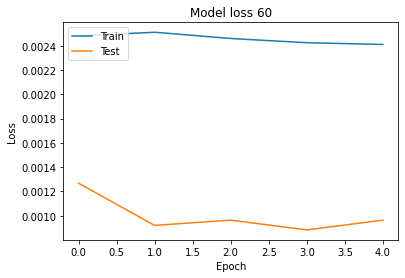

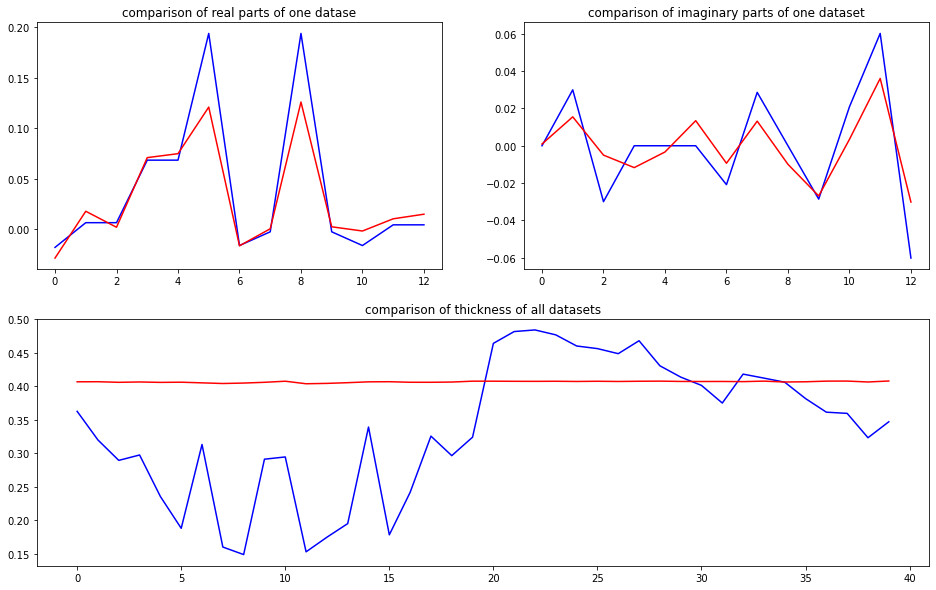

predicted thickness: 0.3178227


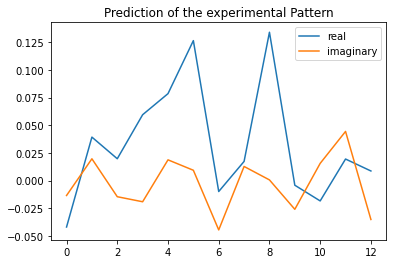

The offset applied on thickness: 0.000460159862330479

The offset applied on Ug: -2.0002237201668125

Applied shift of unit cell origin (fractional coordinates): 0.045727648203005435 0.004131265969814691
Ug[ 0 ]: 0.04575 3.14159  =>  0.04575 3.14159
Ug[ 1 ]: 0.03142 0.53558  =>  0.03142 0.56154
Ug[ 2 ]: 0.03142 -0.53558  =>  0.03142 -0.56154
Ug[ 3 ]: 0.06114 -0.28732  =>  0.06114 0.0
Ug[ 4 ]: 0.06114 0.28732  =>  0.06114 -0.0
Ug[ 5 ]: 0.09634 0.05192  =>  0.09634 0.0
Ug[ 6 ]: 0.03576 -2.05738  =>  0.03576 -1.79602
Ug[ 7 ]: 0.02037 1.29845  =>  0.02037 0.98517
Ug[ 8 ]: 0.09634 -0.05192  =>  0.09634 0.0
Ug[ 9 ]: 0.02037 -1.29845  =>  0.02037 -0.98517
Ug[ 10 ]: 0.03576 2.05738  =>  0.03576 1.79602
Ug[ 11 ]: 0.04023 1.30766  =>  0.04023 0.73303
Ug[ 12 ]: 0.04023 -1.30766  =>  0.04023 -0.73303
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrT

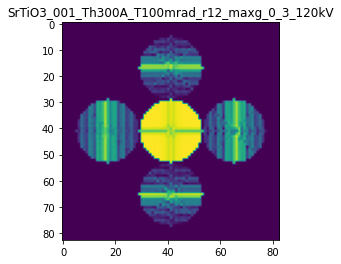

X_sim.max(): 0.9896860264588019
>>>replaced the 61. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 840ms/step - loss: 0.0024 - mean_absolute_error: 0.0312 - acc: 0.9500 - val_loss: 9.1581e-04 - val_mean_absolute_error: 0.0189 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 536ms/step - loss: 0.0024 - mean_absolute_error: 0.0308 - acc: 0.9500 - val_loss: 9.9686e-04 - val_mean_absolute_error: 0.0184 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 543ms/step - loss: 0.0023 - mean_absolute_error: 0.0312 - acc: 0.9500 - val_loss: 8.8288e-04 - val_mean_absolute_error: 0.0188 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 669ms/step - loss: 0.0024 - mean_absolute_error: 0.0321 - acc: 0.9500 - val_loss: 0.0010 - val_mean_absolute_error: 0.0205 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 572ms/step - loss: 0.0024 - mean_absolute_error: 0.0324 - acc: 0.9500 - val_loss: 0.0011 - v

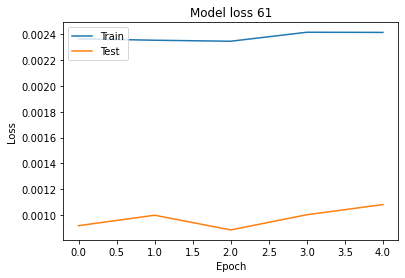

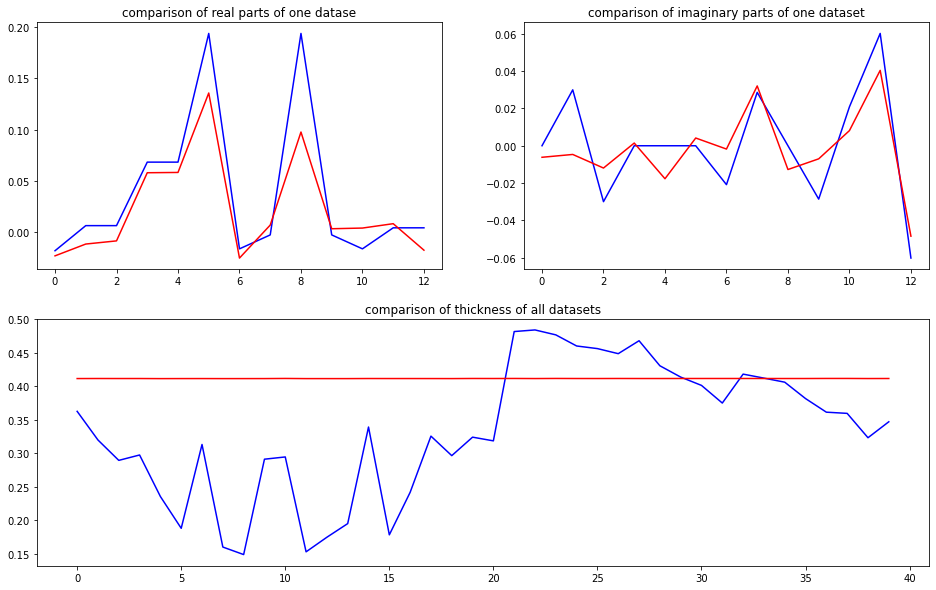

predicted thickness: 0.3804856


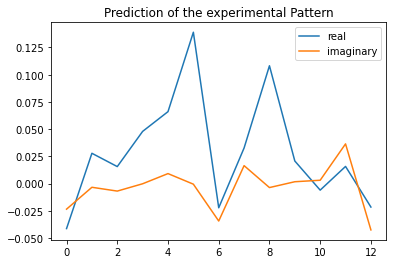

The offset applied on thickness: -0.0003967085196286009

The offset applied on Ug: 1.8406298238291412

Applied shift of unit cell origin (fractional coordinates): 0.018351850389644087 0.007347858314023358
Ug[ 0 ]: 0.03721 3.14159  =>  0.03721 3.14159
Ug[ 1 ]: 0.02279 0.09951  =>  0.02279 0.14568
Ug[ 2 ]: 0.02279 -0.09951  =>  0.02279 -0.14568
Ug[ 3 ]: 0.06361 -0.11531  =>  0.06361 -0.0
Ug[ 4 ]: 0.06361 0.11531  =>  0.06361 0.0
Ug[ 5 ]: 0.15282 0.09234  =>  0.15282 0.0
Ug[ 6 ]: 0.02142 -2.19809  =>  0.02142 -2.12895
Ug[ 7 ]: 0.02953 0.28655  =>  0.02953 0.12508
Ug[ 8 ]: 0.15282 -0.09234  =>  0.15282 0.0
Ug[ 9 ]: 0.02953 -0.28655  =>  0.02953 -0.12508
Ug[ 10 ]: 0.02142 2.19809  =>  0.02142 2.12895
Ug[ 11 ]: 0.03912 1.55524  =>  0.03912 1.32463
Ug[ 12 ]: 0.03912 -1.55524  =>  0.03912 -1.32463
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

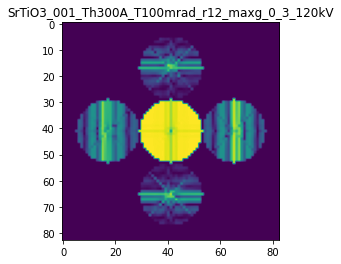

X_sim.max(): 0.9957983143778155
>>>replaced the 62. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 845ms/step - loss: 0.0023 - mean_absolute_error: 0.0318 - acc: 0.9500 - val_loss: 9.0096e-04 - val_mean_absolute_error: 0.0188 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 544ms/step - loss: 0.0023 - mean_absolute_error: 0.0307 - acc: 0.9500 - val_loss: 8.3640e-04 - val_mean_absolute_error: 0.0167 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 551ms/step - loss: 0.0023 - mean_absolute_error: 0.0305 - acc: 0.9500 - val_loss: 0.0014 - val_mean_absolute_error: 0.0196 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 778ms/step - loss: 0.0023 - mean_absolute_error: 0.0303 - acc: 0.9500 - val_loss: 8.0329e-04 - val_mean_absolute_error: 0.0179 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 560ms/step - loss: 0.0024 - mean_absolute_error: 0.0309 - acc: 0.9500 - val_loss: 8.6802e-04

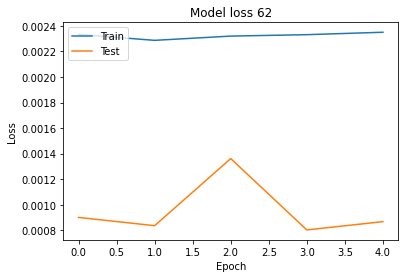

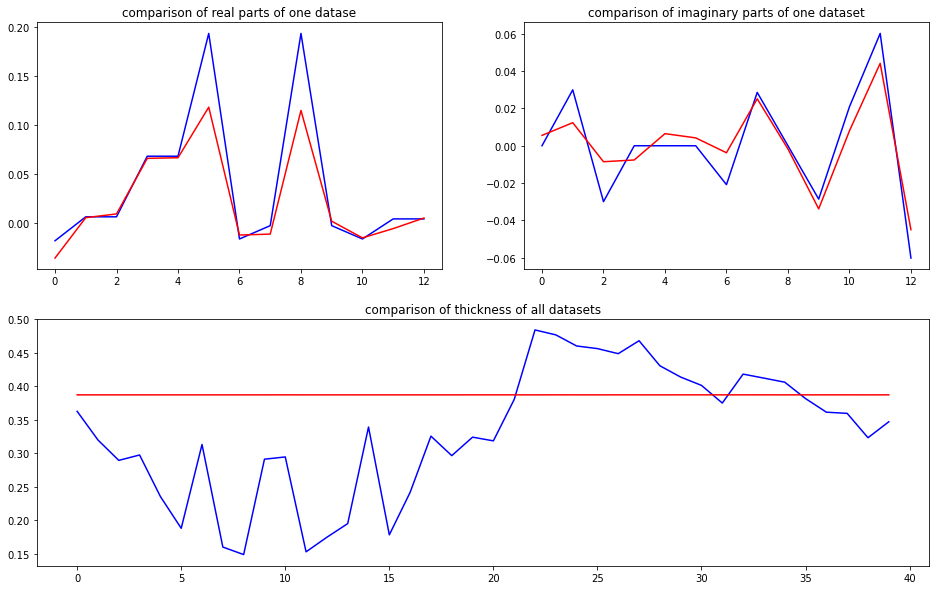

predicted thickness: 0.35064542


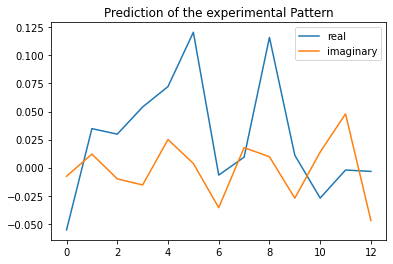

The offset applied on thickness: -0.0009196108515555177

The offset applied on Ug: -1.535582789191257

Applied shift of unit cell origin (fractional coordinates): 0.05116105168961363 -0.0027871078299643074
Ug[ 0 ]: 0.06036 3.14159  =>  0.06036 3.14159
Ug[ 1 ]: 0.03236 0.34062  =>  0.03236 0.32311
Ug[ 2 ]: 0.03236 -0.34062  =>  0.03236 -0.32311
Ug[ 3 ]: 0.05928 -0.32145  =>  0.05928 0.0
Ug[ 4 ]: 0.05928 0.32145  =>  0.05928 -0.0
Ug[ 5 ]: 0.09683 -0.03502  =>  0.09683 0.0
Ug[ 6 ]: 0.03121 -2.20988  =>  0.03121 -1.87091
Ug[ 7 ]: 0.02463 1.18879  =>  0.02463 0.88485
Ug[ 8 ]: 0.09683 0.03502  =>  0.09683 -0.0
Ug[ 9 ]: 0.02463 -1.18879  =>  0.02463 -0.88485
Ug[ 10 ]: 0.03121 2.20988  =>  0.03121 1.87091
Ug[ 11 ]: 0.04788 1.70114  =>  0.04788 1.05823
Ug[ 12 ]: 0.04788 -1.70114  =>  0.04788 -1.05823
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//

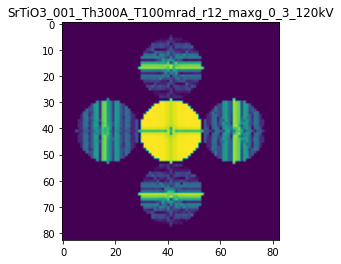

X_sim.max(): 0.9955526710384366
>>>replaced the 63. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 961ms/step - loss: 0.0022 - mean_absolute_error: 0.0297 - acc: 0.9500 - val_loss: 0.0012 - val_mean_absolute_error: 0.0191 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 2s 536ms/step - loss: 0.0024 - mean_absolute_error: 0.0309 - acc: 0.9500 - val_loss: 7.6633e-04 - val_mean_absolute_error: 0.0177 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 595ms/step - loss: 0.0024 - mean_absolute_error: 0.0310 - acc: 0.9500 - val_loss: 7.7543e-04 - val_mean_absolute_error: 0.0179 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 4s 943ms/step - loss: 0.0023 - mean_absolute_error: 0.0309 - acc: 0.9500 - val_loss: 0.0011 - val_mean_absolute_error: 0.0203 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 686ms/step - loss: 0.0023 - mean_absolute_error: 0.0305 - acc: 0.9500 - val_loss: 8.9259e-04 - v

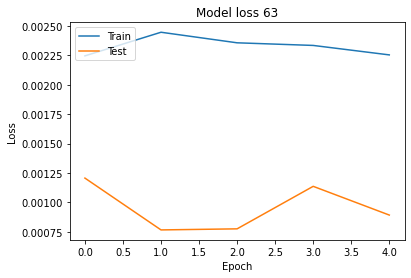

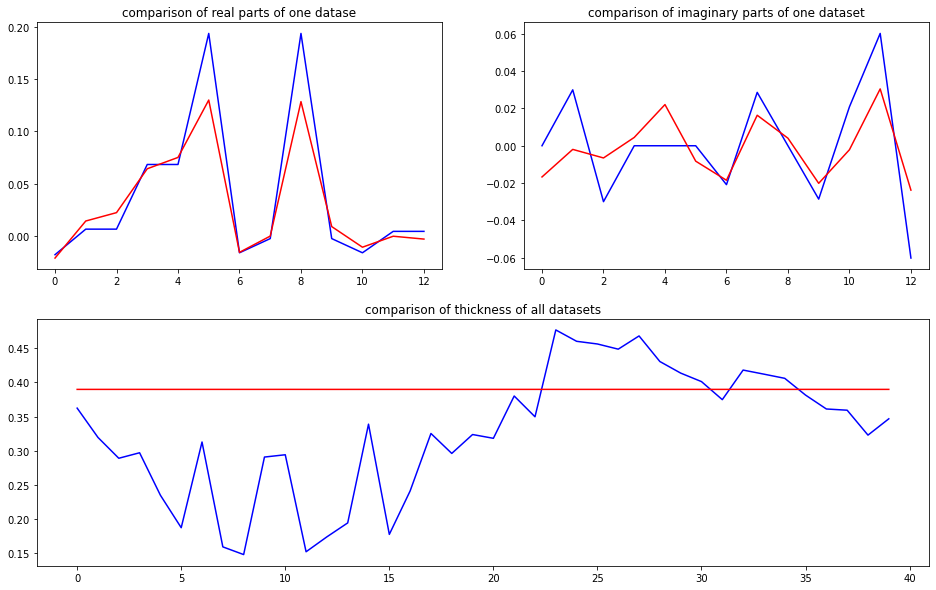

predicted thickness: 0.32297057


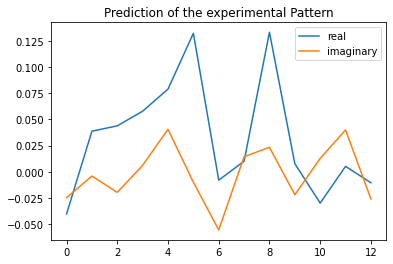

The offset applied on thickness: 0.0006342164406258102

The offset applied on Ug: 0.6068429662425167

Applied shift of unit cell origin (fractional coordinates): 0.04062693744692898 -0.009355785365856486
Ug[ 0 ]: 0.03902 3.14159  =>  0.03902 3.14159
Ug[ 1 ]: 0.04321 0.17491  =>  0.04321 0.11612
Ug[ 2 ]: 0.04321 -0.17491  =>  0.04321 -0.11612
Ug[ 3 ]: 0.07435 -0.25527  =>  0.07435 -0.0
Ug[ 4 ]: 0.07435 0.25527  =>  0.07435 0.0
Ug[ 5 ]: 0.14487 -0.11757  =>  0.14487 0.0
Ug[ 6 ]: 0.03795 -2.05589  =>  0.03795 -1.74184
Ug[ 7 ]: 0.02032 1.10013  =>  0.02032 0.90365
Ug[ 8 ]: 0.14487 0.11757  =>  0.14487 0.0
Ug[ 9 ]: 0.02032 -1.10013  =>  0.02032 -0.90365
Ug[ 10 ]: 0.03795 2.05589  =>  0.03795 1.74184
Ug[ 11 ]: 0.0333 1.62908  =>  0.0333 1.11855
Ug[ 12 ]: 0.0333 -1.62908  =>  0.0333 -1.11855
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_

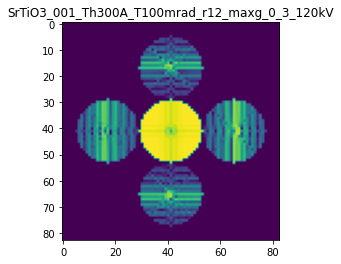

X_sim.max(): 0.9776694342067735
>>>replaced the 64. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 1s/step - loss: 0.0022 - mean_absolute_error: 0.0302 - acc: 0.9500 - val_loss: 8.3505e-04 - val_mean_absolute_error: 0.0198 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 589ms/step - loss: 0.0023 - mean_absolute_error: 0.0304 - acc: 0.9500 - val_loss: 0.0014 - val_mean_absolute_error: 0.0199 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 729ms/step - loss: 0.0023 - mean_absolute_error: 0.0308 - acc: 0.9500 - val_loss: 0.0011 - val_mean_absolute_error: 0.0193 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 618ms/step - loss: 0.0023 - mean_absolute_error: 0.0302 - acc: 0.9500 - val_loss: 9.4111e-04 - val_mean_absolute_error: 0.0207 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 5s 998ms/step - loss: 0.0023 - mean_absolute_error: 0.0317 - acc: 0.9500 - val_loss: 0.0014 - val_mean

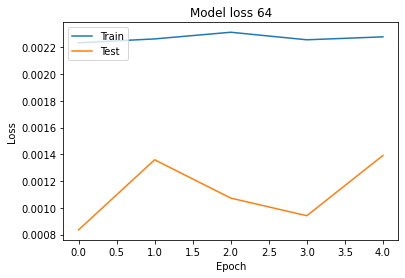

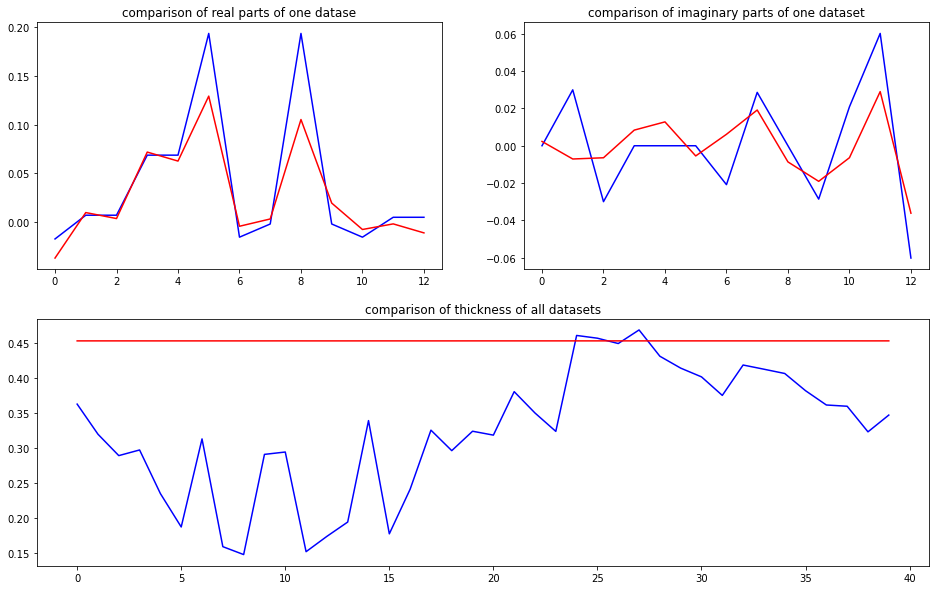

predicted thickness: 0.365076


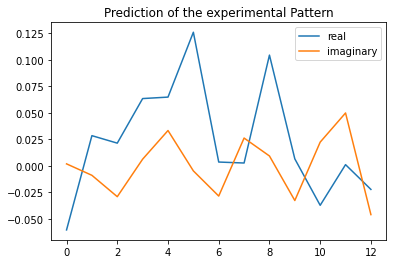

The offset applied on thickness: -0.0003282321462152189

The offset applied on Ug: -0.49937410163607604

Applied shift of unit cell origin (fractional coordinates): 0.03357969678441226 -0.005897707084302887
Ug[ 0 ]: 0.06243 3.14159  =>  0.06243 3.14159
Ug[ 1 ]: 0.02639 0.3966  =>  0.02639 0.35954
Ug[ 2 ]: 0.02639 -0.3966  =>  0.02639 -0.35954
Ug[ 3 ]: 0.0632 -0.21099  =>  0.0632 -0.0
Ug[ 4 ]: 0.0632 0.21099  =>  0.0632 0.0
Ug[ 5 ]: 0.10886 -0.07411  =>  0.10886 -0.0
Ug[ 6 ]: 0.03073 -2.18119  =>  0.03073 -1.93314
Ug[ 7 ]: 0.02988 1.4332  =>  0.02988 1.25927
Ug[ 8 ]: 0.10886 0.07411  =>  0.10886 0.0
Ug[ 9 ]: 0.02988 -1.4332  =>  0.02988 -1.25927
Ug[ 10 ]: 0.03073 2.18119  =>  0.03073 1.93314
Ug[ 11 ]: 0.0495 1.81415  =>  0.0495 1.39218
Ug[ 12 ]: 0.0495 -1.81415  =>  0.0495 -1.39218
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_

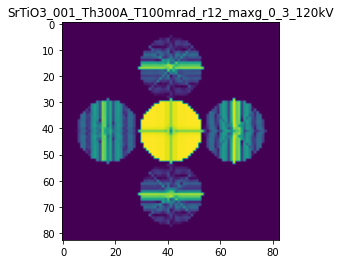

X_sim.max(): 0.9937324900101836
>>>replaced the 65. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 844ms/step - loss: 0.0024 - mean_absolute_error: 0.0317 - acc: 0.9400 - val_loss: 8.1437e-04 - val_mean_absolute_error: 0.0190 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 541ms/step - loss: 0.0024 - mean_absolute_error: 0.0310 - acc: 0.9500 - val_loss: 7.6400e-04 - val_mean_absolute_error: 0.0187 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 549ms/step - loss: 0.0023 - mean_absolute_error: 0.0304 - acc: 0.9500 - val_loss: 0.0012 - val_mean_absolute_error: 0.0194 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 567ms/step - loss: 0.0022 - mean_absolute_error: 0.0296 - acc: 0.9500 - val_loss: 9.4699e-04 - val_mean_absolute_error: 0.0189 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 688ms/step - loss: 0.0022 - mean_absolute_error: 0.0291 - acc: 0.9500 - val_loss: 8.4052e-04

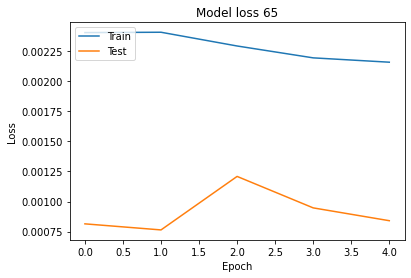

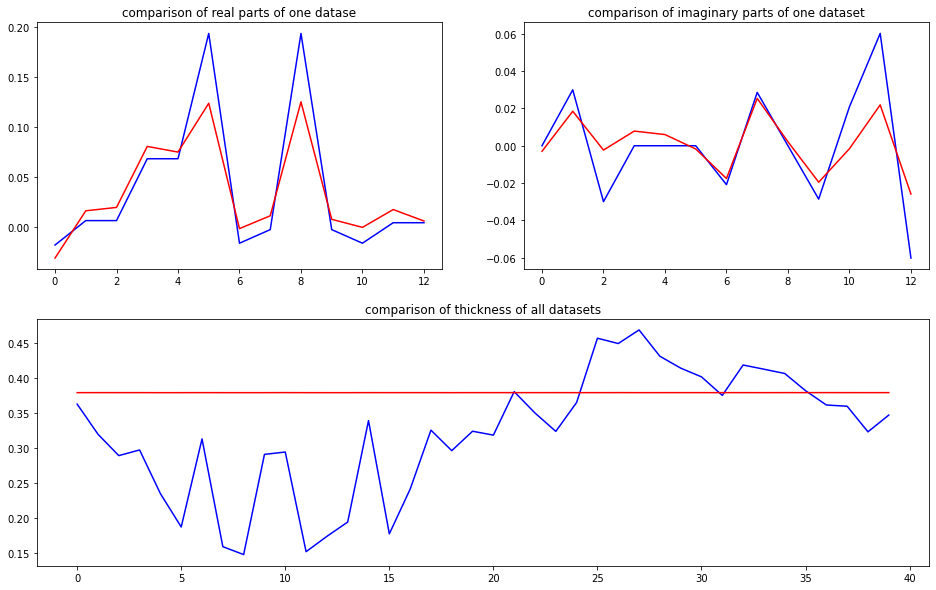

predicted thickness: 0.32883337


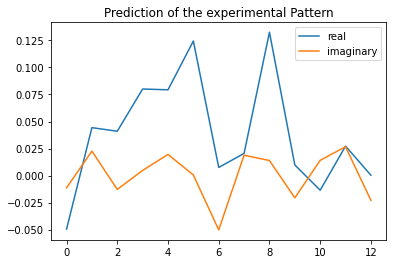

The offset applied on thickness: 0.0005556179445487714

The offset applied on Ug: 1.9592725249779934

Applied shift of unit cell origin (fractional coordinates): 0.013203706683342616 -0.005350727960106357
Ug[ 0 ]: 0.04447 3.14159  =>  0.04447 3.14159
Ug[ 1 ]: 0.05041 0.37521  =>  0.05041 0.34159
Ug[ 2 ]: 0.05041 -0.37521  =>  0.05041 -0.34159
Ug[ 3 ]: 0.09287 -0.08296  =>  0.09287 -0.0
Ug[ 4 ]: 0.09287 0.08296  =>  0.09287 0.0
Ug[ 5 ]: 0.16148 -0.06724  =>  0.16148 0.0
Ug[ 6 ]: 0.0299 -1.57467  =>  0.0299 -1.45809
Ug[ 7 ]: 0.02589 0.88374  =>  0.02589 0.8344
Ug[ 8 ]: 0.16148 0.06724  =>  0.16148 -0.0
Ug[ 9 ]: 0.02589 -0.88374  =>  0.02589 -0.8344
Ug[ 10 ]: 0.0299 1.57467  =>  0.0299 1.45809
Ug[ 11 ]: 0.03028 1.02473  =>  0.03028 0.85881
Ug[ 12 ]: 0.03028 -1.02473  =>  0.03028 -0.85881
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_

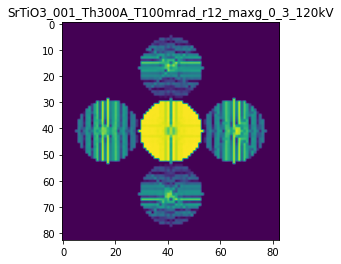

X_sim.max(): 0.9798049670339372
>>>replaced the 66. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 833ms/step - loss: 0.0021 - mean_absolute_error: 0.0287 - acc: 0.9500 - val_loss: 0.0013 - val_mean_absolute_error: 0.0206 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 537ms/step - loss: 0.0022 - mean_absolute_error: 0.0293 - acc: 0.9500 - val_loss: 7.0941e-04 - val_mean_absolute_error: 0.0166 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 547ms/step - loss: 0.0021 - mean_absolute_error: 0.0286 - acc: 0.9500 - val_loss: 8.4607e-04 - val_mean_absolute_error: 0.0167 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 647ms/step - loss: 0.0021 - mean_absolute_error: 0.0282 - acc: 0.9500 - val_loss: 9.1302e-04 - val_mean_absolute_error: 0.0193 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 5s 974ms/step - loss: 0.0021 - mean_absolute_error: 0.0288 - acc: 0.9500 - val_loss: 0.0011 - v

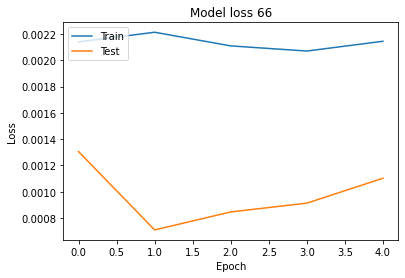

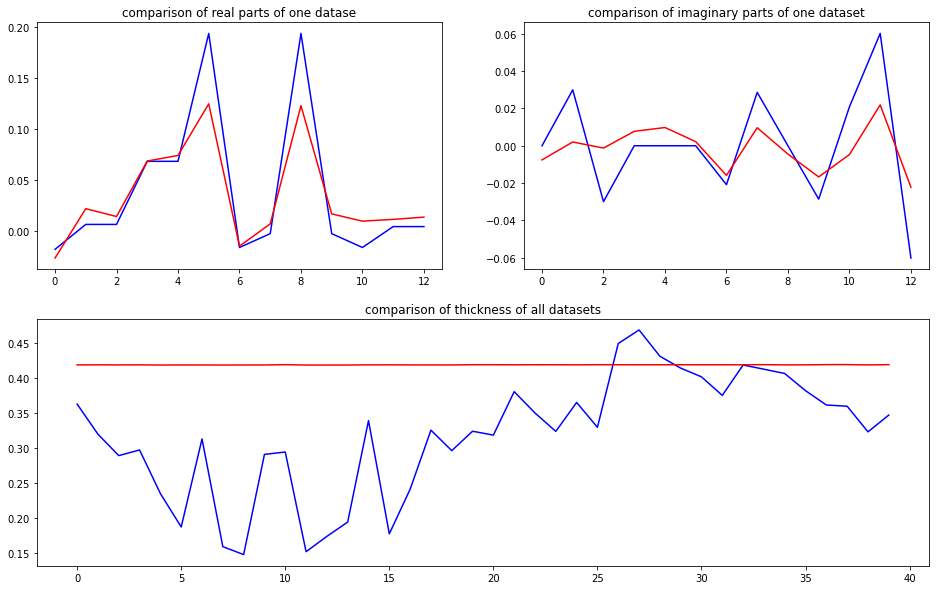

predicted thickness: 0.30798325


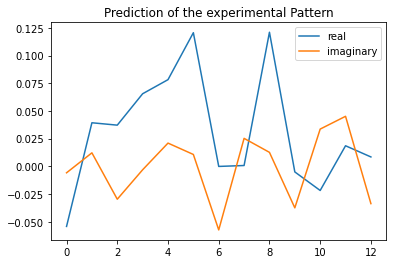

The offset applied on thickness: 0.00028347332989244167

The offset applied on Ug: 1.8663552755670443

Applied shift of unit cell origin (fractional coordinates): 0.028856573783739178 -0.0006352531544590164
Ug[ 0 ]: 0.04867 3.14159  =>  0.04867 3.14159
Ug[ 1 ]: 0.04661 0.45122  =>  0.04661 0.44723
Ug[ 2 ]: 0.04661 -0.45122  =>  0.04661 -0.44723
Ug[ 3 ]: 0.08337 -0.18131  =>  0.08337 -0.0
Ug[ 4 ]: 0.08337 0.18131  =>  0.08337 0.0
Ug[ 5 ]: 0.14831 -0.00798  =>  0.14831 0.0
Ug[ 6 ]: 0.04423 -1.71505  =>  0.04423 -1.52975
Ug[ 7 ]: 0.03064 1.57774  =>  0.03064 1.40042
Ug[ 8 ]: 0.14831 0.00798  =>  0.14831 0.0
Ug[ 9 ]: 0.03064 -1.57774  =>  0.03064 -1.40042
Ug[ 10 ]: 0.04423 1.71505  =>  0.04423 1.52975
Ug[ 11 ]: 0.044 1.17708  =>  0.044 0.81445
Ug[ 12 ]: 0.044 -1.17708  =>  0.044 -0.81445
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_0

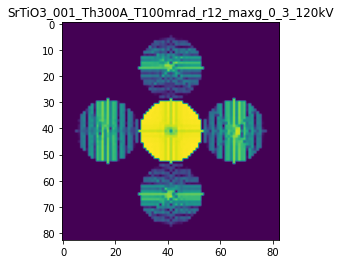

X_sim.max(): 0.981363231778355
>>>replaced the 67. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 855ms/step - loss: 0.0022 - mean_absolute_error: 0.0295 - acc: 0.9500 - val_loss: 8.2407e-04 - val_mean_absolute_error: 0.0183 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 541ms/step - loss: 0.0022 - mean_absolute_error: 0.0298 - acc: 0.9500 - val_loss: 7.5760e-04 - val_mean_absolute_error: 0.0181 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 545ms/step - loss: 0.0022 - mean_absolute_error: 0.0296 - acc: 0.9500 - val_loss: 0.0011 - val_mean_absolute_error: 0.0200 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 555ms/step - loss: 0.0021 - mean_absolute_error: 0.0294 - acc: 0.9500 - val_loss: 7.4890e-04 - val_mean_absolute_error: 0.0172 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 4s 783ms/step - loss: 0.0021 - mean_absolute_error: 0.0289 - acc: 0.9500 - val_loss: 8.9818e-04 

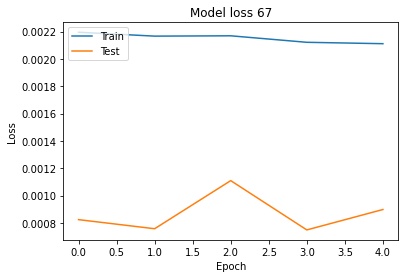

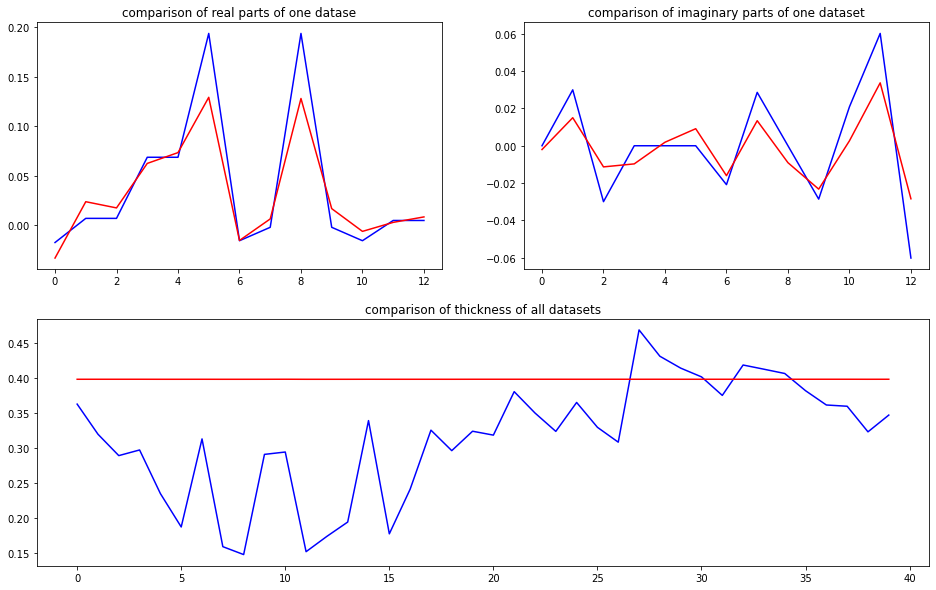

predicted thickness: 0.29139113


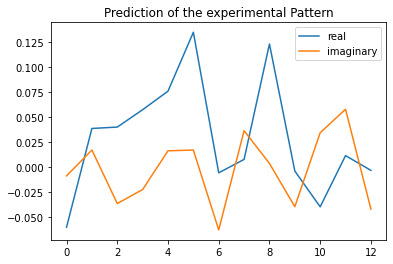

The offset applied on thickness: -0.0008415670209317063

The offset applied on Ug: -2.1942113547466024

Applied shift of unit cell origin (fractional coordinates): 0.04959738802859473 0.004729290163049373
Ug[ 0 ]: 0.0682 3.14159  =>  0.0682 3.14159
Ug[ 1 ]: 0.04394 0.68497  =>  0.04394 0.71468
Ug[ 2 ]: 0.04394 -0.68497  =>  0.04394 -0.71468
Ug[ 3 ]: 0.05856 -0.31163  =>  0.05856 0.0
Ug[ 4 ]: 0.05856 0.31163  =>  0.05856 0.0
Ug[ 5 ]: 0.09211 0.05943  =>  0.09211 -0.0
Ug[ 6 ]: 0.05799 -2.11854  =>  0.05799 -1.83663
Ug[ 7 ]: 0.03832 1.60892  =>  0.03832 1.26758
Ug[ 8 ]: 0.09211 -0.05943  =>  0.09211 0.0
Ug[ 9 ]: 0.03832 -1.60892  =>  0.03832 -1.26758
Ug[ 10 ]: 0.05799 2.11854  =>  0.05799 1.83663
Ug[ 11 ]: 0.04822 1.60685  =>  0.04822 0.98359
Ug[ 12 ]: 0.04822 -1.60685  =>  0.04822 -0.98359
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTi

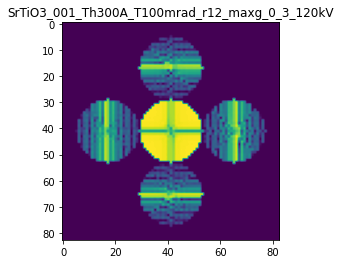

X_sim.max(): 0.9885115369510987
>>>replaced the 68. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 841ms/step - loss: 0.0021 - mean_absolute_error: 0.0286 - acc: 0.9500 - val_loss: 8.4228e-04 - val_mean_absolute_error: 0.0182 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 706ms/step - loss: 0.0021 - mean_absolute_error: 0.0286 - acc: 0.9500 - val_loss: 8.7723e-04 - val_mean_absolute_error: 0.0171 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 554ms/step - loss: 0.0020 - mean_absolute_error: 0.0279 - acc: 0.9500 - val_loss: 8.5383e-04 - val_mean_absolute_error: 0.0187 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 705ms/step - loss: 0.0021 - mean_absolute_error: 0.0288 - acc: 0.9500 - val_loss: 0.0010 - val_mean_absolute_error: 0.0199 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 4s 959ms/step - loss: 0.0021 - mean_absolute_error: 0.0290 - acc: 0.9500 - val_loss: 0.0012 - v

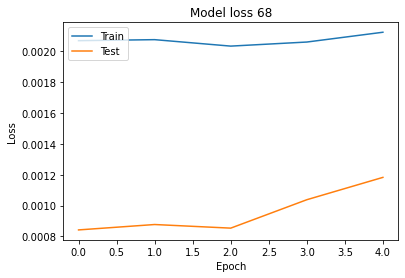

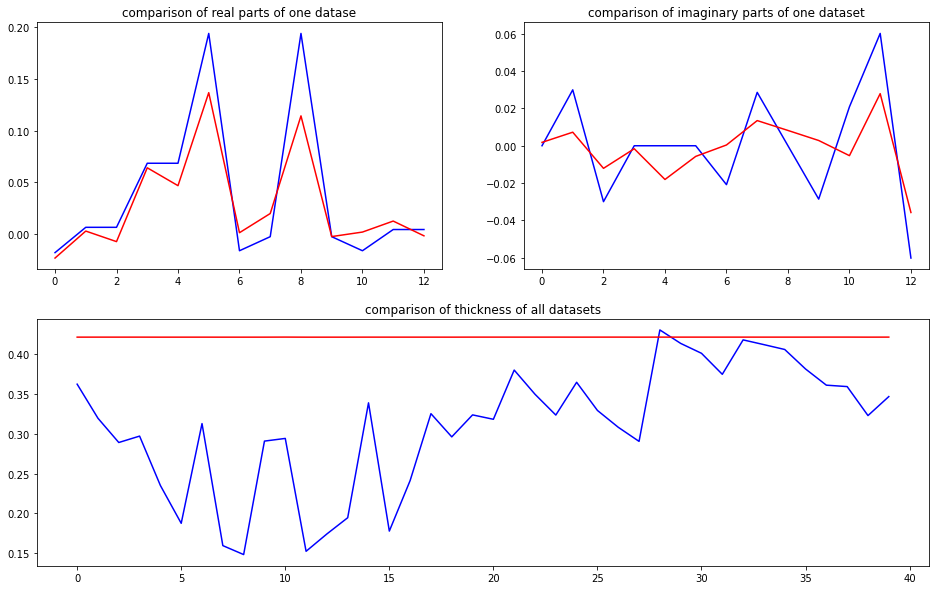

predicted thickness: 0.3263806


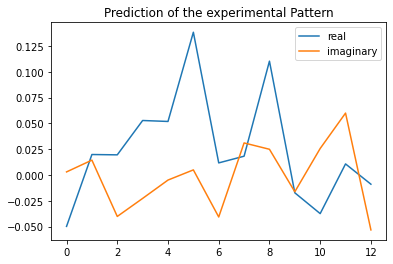

The offset applied on thickness: -0.0009050981702284762

The offset applied on Ug: -1.2677436657026961

Applied shift of unit cell origin (fractional coordinates): 0.02988886710330509 -0.00932076084533387
Ug[ 0 ]: 0.05296 3.14159  =>  0.05296 3.14159
Ug[ 1 ]: 0.03338 1.00166  =>  0.03338 0.94309
Ug[ 2 ]: 0.03338 -1.00166  =>  0.03338 -0.94309
Ug[ 3 ]: 0.04933 -0.1878  =>  0.04933 0.0
Ug[ 4 ]: 0.04933 0.1878  =>  0.04933 0.0
Ug[ 5 ]: 0.1047 -0.11713  =>  0.1047 0.0
Ug[ 6 ]: 0.03623 -2.00735  =>  0.03623 -1.76099
Ug[ 7 ]: 0.02325 1.60234  =>  0.02325 1.47311
Ug[ 8 ]: 0.1047 0.11713  =>  0.1047 -0.0
Ug[ 9 ]: 0.02325 -1.60234  =>  0.02325 -1.47311
Ug[ 10 ]: 0.03623 2.00735  =>  0.03623 1.76099
Ug[ 11 ]: 0.05626 1.62995  =>  0.05626 1.25435
Ug[ 12 ]: 0.05626 -1.62995  =>  0.05626 -1.25435
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_0

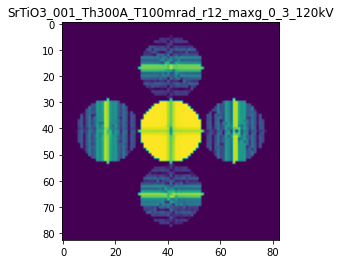

X_sim.max(): 0.9952601017912948
>>>replaced the 69. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 942ms/step - loss: 0.0021 - mean_absolute_error: 0.0287 - acc: 0.9500 - val_loss: 0.0011 - val_mean_absolute_error: 0.0193 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 2s 527ms/step - loss: 0.0020 - mean_absolute_error: 0.0281 - acc: 0.9500 - val_loss: 7.0652e-04 - val_mean_absolute_error: 0.0183 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 2s 523ms/step - loss: 0.0023 - mean_absolute_error: 0.0302 - acc: 0.9300 - val_loss: 0.0012 - val_mean_absolute_error: 0.0219 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 2s 535ms/step - loss: 0.0021 - mean_absolute_error: 0.0298 - acc: 0.9500 - val_loss: 0.0011 - val_mean_absolute_error: 0.0213 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 770ms/step - loss: 0.0021 - mean_absolute_error: 0.0297 - acc: 0.9600 - val_loss: 0.0012 - val_mean_

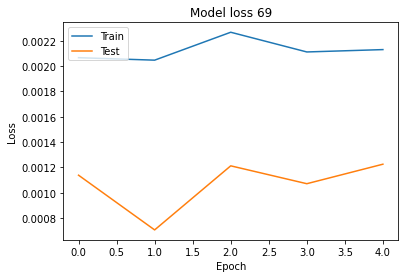

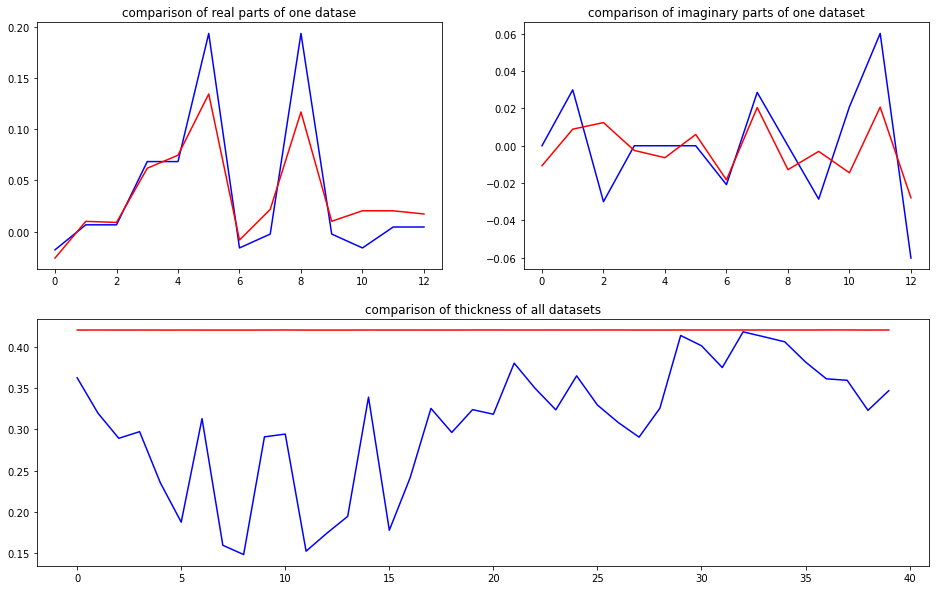

predicted thickness: 0.30639946


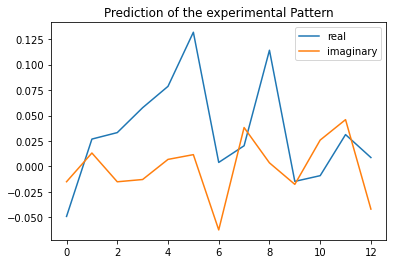

The offset applied on thickness: 0.0008489549470001612

The offset applied on Ug: -1.770305857640928

Applied shift of unit cell origin (fractional coordinates): 0.02201764315554545 0.0018812614464450686
Ug[ 0 ]: 0.05389 3.14159  =>  0.05389 3.14159
Ug[ 1 ]: 0.03156 0.47633  =>  0.03156 0.48815
Ug[ 2 ]: 0.03156 -0.47633  =>  0.03156 -0.48815
Ug[ 3 ]: 0.06012 -0.13834  =>  0.06012 0.0
Ug[ 4 ]: 0.06012 0.13834  =>  0.06012 0.0
Ug[ 5 ]: 0.09597 0.02364  =>  0.09597 -0.0
Ug[ 6 ]: 0.04742 -1.71399  =>  0.04742 -1.58747
Ug[ 7 ]: 0.02689 1.54761  =>  0.02689 1.39745
Ug[ 8 ]: 0.09597 -0.02364  =>  0.09597 0.0
Ug[ 9 ]: 0.02689 -1.54761  =>  0.02689 -1.39745
Ug[ 10 ]: 0.04742 1.71399  =>  0.04742 1.58747
Ug[ 11 ]: 0.04584 1.22372  =>  0.04584 0.94703
Ug[ 12 ]: 0.04584 -1.22372  =>  0.04584 -0.94703
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrT

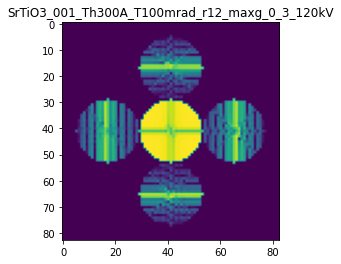

X_sim.max(): 0.9907631275631472
>>>replaced the 70. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 835ms/step - loss: 0.0021 - mean_absolute_error: 0.0295 - acc: 0.9500 - val_loss: 7.4017e-04 - val_mean_absolute_error: 0.0178 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 545ms/step - loss: 0.0020 - mean_absolute_error: 0.0285 - acc: 0.9600 - val_loss: 0.0012 - val_mean_absolute_error: 0.0211 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 553ms/step - loss: 0.0020 - mean_absolute_error: 0.0285 - acc: 0.9500 - val_loss: 7.7904e-04 - val_mean_absolute_error: 0.0186 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 4s 958ms/step - loss: 0.0021 - mean_absolute_error: 0.0289 - acc: 0.9500 - val_loss: 8.8370e-04 - val_mean_absolute_error: 0.0195 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 4s 957ms/step - loss: 0.0020 - mean_absolute_error: 0.0283 - acc: 0.9500 - val_loss: 7.6938e-04

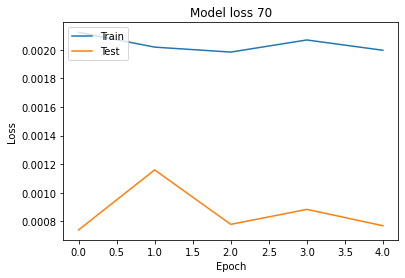

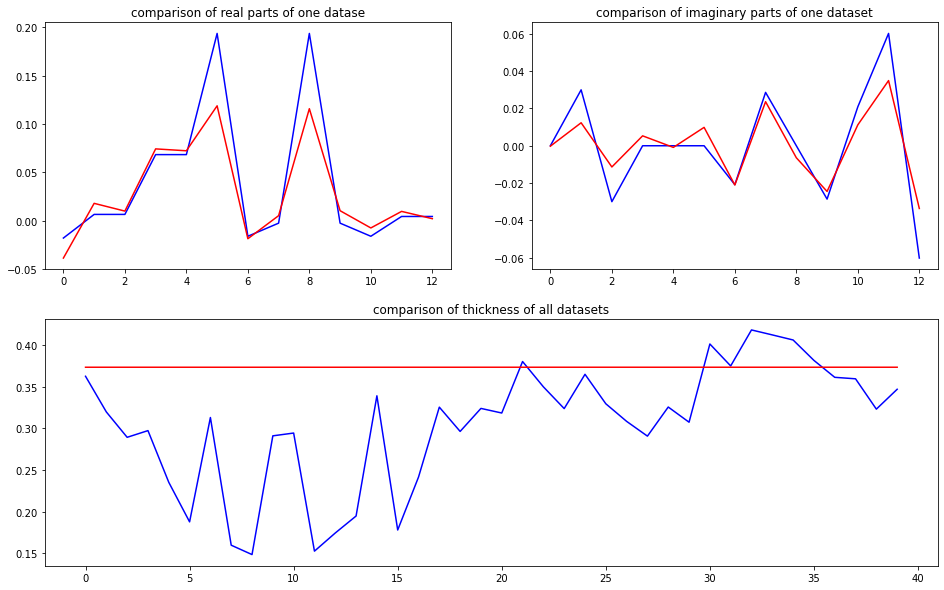

predicted thickness: 0.2693385


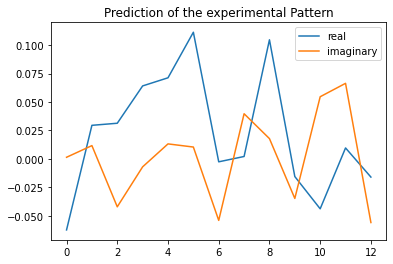

The offset applied on thickness: 0.0007695535698533562

The offset applied on Ug: -1.9586459787605992

Applied shift of unit cell origin (fractional coordinates): 0.025321584256714554 -0.003942411040938442
Ug[ 0 ]: 0.07006 3.14159  =>  0.07006 3.14159
Ug[ 1 ]: 0.03902 0.81589  =>  0.03902 0.79112
Ug[ 2 ]: 0.03902 -0.81589  =>  0.03902 -0.79112
Ug[ 3 ]: 0.05923 -0.1591  =>  0.05923 -0.0
Ug[ 4 ]: 0.05923 0.1591  =>  0.05923 0.0
Ug[ 5 ]: 0.08481 -0.04954  =>  0.08481 0.0
Ug[ 6 ]: 0.06009 -2.11085  =>  0.06009 -1.92698
Ug[ 7 ]: 0.03843 1.82508  =>  0.03843 1.69075
Ug[ 8 ]: 0.08481 0.04954  =>  0.08481 0.0
Ug[ 9 ]: 0.03843 -1.82508  =>  0.03843 -1.69075
Ug[ 10 ]: 0.06009 2.11085  =>  0.06009 1.92698
Ug[ 11 ]: 0.0614 1.74936  =>  0.0614 1.43116
Ug[ 12 ]: 0.0614 -1.74936  =>  0.0614 -1.43116
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_

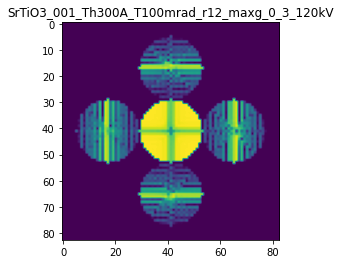

X_sim.max(): 0.9901715466703853
>>>replaced the 71. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 846ms/step - loss: 0.0020 - mean_absolute_error: 0.0275 - acc: 0.9500 - val_loss: 0.0014 - val_mean_absolute_error: 0.0219 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 2s 530ms/step - loss: 0.0020 - mean_absolute_error: 0.0278 - acc: 0.9500 - val_loss: 8.9763e-04 - val_mean_absolute_error: 0.0202 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 541ms/step - loss: 0.0020 - mean_absolute_error: 0.0291 - acc: 0.9500 - val_loss: 8.2349e-04 - val_mean_absolute_error: 0.0182 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 549ms/step - loss: 0.0020 - mean_absolute_error: 0.0287 - acc: 0.9500 - val_loss: 7.5254e-04 - val_mean_absolute_error: 0.0188 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 754ms/step - loss: 0.0022 - mean_absolute_error: 0.0297 - acc: 0.9500 - val_loss: 0.0014 - v

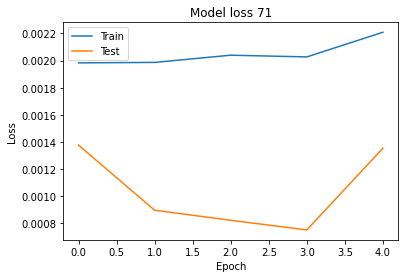

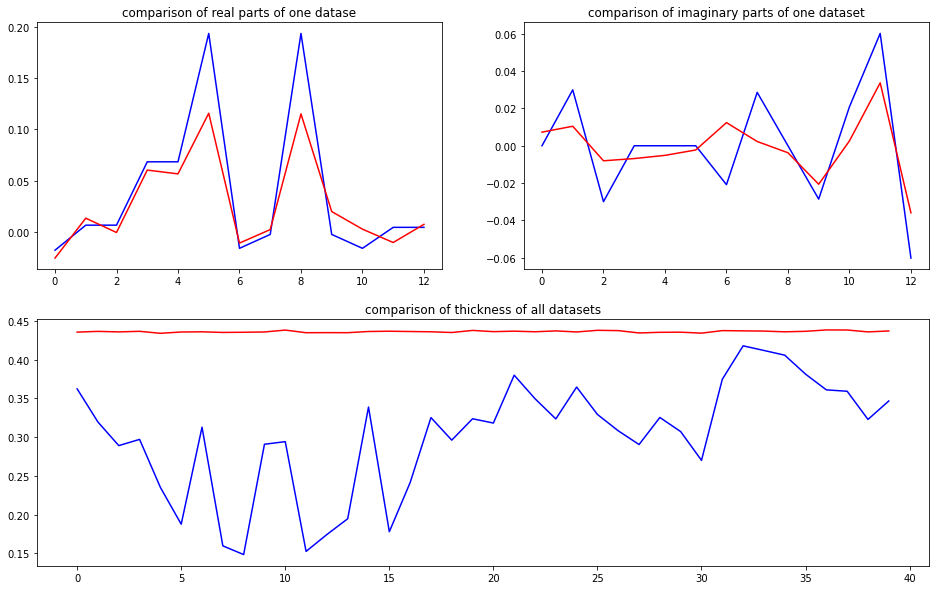

predicted thickness: 0.31594577


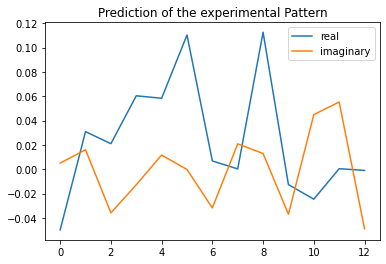

The offset applied on thickness: -2.3627480324822203e-05

The offset applied on Ug: 1.8304964824585548

Applied shift of unit cell origin (fractional coordinates): 0.02831998240791237 -0.0044750717850893995
Ug[ 0 ]: 0.04525 3.14159  =>  0.04525 3.14159
Ug[ 1 ]: 0.0383 0.72707  =>  0.0383 0.69895
Ug[ 2 ]: 0.0383 -0.72707  =>  0.0383 -0.69895
Ug[ 3 ]: 0.06709 -0.17794  =>  0.06709 -0.0
Ug[ 4 ]: 0.06709 0.17794  =>  0.06709 0.0
Ug[ 5 ]: 0.13448 -0.05624  =>  0.13448 -0.0
Ug[ 6 ]: 0.03993 -1.70974  =>  0.03993 -1.50368
Ug[ 7 ]: 0.02832 1.72606  =>  0.02832 1.57624
Ug[ 8 ]: 0.13448 0.05624  =>  0.13448 0.0
Ug[ 9 ]: 0.02832 -1.72606  =>  0.02832 -1.57624
Ug[ 10 ]: 0.03993 1.70974  =>  0.03993 1.50368
Ug[ 11 ]: 0.05288 1.48137  =>  0.05288 1.12549
Ug[ 12 ]: 0.05288 -1.48137  =>  0.05288 -1.12549
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrT

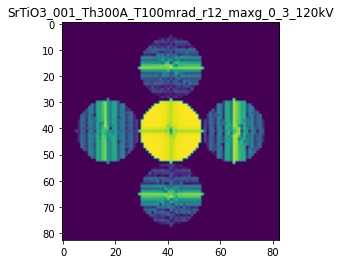

X_sim.max(): 0.9918661662550806
>>>replaced the 72. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 942ms/step - loss: 0.0020 - mean_absolute_error: 0.0279 - acc: 0.9500 - val_loss: 9.0076e-04 - val_mean_absolute_error: 0.0203 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 546ms/step - loss: 0.0023 - mean_absolute_error: 0.0285 - acc: 0.9500 - val_loss: 0.0011 - val_mean_absolute_error: 0.0197 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 616ms/step - loss: 0.0023 - mean_absolute_error: 0.0285 - acc: 0.9500 - val_loss: 0.0014 - val_mean_absolute_error: 0.0217 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 5s 1s/step - loss: 0.0022 - mean_absolute_error: 0.0287 - acc: 0.9500 - val_loss: 6.8872e-04 - val_mean_absolute_error: 0.0186 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 5s 1s/step - loss: 0.0020 - mean_absolute_error: 0.0280 - acc: 0.9500 - val_loss: 9.8230e-04 - val_mea

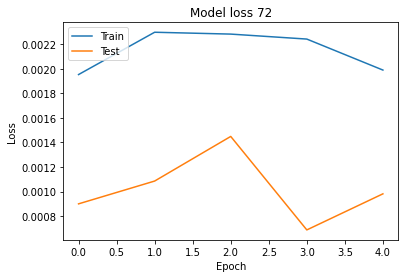

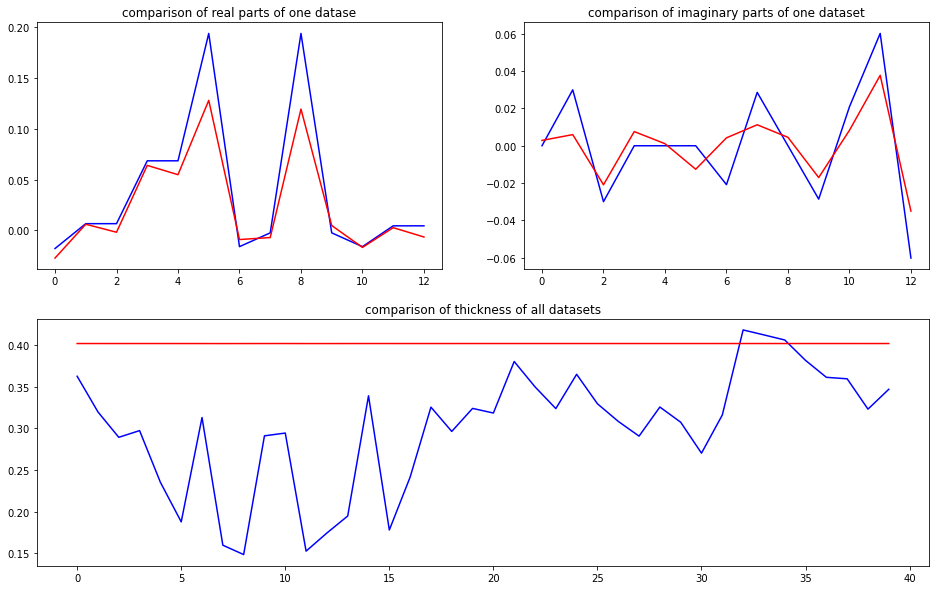

predicted thickness: 0.47401312


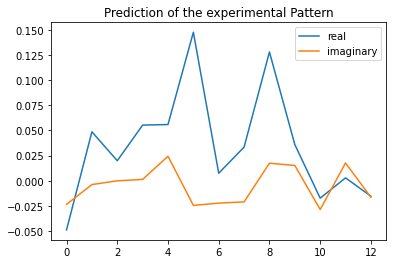

The offset applied on thickness: 0.0007498420104668506

The offset applied on Ug: 0.7566128634992938

Applied shift of unit cell origin (fractional coordinates): 0.03181947004417353 -0.009386857034622295
Ug[ 0 ]: 0.04657 3.14159  =>  0.04657 3.14159
Ug[ 1 ]: 0.03538 -0.0292  =>  0.03538 -0.08818
Ug[ 2 ]: 0.03538 0.0292  =>  0.03538 0.08818
Ug[ 3 ]: 0.05936 -0.19993  =>  0.05936 0.0
Ug[ 4 ]: 0.05936 0.19993  =>  0.05936 -0.0
Ug[ 5 ]: 0.15362 -0.11796  =>  0.15362 0.0
Ug[ 6 ]: 0.00517 2.5269  =>  0.00517 2.78581
Ug[ 7 ]: 0.04021 -0.46605  =>  0.04021 -0.607
Ug[ 8 ]: 0.15362 0.11796  =>  0.15362 0.0
Ug[ 9 ]: 0.04021 0.46605  =>  0.04021 0.607
Ug[ 10 ]: 0.00517 -2.5269  =>  0.00517 -2.78581
Ug[ 11 ]: 0.01798 1.90336  =>  0.01798 1.50351
Ug[ 12 ]: 0.01798 -1.90336  =>  0.01798 -1.50351
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_

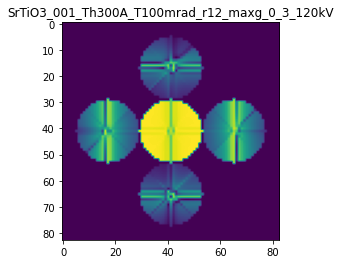

X_sim.max(): 0.9855096736766613
>>>replaced the 73. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 844ms/step - loss: 0.0020 - mean_absolute_error: 0.0277 - acc: 0.9500 - val_loss: 0.0012 - val_mean_absolute_error: 0.0232 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 2s 533ms/step - loss: 0.0020 - mean_absolute_error: 0.0290 - acc: 0.9500 - val_loss: 6.0003e-04 - val_mean_absolute_error: 0.0160 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 540ms/step - loss: 0.0020 - mean_absolute_error: 0.0288 - acc: 0.9600 - val_loss: 0.0015 - val_mean_absolute_error: 0.0226 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 549ms/step - loss: 0.0020 - mean_absolute_error: 0.0286 - acc: 0.9500 - val_loss: 6.7180e-04 - val_mean_absolute_error: 0.0179 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 751ms/step - loss: 0.0020 - mean_absolute_error: 0.0289 - acc: 0.9400 - val_loss: 8.0416e-04 - v

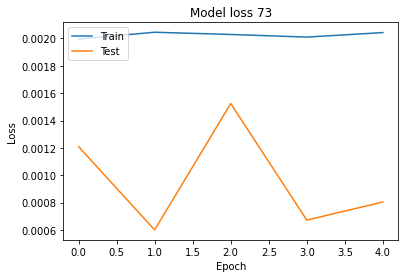

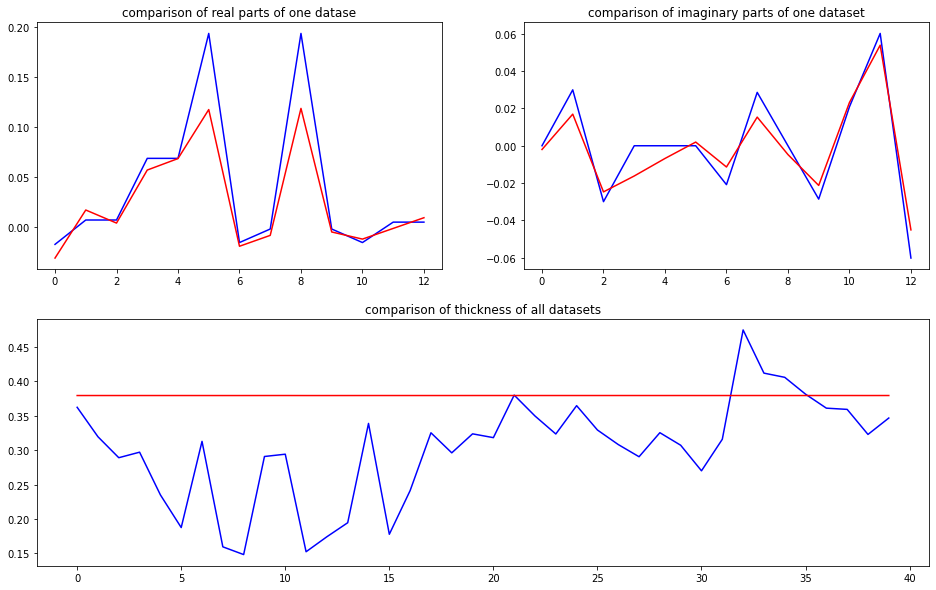

predicted thickness: 0.3920539


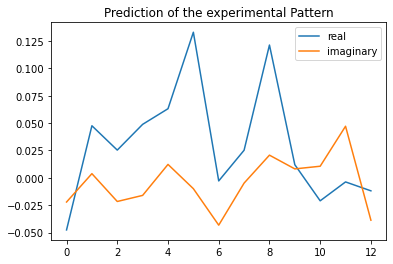

The offset applied on thickness: 0.0002309604569092354

The offset applied on Ug: 0.19669486518128798

Applied shift of unit cell origin (fractional coordinates): 0.0393602028460741 -0.009132123814619475
Ug[ 0 ]: 0.04705 3.14159  =>  0.04705 3.14159
Ug[ 1 ]: 0.03898 0.33547  =>  0.03898 0.27809
Ug[ 2 ]: 0.03898 -0.33547  =>  0.03898 -0.27809
Ug[ 3 ]: 0.05846 -0.24731  =>  0.05846 0.0
Ug[ 4 ]: 0.05846 0.24731  =>  0.05846 0.0
Ug[ 5 ]: 0.13129 -0.11476  =>  0.13129 -0.0
Ug[ 6 ]: 0.02922 -1.98132  =>  0.02922 -1.67664
Ug[ 7 ]: 0.01977 -0.33229  =>  0.01977 -0.52222
Ug[ 8 ]: 0.13129 0.11476  =>  0.13129 0.0
Ug[ 9 ]: 0.01977 0.33229  =>  0.01977 0.52222
Ug[ 10 ]: 0.02922 1.98132  =>  0.02922 1.67664
Ug[ 11 ]: 0.04363 1.74182  =>  0.04363 1.2472
Ug[ 12 ]: 0.04363 -1.74182  =>  0.04363 -1.2472
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO

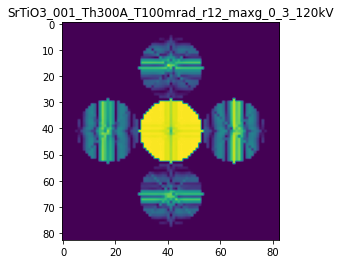

X_sim.max(): 0.9949597421502371
>>>replaced the 74. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 813ms/step - loss: 0.0018 - mean_absolute_error: 0.0271 - acc: 0.9600 - val_loss: 8.8254e-04 - val_mean_absolute_error: 0.0189 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 2s 521ms/step - loss: 0.0018 - mean_absolute_error: 0.0264 - acc: 0.9600 - val_loss: 9.5521e-04 - val_mean_absolute_error: 0.0179 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 2s 531ms/step - loss: 0.0017 - mean_absolute_error: 0.0258 - acc: 0.9500 - val_loss: 8.5566e-04 - val_mean_absolute_error: 0.0182 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 778ms/step - loss: 0.0017 - mean_absolute_error: 0.0267 - acc: 0.9600 - val_loss: 7.7292e-04 - val_mean_absolute_error: 0.0180 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 5s 1s/step - loss: 0.0017 - mean_absolute_error: 0.0263 - acc: 0.9500 - val_loss: 7.3272e-0

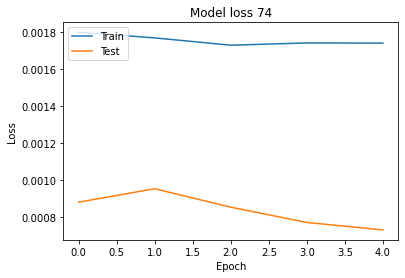

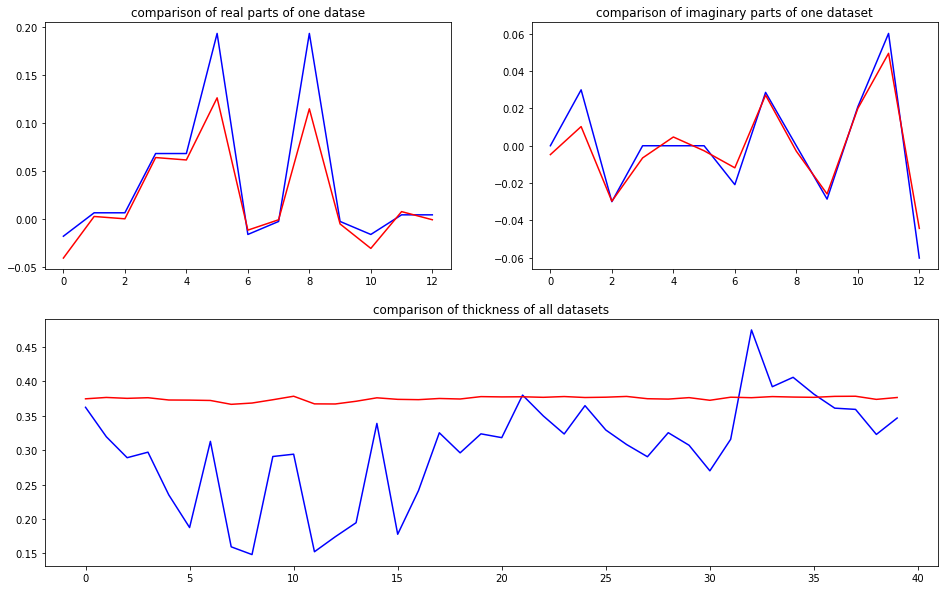

predicted thickness: 0.35437065


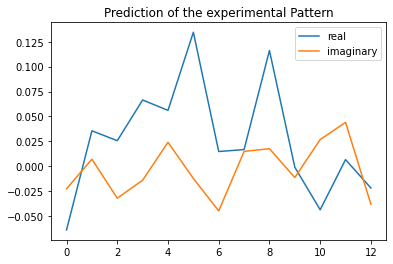

The offset applied on thickness: 0.000400900906909071

The offset applied on Ug: -0.15528232045219828

Applied shift of unit cell origin (fractional coordinates): 0.04866050098547563 -0.009840709880304497
Ug[ 0 ]: 0.06488 3.14159  =>  0.06488 3.14159
Ug[ 1 ]: 0.03609 0.57508  =>  0.03609 0.51325
Ug[ 2 ]: 0.03609 -0.57508  =>  0.03609 -0.51325
Ug[ 3 ]: 0.06354 -0.30574  =>  0.06354 -0.0
Ug[ 4 ]: 0.06354 0.30574  =>  0.06354 0.0
Ug[ 5 ]: 0.12385 -0.12366  =>  0.12385 0.0
Ug[ 6 ]: 0.03886 -1.96741  =>  0.03886 -1.59984
Ug[ 7 ]: 0.01518 1.04064  =>  0.01518 0.79673
Ug[ 8 ]: 0.12385 0.12366  =>  0.12385 0.0
Ug[ 9 ]: 0.01518 -1.04064  =>  0.01518 -0.79673
Ug[ 10 ]: 0.03886 1.96741  =>  0.03886 1.59984
Ug[ 11 ]: 0.04194 1.76457  =>  0.04194 1.15308
Ug[ 12 ]: 0.04194 -1.76457  =>  0.04194 -1.15308
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

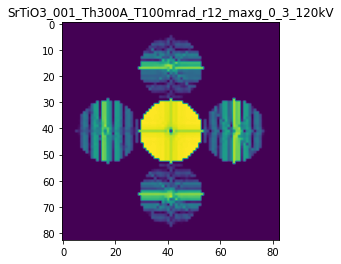

X_sim.max(): 0.9918767352562108
>>>replaced the 75. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 829ms/step - loss: 0.0017 - mean_absolute_error: 0.0251 - acc: 0.9600 - val_loss: 7.7482e-04 - val_mean_absolute_error: 0.0167 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 2s 517ms/step - loss: 0.0017 - mean_absolute_error: 0.0252 - acc: 0.9600 - val_loss: 7.3797e-04 - val_mean_absolute_error: 0.0170 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 2s 518ms/step - loss: 0.0017 - mean_absolute_error: 0.0259 - acc: 0.9500 - val_loss: 8.1772e-04 - val_mean_absolute_error: 0.0177 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 2s 528ms/step - loss: 0.0017 - mean_absolute_error: 0.0257 - acc: 0.9600 - val_loss: 7.6944e-04 - val_mean_absolute_error: 0.0169 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 675ms/step - loss: 0.0017 - mean_absolute_error: 0.0257 - acc: 0.9400 - val_loss: 0.0011

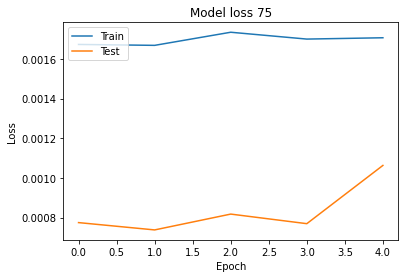

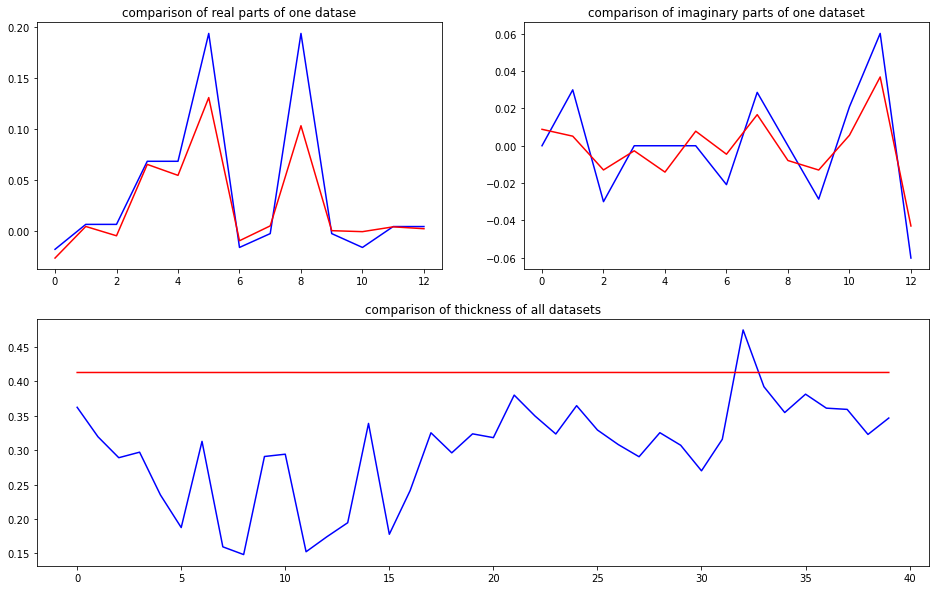

predicted thickness: 0.3710429


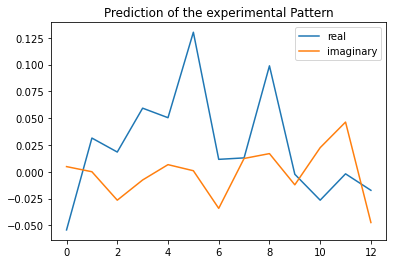

The offset applied on thickness: -0.0004367888609899533

The offset applied on Ug: 2.2057323375912845

Applied shift of unit cell origin (fractional coordinates): 0.014472599940424546 0.003578341924433855
Ug[ 0 ]: 0.04764 3.14159  =>  0.04764 3.14159
Ug[ 1 ]: 0.03027 0.45363  =>  0.03027 0.47612
Ug[ 2 ]: 0.03027 -0.45363  =>  0.03027 -0.47612
Ug[ 3 ]: 0.06198 -0.09093  =>  0.06198 -0.0
Ug[ 4 ]: 0.06198 0.09093  =>  0.06198 0.0
Ug[ 5 ]: 0.14441 0.04497  =>  0.14441 0.0
Ug[ 6 ]: 0.02835 -1.73512  =>  0.02835 -1.66667
Ug[ 7 ]: 0.01381 1.13056  =>  0.01381 1.01714
Ug[ 8 ]: 0.14441 -0.04497  =>  0.14441 -0.0
Ug[ 9 ]: 0.01381 -1.13056  =>  0.01381 -1.01714
Ug[ 10 ]: 0.02835 1.73512  =>  0.02835 1.66667
Ug[ 11 ]: 0.04681 1.66447  =>  0.04681 1.4826
Ug[ 12 ]: 0.04681 -1.66447  =>  0.04681 -1.4826
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrT

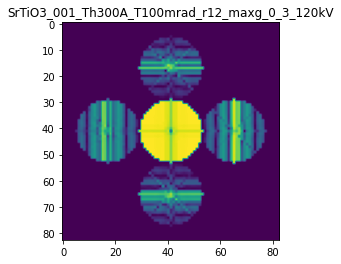

X_sim.max(): 0.9956043060961358
>>>replaced the 76. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 940ms/step - loss: 0.0017 - mean_absolute_error: 0.0258 - acc: 0.9500 - val_loss: 5.6610e-04 - val_mean_absolute_error: 0.0159 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 2s 529ms/step - loss: 0.0018 - mean_absolute_error: 0.0265 - acc: 0.9500 - val_loss: 0.0010 - val_mean_absolute_error: 0.0184 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 548ms/step - loss: 0.0017 - mean_absolute_error: 0.0256 - acc: 0.9500 - val_loss: 9.0743e-04 - val_mean_absolute_error: 0.0187 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 559ms/step - loss: 0.0016 - mean_absolute_error: 0.0253 - acc: 0.9600 - val_loss: 8.2987e-04 - val_mean_absolute_error: 0.0170 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 570ms/step - loss: 0.0016 - mean_absolute_error: 0.0243 - acc: 0.9500 - val_loss: 8.8779e-04

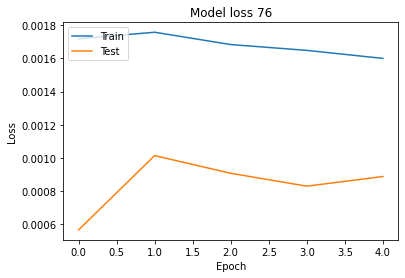

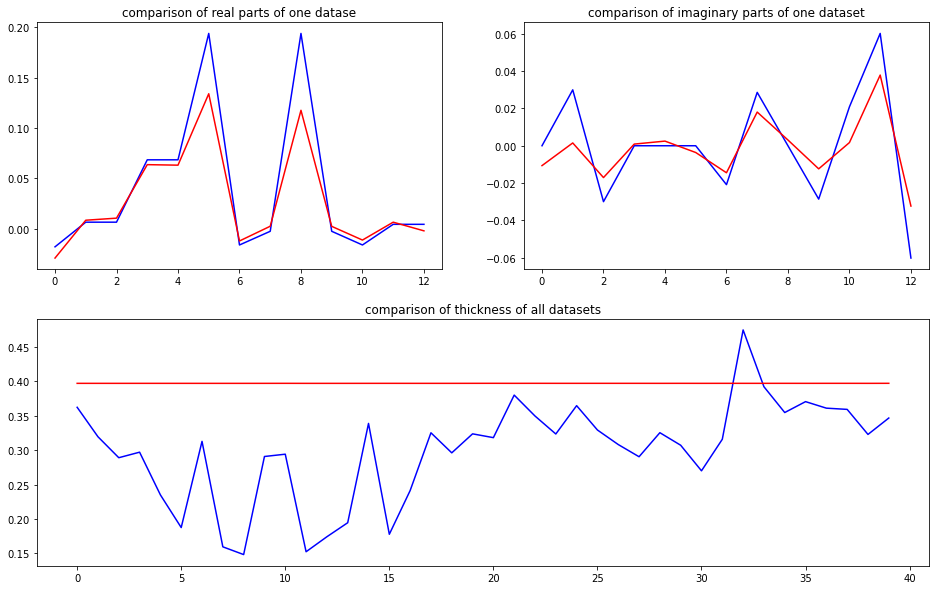

predicted thickness: 0.36378074


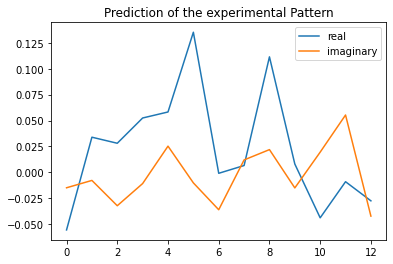

The offset applied on thickness: 0.0009928621284597899

The offset applied on Ug: 1.2473601633167681

Applied shift of unit cell origin (fractional coordinates): 0.048937808858244114 -0.006024067548310866
Ug[ 0 ]: 0.05155 3.14159  =>  0.05155 3.14159
Ug[ 1 ]: 0.0349 0.34551  =>  0.0349 0.30766
Ug[ 2 ]: 0.0349 -0.34551  =>  0.0349 -0.30766
Ug[ 3 ]: 0.06256 -0.30749  =>  0.06256 0.0
Ug[ 4 ]: 0.06256 0.30749  =>  0.06256 0.0
Ug[ 5 ]: 0.14331 -0.0757  =>  0.14331 0.0
Ug[ 6 ]: 0.03479 -2.19179  =>  0.03479 -1.84646
Ug[ 7 ]: 0.01542 1.06002  =>  0.01542 0.79039
Ug[ 8 ]: 0.14331 0.0757  =>  0.14331 0.0
Ug[ 9 ]: 0.01542 -1.06002  =>  0.01542 -0.79039
Ug[ 10 ]: 0.03479 2.19179  =>  0.03479 1.84646
Ug[ 11 ]: 0.05145 1.86285  =>  0.05145 1.24788
Ug[ 12 ]: 0.05145 -1.86285  =>  0.05145 -1.24788
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_00

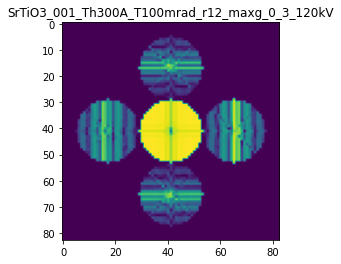

X_sim.max(): 0.9936092119883756
>>>replaced the 77. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 1s/step - loss: 0.0017 - mean_absolute_error: 0.0247 - acc: 0.9500 - val_loss: 0.0014 - val_mean_absolute_error: 0.0210 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 594ms/step - loss: 0.0017 - mean_absolute_error: 0.0254 - acc: 0.9600 - val_loss: 5.7703e-04 - val_mean_absolute_error: 0.0157 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 556ms/step - loss: 0.0017 - mean_absolute_error: 0.0253 - acc: 0.9500 - val_loss: 7.6937e-04 - val_mean_absolute_error: 0.0168 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 582ms/step - loss: 0.0017 - mean_absolute_error: 0.0257 - acc: 0.9600 - val_loss: 8.1483e-04 - val_mean_absolute_error: 0.0184 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 685ms/step - loss: 0.0017 - mean_absolute_error: 0.0253 - acc: 0.9500 - val_loss: 6.9023e-04 - 

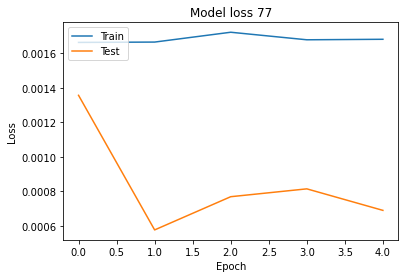

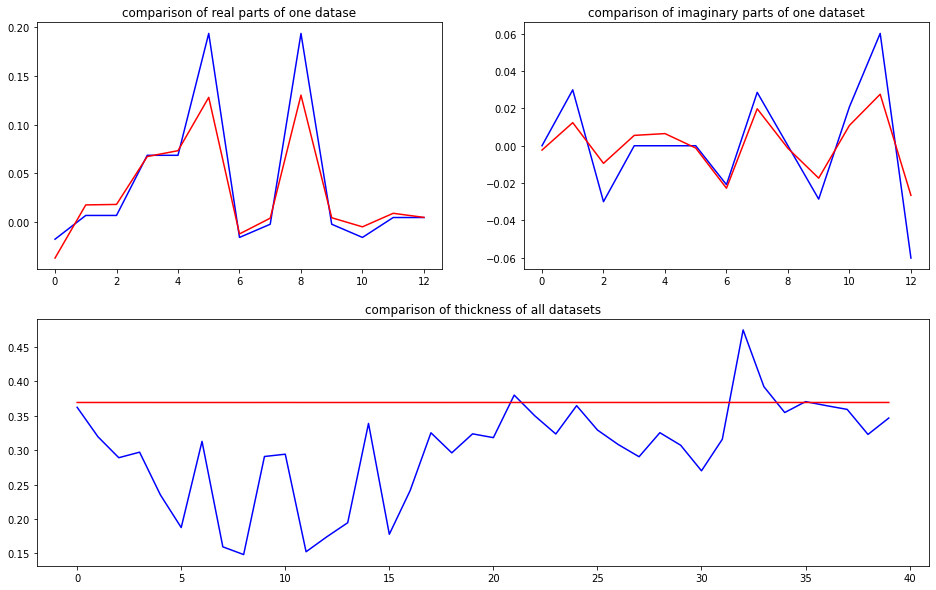

predicted thickness: 0.31906864


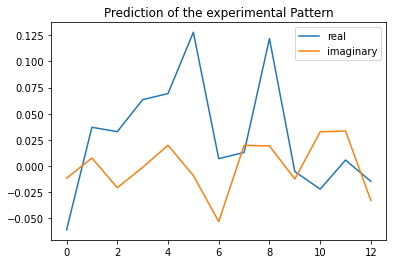

The offset applied on thickness: 1.1589565064674678e-05

The offset applied on Ug: -1.665120238219048

Applied shift of unit cell origin (fractional coordinates): 0.026518896943925098 -0.011687720243108034
Ug[ 0 ]: 0.06738 3.14159  =>  0.06738 3.14159
Ug[ 1 ]: 0.03556 0.41267  =>  0.03556 0.33924
Ug[ 2 ]: 0.03556 -0.41267  =>  0.03556 -0.33924
Ug[ 3 ]: 0.05955 -0.16662  =>  0.05955 0.0
Ug[ 4 ]: 0.05955 0.16662  =>  0.05955 0.0
Ug[ 5 ]: 0.0996 -0.14687  =>  0.0996 0.0
Ug[ 6 ]: 0.04524 -1.81829  =>  0.04524 -1.57824
Ug[ 7 ]: 0.0161 1.36405  =>  0.0161 1.27086
Ug[ 8 ]: 0.0996 0.14687  =>  0.0996 0.0
Ug[ 9 ]: 0.0161 -1.36405  =>  0.0161 -1.27086
Ug[ 10 ]: 0.04524 1.81829  =>  0.04524 1.57824
Ug[ 11 ]: 0.03403 1.76189  =>  0.03403 1.42864
Ug[ 12 ]: 0.03403 -1.76189  =>  0.03403 -1.42864
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001

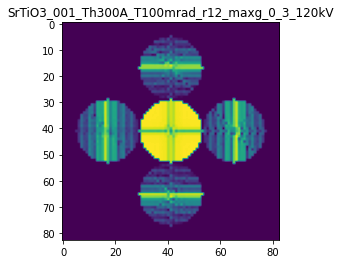

X_sim.max(): 0.9905550300906741
>>>replaced the 78. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 892ms/step - loss: 0.0015 - mean_absolute_error: 0.0234 - acc: 0.9500 - val_loss: 8.3715e-04 - val_mean_absolute_error: 0.0163 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 569ms/step - loss: 0.0016 - mean_absolute_error: 0.0243 - acc: 0.9600 - val_loss: 0.0012 - val_mean_absolute_error: 0.0196 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 599ms/step - loss: 0.0016 - mean_absolute_error: 0.0241 - acc: 0.9600 - val_loss: 8.2909e-04 - val_mean_absolute_error: 0.0163 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 717ms/step - loss: 0.0016 - mean_absolute_error: 0.0241 - acc: 0.9500 - val_loss: 6.8660e-04 - val_mean_absolute_error: 0.0171 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 4s 791ms/step - loss: 0.0017 - mean_absolute_error: 0.0249 - acc: 0.9500 - val_loss: 0.0011 - v

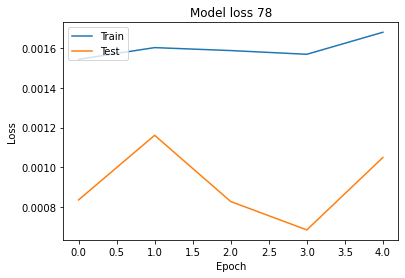

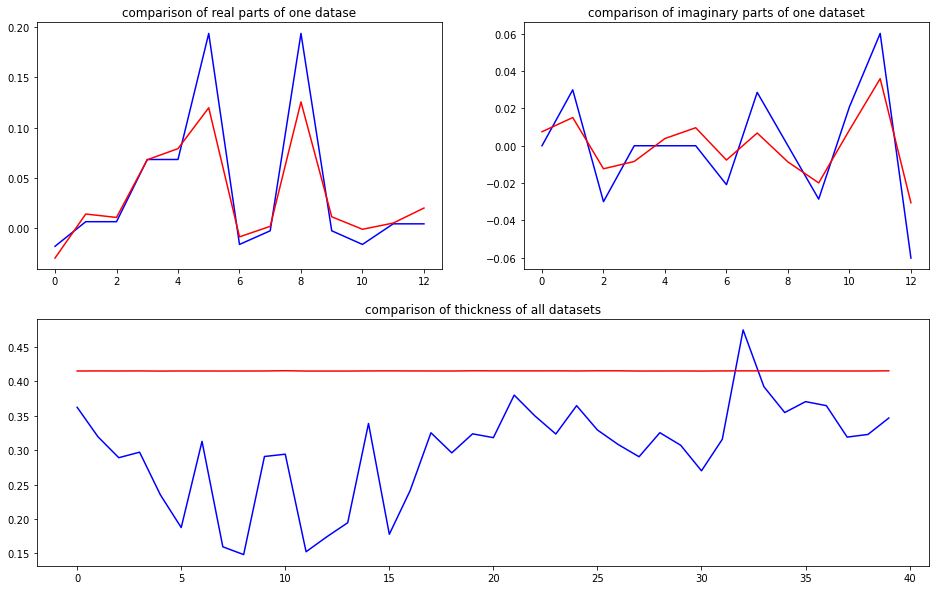

predicted thickness: 0.39095643


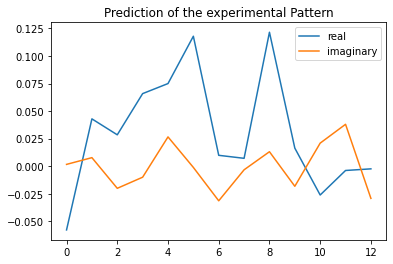

The offset applied on thickness: -0.0006758096903705066

The offset applied on Ug: 2.1494026262878907

Applied shift of unit cell origin (fractional coordinates): 0.04040043307580686 -0.004852345514373161
Ug[ 0 ]: 0.05069 3.14159  =>  0.05069 3.14159
Ug[ 1 ]: 0.04179 0.36429  =>  0.04179 0.3338
Ug[ 2 ]: 0.04179 -0.36429  =>  0.04179 -0.3338
Ug[ 3 ]: 0.08472 -0.25384  =>  0.08472 -0.0
Ug[ 4 ]: 0.08472 0.25384  =>  0.08472 0.0
Ug[ 5 ]: 0.15111 -0.06098  =>  0.15111 0.0
Ug[ 6 ]: 0.02668 -1.79016  =>  0.02668 -1.50582
Ug[ 7 ]: 0.01422 0.50285  =>  0.01422 0.27949
Ug[ 8 ]: 0.15111 0.06098  =>  0.15111 0.0
Ug[ 9 ]: 0.01422 -0.50285  =>  0.01422 -0.27949
Ug[ 10 ]: 0.02668 1.79016  =>  0.02668 1.50582
Ug[ 11 ]: 0.03427 1.59104  =>  0.03427 1.08335
Ug[ 12 ]: 0.03427 -1.59104  =>  0.03427 -1.08335
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTi

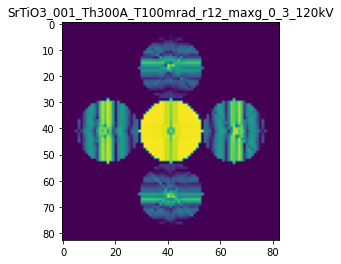

X_sim.max(): 0.990630817510934
>>>replaced the 79. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 856ms/step - loss: 0.0016 - mean_absolute_error: 0.0245 - acc: 0.9500 - val_loss: 0.0010 - val_mean_absolute_error: 0.0193 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 562ms/step - loss: 0.0015 - mean_absolute_error: 0.0247 - acc: 0.9500 - val_loss: 6.5158e-04 - val_mean_absolute_error: 0.0174 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 620ms/step - loss: 0.0016 - mean_absolute_error: 0.0257 - acc: 0.9500 - val_loss: 7.7353e-04 - val_mean_absolute_error: 0.0168 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 575ms/step - loss: 0.0015 - mean_absolute_error: 0.0235 - acc: 0.9500 - val_loss: 0.0010 - val_mean_absolute_error: 0.0177 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 628ms/step - loss: 0.0015 - mean_absolute_error: 0.0241 - acc: 0.9500 - val_loss: 6.6978e-04 - va

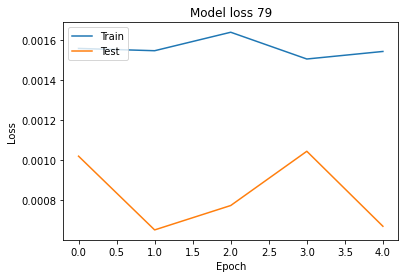

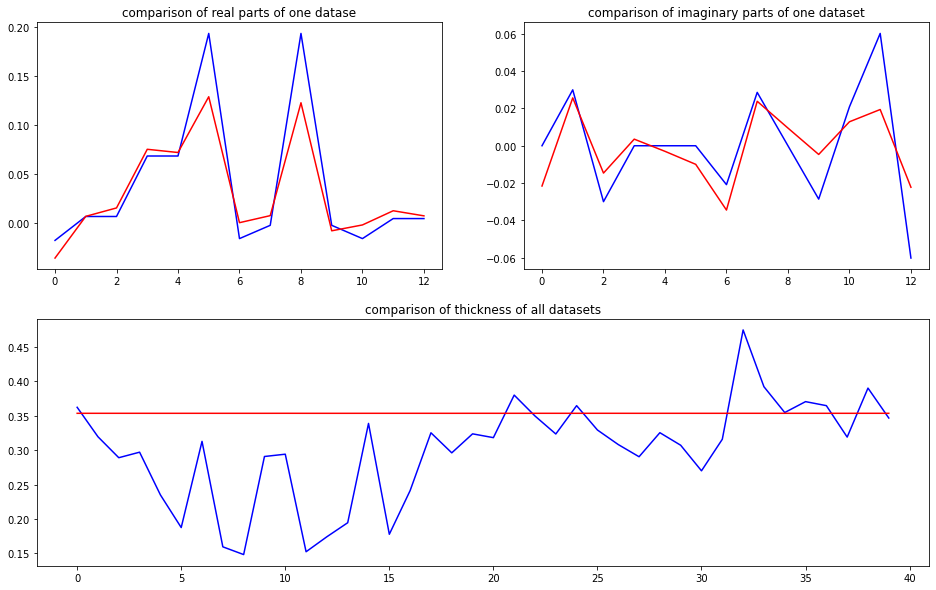

predicted thickness: 0.3040885


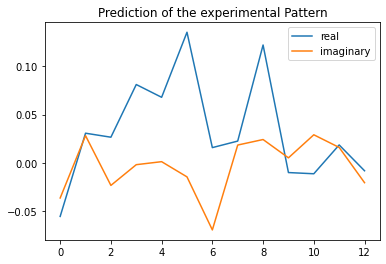

The offset applied on thickness: -0.0006269975013995601

The offset applied on Ug: 1.891805004723526

Applied shift of unit cell origin (fractional coordinates): -0.0021967155518771726 -0.006876457810399696
Ug[ 0 ]: 0.04708 3.14159  =>  0.04708 3.14159
Ug[ 1 ]: 0.04102 0.69535  =>  0.04102 0.65215
Ug[ 2 ]: 0.04102 -0.69535  =>  0.04102 -0.65215
Ug[ 3 ]: 0.08511 0.0138  =>  0.08511 -0.0
Ug[ 4 ]: 0.08511 -0.0138  =>  0.08511 0.0
Ug[ 5 ]: 0.16136 -0.08641  =>  0.16136 -0.0
Ug[ 6 ]: 0.04566 -1.39459  =>  0.04566 -1.36518
Ug[ 7 ]: 0.01033 0.79565  =>  0.01033 0.85265
Ug[ 8 ]: 0.16136 0.08641  =>  0.16136 0.0
Ug[ 9 ]: 0.01033 -0.79565  =>  0.01033 -0.85265
Ug[ 10 ]: 0.04566 1.39459  =>  0.04566 1.36518
Ug[ 11 ]: 0.01944 1.24284  =>  0.01944 1.27045
Ug[ 12 ]: 0.01944 -1.24284  =>  0.01944 -1.27045
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//S

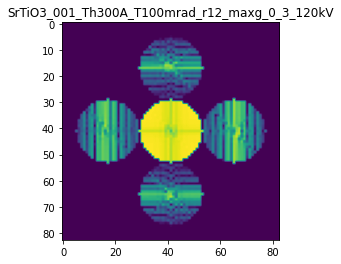

X_sim.max(): 0.982430104041267
>>>replaced the 80. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 864ms/step - loss: 0.0015 - mean_absolute_error: 0.0247 - acc: 0.9500 - val_loss: 6.6373e-04 - val_mean_absolute_error: 0.0161 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 553ms/step - loss: 0.0015 - mean_absolute_error: 0.0244 - acc: 0.9500 - val_loss: 9.2918e-04 - val_mean_absolute_error: 0.0205 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 559ms/step - loss: 0.0015 - mean_absolute_error: 0.0255 - acc: 0.9500 - val_loss: 8.1410e-04 - val_mean_absolute_error: 0.0166 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 568ms/step - loss: 0.0015 - mean_absolute_error: 0.0243 - acc: 0.9500 - val_loss: 8.2866e-04 - val_mean_absolute_error: 0.0181 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 595ms/step - loss: 0.0015 - mean_absolute_error: 0.0241 - acc: 0.9500 - val_loss: 0.0010 

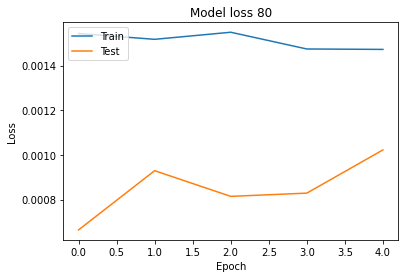

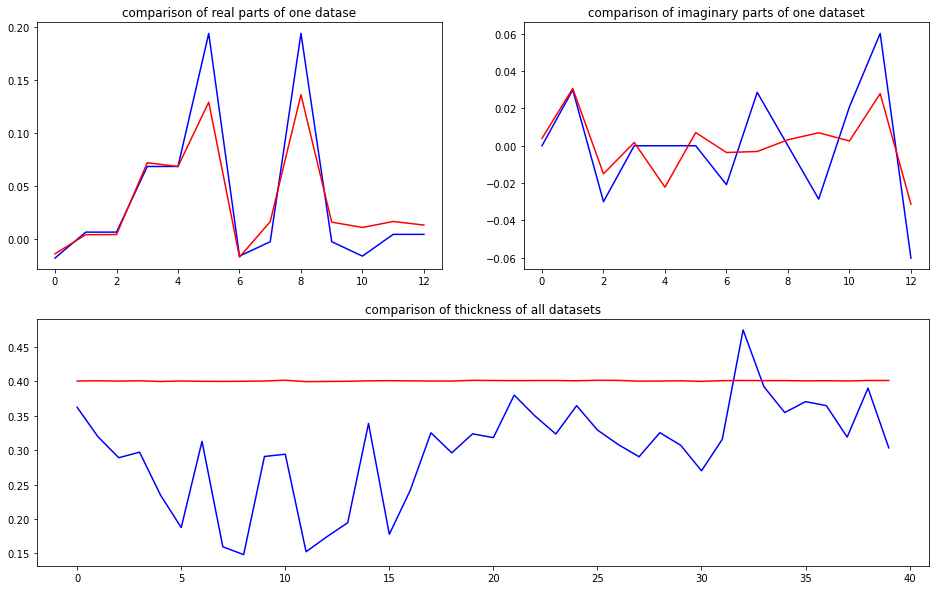

predicted thickness: 0.37152055


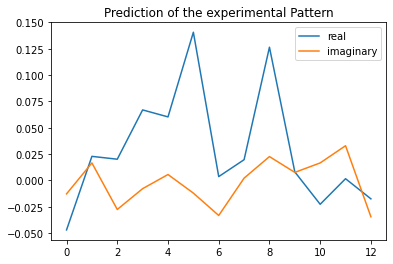

The offset applied on thickness: -3.0654504350943857e-05

The offset applied on Ug: 1.8035359838156761

Applied shift of unit cell origin (fractional coordinates): 0.012605890078369935 -0.005506930241452176
Ug[ 0 ]: 0.04275 3.14159  =>  0.04275 3.14159
Ug[ 1 ]: 0.03181 0.75235  =>  0.03181 0.71775
Ug[ 2 ]: 0.03181 -0.75235  =>  0.03181 -0.71775
Ug[ 3 ]: 0.07121 -0.07921  =>  0.07121 -0.0
Ug[ 4 ]: 0.07121 0.07921  =>  0.07121 0.0
Ug[ 5 ]: 0.16679 -0.0692  =>  0.16679 -0.0
Ug[ 6 ]: 0.02579 -1.879  =>  0.02579 -1.76519
Ug[ 7 ]: 0.01452 -0.17123  =>  0.01452 -0.21584
Ug[ 8 ]: 0.16679 0.0692  =>  0.16679 0.0
Ug[ 9 ]: 0.01452 0.17123  =>  0.01452 0.21584
Ug[ 10 ]: 0.02579 1.879  =>  0.02579 1.76519
Ug[ 11 ]: 0.03392 1.73801  =>  0.03392 1.5796
Ug[ 12 ]: 0.03392 -1.73801  =>  0.03392 -1.5796
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_

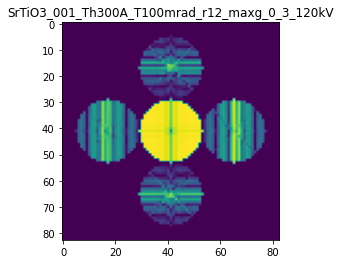

X_sim.max(): 0.9936889783600094
>>>replaced the 81. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 846ms/step - loss: 0.0015 - mean_absolute_error: 0.0244 - acc: 0.9500 - val_loss: 8.2720e-04 - val_mean_absolute_error: 0.0159 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 542ms/step - loss: 0.0014 - mean_absolute_error: 0.0232 - acc: 0.9500 - val_loss: 6.5959e-04 - val_mean_absolute_error: 0.0155 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 544ms/step - loss: 0.0014 - mean_absolute_error: 0.0226 - acc: 0.9600 - val_loss: 0.0011 - val_mean_absolute_error: 0.0189 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 568ms/step - loss: 0.0015 - mean_absolute_error: 0.0237 - acc: 0.9500 - val_loss: 6.1350e-04 - val_mean_absolute_error: 0.0155 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 579ms/step - loss: 0.0014 - mean_absolute_error: 0.0231 - acc: 0.9500 - val_loss: 0.0010 - v

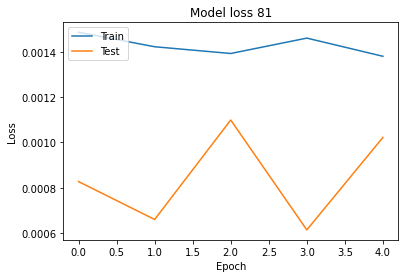

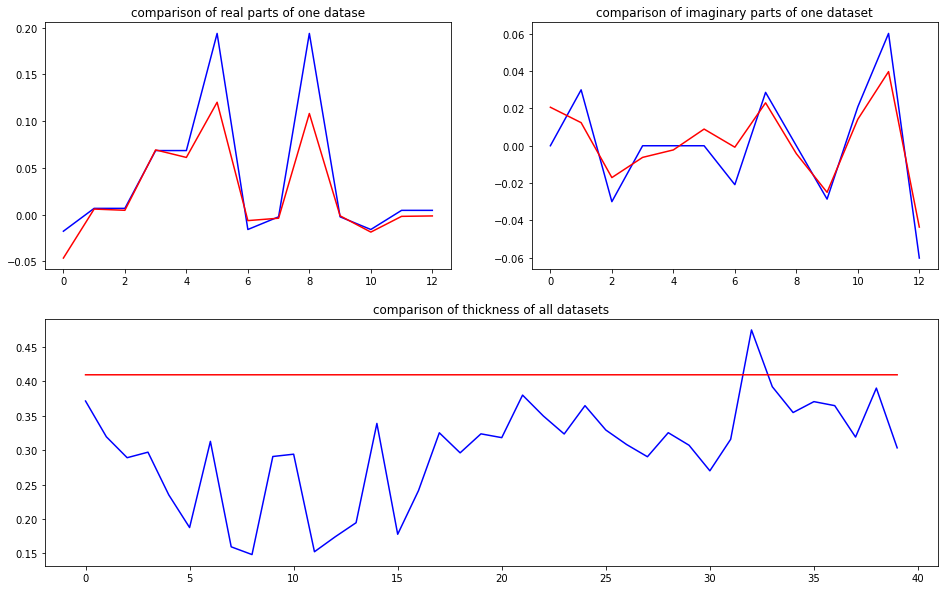

predicted thickness: 0.40463707


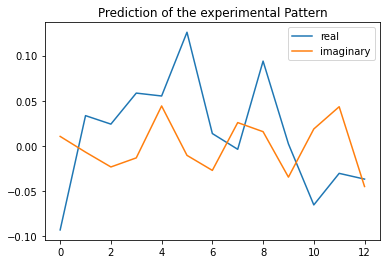

The offset applied on thickness: -0.00019313167425216848

The offset applied on Ug: 0.5216750888449639

Applied shift of unit cell origin (fractional coordinates): 0.07278130483150033 -0.007490900861998593
Ug[ 0 ]: 0.08833 3.14159  =>  0.08833 3.14159
Ug[ 1 ]: 0.03063 0.2719  =>  0.03063 0.22483
Ug[ 2 ]: 0.03063 -0.2719  =>  0.03063 -0.22483
Ug[ 3 ]: 0.06597 -0.4573  =>  0.06597 0.0
Ug[ 4 ]: 0.06597 0.4573  =>  0.06597 -0.0
Ug[ 5 ]: 0.11697 -0.09413  =>  0.11697 0.0
Ug[ 6 ]: 0.03401 -2.36614  =>  0.03401 -1.86178
Ug[ 7 ]: 0.03005 1.57751  =>  0.03005 1.16728
Ug[ 8 ]: 0.11697 0.09413  =>  0.11697 0.0
Ug[ 9 ]: 0.03005 -1.57751  =>  0.03005 -1.16728
Ug[ 10 ]: 0.03401 2.36614  =>  0.03401 1.86178
Ug[ 11 ]: 0.05434 2.19746  =>  0.05434 1.28287
Ug[ 12 ]: 0.05434 -2.19746  =>  0.05434 -1.28287
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO

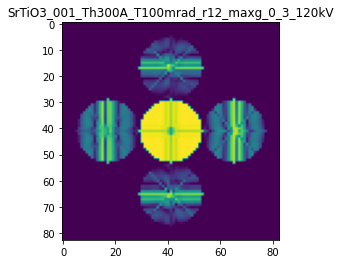

X_sim.max(): 0.9962066141243229
>>>replaced the 82. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 959ms/step - loss: 0.0015 - mean_absolute_error: 0.0238 - acc: 0.9600 - val_loss: 0.0011 - val_mean_absolute_error: 0.0210 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 537ms/step - loss: 0.0015 - mean_absolute_error: 0.0244 - acc: 0.9500 - val_loss: 6.6368e-04 - val_mean_absolute_error: 0.0154 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 554ms/step - loss: 0.0015 - mean_absolute_error: 0.0236 - acc: 0.9500 - val_loss: 8.6170e-04 - val_mean_absolute_error: 0.0173 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 567ms/step - loss: 0.0014 - mean_absolute_error: 0.0226 - acc: 0.9600 - val_loss: 8.2154e-04 - val_mean_absolute_error: 0.0166 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 590ms/step - loss: 0.0013 - mean_absolute_error: 0.0221 - acc: 0.9500 - val_loss: 7.5595e-04

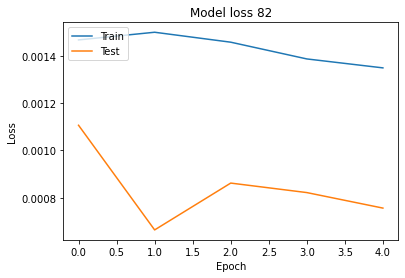

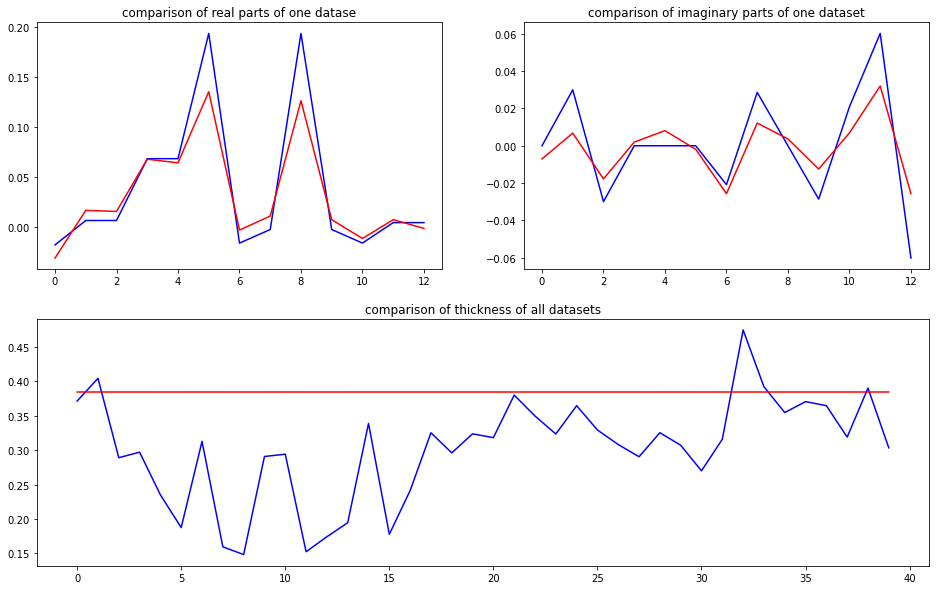

predicted thickness: 0.34860152


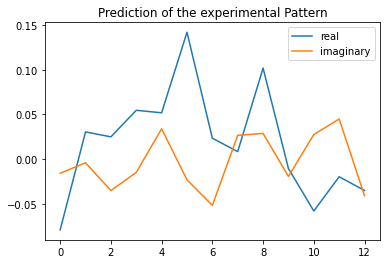

The offset applied on thickness: -0.0007733332018200275

The offset applied on Ug: -0.9790325219210871

Applied shift of unit cell origin (fractional coordinates): 0.07191881054398258 -0.021215664583876723
Ug[ 0 ]: 0.08576 3.14159  =>  0.08576 3.14159
Ug[ 1 ]: 0.03074 0.54839  =>  0.03074 0.41509
Ug[ 2 ]: 0.03074 -0.54839  =>  0.03074 -0.41509
Ug[ 3 ]: 0.05528 -0.45188  =>  0.05528 0.0
Ug[ 4 ]: 0.05528 0.45188  =>  0.05528 -0.0
Ug[ 5 ]: 0.11017 -0.2666  =>  0.11017 -0.0
Ug[ 6 ]: 0.04421 -2.06693  =>  0.04421 -1.48175
Ug[ 7 ]: 0.02294 1.64819  =>  0.02294 1.32961
Ug[ 8 ]: 0.11017 0.2666  =>  0.11017 0.0
Ug[ 9 ]: 0.02294 -1.64819  =>  0.02294 -1.32961
Ug[ 10 ]: 0.04421 2.06693  =>  0.04421 1.48175
Ug[ 11 ]: 0.05271 2.17881  =>  0.05271 1.27505
Ug[ 12 ]: 0.05271 -2.17881  =>  0.05271 -1.27505
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

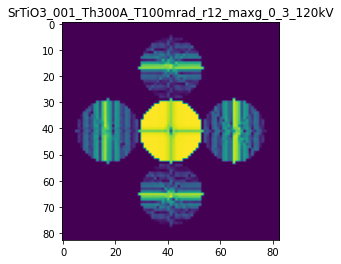

X_sim.max(): 0.996242253556317
>>>replaced the 83. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 845ms/step - loss: 0.0013 - mean_absolute_error: 0.0218 - acc: 0.9600 - val_loss: 6.7814e-04 - val_mean_absolute_error: 0.0152 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 559ms/step - loss: 0.0013 - mean_absolute_error: 0.0217 - acc: 0.9600 - val_loss: 8.3188e-04 - val_mean_absolute_error: 0.0166 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 653ms/step - loss: 0.0013 - mean_absolute_error: 0.0219 - acc: 0.9700 - val_loss: 7.7085e-04 - val_mean_absolute_error: 0.0152 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 676ms/step - loss: 0.0013 - mean_absolute_error: 0.0218 - acc: 0.9700 - val_loss: 6.1346e-04 - val_mean_absolute_error: 0.0148 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 706ms/step - loss: 0.0013 - mean_absolute_error: 0.0218 - acc: 0.9700 - val_loss: 9.7929e

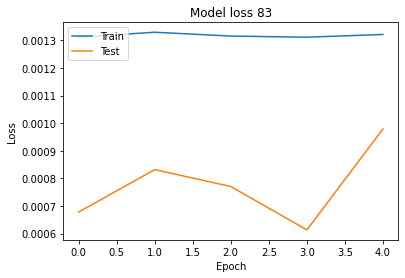

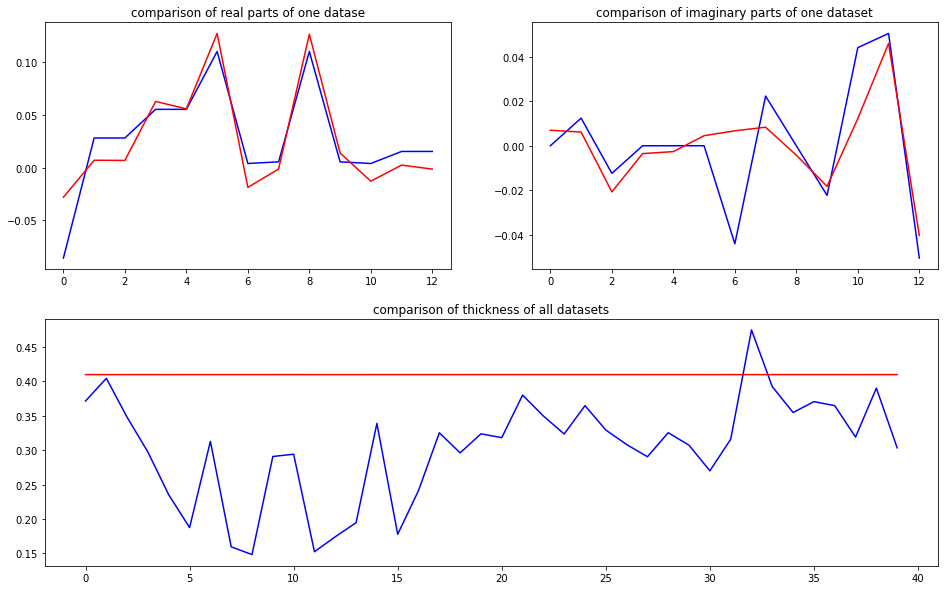

predicted thickness: 0.28056076


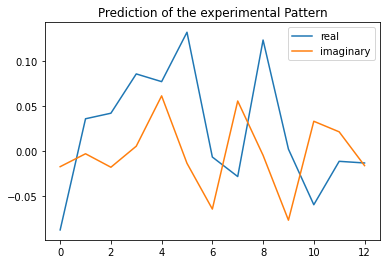

The offset applied on thickness: -0.0009978856434703814

The offset applied on Ug: 1.5887514952855872

Applied shift of unit cell origin (fractional coordinates): 0.04884949545444201 -0.0006642438453041391
Ug[ 0 ]: 0.07459 3.14159  =>  0.07459 3.14159
Ug[ 1 ]: 0.04234 0.15946  =>  0.04234 0.15529
Ug[ 2 ]: 0.04234 -0.15946  =>  0.04234 -0.15529
Ug[ 3 ]: 0.09969 -0.30693  =>  0.09969 0.0
Ug[ 4 ]: 0.09969 0.30693  =>  0.09969 0.0
Ug[ 5 ]: 0.15361 -0.00835  =>  0.15361 0.0
Ug[ 6 ]: 0.05485 -2.06106  =>  0.05485 -1.74995
Ug[ 7 ]: 0.06432 1.64982  =>  0.06432 1.34707
Ug[ 8 ]: 0.15361 0.00835  =>  0.15361 0.0
Ug[ 9 ]: 0.06432 -1.64982  =>  0.06432 -1.34707
Ug[ 10 ]: 0.05485 2.06106  =>  0.05485 1.74995
Ug[ 11 ]: 0.02193 2.10791  =>  0.02193 1.49405
Ug[ 12 ]: 0.02193 -2.10791  =>  0.02193 -1.49405
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

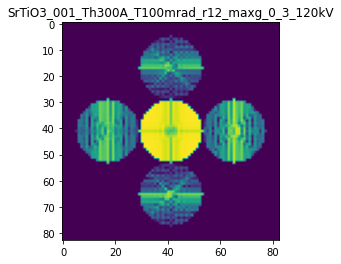

X_sim.max(): 0.9700822303879757
>>>replaced the 84. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 851ms/step - loss: 0.0013 - mean_absolute_error: 0.0215 - acc: 0.9700 - val_loss: 5.5471e-04 - val_mean_absolute_error: 0.0144 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 585ms/step - loss: 0.0013 - mean_absolute_error: 0.0215 - acc: 0.9600 - val_loss: 7.6523e-04 - val_mean_absolute_error: 0.0160 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 649ms/step - loss: 0.0013 - mean_absolute_error: 0.0221 - acc: 0.9600 - val_loss: 8.5151e-04 - val_mean_absolute_error: 0.0169 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 623ms/step - loss: 0.0013 - mean_absolute_error: 0.0218 - acc: 0.9700 - val_loss: 7.4576e-04 - val_mean_absolute_error: 0.0178 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 727ms/step - loss: 0.0013 - mean_absolute_error: 0.0233 - acc: 0.9600 - val_loss: 7.4053

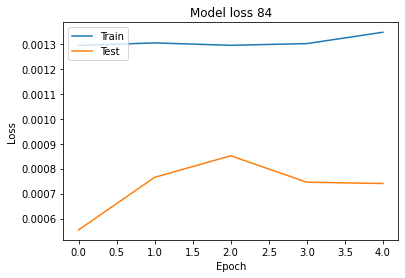

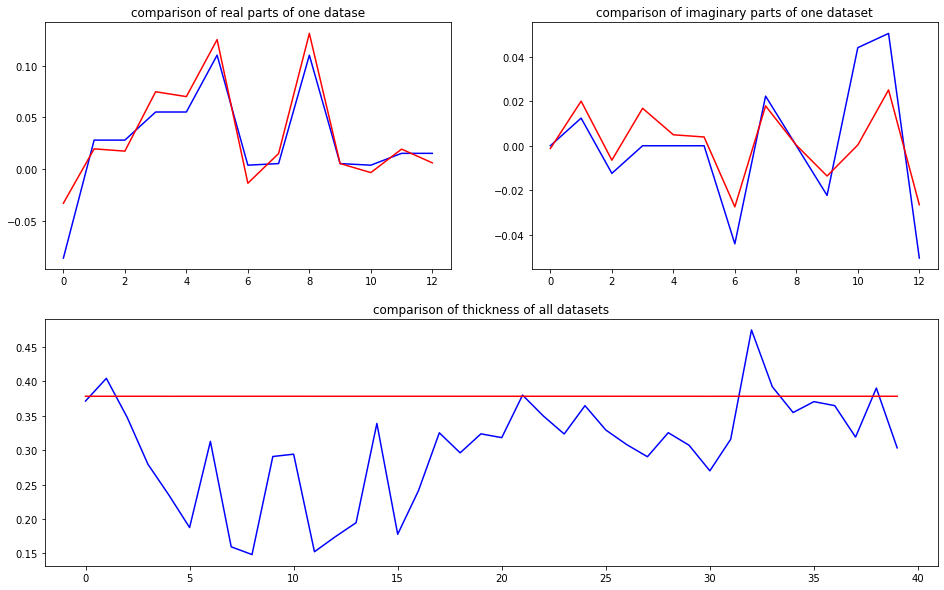

predicted thickness: 0.3926764


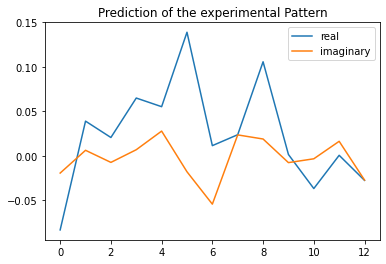

The offset applied on thickness: 0.00039827126672107194

The offset applied on Ug: 0.22476801691406598

Applied shift of unit cell origin (fractional coordinates): 0.026919331964440192 -0.010959227464187728
Ug[ 0 ]: 0.08167 3.14159  =>  0.08167 3.14159
Ug[ 1 ]: 0.0308 0.22689  =>  0.0308 0.15803
Ug[ 2 ]: 0.0308 -0.22689  =>  0.0308 -0.15803
Ug[ 3 ]: 0.06187 -0.16914  =>  0.06187 0.0
Ug[ 4 ]: 0.06187 0.16914  =>  0.06187 0.0
Ug[ 5 ]: 0.12701 -0.13772  =>  0.12701 0.0
Ug[ 6 ]: 0.02808 -2.01956  =>  0.02808 -1.78156
Ug[ 7 ]: 0.02021 0.89014  =>  0.02021 0.78986
Ug[ 8 ]: 0.12701 0.13772  =>  0.12701 0.0
Ug[ 9 ]: 0.02021 -0.89014  =>  0.02021 -0.78986
Ug[ 10 ]: 0.02808 2.01956  =>  0.02808 1.78156
Ug[ 11 ]: 0.02541 2.12258  =>  0.02541 1.7843
Ug[ 12 ]: 0.02541 -2.12258  =>  0.02541 -1.7843
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_

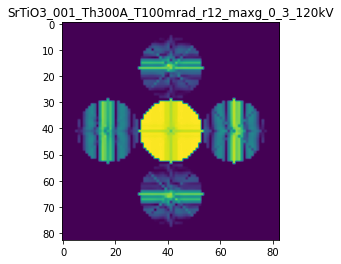

X_sim.max(): 0.9965300086694149
>>>replaced the 85. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 957ms/step - loss: 0.0012 - mean_absolute_error: 0.0218 - acc: 0.9600 - val_loss: 7.8221e-04 - val_mean_absolute_error: 0.0166 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 585ms/step - loss: 0.0013 - mean_absolute_error: 0.0221 - acc: 0.9600 - val_loss: 5.8289e-04 - val_mean_absolute_error: 0.0148 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 652ms/step - loss: 0.0012 - mean_absolute_error: 0.0215 - acc: 0.9600 - val_loss: 7.8847e-04 - val_mean_absolute_error: 0.0170 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 692ms/step - loss: 0.0012 - mean_absolute_error: 0.0220 - acc: 0.9600 - val_loss: 6.9618e-04 - val_mean_absolute_error: 0.0160 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 700ms/step - loss: 0.0012 - mean_absolute_error: 0.0217 - acc: 0.9600 - val_loss: 9.8557

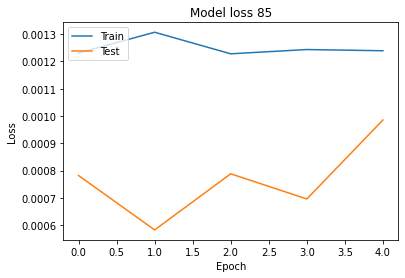

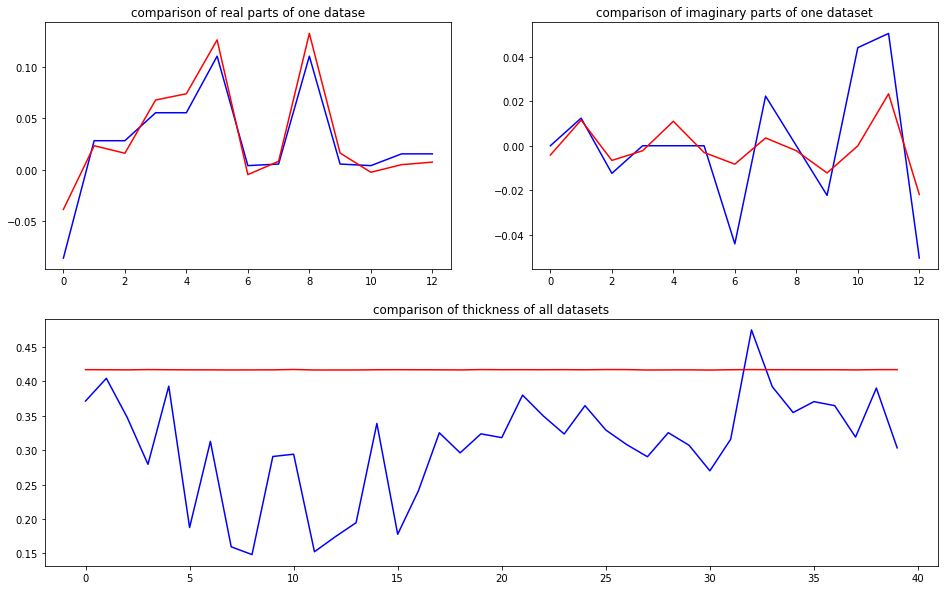

predicted thickness: 0.34589097


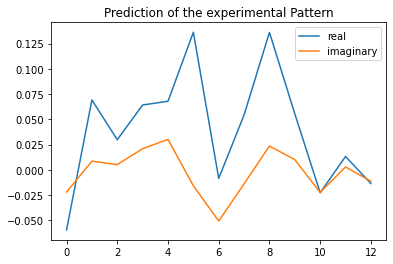

The offset applied on thickness: -0.00022701793967738282

The offset applied on Ug: 0.5943578323716571

Applied shift of unit cell origin (fractional coordinates): 0.011352648945087864 -0.010617329337849651
Ug[ 0 ]: 0.05718 3.14159  =>  0.05718 3.14159
Ug[ 1 ]: 0.05127 0.05813  =>  0.05127 -0.00858
Ug[ 2 ]: 0.05127 -0.05813  =>  0.05127 0.00858
Ug[ 3 ]: 0.06918 -0.07133  =>  0.06918 0.0
Ug[ 4 ]: 0.06918 0.07133  =>  0.06918 -0.0
Ug[ 5 ]: 0.14875 -0.13342  =>  0.14875 0.0
Ug[ 6 ]: 0.01996 -2.38762  =>  0.01996 -2.24958
Ug[ 7 ]: 0.05801 -0.20819  =>  0.05801 -0.21281
Ug[ 8 ]: 0.14875 0.13342  =>  0.14875 0.0
Ug[ 9 ]: 0.05801 0.20819  =>  0.05801 0.21281
Ug[ 10 ]: 0.01996 2.38762  =>  0.01996 2.24958
Ug[ 11 ]: 0.00704 1.58446  =>  0.00704 1.44179
Ug[ 12 ]: 0.00704 -1.58446  =>  0.00704 -1.44179
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//

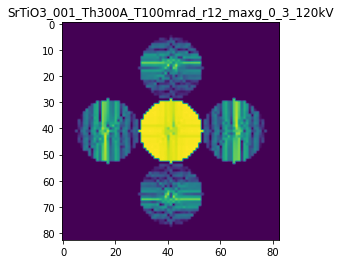

X_sim.max(): 0.997585585183473
>>>replaced the 86. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 857ms/step - loss: 0.0013 - mean_absolute_error: 0.0220 - acc: 0.9600 - val_loss: 7.6071e-04 - val_mean_absolute_error: 0.0181 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 539ms/step - loss: 0.0014 - mean_absolute_error: 0.0230 - acc: 0.9600 - val_loss: 4.9691e-04 - val_mean_absolute_error: 0.0140 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 549ms/step - loss: 0.0014 - mean_absolute_error: 0.0236 - acc: 0.9700 - val_loss: 0.0011 - val_mean_absolute_error: 0.0213 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 3s 566ms/step - loss: 0.0013 - mean_absolute_error: 0.0238 - acc: 0.9700 - val_loss: 8.2952e-04 - val_mean_absolute_error: 0.0174 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 593ms/step - loss: 0.0013 - mean_absolute_error: 0.0224 - acc: 0.9700 - val_loss: 7.6016e-04 

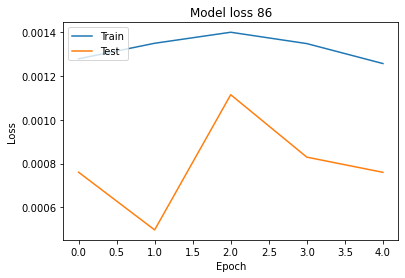

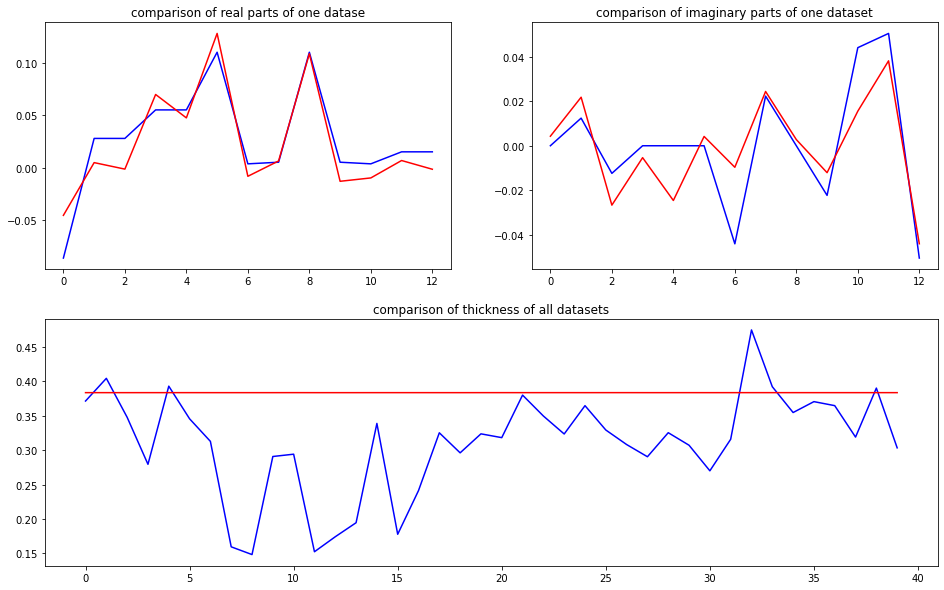

predicted thickness: 0.34668344


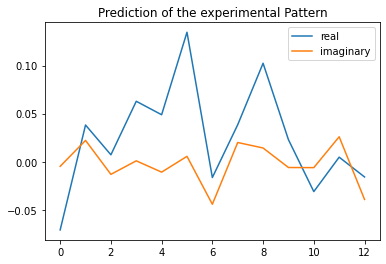

The offset applied on thickness: -4.520796770886215e-05

The offset applied on Ug: -1.9918764269992488

Applied shift of unit cell origin (fractional coordinates): -0.015730166995584913 -0.006441666432261648
Ug[ 0 ]: 0.08094 3.14159  =>  0.08094 3.14159
Ug[ 1 ]: 0.02613 0.66844  =>  0.02613 0.62797
Ug[ 2 ]: 0.02613 -0.66844  =>  0.02613 -0.62797
Ug[ 3 ]: 0.04965 0.09884  =>  0.04965 0.0
Ug[ 4 ]: 0.04965 -0.09884  =>  0.04965 0.0
Ug[ 5 ]: 0.09005 -0.08095  =>  0.09005 0.0
Ug[ 6 ]: 0.03374 -2.49641  =>  0.03374 -2.55477
Ug[ 7 ]: 0.03066 0.399  =>  0.03066 0.53831
Ug[ 8 ]: 0.09005 0.08095  =>  0.09005 0.0
Ug[ 9 ]: 0.03066 -0.399  =>  0.03066 -0.53831
Ug[ 10 ]: 0.03374 2.49641  =>  0.03374 2.55477
Ug[ 11 ]: 0.03473 1.80398  =>  0.03473 2.00165
Ug[ 12 ]: 0.03473 -1.80398  =>  0.03473 -2.00165
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTi

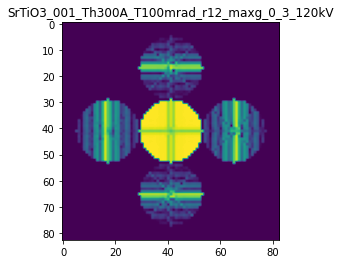

X_sim.max(): 0.9968242730110446
>>>replaced the 87. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 977ms/step - loss: 0.0012 - mean_absolute_error: 0.0211 - acc: 0.9600 - val_loss: 9.0260e-04 - val_mean_absolute_error: 0.0179 - val_acc: 0.9500
Epoch 2/5
5/5 [==============================] - 3s 634ms/step - loss: 0.0012 - mean_absolute_error: 0.0212 - acc: 0.9600 - val_loss: 7.5258e-04 - val_mean_absolute_error: 0.0160 - val_acc: 0.9500
Epoch 3/5
5/5 [==============================] - 3s 634ms/step - loss: 0.0011 - mean_absolute_error: 0.0205 - acc: 0.9600 - val_loss: 5.8394e-04 - val_mean_absolute_error: 0.0145 - val_acc: 0.9500
Epoch 4/5
5/5 [==============================] - 4s 964ms/step - loss: 0.0011 - mean_absolute_error: 0.0205 - acc: 0.9600 - val_loss: 6.8712e-04 - val_mean_absolute_error: 0.0153 - val_acc: 0.9500
Epoch 5/5
5/5 [==============================] - 3s 716ms/step - loss: 0.0011 - mean_absolute_error: 0.0201 - acc: 0.9700 - val_loss: 5.8869

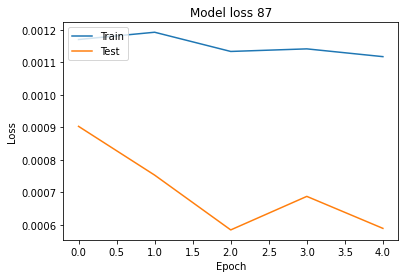

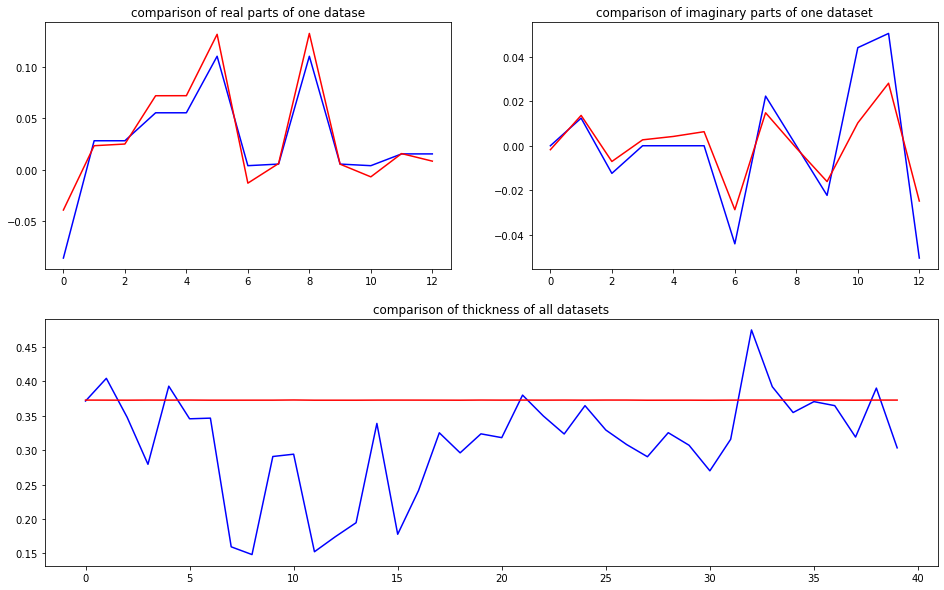

predicted thickness: 0.32355


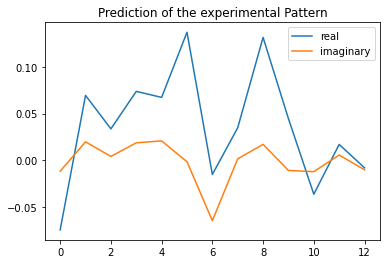

The offset applied on thickness: -0.0003543932013344249

The offset applied on Ug: -1.949298793362878

Applied shift of unit cell origin (fractional coordinates): 0.004047546702439008 -0.007739523372130095
Ug[ 0 ]: 0.08596 3.14159  =>  0.08596 3.14159
Ug[ 1 ]: 0.04556 0.10995  =>  0.04556 0.06132
Ug[ 2 ]: 0.04556 -0.10995  =>  0.04556 -0.06132
Ug[ 3 ]: 0.06005 -0.02543  =>  0.06005 0.0
Ug[ 4 ]: 0.06005 0.02543  =>  0.06005 -0.0
Ug[ 5 ]: 0.09933 -0.09726  =>  0.09933 0.0
Ug[ 6 ]: 0.04317 -2.39553  =>  0.04317 -2.32147
Ug[ 7 ]: 0.03702 0.18844  =>  0.03702 0.21164
Ug[ 8 ]: 0.09933 0.09726  =>  0.09933 -0.0
Ug[ 9 ]: 0.03702 -0.18844  =>  0.03702 -0.21164
Ug[ 10 ]: 0.04317 2.39553  =>  0.04317 2.32147
Ug[ 11 ]: 0.00872 1.11618  =>  0.00872 1.06531
Ug[ 12 ]: 0.00872 -1.11618  =>  0.00872 -1.06531
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//

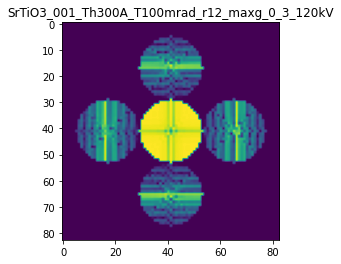

X_sim.max(): 0.9894993748743613
>>>replaced the 88. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 1s/step - loss: 0.0011 - mean_absolute_error: 0.0195 - acc: 0.9600 - val_loss: 6.3637e-04 - val_mean_absolute_error: 0.0160 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 3s 539ms/step - loss: 0.0011 - mean_absolute_error: 0.0197 - acc: 0.9600 - val_loss: 6.6298e-04 - val_mean_absolute_error: 0.0147 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 550ms/step - loss: 0.0011 - mean_absolute_error: 0.0195 - acc: 0.9600 - val_loss: 7.4564e-04 - val_mean_absolute_error: 0.0157 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 3s 566ms/step - loss: 0.0011 - mean_absolute_error: 0.0197 - acc: 0.9600 - val_loss: 5.2049e-04 - val_mean_absolute_error: 0.0143 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 3s 769ms/step - loss: 0.0011 - mean_absolute_error: 0.0197 - acc: 0.9600 - val_loss: 8.4258e-0

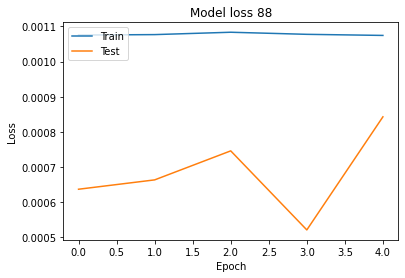

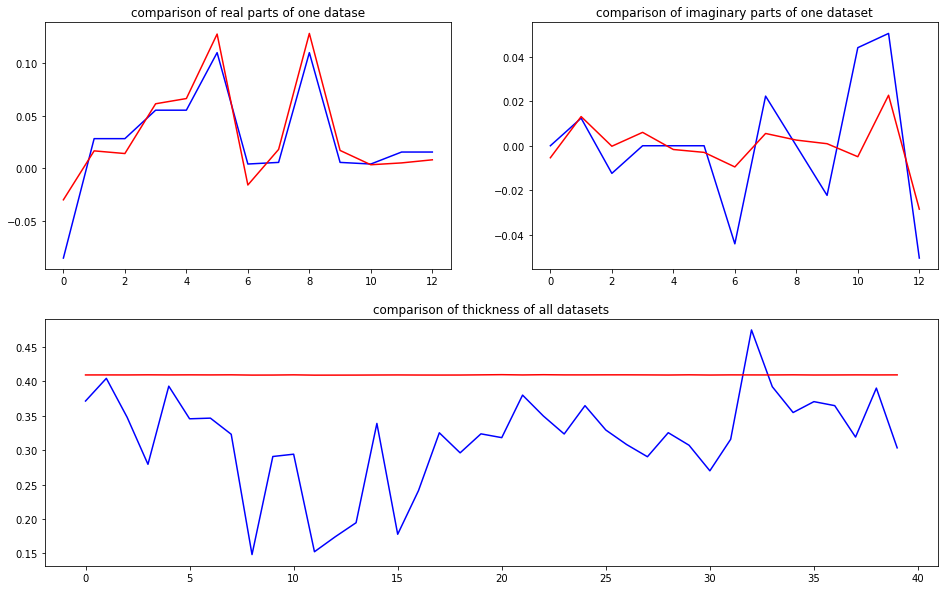

predicted thickness: 0.370202


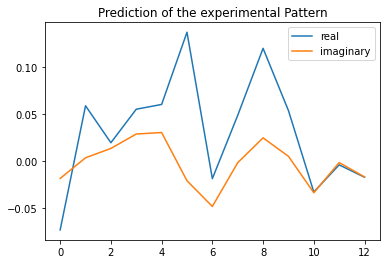

The offset applied on thickness: 0.0007781207338768823

The offset applied on Ug: -1.4047525059481882

Applied shift of unit cell origin (fractional coordinates): 0.0013350671796021959 -0.01819416601355036
Ug[ 0 ]: 0.0809 3.14159  =>  0.0809 3.14159
Ug[ 1 ]: 0.03691 -0.18095  =>  0.03691 -0.29527
Ug[ 2 ]: 0.03691 0.18095  =>  0.03691 0.29527
Ug[ 3 ]: 0.05173 -0.00839  =>  0.05173 0.0
Ug[ 4 ]: 0.05173 0.00839  =>  0.05173 0.0
Ug[ 5 ]: 0.10708 -0.22863  =>  0.10708 0.0
Ug[ 6 ]: 0.03002 -2.88753  =>  0.03002 -2.76482
Ug[ 7 ]: 0.04752 -0.06524  =>  0.04752 0.04069
Ug[ 8 ]: 0.10708 0.22863  =>  0.10708 0.0
Ug[ 9 ]: 0.04752 0.06524  =>  0.04752 -0.04069
Ug[ 10 ]: 0.03002 2.88753  =>  0.03002 2.76482
Ug[ 11 ]: 0.01354 2.50828  =>  0.01354 2.4915
Ug[ 12 ]: 0.01354 -2.50828  =>  0.01354 -2.4915
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3

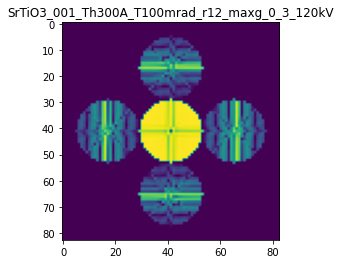

X_sim.max(): 0.9975572195375988
>>>replaced the 89. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 991ms/step - loss: 0.0011 - mean_absolute_error: 0.0199 - acc: 0.9700 - val_loss: 4.5346e-04 - val_mean_absolute_error: 0.0131 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 3s 560ms/step - loss: 0.0011 - mean_absolute_error: 0.0200 - acc: 0.9700 - val_loss: 5.6729e-04 - val_mean_absolute_error: 0.0156 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 556ms/step - loss: 0.0011 - mean_absolute_error: 0.0202 - acc: 0.9600 - val_loss: 4.8080e-04 - val_mean_absolute_error: 0.0143 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 3s 664ms/step - loss: 0.0010 - mean_absolute_error: 0.0196 - acc: 0.9700 - val_loss: 5.3205e-04 - val_mean_absolute_error: 0.0145 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 3s 689ms/step - loss: 0.0011 - mean_absolute_error: 0.0194 - acc: 0.9600 - val_loss: 5.0404

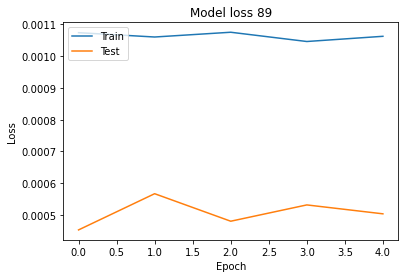

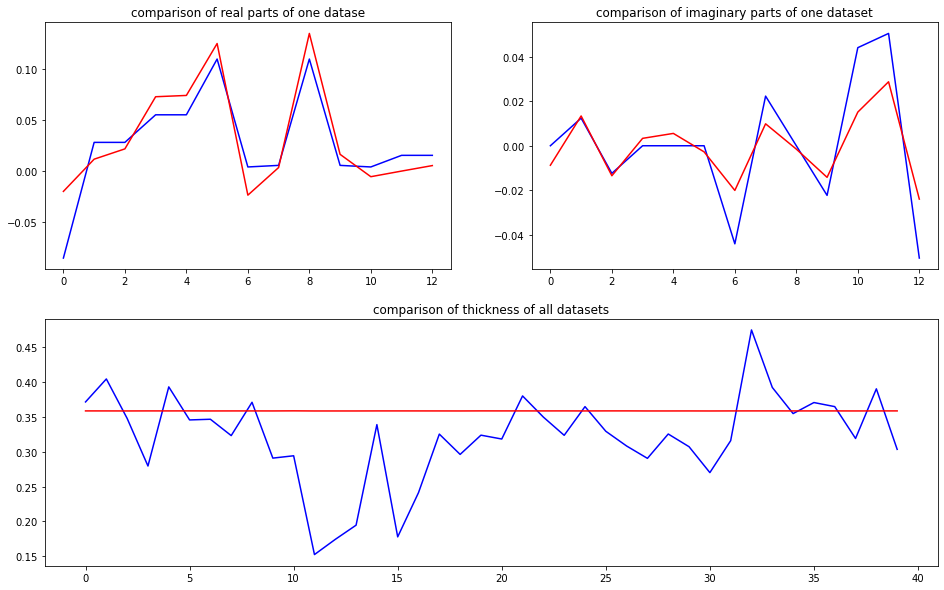

predicted thickness: 0.30745938


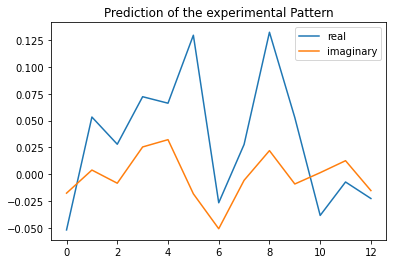

The offset applied on thickness: 0.0009074798782339144

The offset applied on Ug: -0.5963081837798552

Applied shift of unit cell origin (fractional coordinates): 0.008478779534539436 -0.013034094270291577
Ug[ 0 ]: 0.05371 3.14159  =>  0.05371 3.14159
Ug[ 1 ]: 0.03987 0.14049  =>  0.03987 0.05859
Ug[ 2 ]: 0.03987 -0.14049  =>  0.03987 -0.05859
Ug[ 3 ]: 0.0659 -0.05327  =>  0.0659 0.0
Ug[ 4 ]: 0.0659 0.05327  =>  0.0659 0.0
Ug[ 5 ]: 0.12205 -0.16379  =>  0.12205 -0.0
Ug[ 6 ]: 0.04317 -2.47571  =>  0.04317 -2.34054
Ug[ 7 ]: 0.03919 0.05829  =>  0.03919 0.08691
Ug[ 8 ]: 0.12205 0.16379  =>  0.12205 0.0
Ug[ 9 ]: 0.03919 -0.05829  =>  0.03919 -0.08691
Ug[ 10 ]: 0.04317 2.47571  =>  0.04317 2.34054
Ug[ 11 ]: 0.02076 2.39543  =>  0.02076 2.28889
Ug[ 12 ]: 0.02076 -2.39543  =>  0.02076 -2.28889
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO

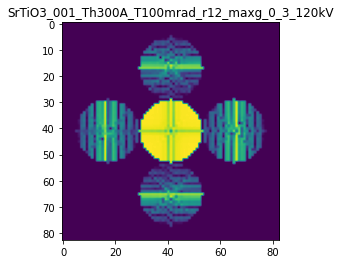

X_sim.max(): 0.9913863110754952
>>>replaced the 90. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 851ms/step - loss: 0.0010 - mean_absolute_error: 0.0193 - acc: 0.9700 - val_loss: 8.3396e-04 - val_mean_absolute_error: 0.0164 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 3s 542ms/step - loss: 0.0011 - mean_absolute_error: 0.0196 - acc: 0.9600 - val_loss: 5.7418e-04 - val_mean_absolute_error: 0.0147 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 553ms/step - loss: 0.0010 - mean_absolute_error: 0.0191 - acc: 0.9600 - val_loss: 4.6654e-04 - val_mean_absolute_error: 0.0146 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 3s 566ms/step - loss: 0.0011 - mean_absolute_error: 0.0201 - acc: 0.9600 - val_loss: 8.6799e-04 - val_mean_absolute_error: 0.0175 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 3s 740ms/step - loss: 0.0010 - mean_absolute_error: 0.0198 - acc: 0.9600 - val_loss: 4.2484

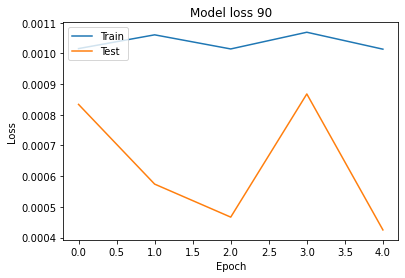

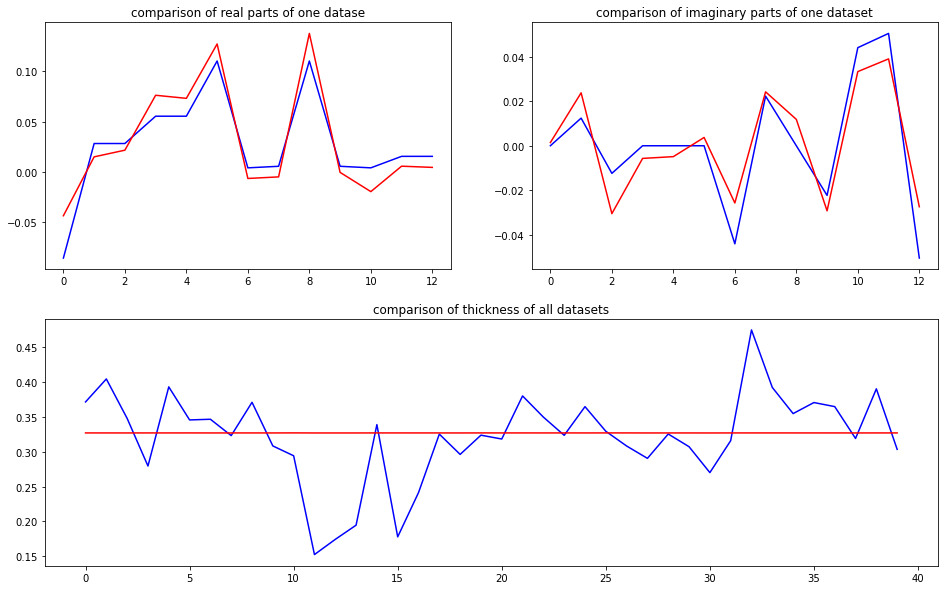

predicted thickness: 0.27955207


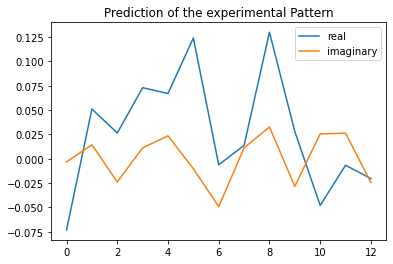

The offset applied on thickness: -0.00022960482626165592

The offset applied on Ug: -0.19055233218804465

Applied shift of unit cell origin (fractional coordinates): 0.014323642727602405 -0.013524086701714752
Ug[ 0 ]: 0.07416 3.14159  =>  0.07416 3.14159
Ug[ 1 ]: 0.04284 0.45862  =>  0.04284 0.37364
Ug[ 2 ]: 0.04284 -0.45862  =>  0.04284 -0.37364
Ug[ 3 ]: 0.06934 -0.09  =>  0.06934 0.0
Ug[ 4 ]: 0.06934 0.09  =>  0.06934 0.0
Ug[ 5 ]: 0.12571 -0.16995  =>  0.12571 0.0
Ug[ 6 ]: 0.04644 -2.20785  =>  0.04644 -2.03288
Ug[ 7 ]: 0.02868 0.76621  =>  0.02868 0.76119
Ug[ 8 ]: 0.12571 0.16995  =>  0.12571 -0.0
Ug[ 9 ]: 0.02868 -0.76621  =>  0.02868 -0.76119
Ug[ 10 ]: 0.04644 2.20785  =>  0.04644 2.03288
Ug[ 11 ]: 0.02886 2.06602  =>  0.02886 1.88602
Ug[ 12 ]: 0.02886 -2.06602  =>  0.02886 -1.88602
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTi

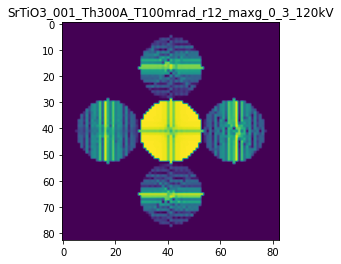

X_sim.max(): 0.9818159955513984
>>>replaced the 91. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 847ms/step - loss: 0.0011 - mean_absolute_error: 0.0199 - acc: 0.9600 - val_loss: 7.4472e-04 - val_mean_absolute_error: 0.0171 - val_acc: 0.9750
Epoch 2/5
5/5 [==============================] - 3s 538ms/step - loss: 9.9556e-04 - mean_absolute_error: 0.0197 - acc: 0.9600 - val_loss: 5.2131e-04 - val_mean_absolute_error: 0.0152 - val_acc: 0.9750
Epoch 3/5
5/5 [==============================] - 3s 551ms/step - loss: 9.8200e-04 - mean_absolute_error: 0.0192 - acc: 0.9600 - val_loss: 7.2209e-04 - val_mean_absolute_error: 0.0158 - val_acc: 0.9750
Epoch 4/5
5/5 [==============================] - 3s 562ms/step - loss: 9.7965e-04 - mean_absolute_error: 0.0191 - acc: 0.9600 - val_loss: 5.4718e-04 - val_mean_absolute_error: 0.0149 - val_acc: 0.9750
Epoch 5/5
5/5 [==============================] - 3s 758ms/step - loss: 9.7773e-04 - mean_absolute_error: 0.0193 - acc: 0.9600 - 

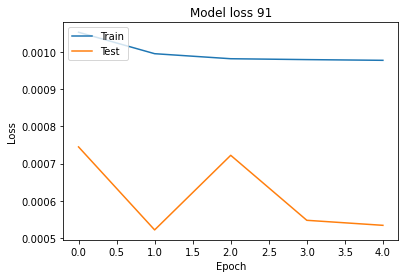

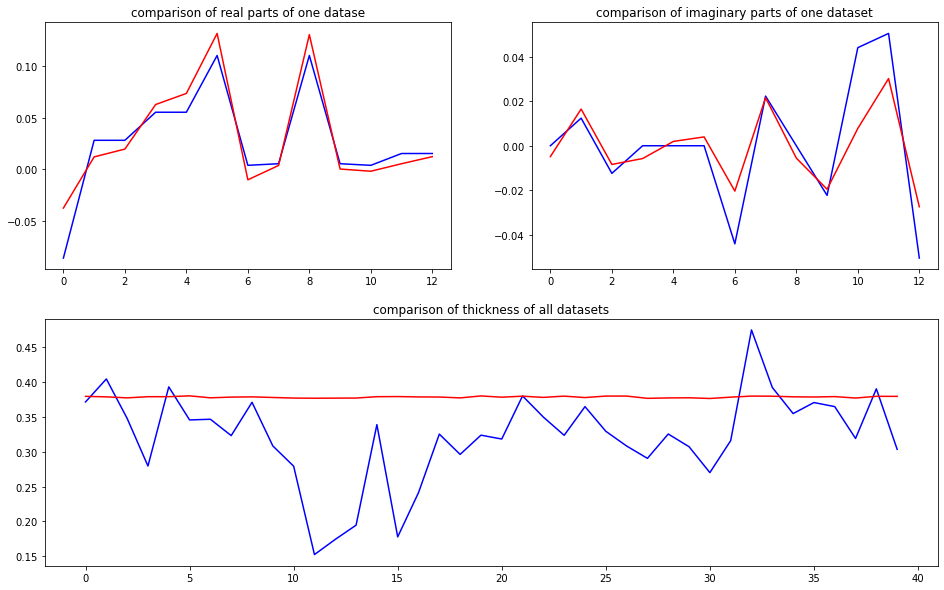

predicted thickness: 0.32679707


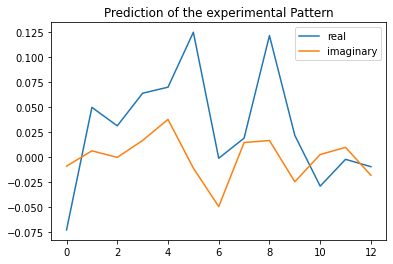

The offset applied on thickness: -0.00010151279818895188

The offset applied on Ug: 0.49881868711493726

Applied shift of unit cell origin (fractional coordinates): 0.02497269316973431 -0.008231886045640265
Ug[ 0 ]: 0.0701 3.14159  =>  0.0701 3.14159
Ug[ 1 ]: 0.04178 0.08849  =>  0.04178 0.03677
Ug[ 2 ]: 0.04178 -0.08849  =>  0.04178 -0.03677
Ug[ 3 ]: 0.07074 -0.15691  =>  0.07074 0.0
Ug[ 4 ]: 0.07074 0.15691  =>  0.07074 -0.0
Ug[ 5 ]: 0.132 -0.10344  =>  0.132 0.0
Ug[ 6 ]: 0.02931 -2.07439  =>  0.02931 -1.86576
Ug[ 7 ]: 0.02862 0.75048  =>  0.02862 0.64529
Ug[ 8 ]: 0.132 0.10344  =>  0.132 0.0
Ug[ 9 ]: 0.02862 -0.75048  =>  0.02862 -0.64529
Ug[ 10 ]: 0.02931 2.07439  =>  0.02931 1.86576
Ug[ 11 ]: 0.01501 1.95559  =>  0.01501 1.64177
Ug[ 12 ]: 0.01501 -1.95559  =>  0.01501 -1.64177
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001

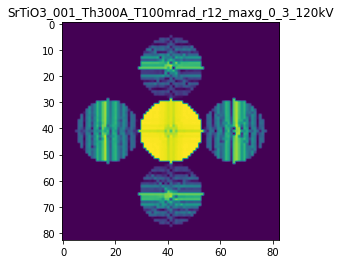

X_sim.max(): 0.9813270688088718
>>>replaced the 92. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 839ms/step - loss: 9.4337e-04 - mean_absolute_error: 0.0186 - acc: 0.9600 - val_loss: 4.9917e-04 - val_mean_absolute_error: 0.0147 - val_acc: 1.0000
Epoch 2/5
5/5 [==============================] - 2s 536ms/step - loss: 9.3448e-04 - mean_absolute_error: 0.0186 - acc: 0.9700 - val_loss: 6.4426e-04 - val_mean_absolute_error: 0.0158 - val_acc: 1.0000
Epoch 3/5
5/5 [==============================] - 3s 553ms/step - loss: 9.2545e-04 - mean_absolute_error: 0.0188 - acc: 0.9600 - val_loss: 4.1631e-04 - val_mean_absolute_error: 0.0139 - val_acc: 1.0000
Epoch 4/5
5/5 [==============================] - 3s 563ms/step - loss: 9.7219e-04 - mean_absolute_error: 0.0189 - acc: 0.9600 - val_loss: 5.5625e-04 - val_mean_absolute_error: 0.0148 - val_acc: 1.0000
Epoch 5/5
5/5 [==============================] - 3s 771ms/step - loss: 9.4025e-04 - mean_absolute_error: 0.0188 - acc: 0.970

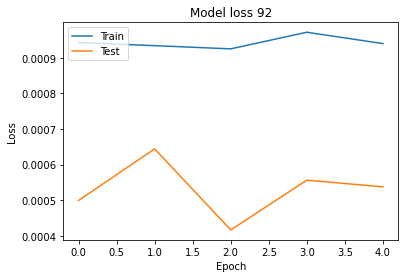

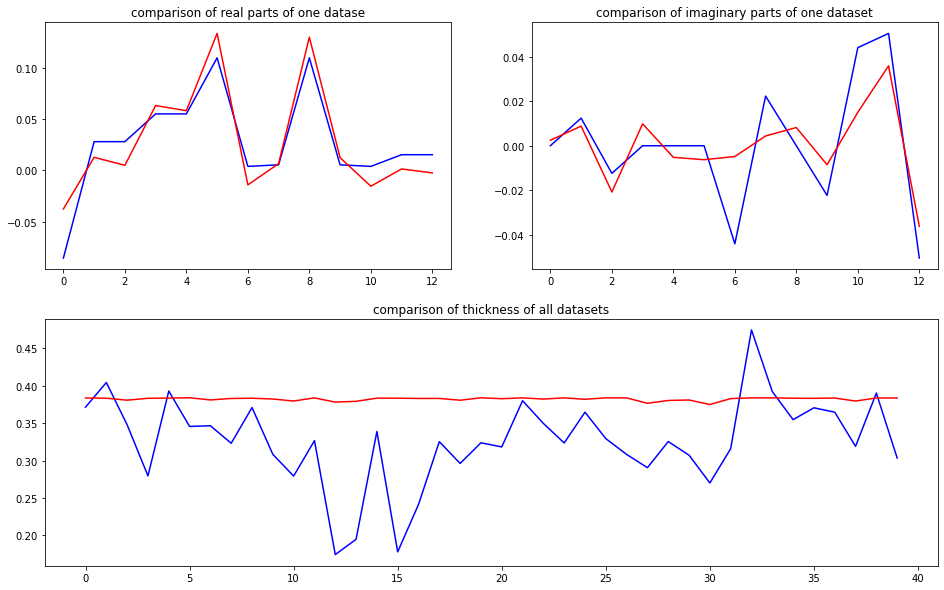

predicted thickness: 0.33221197


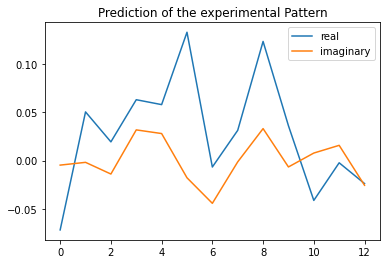

The offset applied on thickness: 0.0005518048426686521

The offset applied on Ug: 1.1293776796315615

Applied shift of unit cell origin (fractional coordinates): -0.005988735521596791 -0.012824931330784828
Ug[ 0 ]: 0.06599 3.14159  =>  0.06599 3.14159
Ug[ 1 ]: 0.03748 0.197  =>  0.03748 0.11642
Ug[ 2 ]: 0.03748 -0.197  =>  0.03748 -0.11642
Ug[ 3 ]: 0.06584 0.03763  =>  0.06584 0.0
Ug[ 4 ]: 0.06584 -0.03763  =>  0.06584 0.0
Ug[ 5 ]: 0.14973 -0.16116  =>  0.14973 0.0
Ug[ 6 ]: 0.03382 -2.2716  =>  0.03382 -2.22865
Ug[ 7 ]: 0.03519 0.0683  =>  0.03519 0.18651
Ug[ 8 ]: 0.14973 0.16116  =>  0.14973 0.0
Ug[ 9 ]: 0.03519 -0.0683  =>  0.03519 -0.18651
Ug[ 10 ]: 0.03382 2.2716  =>  0.03382 2.22865
Ug[ 11 ]: 0.0236 2.11327  =>  0.0236 2.18853
Ug[ 12 ]: 0.0236 -2.11327  =>  0.0236 -2.18853
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

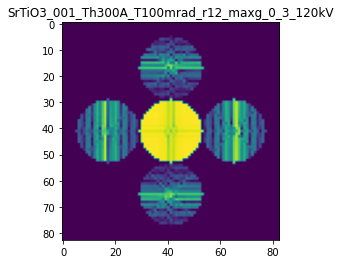

X_sim.max(): 0.9914008752722888
>>>replaced the 93. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 831ms/step - loss: 8.8966e-04 - mean_absolute_error: 0.0183 - acc: 0.9600 - val_loss: 5.0370e-04 - val_mean_absolute_error: 0.0147 - val_acc: 1.0000
Epoch 2/5
5/5 [==============================] - 2s 523ms/step - loss: 8.8994e-04 - mean_absolute_error: 0.0181 - acc: 0.9600 - val_loss: 4.3317e-04 - val_mean_absolute_error: 0.0139 - val_acc: 1.0000
Epoch 3/5
5/5 [==============================] - 2s 532ms/step - loss: 9.0206e-04 - mean_absolute_error: 0.0183 - acc: 0.9600 - val_loss: 4.3773e-04 - val_mean_absolute_error: 0.0142 - val_acc: 1.0000
Epoch 4/5
5/5 [==============================] - 3s 578ms/step - loss: 9.4412e-04 - mean_absolute_error: 0.0192 - acc: 0.9600 - val_loss: 4.3447e-04 - val_mean_absolute_error: 0.0150 - val_acc: 1.0000
Epoch 5/5
5/5 [==============================] - 3s 653ms/step - loss: 9.4802e-04 - mean_absolute_error: 0.0190 - acc: 0.960

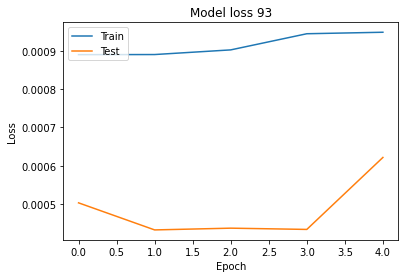

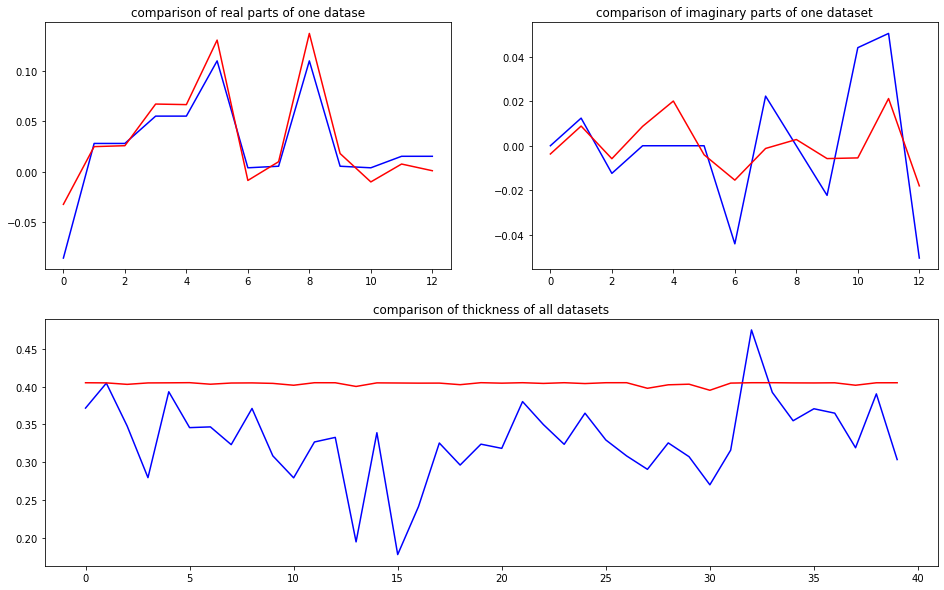

predicted thickness: 0.36967894


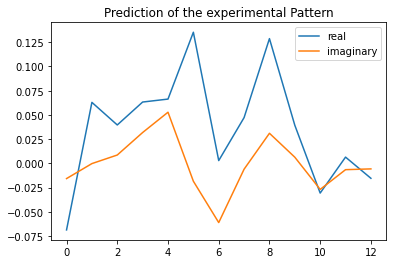

The offset applied on thickness: -0.0006278797752203651

The offset applied on Ug: -1.4153263598058679

Applied shift of unit cell origin (fractional coordinates): 0.02588682552242001 -0.018391145004231522
Ug[ 0 ]: 0.07571 3.14159  =>  0.07571 3.14159
Ug[ 1 ]: 0.04767 -0.12016  =>  0.04767 -0.23572
Ug[ 2 ]: 0.04767 0.12016  =>  0.04767 0.23572
Ug[ 3 ]: 0.05694 -0.16265  =>  0.05694 0.0
Ug[ 4 ]: 0.05694 0.16265  =>  0.05694 0.0
Ug[ 5 ]: 0.10933 -0.23111  =>  0.10933 0.0
Ug[ 6 ]: 0.02559 -2.33474  =>  0.02559 -2.05653
Ug[ 7 ]: 0.04109 -0.1608  =>  0.04109 -0.2079
Ug[ 8 ]: 0.10933 0.23111  =>  0.10933 0.0
Ug[ 9 ]: 0.04109 0.1608  =>  0.04109 0.2079
Ug[ 10 ]: 0.02559 2.33474  =>  0.02559 2.05653
Ug[ 11 ]: 0.00474 -3.08665  =>  0.00474 2.87123
Ug[ 12 ]: 0.00474 3.08665  =>  0.00474 -2.87123
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3

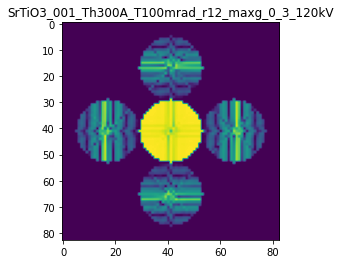

X_sim.max(): 0.9958611476135929
>>>replaced the 94. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 914ms/step - loss: 8.9287e-04 - mean_absolute_error: 0.0190 - acc: 0.9700 - val_loss: 3.5773e-04 - val_mean_absolute_error: 0.0130 - val_acc: 1.0000
Epoch 2/5
5/5 [==============================] - 3s 566ms/step - loss: 8.6886e-04 - mean_absolute_error: 0.0180 - acc: 0.9700 - val_loss: 5.9932e-04 - val_mean_absolute_error: 0.0155 - val_acc: 1.0000
Epoch 3/5
5/5 [==============================] - 3s 554ms/step - loss: 8.7834e-04 - mean_absolute_error: 0.0181 - acc: 0.9700 - val_loss: 4.4611e-04 - val_mean_absolute_error: 0.0148 - val_acc: 1.0000
Epoch 4/5
5/5 [==============================] - 4s 801ms/step - loss: 8.8839e-04 - mean_absolute_error: 0.0188 - acc: 0.9700 - val_loss: 3.2034e-04 - val_mean_absolute_error: 0.0127 - val_acc: 1.0000
Epoch 5/5
5/5 [==============================] - 3s 542ms/step - loss: 8.9149e-04 - mean_absolute_error: 0.0186 - acc: 0.970

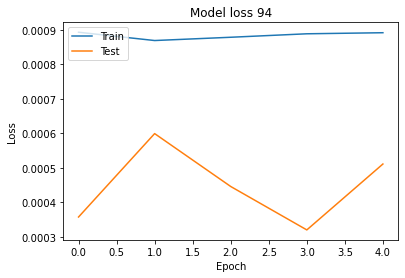

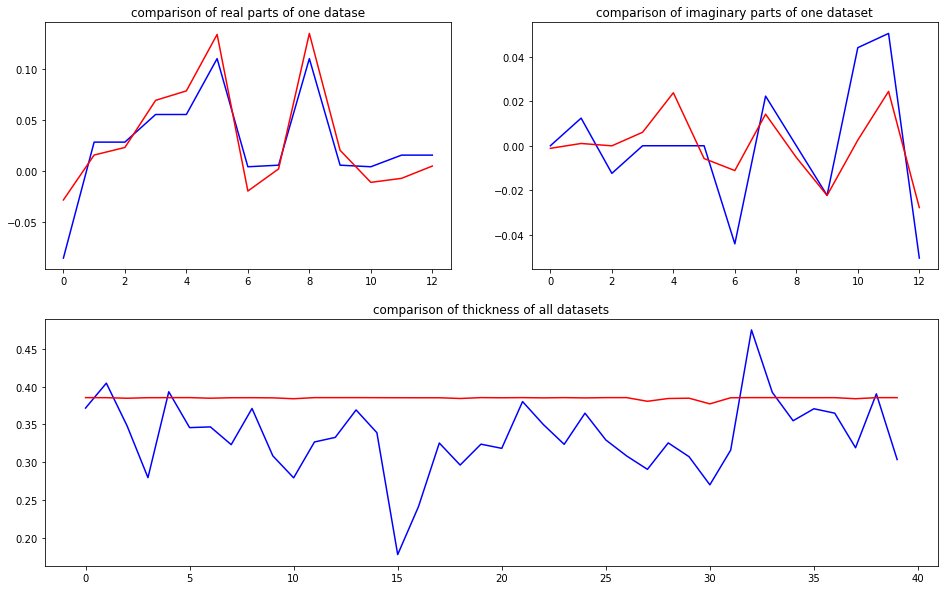

predicted thickness: 0.34045345


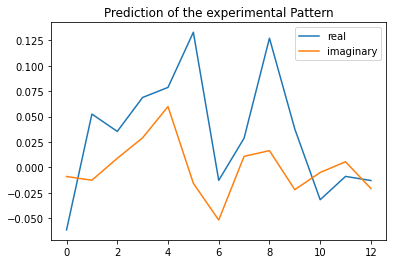

The offset applied on thickness: -0.00029673448851636765

The offset applied on Ug: 1.5409258531429448

Applied shift of unit cell origin (fractional coordinates): 0.03581119510141094 -0.007155654490629409
Ug[ 0 ]: 0.05557 3.14159  =>  0.05557 3.14159
Ug[ 1 ]: 0.04816 -0.19398  =>  0.04816 -0.23894
Ug[ 2 ]: 0.04816 0.19398  =>  0.04816 0.23894
Ug[ 3 ]: 0.08788 -0.22501  =>  0.08788 0.0
Ug[ 4 ]: 0.08788 0.22501  =>  0.08788 -0.0
Ug[ 5 ]: 0.15729 -0.08992  =>  0.15729 -0.0
Ug[ 6 ]: 0.02925 -2.2903  =>  0.02925 -2.02033
Ug[ 7 ]: 0.03874 0.41284  =>  0.03874 0.2328
Ug[ 8 ]: 0.15729 0.08992  =>  0.15729 0.0
Ug[ 9 ]: 0.03874 -0.41284  =>  0.03874 -0.2328
Ug[ 10 ]: 0.02925 2.2903  =>  0.02925 2.02033
Ug[ 11 ]: 0.01644 2.24963  =>  0.01644 1.79962
Ug[ 12 ]: 0.01644 -2.24963  =>  0.01644 -1.79962
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTi

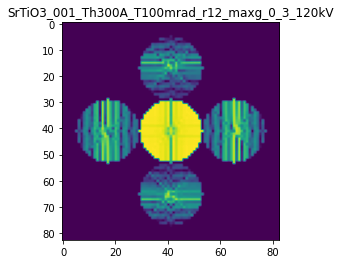

X_sim.max(): 0.982927453651254
>>>replaced the 95. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 926ms/step - loss: 9.1510e-04 - mean_absolute_error: 0.0186 - acc: 0.9700 - val_loss: 5.2510e-04 - val_mean_absolute_error: 0.0151 - val_acc: 1.0000
Epoch 2/5
5/5 [==============================] - 2s 529ms/step - loss: 0.0010 - mean_absolute_error: 0.0204 - acc: 0.9700 - val_loss: 4.4607e-04 - val_mean_absolute_error: 0.0157 - val_acc: 1.0000
Epoch 3/5
5/5 [==============================] - 3s 540ms/step - loss: 9.3781e-04 - mean_absolute_error: 0.0200 - acc: 0.9700 - val_loss: 5.8732e-04 - val_mean_absolute_error: 0.0166 - val_acc: 1.0000
Epoch 4/5
5/5 [==============================] - 3s 690ms/step - loss: 8.9640e-04 - mean_absolute_error: 0.0190 - acc: 0.9700 - val_loss: 3.4305e-04 - val_mean_absolute_error: 0.0130 - val_acc: 1.0000
Epoch 5/5
5/5 [==============================] - 3s 540ms/step - loss: 9.0250e-04 - mean_absolute_error: 0.0187 - acc: 0.9700 - v

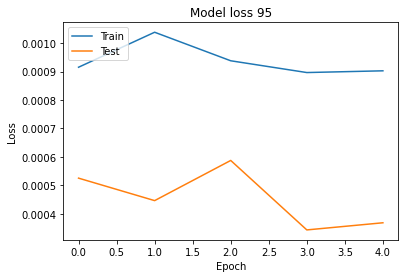

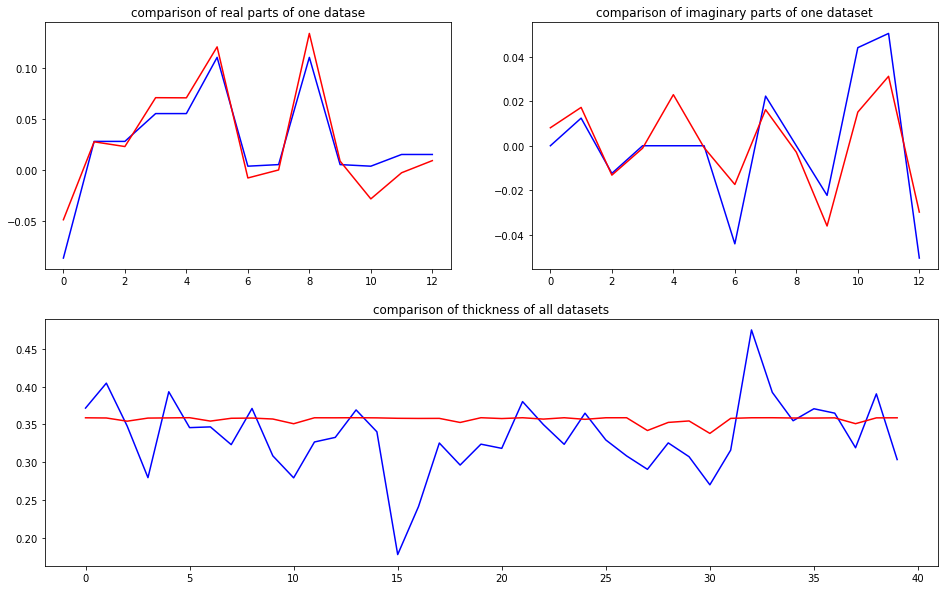

predicted thickness: 0.30083197


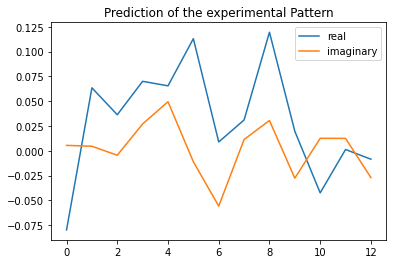

The offset applied on thickness: 0.0005384746332520094

The offset applied on Ug: 0.4954844905579189

Applied shift of unit cell origin (fractional coordinates): 0.025539614472572414 -0.0137226374038296
Ug[ 0 ]: 0.07656 3.14159  =>  0.07656 3.14159
Ug[ 1 ]: 0.05151 0.10196  =>  0.05151 0.01573
Ug[ 2 ]: 0.05151 -0.10196  =>  0.05151 -0.01573
Ug[ 3 ]: 0.07174 -0.16047  =>  0.07174 0.0
Ug[ 4 ]: 0.07174 0.16047  =>  0.07174 -0.0
Ug[ 5 ]: 0.12506 -0.17244  =>  0.12506 0.0
Ug[ 6 ]: 0.03719 -1.99983  =>  0.03719 -1.75314
Ug[ 7 ]: 0.03244 0.64361  =>  0.03244 0.56937
Ug[ 8 ]: 0.12506 0.17244  =>  0.12506 -0.0
Ug[ 9 ]: 0.03244 -0.64361  =>  0.03244 -0.56937
Ug[ 10 ]: 0.03719 1.99983  =>  0.03719 1.75314
Ug[ 11 ]: 0.01991 1.73974  =>  0.01991 1.41879
Ug[ 12 ]: 0.01991 -1.73974  =>  0.01991 -1.41879
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrT

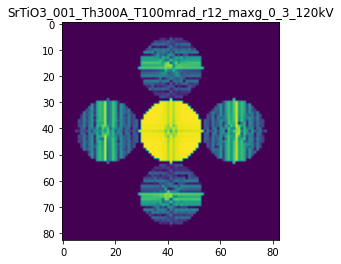

X_sim.max(): 0.983024831831508
>>>replaced the 96. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 833ms/step - loss: 8.7753e-04 - mean_absolute_error: 0.0184 - acc: 0.9800 - val_loss: 5.9851e-04 - val_mean_absolute_error: 0.0160 - val_acc: 1.0000
Epoch 2/5
5/5 [==============================] - 3s 538ms/step - loss: 8.8785e-04 - mean_absolute_error: 0.0185 - acc: 0.9700 - val_loss: 4.5145e-04 - val_mean_absolute_error: 0.0156 - val_acc: 1.0000
Epoch 3/5
5/5 [==============================] - 3s 574ms/step - loss: 8.4513e-04 - mean_absolute_error: 0.0180 - acc: 0.9800 - val_loss: 4.6071e-04 - val_mean_absolute_error: 0.0138 - val_acc: 1.0000
Epoch 4/5
5/5 [==============================] - 3s 748ms/step - loss: 8.6630e-04 - mean_absolute_error: 0.0173 - acc: 0.9700 - val_loss: 4.8069e-04 - val_mean_absolute_error: 0.0156 - val_acc: 1.0000
Epoch 5/5
5/5 [==============================] - 3s 537ms/step - loss: 8.7510e-04 - mean_absolute_error: 0.0186 - acc: 0.9700

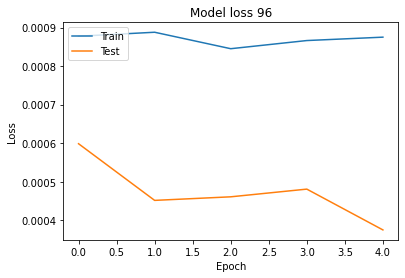

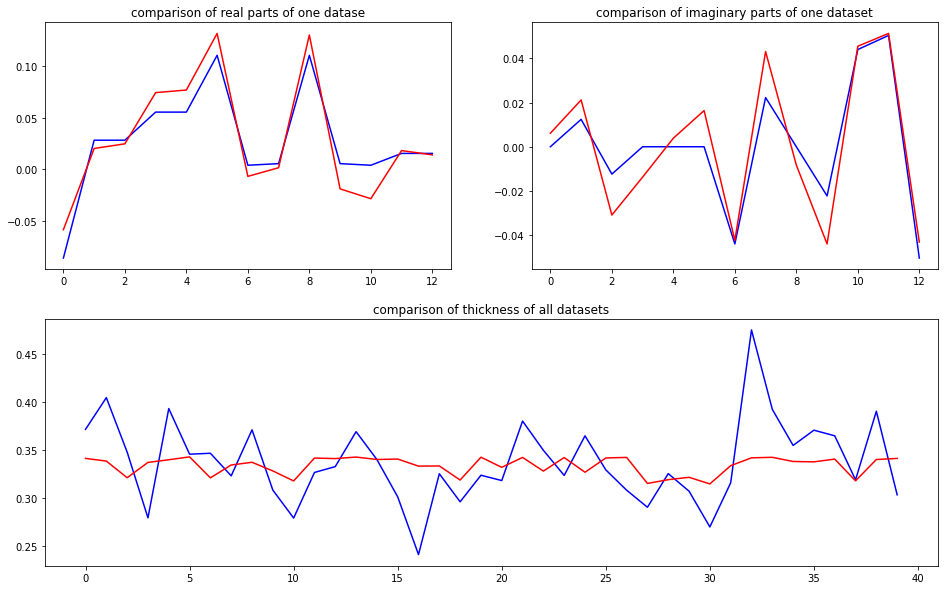

predicted thickness: 0.28476194


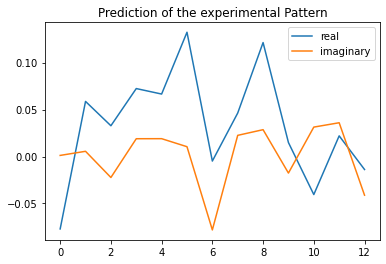

The offset applied on thickness: -0.0009463524587600549

The offset applied on Ug: 0.45741061957434626

Applied shift of unit cell origin (fractional coordinates): -0.0003877993197926305 -0.005020116467406116
Ug[ 0 ]: 0.07438 3.14159  =>  0.07438 3.14159
Ug[ 1 ]: 0.04903 0.29832  =>  0.04903 0.26678
Ug[ 2 ]: 0.04903 -0.29832  =>  0.04903 -0.26678
Ug[ 3 ]: 0.07179 0.00244  =>  0.07179 0.0
Ug[ 4 ]: 0.07179 -0.00244  =>  0.07179 0.0
Ug[ 5 ]: 0.13465 -0.06308  =>  0.13465 0.0
Ug[ 6 ]: 0.05774 -1.93693  =>  0.05774 -1.90782
Ug[ 7 ]: 0.03746 0.58191  =>  0.03746 0.61589
Ug[ 8 ]: 0.13465 0.06308  =>  0.13465 -0.0
Ug[ 9 ]: 0.03746 -0.58191  =>  0.03746 -0.61589
Ug[ 10 ]: 0.05774 1.93693  =>  0.05774 1.90782
Ug[ 11 ]: 0.03886 1.444  =>  0.03886 1.44887
Ug[ 12 ]: 0.03886 -1.444  =>  0.03886 -1.44887
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

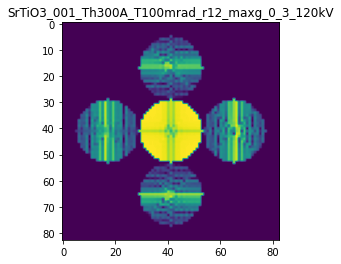

X_sim.max(): 0.9799197172851324
>>>replaced the 97. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 836ms/step - loss: 8.4017e-04 - mean_absolute_error: 0.0181 - acc: 0.9700 - val_loss: 5.8351e-04 - val_mean_absolute_error: 0.0169 - val_acc: 1.0000
Epoch 2/5
5/5 [==============================] - 2s 531ms/step - loss: 8.4905e-04 - mean_absolute_error: 0.0180 - acc: 0.9700 - val_loss: 3.4461e-04 - val_mean_absolute_error: 0.0130 - val_acc: 1.0000
Epoch 3/5
5/5 [==============================] - 3s 563ms/step - loss: 8.2421e-04 - mean_absolute_error: 0.0180 - acc: 0.9700 - val_loss: 4.4166e-04 - val_mean_absolute_error: 0.0156 - val_acc: 1.0000
Epoch 4/5
5/5 [==============================] - 3s 770ms/step - loss: 8.0896e-04 - mean_absolute_error: 0.0173 - acc: 0.9700 - val_loss: 4.9747e-04 - val_mean_absolute_error: 0.0148 - val_acc: 1.0000
Epoch 5/5
5/5 [==============================] - 2s 537ms/step - loss: 7.9687e-04 - mean_absolute_error: 0.0171 - acc: 0.970

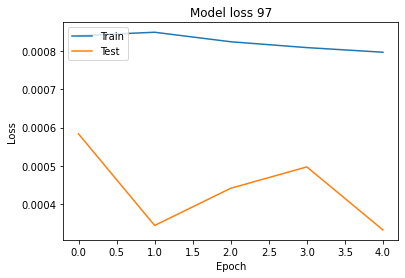

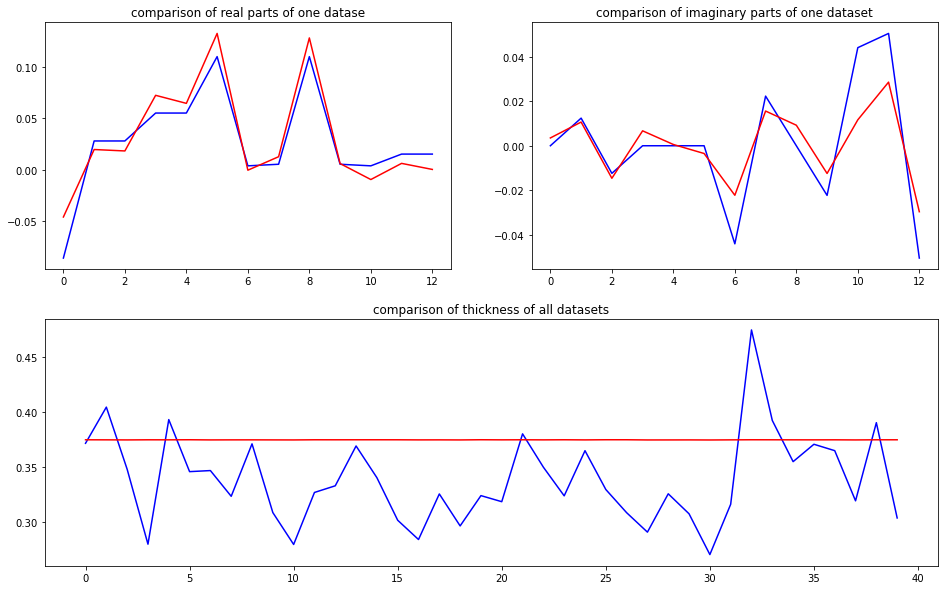

predicted thickness: 0.3256319


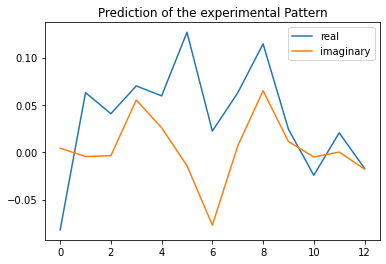

The offset applied on thickness: -0.000331433675939943

The offset applied on Ug: 0.6717320046700119

Applied shift of unit cell origin (fractional coordinates): -0.03646344951136496 -0.02339463552038121
Ug[ 0 ]: 0.07748 3.14159  =>  0.07748 3.14159
Ug[ 1 ]: 0.05379 0.00706  =>  0.05379 -0.13993
Ug[ 2 ]: 0.05379 -0.00706  =>  0.05379 0.13993
Ug[ 3 ]: 0.07077 0.22911  =>  0.07077 0.0
Ug[ 4 ]: 0.07077 -0.22911  =>  0.07077 0.0
Ug[ 5 ]: 0.13785 -0.29399  =>  0.13785 -0.0
Ug[ 6 ]: 0.03404 -1.52958  =>  0.03404 -1.61169
Ug[ 7 ]: 0.04511 -0.02561  =>  0.04511 0.35049
Ug[ 8 ]: 0.13785 0.29399  =>  0.13785 0.0
Ug[ 9 ]: 0.04511 0.02561  =>  0.04511 -0.35049
Ug[ 10 ]: 0.03404 1.52958  =>  0.03404 1.61169
Ug[ 11 ]: 0.00921 1.33273  =>  0.00921 1.79094
Ug[ 12 ]: 0.00921 -1.33273  =>  0.00921 -1.79094
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrT

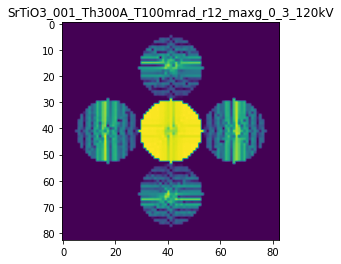

X_sim.max(): 0.9885158967191562
>>>replaced the 98. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 921ms/step - loss: 7.6067e-04 - mean_absolute_error: 0.0166 - acc: 0.9700 - val_loss: 4.0312e-04 - val_mean_absolute_error: 0.0141 - val_acc: 1.0000
Epoch 2/5
5/5 [==============================] - 3s 542ms/step - loss: 7.5109e-04 - mean_absolute_error: 0.0163 - acc: 0.9700 - val_loss: 3.9793e-04 - val_mean_absolute_error: 0.0141 - val_acc: 1.0000
Epoch 3/5
5/5 [==============================] - 3s 557ms/step - loss: 7.4409e-04 - mean_absolute_error: 0.0165 - acc: 0.9700 - val_loss: 3.3919e-04 - val_mean_absolute_error: 0.0130 - val_acc: 1.0000
Epoch 4/5
5/5 [==============================] - 3s 769ms/step - loss: 7.6723e-04 - mean_absolute_error: 0.0170 - acc: 0.9700 - val_loss: 3.6526e-04 - val_mean_absolute_error: 0.0134 - val_acc: 1.0000
Epoch 5/5
5/5 [==============================] - 3s 608ms/step - loss: 7.6955e-04 - mean_absolute_error: 0.0167 - acc: 0.970

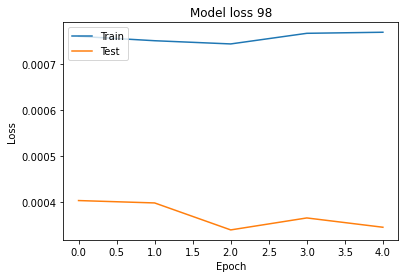

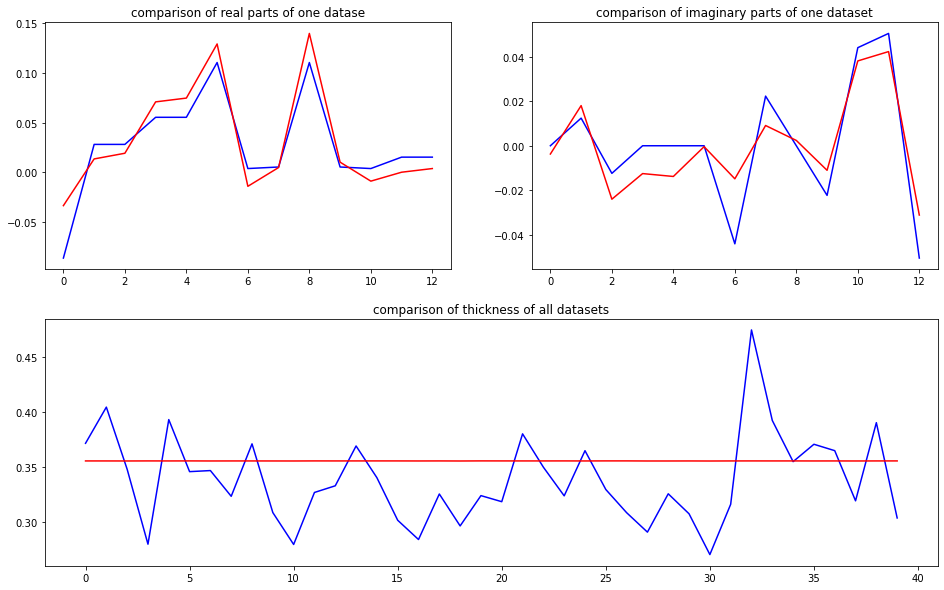

predicted thickness: 0.32686165


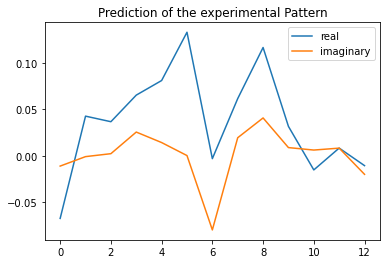

The offset applied on thickness: 0.00010657381575672043

The offset applied on Ug: -0.07209691395124136

Applied shift of unit cell origin (fractional coordinates): -0.012483065754971262 -0.012980211432037148
Ug[ 0 ]: 0.06766 3.14159  =>  0.06766 3.14159
Ug[ 1 ]: 0.0395 -0.04049  =>  0.0395 -0.12205
Ug[ 2 ]: 0.0395 0.04049  =>  0.0395 0.12205
Ug[ 3 ]: 0.07281 0.07843  =>  0.07281 -0.0
Ug[ 4 ]: 0.07281 -0.07843  =>  0.07281 0.0
Ug[ 5 ]: 0.12501 -0.16311  =>  0.12501 0.0
Ug[ 6 ]: 0.04414 -1.78538  =>  0.04414 -1.78226
Ug[ 7 ]: 0.04659 0.11162  =>  0.04659 0.27161
Ug[ 8 ]: 0.12501 0.16311  =>  0.12501 -0.0
Ug[ 9 ]: 0.04659 -0.11162  =>  0.04659 -0.27161
Ug[ 10 ]: 0.04414 1.78538  =>  0.04414 1.78226
Ug[ 11 ]: 0.01415 1.65592  =>  0.01415 1.81279
Ug[ 12 ]: 0.01415 -1.65592  =>  0.01415 -1.81279
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//S

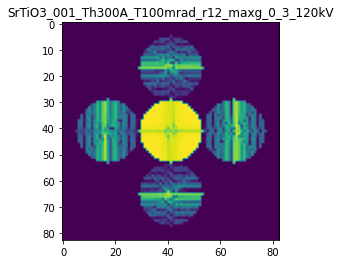

X_sim.max(): 0.9882954587073252
>>>replaced the 99. dataset and train: 
Epoch 1/5
5/5 [==============================] - 6s 843ms/step - loss: 7.4976e-04 - mean_absolute_error: 0.0165 - acc: 0.9700 - val_loss: 4.8205e-04 - val_mean_absolute_error: 0.0153 - val_acc: 1.0000
Epoch 2/5
5/5 [==============================] - 3s 540ms/step - loss: 7.6353e-04 - mean_absolute_error: 0.0169 - acc: 0.9700 - val_loss: 2.8738e-04 - val_mean_absolute_error: 0.0122 - val_acc: 1.0000
Epoch 3/5
5/5 [==============================] - 3s 551ms/step - loss: 8.1225e-04 - mean_absolute_error: 0.0176 - acc: 0.9800 - val_loss: 4.9314e-04 - val_mean_absolute_error: 0.0161 - val_acc: 1.0000
Epoch 4/5
5/5 [==============================] - 3s 770ms/step - loss: 7.4999e-04 - mean_absolute_error: 0.0162 - acc: 0.9700 - val_loss: 3.3395e-04 - val_mean_absolute_error: 0.0128 - val_acc: 1.0000
Epoch 5/5
5/5 [==============================] - 3s 563ms/step - loss: 7.3015e-04 - mean_absolute_error: 0.0162 - acc: 0.970

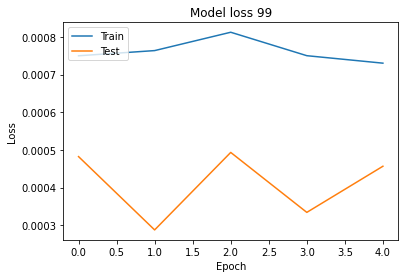

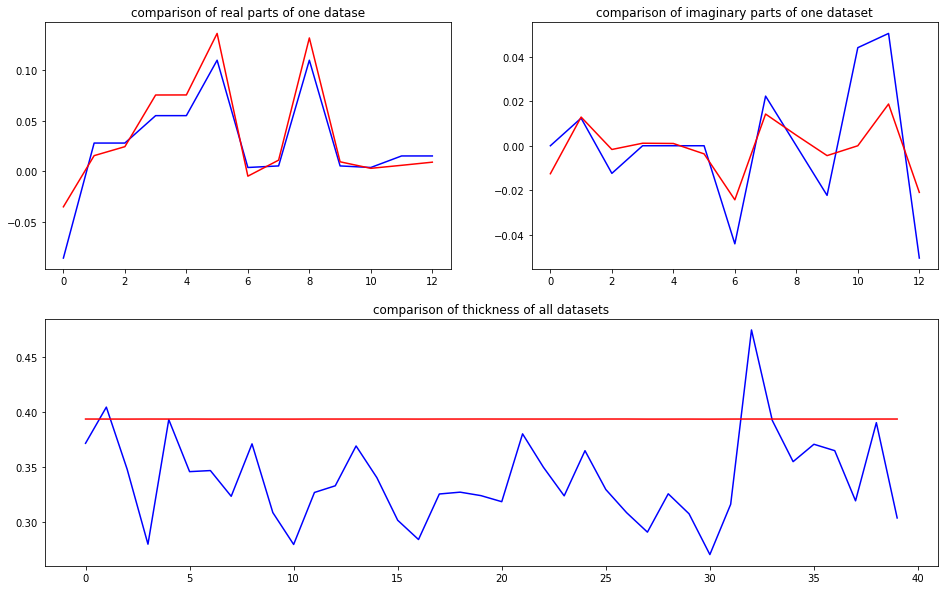

predicted thickness: 0.3597889


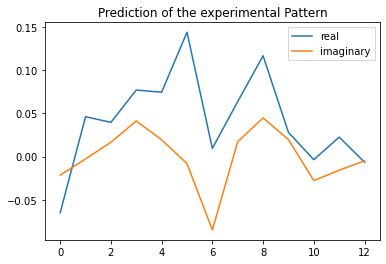

The offset applied on thickness: 2.0119965095498406e-05

The offset applied on Ug: 0.35745262526165494

Applied shift of unit cell origin (fractional coordinates): -0.02268248917046723 -0.014585776557957791
Ug[ 0 ]: 0.06337 3.14159  =>  0.06337 3.14159
Ug[ 1 ]: 0.04476 -0.21704  =>  0.04476 -0.30869
Ug[ 2 ]: 0.04476 0.21704  =>  0.04476 0.30869
Ug[ 3 ]: 0.07914 0.14252  =>  0.07914 0.0
Ug[ 4 ]: 0.07914 -0.14252  =>  0.07914 0.0
Ug[ 5 ]: 0.13936 -0.18329  =>  0.13936 0.0
Ug[ 6 ]: 0.02775 -1.40936  =>  0.02775 -1.46023
Ug[ 7 ]: 0.04696 -0.01395  =>  0.04696 0.22021
Ug[ 8 ]: 0.13936 0.18329  =>  0.13936 -0.0
Ug[ 9 ]: 0.04696 0.01395  =>  0.04696 -0.22021
Ug[ 10 ]: 0.02775 1.40936  =>  0.02775 1.46023
Ug[ 11 ]: 0.00979 -0.5709  =>  0.00979 -0.28586
Ug[ 12 ]: 0.00979 0.5709  =>  0.00979 0.28586
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

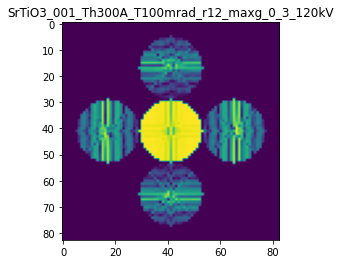

X_sim.max(): 0.9877399972403469
>>>replaced the 100. dataset and train: 
Epoch 1/5
5/5 [==============================] - 7s 879ms/step - loss: 7.5493e-04 - mean_absolute_error: 0.0170 - acc: 0.9800 - val_loss: 2.9244e-04 - val_mean_absolute_error: 0.0126 - val_acc: 1.0000
Epoch 2/5
5/5 [==============================] - 3s 656ms/step - loss: 7.6457e-04 - mean_absolute_error: 0.0171 - acc: 0.9800 - val_loss: 5.8971e-04 - val_mean_absolute_error: 0.0170 - val_acc: 1.0000
Epoch 3/5
5/5 [==============================] - 3s 553ms/step - loss: 7.6814e-04 - mean_absolute_error: 0.0175 - acc: 0.9800 - val_loss: 2.9119e-04 - val_mean_absolute_error: 0.0126 - val_acc: 1.0000
Epoch 4/5
5/5 [==============================] - 3s 758ms/step - loss: 7.5326e-04 - mean_absolute_error: 0.0169 - acc: 0.9800 - val_loss: 5.2819e-04 - val_mean_absolute_error: 0.0163 - val_acc: 1.0000
Epoch 5/5
5/5 [==============================] - 2s 534ms/step - loss: 7.8269e-04 - mean_absolute_error: 0.0176 - acc: 0.98

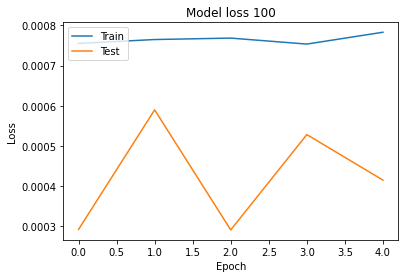

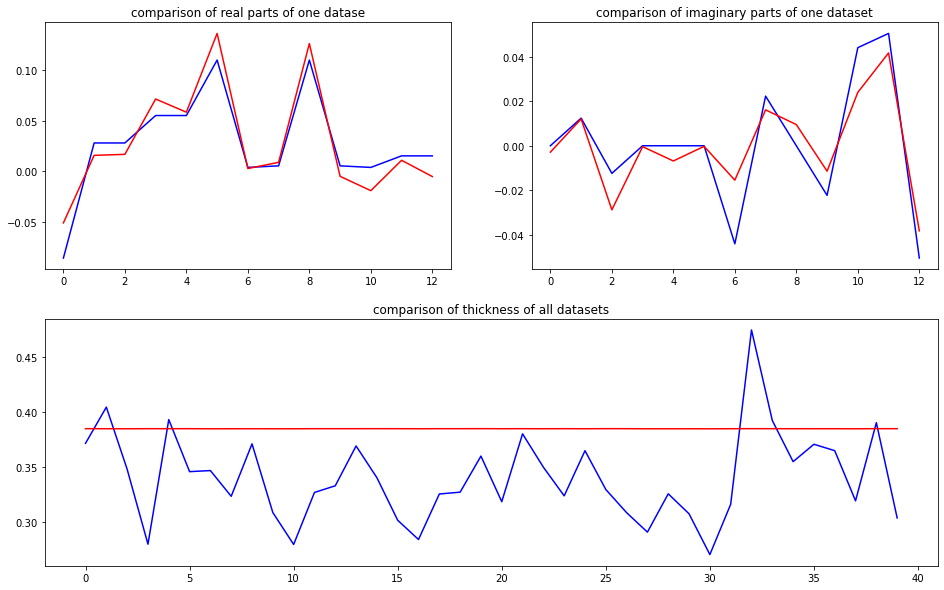

predicted thickness: 0.35090795


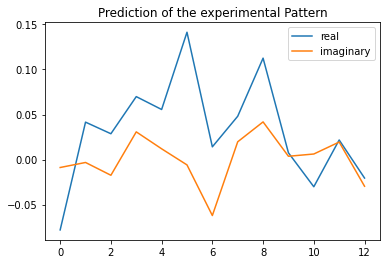

The offset applied on thickness: -0.00018502502987778645

The offset applied on Ug: -0.7207482368653574

Applied shift of unit cell origin (fractional coordinates): -0.022811146171543454 -0.017289446292216886
Ug[ 0 ]: 0.0825 3.14159  =>  0.0825 3.14159
Ug[ 1 ]: 0.03476 0.1997  =>  0.03476 0.09107
Ug[ 2 ]: 0.03476 -0.1997  =>  0.03476 -0.09107
Ug[ 3 ]: 0.06007 0.14333  =>  0.06007 0.0
Ug[ 4 ]: 0.06007 -0.14333  =>  0.06007 -0.0
Ug[ 5 ]: 0.11727 -0.21727  =>  0.11727 0.0
Ug[ 6 ]: 0.03655 -1.84245  =>  0.03655 -1.87714
Ug[ 7 ]: 0.02773 0.26089  =>  0.02773 0.51285
Ug[ 8 ]: 0.11727 0.21727  =>  0.11727 0.0
Ug[ 9 ]: 0.02773 -0.26089  =>  0.02773 -0.51285
Ug[ 10 ]: 0.03655 1.84245  =>  0.03655 1.87714
Ug[ 11 ]: 0.02469 1.57703  =>  0.02469 1.86368
Ug[ 12 ]: 0.02469 -1.57703  =>  0.02469 -1.86368
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

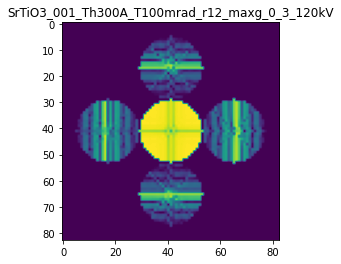

X_sim.max(): 0.9948476706403575
Time:  2891.944302931


In [25]:
Ug_t_exp_pred_matrix = [] #matrix to save the predicted {Ug,t} of the experimental pattern
Ug_exp_pred_matrix = [] #matrix to save the predicted Ug of the experimental pattern
t_exp_pred_matrix = [] #matrix to save the predicted t of the experimental pattern
simulation_pattern = [] #matrix to save the simulation pattern produced by predicted {Ug,t}
scale = 5 # scale of random offset 

DoDiverse = True

start = timeit.default_timer()
for i in range(0,trainsize+1):
    
    if i == 0:
        print('>>>train the initial training set:')
        Epochs = 20
        
    else:
        print('>>>replaced the {0:d}. dataset and train: '.format(i))
        Epochs = 5
    
    # load and compile the model
    model = load_model(name+'.h5')

    # invert the 1 channel image Array to 3 Channel, to use ResNet50
    X_train_3C = np.concatenate((X_train,X_train,X_train),axis=3) #same value for every channel
    X_test_3C = np.concatenate((X_test,X_test,X_test),axis=3)
    

    # train the model
    model.fit(X_train_3C, Y_train, validation_data=(X_test_3C, Y_test), batch_size=20, epochs=Epochs)
        
    # save the trained weigths of the model, delete the existing model
    model.save(name + ".h5")


    # plot the model loss
    plt.plot(model.history.history['loss'])
    plt.plot(model.history.history['val_loss'])
    plt.title('Model loss {0:d}'.format(i))
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    #plt.savefig(trainingFolder  + 'My_Model_ZnO' + '/' + 'My_Model_Loss' + '/' + 'Model_Loss{0:d}.png'.format(i))
    plt.show()
    plt.close()
    

    # Prediction of the testing set
    Y_test_pred = model.predict(X_test_3C)    
    Ug_test_pred_complex = Y_test_pred[:,:2*numUg].reshape(-1,numUg,2)
    Ug_test_complex = Y_test[:,:2*numUg].reshape(-1,numUg,2)    
    t_test_pred = Y_test_pred[:,2*numUg]
    t_test = Y_test[:,2*numUg]
    
    # plot the comparison of imaginary parts, real parts and thickness
    gs = gridspec.GridSpec(2, 2)
    fig = plt.figure(figsize=(16,10))
    
    ax1 = fig.add_subplot(gs[0, 0]) 
    ax1.plot(Ug_test_complex[2,:,0],'b')
    ax1.plot(Ug_test_pred_complex[2,:,0],'r')
    ax1.set_title('comparison of real parts of one datase')
    
    ax2 = fig.add_subplot(gs[0, 1]) 
    ax2.plot(Ug_test_complex[2,:,1],'b')
    ax2.plot(Ug_test_pred_complex[2,:,1],'r')
    ax2.set_title('comparison of imaginary parts of one dataset')
    
    ax3 = fig.add_subplot(gs[1, :])
    ax3.plot(t_test[:],'b')
    ax3.plot(t_test_pred[:],'r')
    ax3.set_title('comparison of thickness of all datasets')
    plt.show()
    plt.close()
    
    
    # Prediction of the experimental Pattern
    X_exp_3C = np.concatenate((nlogf_X_exp,nlogf_X_exp,nlogf_X_exp),axis=3)
    Y_exp_pred = model.predict(X_exp_3C)
    
    Ug_t_exp_pred = Y_exp_pred[0,:] 
    Ug_exp_pred = Ug_t_exp_pred[0:2*numUg] 
    t_exp_pred = Ug_t_exp_pred[-1] 
    
    Ug_t_exp_pred_matrix.append(Ug_t_exp_pred)
    Ug_exp_pred_matrix.append(Ug_exp_pred)
    t_exp_pred_matrix.append(t_exp_pred)
    print("predicted thickness:", t_exp_pred)
 
    
    # plot the results
    plt.plot(Ug_exp_pred[0:2*numUg:2],label='real')
    plt.plot(Ug_exp_pred[1:2*numUg:2],label='imaginary')
    plt.legend()
    plt.title('Prediction of the experimental Pattern')
    plt.show()
    plt.close()
    
    # diverse the predicted Ug and thickness
    if DoDiverse == True:
        # scale will be reduced by iterations
        scale *= 0.99
        Ug_t_diverse = diverse_Ug_t(Ug_t_exp_pred, scale_Ug=scale)
        Ug_t_exp_pred = Ug_t_diverse
                        

    # normalization --> normalized complex Ug
    Ug_pred = np.array(range( np.int((Ug_t_exp_pred.size - 1)/2) ), dtype=complex)
    Ug_pred.real = Ug_t_exp_pred[0:-1:2]
    Ug_pred.imag = Ug_t_exp_pred[1:-1:2]
    Ug_pred_normalized = nf.normalization(file=File, origin_Ug=Ug_pred)
    Ug_pred_normalized = np.asarray(Ug_pred_normalized)
    
    # Make unique Ug
    if makeUniqueUgVector == True:
        UgUnique, r0 = mu.makeUniqueUgVector(Ug_pred_normalized,beam1,beam2,file = File)
        Ug_pred_normalized = UgUnique
    

    # reshape
    Ug_pred_normalized_2real = np.concatenate((np.array(Ug_pred_normalized.real,ndmin=2).T, np.array(Ug_pred_normalized.imag,ndmin=2).T),axis=1)  
    Ug_pred_normalized_2real = np.asarray(Ug_pred_normalized_2real)
    Ug_t_pred_normalized_2real = np.append(Ug_pred_normalized_2real.reshape(numUg*2), Ug_t_exp_pred[-1])
    #Ug_t_pred_normalized_2real = np.append(Ug_pred_normalized_2real.reshape(numUg*2), thickness)
        
    
    # Compute the LARBED pattern: X_sim, from the predicted {Ug,t}: Y_exp_pred
    file = File+".qed"
    X_sim = pf.pyQEDA(filename=file, UseInputUgMasterList=True, InputUg=Ug_t_pred_normalized_2real, InputUgdoFlip=False)
    X_sim = X_sim.reshape(Nx,Nx,1)
    #nlogf_X_sim = nlogf(X_sim)
    
    simulation_pattern.append(X_sim)
    print("X_sim.max():",X_sim.max())
        
    
    # replace the training set & testing set with new training set
    if i < trainsize:
        #X_train[i] = nlogf_X_sim               
        X_train[i] = X_sim               
        Y_train[i] = Ug_t_pred_normalized_2real
        
        X_test[i%testsize] = X_sim
        Y_test[i%testsize] = Ug_t_pred_normalized_2real
        #else:
        #    X_test = X_train[i+1-testsize:i+1]
        #    Y_test = Y_train[i+1-testsize:i+1]

stop = timeit.default_timer()
print('Time: ', stop - start)

-------------------------------------------------------------------------------------------------------------------

# V. Compare the Prediction with the true value

1. diffraction pattern:

In [26]:
simulation_pattern = np.asarray(simulation_pattern)
print('the shape of the simulated pattern', simulation_pattern.shape)
print('the shape of the experimental pattern', X_exp.shape)

the shape of the simulated pattern (101, 83, 83, 1)
the shape of the experimental pattern (1, 83, 83, 1)


Text(0.5, 1.0, 'experimental Pattern')

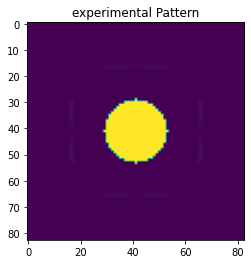

In [27]:
# plot the experimental Pattern:
plt.imshow(nlogf_X_exp[0])
plt.title('experimental Pattern')

Text(0.5, 1.0, 'simulation pattern')

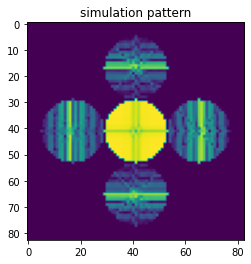

In [28]:
# plot the final simulated Pattern:
plt.imshow(nlogf(simulation_pattern[-1]))
plt.title("simulation pattern")

2. thickness:

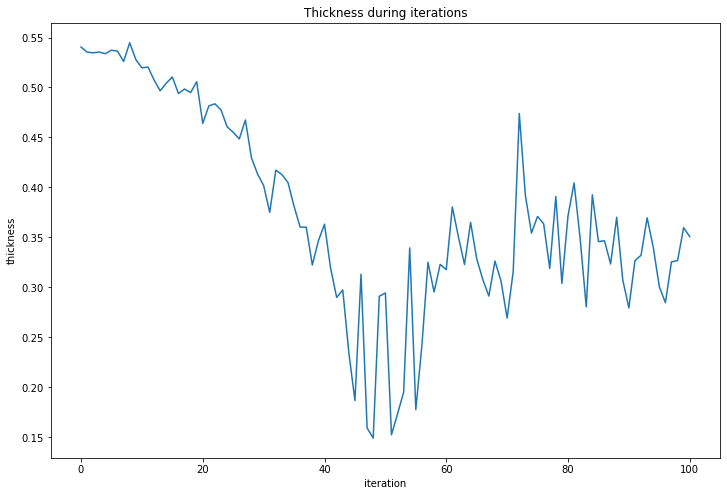

In [30]:
# plot the prediction of thickness during iterations:
plt.figure(figsize=(12,8))
plt.plot(t_exp_pred_matrix)
plt.title("Thickness during iterations")
plt.ylabel("thickness")
plt.xlabel("iteration")
plt.savefig("/Users/chenjie/Desktop/master_thesis_data/"+save_name+"/CNN_thickness.jpg")
plt.savefig("/Users/chenjie/Desktop/master_thesis_data/"+save_name+"/CNN_thickness.png")

3. R-factors:

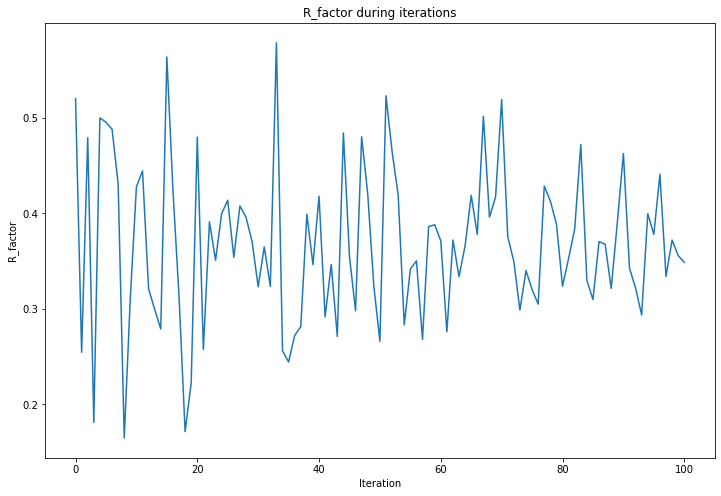

In [31]:
# plot the R-factors during iterations
exp_Intensity = X_exp.reshape(-1)
sim_Intensities = []
R_factors = []
for i in range(len(simulation_pattern)):
    sim_Intensity = simulation_pattern[i].reshape(-1)
    R = np.sum(np.abs(sim_Intensity - exp_Intensity))/np.sum(exp_Intensity)
    R_factors = np.append(R_factors, R)

plt.figure(figsize=(12,8))
plt.plot(R_factors[:])
plt.title('R_factor during iterations')
plt.ylabel('R_factor')
plt.xlabel('Iteration')
plt.savefig("/Users/chenjie/Desktop/master_thesis_data/"+save_name+"/CNN_R_iteration.jpg")
plt.savefig("/Users/chenjie/Desktop/master_thesis_data/"+save_name+"/CNN_R_iteration.png")

R_min: 0.1648299701720689


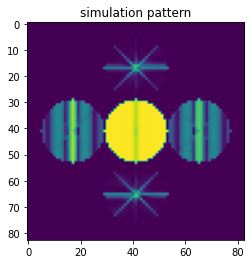

In [32]:
R_argmin = R_factors.argmin()
R_min = R_factors.min()
print("R_min:", R_min)
plt.imshow(nlogf(simulation_pattern[R_argmin].reshape(Nx,Nx,1)))
plt.title("simulation pattern")
plt.savefig("/Users/chenjie/Desktop/master_thesis_data/"+save_name+"/CNN_simulation.jpg")
plt.savefig("/Users/chenjie/Desktop/master_thesis_data/"+save_name+"/CNN_simulation.png")

In [33]:
t_exp_pred_matrix[R_argmin]

0.5448208

In [34]:
testUg = Y_train[R_argmin][:]
testUg

array([-4.78586853e-02,  0.00000000e+00, -2.39659093e-03,  2.00587447e-03,
       -2.39659093e-03, -2.00587447e-03,  5.94113369e-02,  3.46944695e-18,
        5.94113369e-02, -3.46944695e-18,  6.78397532e-02,  0.00000000e+00,
       -1.03595433e-02,  8.70313574e-03,  3.08088019e-03,  1.60675594e-02,
        6.78397532e-02,  0.00000000e+00,  3.08088019e-03, -1.60675594e-02,
       -1.03595433e-02, -8.70313574e-03,  1.31817307e-03,  2.07288828e-02,
        1.31817307e-03, -2.07288828e-02,  5.45433879e-01])

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T100mrad_r12_maxg_0_3_120kV/SrTiO3_001_Th300A_T100mrad_r12_maxg_0_3_120kV/SrTiO3_001_Th300A_T100mrad_r12_maxg_0_3_120kV.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.957
tilt range (mrads) = 		100.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=545.4338788986206
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg, zone = [0.0, 0.0, 1.0]



All patterns together contain 13 different beams

InputUg:
[-0.04785869+0.00000000e+00j -0.00239659+2.00587447e-03j
 -0.00239659-2.00587447e-

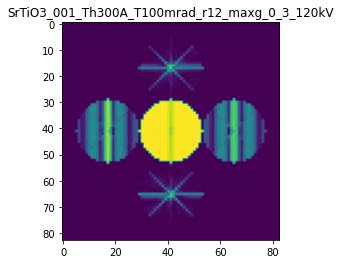

In [35]:
test_sim = pf.pyQEDA(filename=file, UseInputUgMasterList=True, InputUg=testUg, InputUgdoFlip=False)

In [36]:
filepath = "/Users/chenjie/pyQEDA/pyQEDA_simulations/" + File + "/" + File + "_experimental_data" +'/'
beamfilename = '_BeamList.txt'
beamfile = filepath + beamfilename
beams = np.asarray(np.loadtxt(beamfile,skiprows=1, usecols= range(1, 4)  ), dtype=int )



InputUg into Potential = [-4.78586853e-02  0.00000000e+00 -2.39659093e-03  2.00587447e-03
 -2.39659093e-03 -2.00587447e-03  5.94113369e-02  3.46944695e-18
  5.94113369e-02 -3.46944695e-18  6.78397532e-02  0.00000000e+00
 -1.03595433e-02  8.70313574e-03  3.08088019e-03  1.60675594e-02
  6.78397532e-02  0.00000000e+00  3.08088019e-03 -1.60675594e-02
 -1.03595433e-02 -8.70313574e-03  1.31817307e-03  2.07288828e-02
  1.31817307e-03 -2.07288828e-02  5.45433879e-01]
(-0.04785868525505066+0j)
(-0.0023965909256115285+0.0020058744713901846j)
(-0.0023965909256115285-0.0020058744713901846j)
(0.05941133686250097+3.469446951953614e-18j)
(0.05941133686250097-3.469446951953614e-18j)
(0.06783975315907222+0j)
(-0.010359543317997488+0.00870313574173292j)
(0.003080880187562+0.016067559356862646j)
(0.06783975315907222+0j)
(0.003080880187562-0.016067559356862646j)
(-0.010359543317997488-0.00870313574173292j)
(0.0013181730716321366+0.020728882800579124j)
(0.0013181730716321366-0.020728882800579124j)


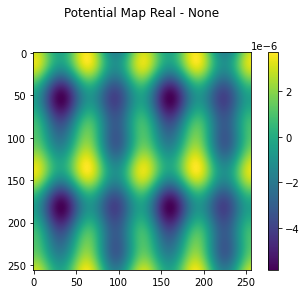

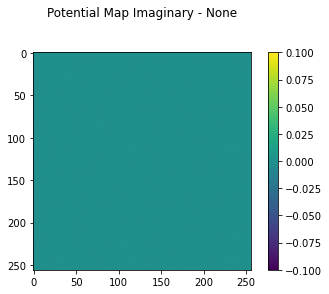

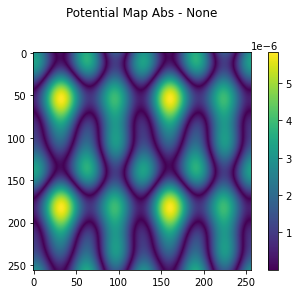

In [37]:
[UgList, potMapSim, InputBeams] = pqp.displayPotentialFromUg(folder=None,\
                                       potSize=([256,256]), \
                                       Ncells=([2,2]),     \
                                       showImag=True,      \
                                       doFlip=False,       \
                                       thresh = 0.1,     \
                                       beta = 0.9,\
                                       InputUg=testUg,\
                                       InputBeams = beams, \
                                       returnComplexUg=True,\
                                       scaling=1,\
                                       scaleImag=0)

R-factor:  0.1648299701720689


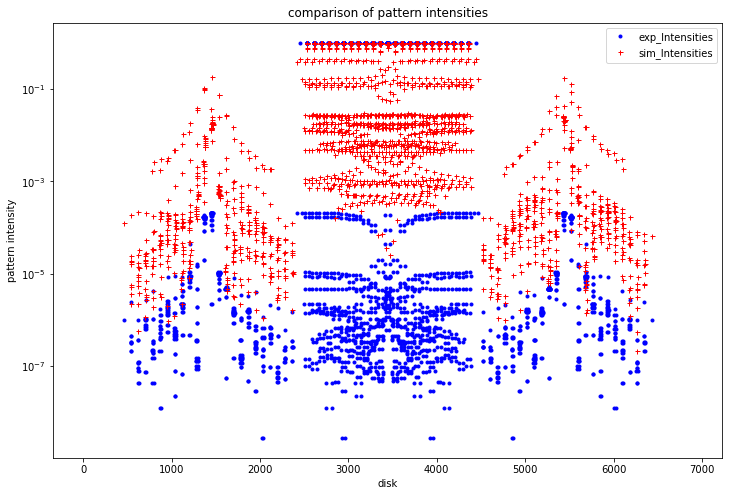

In [40]:
exp_Intensities = X_exp[0].reshape(Nx*Nx)
sim_Intensities = simulation_pattern[R_argmin].reshape(Nx*Nx)
R = np.sum(np.abs(sim_Intensities - exp_Intensities))/np.sum(exp_Intensities)
print("R-factor: ", R)    
plt.figure(figsize=(12,8))
plt.axes(yscale = "log")
plt.plot(exp_Intensities, "bo", markersize=3, label="exp_Intensities")
plt.plot(sim_Intensities, "r+", markersize=5, label="sim_Intensities")
plt.legend()
plt.xlabel("disk")
plt.ylabel("pattern intensity")
plt.title("comparison of pattern intensities")
plt.show()